# NEURAL NETWORKS AND DEEP LEARNING
---
### A.A. 2020/21 (6 CFU) - Dr. Alberto Testolin, Dr. Matteo Gadaleta
---

Segalini Beatrice, student ID 1234430

> M.Sc. PHYSICS OF DATA
>
> Department of Physics and Astronomy
 
-----


# Homework 3 - Deep Reinforcement Learning

In [2]:
# !pip install gym
# !pip install rich
# !pip install hiplot
# !apt update
# !apt-get install python-opengl -y
# !apt install xvfb -y
# !pip install pyvirtualdisplay
# !pip install piglet

In [3]:
# Basic libraries
import random
import torch
import numpy as np

# gym
import gym
from gym.wrappers import Monitor

# File management utlities 
import json
import sys
import glob
import io
import base64
import os

# Plotting
import matplotlib.pyplot as plt
%matplotlib inline
import hiplot as hip
import plotly.express as px
import cv2

# Display videos
from IPython.display import HTML
from IPython import display as ipythondisplay
# from pyvirtualdisplay import Display

# Nice prints
from tqdm.notebook import tqdm
from rich.jupyter import print

# Other stuff
from torch import nn
from collections import deque # this python module implements exactly what we need for the replay memory

#  Check if the GPU is available
device = torch.device("cuda") if (torch.cuda.is_available()) else torch.device("cpu")
print(device)

### Support functions

In [4]:
# reproducibility, use Student ID as seed
seed = 1234430

def rnd_seed(seed=1234430):
    torch.manual_seed(seed)    
    np.random.seed(seed)
    random.seed(seed)

def avg_window(values, window):
    weights = np.repeat(1.0, window)/window
    running_avg = np.convolve(values, weights, 'valid')
    return running_avg

## Utility functions for video rendering

In [5]:
# display = Display(visible=0, size=(1400, 900))
# display.start()

# # This code creates a virtual display to draw game images on. 
# # If you are running locally, just ignore it
# if type(os.environ.get("DISPLAY")) is not str or len(os.environ.get("DISPLAY"))==0:
#     !bash ../xvfb start
#     %env DISPLAY=:1

In [6]:
"""
Utility functions to enable video recording of gym environment and displaying it
To enable video, just do "env = wrap_env(env)""
"""

def show_videos():
    mp4list = glob.glob('video/*.mp4')
    mp4list.sort()
    for mp4 in mp4list:
        print(f"\nSHOWING VIDEO {mp4}")
        video = io.open(mp4, 'r+b').read()
        encoded = base64.b64encode(video)
        ipythondisplay.display(HTML(data='''<video alt="test" autoplay 
                    loop controls style="height: 400px;">
                    <source src="data:video/mp4;base64,{0}" type="video/mp4" />
                 </video>'''.format(encoded.decode('ascii'))))

In [7]:
def wrap_env(env, video_callable=None):
    env = Monitor(env, './video', force=True, video_callable=video_callable)
    return env

# Experience replay (Replay Memory)

In [8]:
class ReplayMemory(object):

    def __init__(self, capacity):
        # Define a queue with maxlen "capacity"
        self.memory = deque(maxlen=capacity)

    def push(self, state, action, next_state, reward):
        # Add the tuple (state, action, next_state, reward) to the queue
        self.memory.append( (state, action, next_state, reward) )

    def sample(self, batch_size):
        batch_size = min(batch_size, len(self)) # Get all the samples 
        # if the requested batch_size is higher than the number of sample currently in the memory
        # Randomly select "batch_size" samples and return the selection
        return random.sample(self.memory, batch_size)

    def __len__(self):
        return len(self.memory) # Return the number of samples currently stored in the memory

Test if it works as expected.

In [8]:
# Define the replay memory
replay_mem = ReplayMemory(capacity=3)

# Push some samples
print(f"CURRENT MEMORY SIZE: {len(replay_mem)}")
replay_mem.push(1,1,1,1)
print(f"CURRENT MEMORY SIZE: {len(replay_mem)}")
replay_mem.push(2,2,2,2)
print(f"CURRENT MEMORY SIZE: {len(replay_mem)}")
replay_mem.push(3,3,3,3)
print(f"CURRENT MEMORY SIZE: {len(replay_mem)}")
replay_mem.push(4,4,4,4)
print(f"CURRENT MEMORY SIZE: {len(replay_mem)}")
replay_mem.push(5,5,5,5)
print(f"CURRENT MEMORY SIZE: {len(replay_mem)}")

# Check the content of the memory
print('\nCONTENT OF THE MEMORY')
print(replay_mem.memory)

# Random sample
print('\nRANDOM SAMPLING')
for i in range(5):
  print(replay_mem.sample(2)) # Select 2 samples randomly from the memory

# Policy network

## Network definition

In [59]:
class DQN(nn.Module):

    def __init__(self, state_space_dim, action_space_dim):
        super().__init__()

        self.linear = nn.Sequential(
                nn.Linear(state_space_dim, 128),
                nn.Tanh(),
                nn.Linear(128, 128),
                nn.Tanh(),
                nn.Linear(128, action_space_dim)
                )

    def forward(self, x):
        return self.linear(x)

In [14]:
# Define an example network
net = DQN(state_space_dim=4, action_space_dim=2)
print(net)

## Exploration Policies

### Epsilon-greedy policy


With an epsilon-greedy policy we choose a **non optimal** action with probability epsilon, otherwise choose the best action (the one corresponding to the highest Q-value).

In [23]:
def choose_action_epsilon_greedy(net, state, epsilon):
    
    if epsilon > 1 or epsilon < 0:
        raise Exception('The epsilon value must be between 0 and 1')
                
    # Evaluate the network output from the current state
    with torch.no_grad():
        net.eval()
        state = torch.tensor(state, dtype=torch.float32) # Convert the state to tensor
        net_out = net(state)

    # Get the best action (argmax of the network output)
    best_action = int(net_out.argmax())
    # Get the number of possible actions
    action_space_dim = net_out.shape[-1]

    # Select a non optimal action with probability epsilon, otherwise choose the best action
    if random.random() < epsilon:
        # List of non-optimal actions
        non_optimal_actions = [a for a in range(action_space_dim) if a != best_action]
        # Select randomly
        action = random.choice(non_optimal_actions)
    else:
        # Select best action
        action = best_action
        
    return action, net_out.numpy()

In [16]:
# Test if it works as expected
state = (0, 0, 0, 0)
epsilon = 0.5
chosen_action, q_values = choose_action_epsilon_greedy(net, state, epsilon)

print(f"ACTION: {chosen_action}")
print(f"Q-VALUES: {q_values}")

### Softmax policy

With a softmax policy we choose the action based on a distribution obtained applying a softmax (with temperature $\tau$) to the estimated Q-values. The highest the temperature, the more the distribution will converge to a random uniform distribution. At zero temperature, instead, the policy will always choose the action with the highest Q-value.

In [24]:
def choose_action_softmax(net, state, temperature):
    
    if temperature < 0:
        raise Exception('The temperature value must be greater than or equal to 0 ')
        
    # If the temperature is 0, just select the best action using the eps-greedy policy with epsilon = 0
    if temperature == 0:
        return choose_action_epsilon_greedy(net, state, 0)
    
    # Evaluate the network output from the current state
    with torch.no_grad():
        net.eval()
        state = torch.tensor(state, dtype=torch.float32)
        net_out = net(state)

    # Apply softmax with temp
    temperature = max(temperature, 1e-8) # set a minimum to the temperature for numerical stability
    softmax_out = nn.functional.softmax(net_out / temperature, dim=0).numpy()
                
    # Sample the action using softmax output as mass pdf
    all_possible_actions = np.arange(0, softmax_out.shape[-1])
    action = np.random.choice(all_possible_actions, p=softmax_out) # this samples a random element from "all_possible_actions" with the probability distribution p (softmax_out in this case)
    
    return action, net_out.numpy()

In [18]:
state = (0, 0, 0, 0)
temperature = 1
chosen_action, q_values = choose_action_softmax(net, state, temperature)

print(f"ACTION: {chosen_action}")
print(f"Q-VALUES: {q_values}")

## Exploration profiles

Three functions are defined here:
- an exponentially decreasing exploration profile using a softmax policy.
- a "linear" decay exploration profile
- a function that implements gaussian perturbations to the profile to check how they impact in the learning process


In [9]:
### Define exploration profile
def expl_profile_softmax(num_iterations=1000, initial_value=5):
    # We compute the exponential decay in such a way the shape of the 
    # exploration profile does not depend on the number of iterations
    if initial_value == 1:
        exploration_profile = np.array([np.exp(-i / num_iterations * 6 ) for i in range(num_iterations)])
    else:    
        exp_decay = np.exp(-np.log(initial_value) / num_iterations * 6) 
        exploration_profile = np.array([initial_value * (exp_decay ** i) for i in range(num_iterations)])

    return exploration_profile

def expl_profile_linear(num_iterations=1000, initial_value=5, end_value=0, reach_end=400):
    # linear decay for the first @reach_end epochs, then profile is =@end_value
    decay = np.array([initial_value - (initial_value-end_value)/ reach_end *  i for i in range(reach_end)])
    const = np.ones(num_iterations - reach_end) * end_value
    
    exploration_profile = np.hstack((decay, const))
    
    return exploration_profile

def gauss_fluctuation(x, mu = 0., sigma = 1., A = 1.):
    # simple gaussian function for adding gaussian fluctuation to the exploration profile
    return A * np.exp(-0.5 * (x - mu)**2/sigma**2) / (sigma * np.sqrt(2*np.pi))

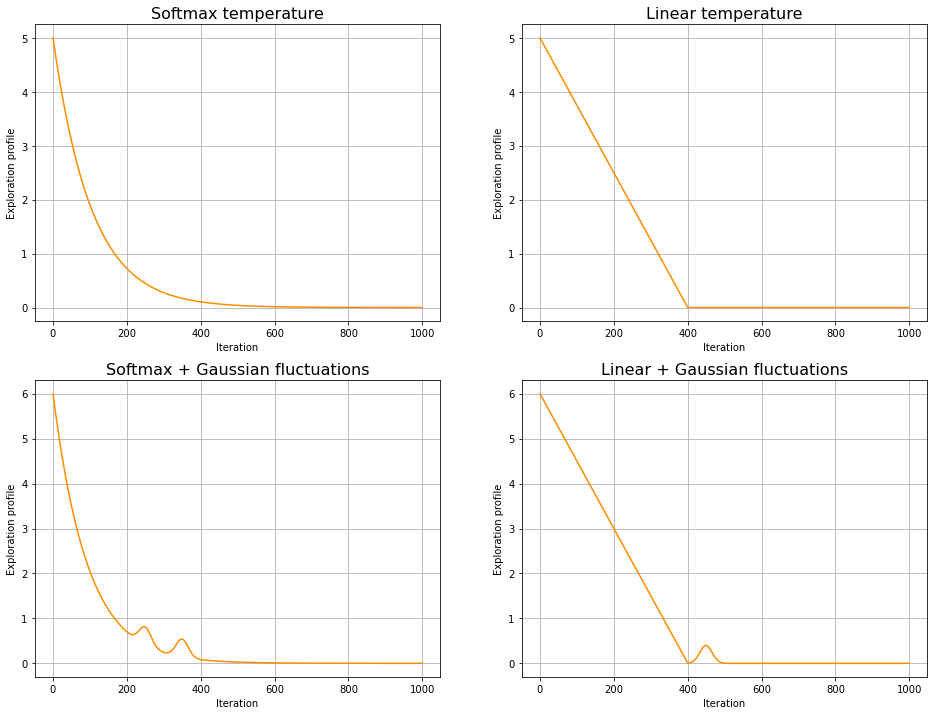

In [24]:
exploration_profile1 = expl_profile_softmax()
exploration_profile2 = expl_profile_linear()

exploration_profile3 = expl_profile_softmax(initial_value=np.random.randint(3, 7))
num_it = len(exploration_profile3)

if np.random.rand() < 0.75:
    j = np.random.randint(0, 9)
    g = gauss_fluctuation(np.linspace(-3, 3, 100))
    exploration_profile3[j* (num_it//10): (j+1)*(num_it//10)] += g
    if np.random.rand() < 0.75:
        j = np.random.randint(0, 9)
        exploration_profile3[j* (num_it//10): (j+1)*(num_it//10)] += gauss_fluctuation(np.linspace(-3, 3, 100))

exploration_profile4 = expl_profile_linear(initial_value=np.random.randint(3, 7))
num_it = len(exploration_profile4)

if np.random.rand() < 0.7:
    j = np.random.randint(0, 9)
    g = gauss_fluctuation(np.linspace(-3, 3, 100))
    exploration_profile4[j* (num_it//10): (j+1)*(num_it//10)] += g
    if np.random.rand() < 0.7:
        j = np.random.randint(0, 9)
        exploration_profile4[j* (num_it//10): (j+1)*(num_it//10)] += gauss_fluctuation(np.linspace(-3, 3, 100))


### Plot exploration profiles
fig, ax = plt.subplots(2, 2, figsize=(16,12))
col = 'darkorange'

ax[0,0].plot(exploration_profile1, c=col)
ax[0,0].grid()
ax[0,0].set_title('Softmax temperature', fontsize=16)
ax[0,0].set_xlabel('Iteration')
ax[0,0].set_ylabel('Exploration profile')

ax[0,1].plot(exploration_profile2, c=col)
ax[0,1].grid()
ax[0,1].set_title('Linear temperature', fontsize=16)
ax[0,1].set_xlabel('Iteration')
ax[0,1].set_ylabel('Exploration profile')

ax[1,0].plot(exploration_profile3, c=col)
ax[1,0].grid()
ax[1,0].set_title('Softmax + Gaussian fluctuations', fontsize=16)
ax[1,0].set_xlabel('Iteration')
ax[1,0].set_ylabel('Exploration profile')

ax[1,1].plot(exploration_profile4, c=col)
ax[1,1].grid()
ax[1,1].set_title('Linear + Gaussian fluctuations', fontsize=16)
ax[1,1].set_xlabel('Iteration')
ax[1,1].set_ylabel('Exploration profile')

plt.show()

# Gym Environment (CartPole-v1)

A pole is attached by an un-actuated joint to a cart, which moves along a frictionless track. The system is controlled by applying a force of +1 or -1 to the cart. The pendulum starts upright, and the goal is to prevent it from falling over. A reward of +1 is provided for every timestep that the pole remains upright. The episode ends when the pole is more than 15 degrees from vertical, or the cart moves more than 2.4 units from the center.

https://gym.openai.com/envs/CartPole-v1/

In [25]:
### Create environment
env = gym.make('CartPole-v1') # Initialize the Gym environment
rnd_seed() # Set a random seed for the environment (reproducible results)
env.seed(seed)

# Get the shapes of the state space (observation_space) and action space (action_space)
state_space_dim = env.observation_space.shape[0]
action_space_dim = env.action_space.n

print(f"STATE SPACE SIZE: {state_space_dim}")
print(f"ACTION SPACE SIZE: {action_space_dim}")

## Random agent

First of all, to check that the environment is working properly, let's try with an agent which simply choose an action randomly.

In [ ]:
# Initialize the Gym environment
env = gym.make('CartPole-v1') 
rnd_seed() # Set a random seed for the environment (reproducible results)

# This is for creating the output video in Colab, not required outside Colab
env = wrap_env(env, video_callable=lambda episode_id: True)

# Let's try for a total of 10 episodes
for num_episode in range(10): 
    # Reset the environment and get the initial state
    state = env.reset()
    # Reset the score. The final score will be the total amount of steps before the pole falls
    score = 0
    done = False
    # Go on until the pole falls off or the score reach 490
    while not done and score < 490:
      # Choose a random action
      action = random.choice([0, 1])
      # Apply the action and get the next state, the reward and a flag "done" that is True if the game is ended
      next_state, reward, done, info = env.step(action)
      # Visually render the environment (optional, comment this line to speed up the simulation)
      env.render()
      # Update the final score (+1 for each step)
      score += reward 
      # Set the current state for the next iteration
      state = next_state
      # Check if the episode ended (the pole fell down)
    # Print the final score
    print(f"EPISODE {num_episode + 1} - FINAL SCORE: {score}") 

env.close()


In [ ]:
# Display the videos, not required outside Colab
# show_videos()

# Network update

## Initialization

In this case we will use the Huber loss as loss function (https://pytorch.org/docs/stable/generated/torch.nn.SmoothL1Loss.html). The Huber loss uses a squared term if the absolute element-wise error falls below beta and an L1 term otherwise. It is less sensitive to outliers than the MSELoss and in some cases prevents exploding gradients.

In [60]:
def initialize(params, replay_memory_capacity=10000, state_space_dim=4, action_space_dim=2):
    ### Initialize the replay memory
    replay_mem = ReplayMemory(replay_memory_capacity)    

    ### Initialize the policy network
    policy_net = DQN(state_space_dim, action_space_dim)

    ### Initialize the target network with the same weights of the policy network
    target_net = DQN(state_space_dim, action_space_dim)
    # Copy the weights of the policy network to the target network
    target_net.load_state_dict(policy_net.state_dict()) 
    
    ### Initialize the optimizer
    # The optimizer will update ONLY the parameters of the policy network
    optimizer = torch.optim.SGD(policy_net.parameters(), lr=params['learning_rate']) 
    
    ### Initialize the loss function (Huber loss)
    loss_fn = nn.SmoothL1Loss()
    
    return replay_mem, policy_net, target_net, optimizer, loss_fn

## Update function

In [61]:
def update_step(policy_net, target_net, replay_mem, optimizer, loss_fn, params):
    
    gamma = params['gamma']
    batch_size = params['batch_size']
    
    # Sample the data from the replay memory
    batch = replay_mem.sample(batch_size)
    batch_size = len(batch)

    # Create tensors for each element of the batch
    states  = torch.tensor([s[0] for s in batch], dtype=torch.float32)
    actions = torch.tensor([s[1] for s in batch], dtype=torch.int64)
    rewards = torch.tensor([s[3] for s in batch], dtype=torch.float32)

    # Compute a mask of non-final states 
    # (all the elements where the next state is not None)
    non_final_next_states = torch.tensor([s[2] for s in batch if s[2] is not None], dtype=torch.float32) 
    # the next state can be None if the game has ended
    non_final_mask = torch.tensor([s[2] is not None for s in batch], dtype=torch.bool)

    # Compute all the Q values (forward pass)
    policy_net.train()
    q_values = policy_net(states)
    # Select the proper Q value for the corresponding action taken Q(s_t, a)
    state_action_values = q_values.gather(1, actions.unsqueeze(1))

    # Compute the value function of the next states using the target network V(s_{t+1}) = max_a( Q_target(s_{t+1}, a)) )
    with torch.no_grad():
        target_net.eval()
        q_values_target = target_net(non_final_next_states)
    
    next_state_max_q_values = torch.zeros(batch_size)
    next_state_max_q_values[non_final_mask] = q_values_target.max(dim=1)[0]

    # Compute the expected Q values
    expected_state_action_values = rewards + (next_state_max_q_values * gamma)
    # Set the required tensor shape
    expected_state_action_values = expected_state_action_values.unsqueeze(1) 

    # Compute the Huber loss
    loss = loss_fn(state_action_values, expected_state_action_values)

    # Optimize the model
    optimizer.zero_grad()
    loss.backward()
    # Apply gradient clipping (clip all the gradients greater than 2 for training stability)
    nn.utils.clip_grad_norm_(policy_net.parameters(), 2)
    optimizer.step()

## Training loop

In [62]:
def train_loop(policy_net, target_net, replay_mem, exploration_profile, params, seed=1234439, verbose=False):
    '''
    Function that defines the main training process
    '''

    # Initialize the Gym environment
    env = gym.make('CartPole-v1') 
    rnd_seed(seed) # Set a random seed for the environment (reproducible results)
    env.seed(seed)
    
    # initialise output list containing all the scores
    scores = []

    for episode_num, tau in enumerate(tqdm(exploration_profile)):

        # Reset the environment and get the initial state
        state = env.reset()
        # Reset the score. The final score will be the total amount of steps before the pole falls
        score = 0
        done = False

        # Go on until the pole falls off
        while not done:

            # Choose the action following the policy
            action, q_values = choose_action_softmax(policy_net, state, temperature=tau)

            # Apply the action and get the next state, the reward and a flag "done" that is True if the game is ended
            next_state, reward, done, info = env.step(action)

            # IMPLEMENT FURTHER PENALTY HERE
            off_cen_penalty = 1.
            reward = reward - off_cen_penalty * np.abs(state[0])

            # Update the final score (+1 for each step)
            score += 1

            # Apply penalty for bad state
            if done: # if the pole has fallen down 
                reward += params['bad_state_penalty']
                next_state = None

            # Update the replay memory
            replay_mem.push(state, action, next_state, reward)

            # Update the network
            if len(replay_mem) > params['min_samples_for_training']: 
                # Enable the training only if there are enough samples in the replay memory
                # otherwise the training will use the same samples too often
                update_step(policy_net, target_net, replay_mem, optimizer, loss_fn, params)

            # Visually render the environment 
            # comment to speed up the training
            # env.render()

            # Set the current state for the next iteration
            state = next_state

        # Update the target network every target_net_update_steps episodes
        if episode_num % params['target_net_update_steps'] == 0:
            if verbose: print('Updating target network...')
            # Copy the weights of the policy network to the target network  
            target_net.load_state_dict(policy_net.state_dict()) 

        # Print the final score
        if verbose: 
            print(f"EPISODE: {episode_num + 1} - FINAL SCORE: {score} - Temperature: {tau}") # Print the final score
        # Save score
        scores.append(score)
    
    env.close()
    
    return policy_net, scores
    

## Exploration

Generate randomly 15 different exploration profiles, either linear or exponential, with or without gaussian fluctuations.

In [29]:
expl_profiles = []

type_prof = ['softmax', 'linear']

for i in range(15):
    
    if np.random.choice(type_prof) == 'linear':
        explos = expl_profile_linear(initial_value=np.random.randint(3, 7))
    else:
        explos = expl_profile_softmax(initial_value=np.random.randint(3, 7))
        
    num_it = len(explos)
    
    if np.random.rand() < 0.75:    
        j = np.random.randint(0, 9)
        g = gauss_fluctuation(np.linspace(-3, 3, 100))
        explos[j * (num_it//10): (j+1)*(num_it//10)] += g
        
        if np.random.rand() < 0.75:
            j = np.random.randint(0, 9)
            explos[j * (num_it//10): (j+1)*(num_it//10)] += gauss_fluctuation(np.linspace(-3, 3, 100))
    
    expl_profiles.append(explos)
    

## Optimize parameters

In [30]:
### PARAMETERS

hyperparams = {'gamma': np.linspace(0.9, 0.99, 10),        # gamma parameter for the long term reward
               'replay_memory_capacity': [10000],          # Replay memory capacity
               'learning_rate': np.logspace(-3, -1, 10),   # Optimizer learning rate
               'target_net_update_steps': [5, 10, 15, 20], # Number of episodes to wait before updating the target network
               'batch_size': [32, 64, 128, 256],           # Number of samples to take from the replay memory for each update
               'bad_state_penalty': [0],                   # Penalty to the reward when we are in a bad state (in this case when the pole falls down) 
               'min_samples_for_training': [1000]          # Minimum samples in the replay memory to enable the training
              }

# gamma = 0.97   
# replay_memory_capacity = 10000   # Replay memory capacity
# lr = 1e-2   # Optimizer learning rate
# target_net_update_steps = 10   # Number of episodes to wait before updating the target network
# batch_size = 128   # Number of samples to take from the replay memory for each update
# bad_state_penalty = 0   # Penalty to the reward when we are in a bad state (in this case when the pole falls down) 
# min_samples_for_training = 1000   # Minimum samples in the replay memory to enable the training

In [31]:
def random_params(params):
    selected_params = {}
    for i in params.keys():
        selected_params[i] = np.random.choice( params[i] )
    return selected_params

print(random_params(hyperparams))

In [ ]:
## try to find best model
# test 50 different configurations of exploration profiles, set of parameters
rnd_seed() # reproducibility
env.seed(seed)

#outputs
all_params = []
all_train_scores = []
all_expl_profiles = []

for net in range(50):
    
    ### Set exploration profile
    exploration_profile = expl_profiles[ np.random.randint(0, len(expl_profiles))]
    
    ### PARAMETERS
    params = random_params(hyperparams)
    print('Model', net, '...')
    
    ### Initialization
    replay_mem, policy_net, target_net, optimizer, loss_fn = initialize(params)
    
    ### Training
    policy_net, training_score = train_loop(policy_net, target_net, replay_mem, exploration_profile, params)
    
    all_params.append(params)
    all_train_scores.append(training_score)
    all_expl_profiles.append(exploration_profile)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

In [ ]:
all_params

[{'gamma': 0.9400000000000001,
  'learning_rate': 0.007742636826811269,
  'target_net_update_steps': 20,
  'batch_size': 256,
  'reach_490': 1000},
 {'gamma': 0.91,
  'learning_rate': 0.05994842503189409,
  'target_net_update_steps': 5,
  'batch_size': 64,
  'reach_490': 1000},
 {'gamma': 0.93,
  'learning_rate': 0.004641588833612777,
  'target_net_update_steps': 10,
  'batch_size': 32,
  'reach_490': 1000},
 {'gamma': 0.93,
  'learning_rate': 0.007742636826811269,
  'target_net_update_steps': 10,
  'batch_size': 64,
  'reach_490': 914},
 {'gamma': 0.9,
  'learning_rate': 0.007742636826811269,
  'target_net_update_steps': 15,
  'batch_size': 256,
  'reach_490': 1000},
 {'gamma': 0.9,
  'learning_rate': 0.007742636826811269,
  'target_net_update_steps': 5,
  'batch_size': 128,
  'reach_490': 413},
 {'gamma': 0.92,
  'learning_rate': 0.03593813663804626,
  'target_net_update_steps': 10,
  'batch_size': 64,
  'reach_490': 1000},
 {'gamma': 0.98,
  'learning_rate': 0.05994842503189409,
  '

### Plot scores

In [21]:
def plot_profile_score( exploration_profile, score, params):
    
    score = np.array(score)
    
    ### text box with parameters
    box_param = ''
    for key, value in params.items():
        box_param += ('%s : %.3f\n' %(key, value))
    box_param = box_param[:-1]
   
    ### Plot exploration profile
    fig, ax = plt.subplots(figsize=(10,6))

    col = 'darkorange'
    ax.set_xlabel('Iteration', fontsize=14)
    ax.set_ylabel('Exploration profile', c=col, fontsize=14)
    ax.plot(exploration_profile, c=col, linewidth=1.5)
    ax.tick_params(axis='y', labelcolor=col)
    
    ax2 = ax.twinx()  # saem x axis, different ys
    
    col = 'seagreen'
    ax2.set_ylabel('Final score', c=col, fontsize=14)  # we already handled the x-label with ax1
    ax2.plot(score, c=col, linewidth=0.7)
    ax2.tick_params(axis='y', labelcolor=col)
    
    ax.text(0.05, 0.95, box_param, transform=ax.transAxes,
            verticalalignment='top', color='black', fontsize=12,
            bbox=dict(fc='none', ec='black', boxstyle='square,pad=0.7'))
    
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.show()

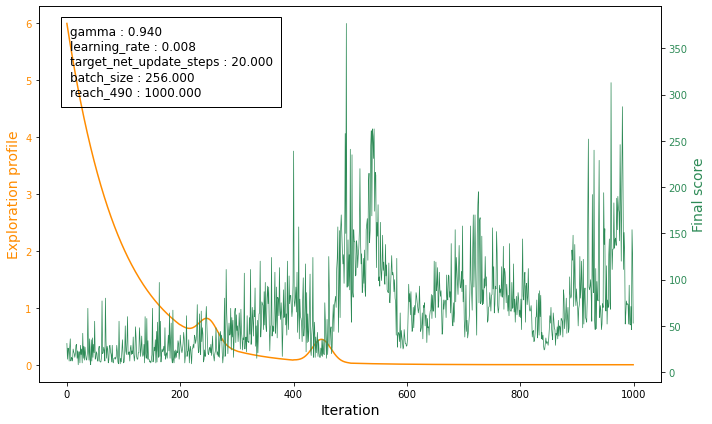

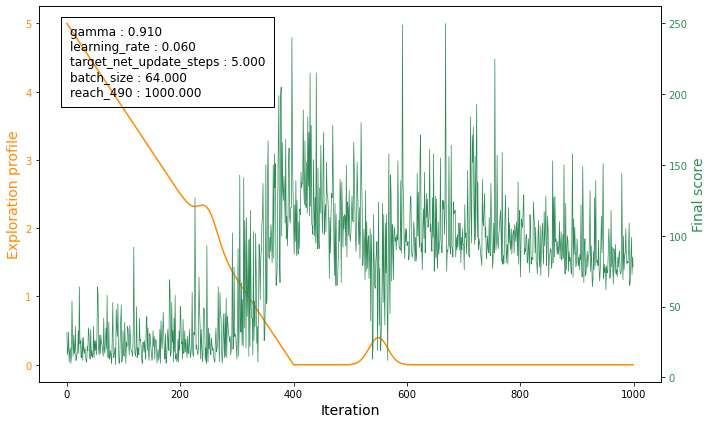

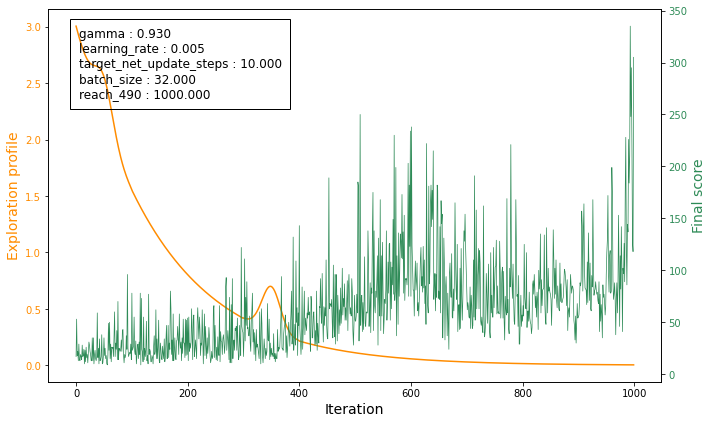

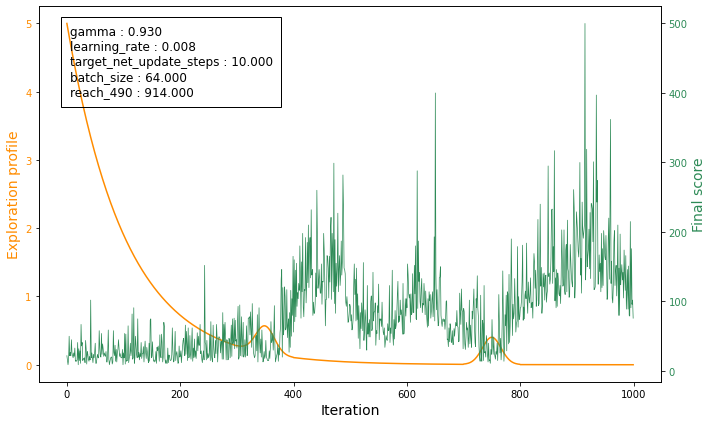

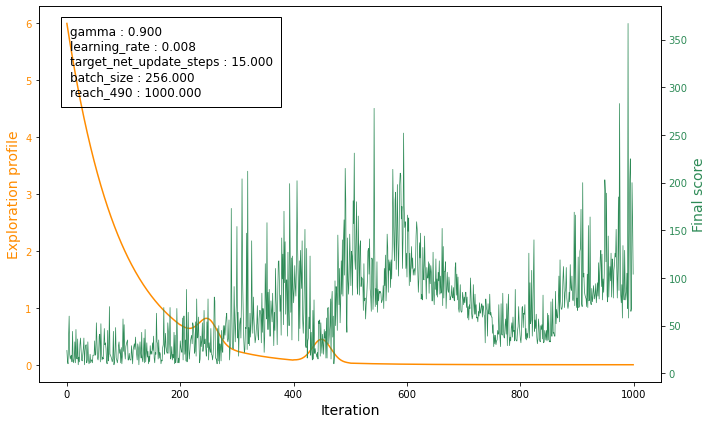

...

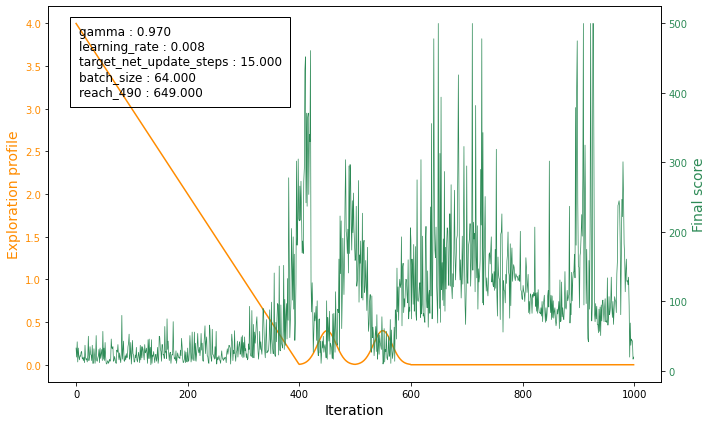

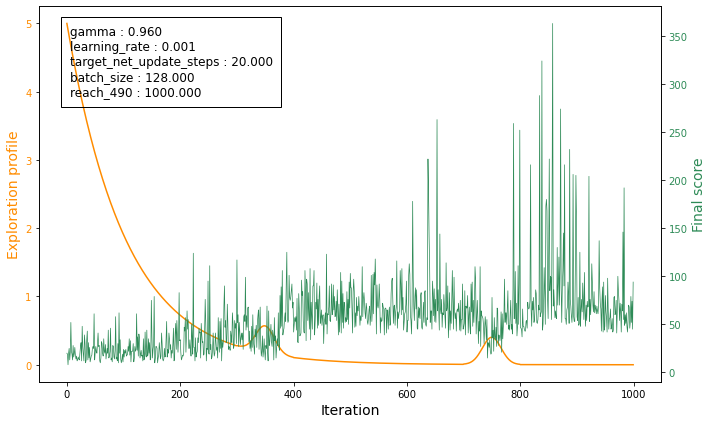

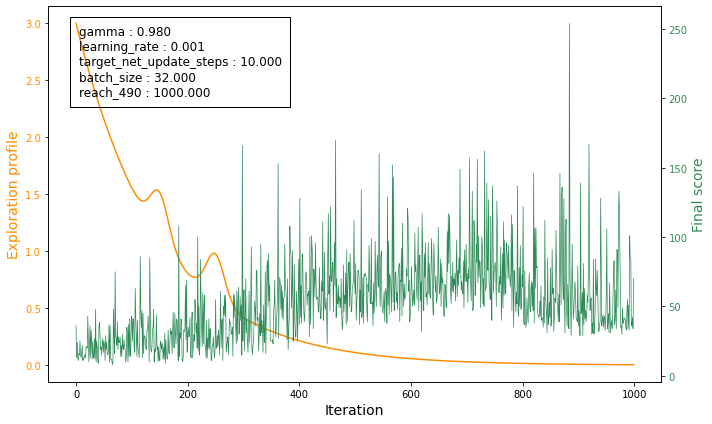

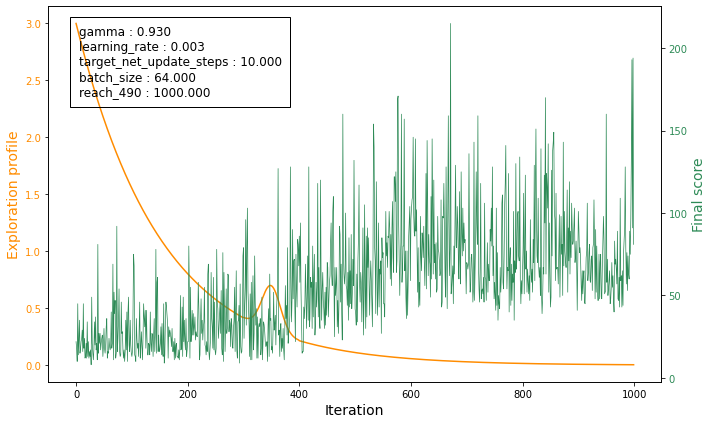

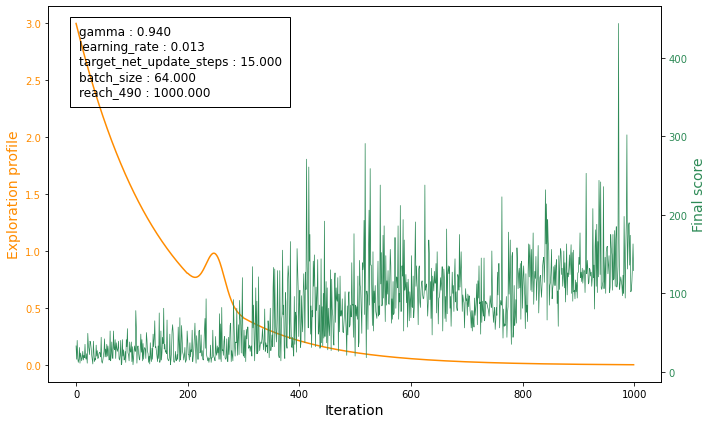

In [ ]:
for net in range(50):
    plot_profile_score(all_expl_profiles[net], all_train_scores[net], all_params[net])

### Select best model(s)

In [ ]:
# Select models which arrives to the desired score faster
for net, score in enumerate(np.array(all_train_scores)):
    
    mask = np.array(score) >= 490
    
    if score[mask].shape == (0,):
        all_params[net]['reach_490'] = 1000
    else:    
        all_params[net]['reach_490'] = np.where(mask)[0][0]

# type conversion
for net in all_params:
    for k in net.keys():
        if type(net[k])==np.int32 or type(net[k])==np.int64:
            net[k] = int( net[k] )
        elif type(net[k])==np.float32 or type(net[k])==np.float64:
            net[k] = float( net[k] )
                        

In [ ]:
hip.Experiment.from_iterable(all_params).display()

<IPython.core.display.Javascript object>

In [ ]:
plot_param = all_params
reach_490 = np.zeros(len(all_params))
for i, p in enumerate(plot_param):
    p.pop('replay_memory_capacity')
    p.pop('min_samples_for_training')
    p.pop('bad_state_penalty')
    reach_490[i] = p['reach_490']

fig = px.parallel_coordinates(plot_param, color='reach_490', color_continuous_scale=px.colors.sequential.RdBu)
fig.show()

In [ ]:
best_param = all_params[np.argmin(reach_490)]
best_param['replay_memory_capacity'] = 10000
best_param['min_samples_for_training'] = 1000
best_param['bad_state_penalty'] =0

print(best_param)

# Final test

In [ ]:
best_param ={ 'gamma': 0.95,
              'learning_rate': 0.1,
              'target_net_update_steps': 5,
              'batch_size': 64,
              'reach_490': 370,
              'replay_memory_capacity': 10000,
              'min_samples_for_training': 1000,
              'bad_state_penalty': 0  
            }

In [ ]:
### Initialization
## PUT OPTIMAL PARAM SET
final_replay_mem, final_policy_net, final_target_net, optimizer, loss_fn = initialize(best_param) 

### Training
## PUT OPTIMAL PARAM SET
## Choose softmax exploration profile with no Gaussian "bumps"
final_policy_net, final_training_score = train_loop(final_policy_net, final_target_net, final_replay_mem, 
                                                    exploration_profile1, best_param)

torch.save(final_policy_net.state_dict(), 'final_cartpole')

  0%|          | 0/1000 [00:00<?, ?it/s]

In [ ]:
# Initialize the Gym environment
env = gym.make('CartPole-v1') 
rnd_seed() # Set a random seed for the environment (reproducible results)
env.seed(seed)

## LOAD FINAL NETWORK
final_policy_net.load_state_dict(torch.load('final_cartpole'))
final_policy_net.to(device)

# This is for creating the output video in Colab, not required outside Colab
env = wrap_env(env, video_callable=lambda episode_id: True) # Save a video every episode

# Let's try for a total of 10 episodes
for num_episode in range(10): 
    # Reset the environment and get the initial state
    state = env.reset()
    # Reset the score. The final score will be the total amount of steps before the pole falls
    score = 0
    done = False
    # Go on until the pole falls off or the score reach 490
    while not done:
      # Choose the best action (temperature 0)
      action, q_values = choose_action_softmax(final_policy_net, state, temperature=0)
      # Apply the action and get the next state, the reward and a flag "done" that is True if the game is ended
      next_state, reward, done, info = env.step(action)
      # Visually render the environment
      env.render()
      # Update the final score (+1 for each step)
      score += reward 
      # Set the current state for the next iteration
      state = next_state
      # Check if the episode ended (the pole fell down)
    # Print the final score
    print(f"EPISODE {num_episode + 1} - FINAL SCORE: {score}") 
env.close()

In [ ]:
# Display the videos, not required outside Colab
# show_videos()

# CartPole with Pixels
### Manipulate inputs
- reduce to only b/w frames 
- crop them
- deduce velocity considering groups of 4 frames



In [10]:
def get_cart_location(env, screen_width):
    world_width = env.x_threshold * 2
    scale = screen_width / world_width
    return int(env.state[0] * scale + screen_width / 2.0)  

def get_frame(env):
    # get proper "color" mode
    img = env.render(mode='rgb_array')#.transpose((2, 0, 1))
    # convert to b/w
    img_rgb = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # resize from 600x400 to 240x160 (maintain proportions, reduce picture size)
    img_rgb_resized = cv2.resize(img_rgb, (240, 160), interpolation=cv2.INTER_CUBIC)
    img_rgb_resized[img_rgb_resized < 255] = 0
    img_rgb_resized = img_rgb_resized / 255
    # final picture size
    width = 150
    height = 100
    # crop top and bottom
    img_rgb_resized = img_rgb_resized[40:140, :]
    # crop again centering on the cart middle
    cart_pos = get_cart_location(env, 240)
    if cart_pos < width // 2:
        slice_range = slice(width)
    elif cart_pos > (240 - width // 2):
        slice_range = slice(-width, None)
    else:
        slice_range = slice(cart_pos - width // 2,
                            cart_pos + width // 2)
    img_rgb_resized = img_rgb_resized[:, slice_range]
    
    return img_rgb_resized[np.newaxis, :]
  
def from_frame_to_tens(screen):
    return torch.tensor(screen).type(torch.float).unsqueeze(0)

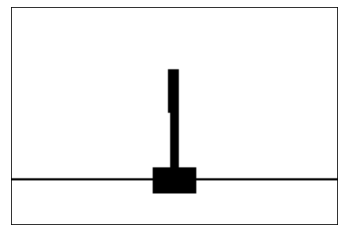

In [11]:
env_pix = gym.make('CartPole-v1') 
state = env_pix.reset()
frame = get_frame(env_pix)
env_pix.close()
plt.imshow(frame[0], cmap='gist_gray')
plt.yticks([])
plt.xticks([])
plt.show()
print(frame.shape, type(frame))
print(from_frame_to_tens(frame[0]).shape, type(from_frame_to_tens(frame[0])))

### Define new network
Considering that we have to work with pictures, we impement a convolutional network.

In [12]:
class DQ_CNN(nn.Module):

    def __init__(self, action_space_dim):
        super().__init__()
    
        self.conv = nn.Sequential( # img size = 600x400 cropped to 150x100
                                   # 4 input channels as I use 4 frames to determine velocity
                                    nn.Conv2d(4, 16, kernel_size=8, padding=0, stride=4), 
                                    nn.ReLU(),
                                    # Second convolutional layer
                                    # img size = 36x24 
                                    nn.Conv2d(16, 32, kernel_size=4, padding=0, stride=2),
                                    nn.ReLU(),
                                    # img size = 17x11 
                                    # Flatten layer
                                    nn.Flatten(start_dim=1),
                
                )
        
        self.linear = nn.Sequential(
                # inputs = img_size x n_channels = 17x11x32
                nn.Linear(5984, 256),
                nn.ReLU(),
                nn.Linear(256, 128),
                nn.ReLU(),
                nn.Linear(128, action_space_dim)
                )

    def forward(self, x):
        x = self.conv(x)
        x = self.linear(x)
        return x

In [13]:
def choose_action_softmax_pix(net, state, temperature):
    
    state = state.to(device)
    
    if temperature < 0:
        raise Exception('The temperature value must be greater than or equal to 0')
        
    # If the temperature is 0, just select the best action using the eps-greedy policy with epsilon = 0
    if temperature == 0:
        return choose_action_epsilon_greedy(net, state, 0)
    
    # Evaluate the network output from the current state
    with torch.no_grad():
        net.eval()
        state = torch.tensor(state, dtype=torch.float32)
        net_out = net(state).squeeze(0)

    # Apply softmax with temp
    temperature = max(temperature, 1e-8) # set a minimum to the temperature for numerical stability
    softmax_out = nn.functional.softmax(net_out.cpu() / temperature, dim=0).numpy()
    # Sample the action using softmax output as mass pdf
    all_possible_actions = np.arange(0, softmax_out.shape[-1])
    action = np.random.choice(all_possible_actions, p=softmax_out) # this samples a random element from "all_possible_actions" with the probability distribution p (softmax_out in this case)
    
    return action, net_out.cpu().numpy()

In [14]:
def choose_action_epsilon_greedy_pix(net, state, epsilon):
    
    state = state.to(device)

    if epsilon > 1 or epsilon < 0:
        raise Exception('The epsilon value must be between 0 and 1')
                
    # Evaluate the network output from the current state
    with torch.no_grad():
        net.eval()
        state = torch.tensor(state, dtype=torch.float32) # Convert the state to tensor
        net_out = net(state).squeeze(0)

    # Get the best action (argmax of the network output)
    best_action = int(net_out.argmax().cpu())
    # Get the number of possible actions
    action_space_dim = net_out.shape[-1]

    # Select a non optimal action with probability epsilon, otherwise choose the best action
    if random.random() < epsilon:
        # List of non-optimal actions
        non_optimal_actions = [a for a in range(action_space_dim) if a != best_action]
        # Select randomly
        action = random.choice(non_optimal_actions)
    else:
        # Select best action
        action = best_action
        
    return action, net_out.cpu().numpy()

In [15]:
def initialize_cnn(params, replay_memory_capacity=5000, action_space_dim=2):
    ### Initialize the replay memory
    replay_mem = ReplayMemory(replay_memory_capacity)    

    ### Initialize the policy network
    policy_net = DQ_CNN(action_space_dim).to(device)

    ### Initialize the target network with the same weights of the policy network
    target_net = DQ_CNN(action_space_dim).to(device)
    # Copy the weights of the policy network to the target network
    target_net.load_state_dict(policy_net.state_dict()) 
    
    ### Initialize the optimizer
    # The optimizer will update ONLY the parameters of the policy network
    optimizer = torch.optim.RMSprop(policy_net.parameters(), lr=params['learning_rate']) 
    
    ### Initialize the loss function (Huber loss)
    loss_fn = nn.SmoothL1Loss()
    
    return replay_mem, policy_net, target_net, optimizer, loss_fn

In [16]:
def update_step_pix(policy_net, target_net, replay_mem, optimizer, loss_fn, params):
    
    gamma = params['gamma']
    batch_size = params['batch_size']
    
    # Sample the data from the replay memory
    batch = replay_mem.sample(batch_size)
    batch_size = len(batch)

    # Create tensors for each element of the batch
    states  = torch.tensor([s[0] for s in batch], dtype=torch.float32)
    # states = torch.from_numpy(states)
    
    actions = torch.tensor([s[1] for s in batch], dtype=torch.int64)
    rewards = torch.tensor([s[3] for s in batch], dtype=torch.float32)

    # Compute a mask of non-final states 
    # (all the elements where the next state is not None)
    non_final_next_states = torch.tensor([s[2] for s in batch if s[2] is not None], dtype=torch.float32) 
    # non_final_next_states = torch.from_numpy(non_final_next_states)
    
    # the next state can be None if the game has ended
    non_final_mask = torch.tensor([s[2] is not None for s in batch], dtype=torch.bool)

    # Compute all the Q values (forward pass)
    policy_net.train()
    q_values = policy_net(states.to(device)).cpu()
    
    # Select the proper Q value for the corresponding action taken Q(s_t, a)
    state_action_values = q_values.gather(1, actions.unsqueeze(1))

    # Compute the value function of the next states using the target network V(s_{t+1}) = max_a( Q_target(s_{t+1}, a)) )
    with torch.no_grad():
        target_net.eval()
        q_values_target = target_net(non_final_next_states.to(device)).cpu()
    
    next_state_max_q_values = torch.zeros(batch_size)
    next_state_max_q_values[non_final_mask] = q_values_target.max(dim=1)[0]

    # Compute the expected Q values
    expected_state_action_values = rewards + (next_state_max_q_values * gamma)
    # Set the required tensor shape
    expected_state_action_values = expected_state_action_values.unsqueeze(1) 

    # Compute the Huber loss
    loss = loss_fn(state_action_values, expected_state_action_values)

    # Optimize the model
    optimizer.zero_grad()
    loss.backward()
    # Apply gradient clipping (clip all the gradients greater than 2 for training stability)
    nn.utils.clip_grad_norm_(policy_net.parameters(), 2)
    optimizer.step()

In [17]:
def expl_profile_softmax_cnn(num_iterations=1000, initial_value=1., reach_end=880):
    # We compute the exponential decay in such a way the shape of the 
    # exploration profile does not depend on the number of iterations
    if initial_value == 1:
        exp_decay = np.array([np.exp(-i / num_iterations * 6 ) for i in range(reach_end)])
        const = np.ones(num_iterations - reach_end) * exp_decay[-1]
        exploration_profile = np.hstack((exp_decay, const))
    else:    
        exp_decay = np.exp(-np.log(initial_value) / num_iterations * 6) 
        exploration_profile = np.array([initial_value * (exp_decay ** i) for i in range(num_iterations)])
    
    return exploration_profile

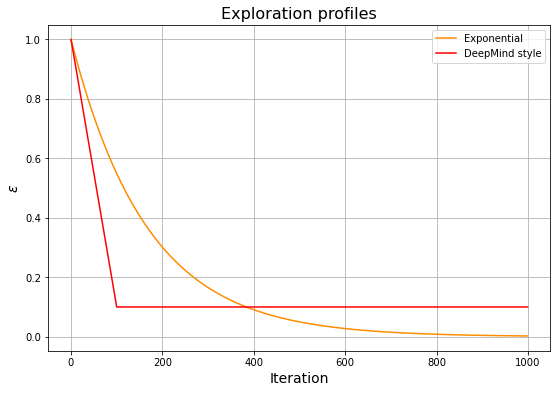

In [18]:
# cnn_expl_prof = expl_profile_softmax(num_iterations=200, initial_value=5)
# cnn_expl_prof = expl_profile_softmax_cnn()#(num_iterations=500, initial_value=1)
cnn_expl_prof = expl_profile_softmax_cnn(num_iterations=1000, initial_value=1., reach_end=1000)
lin_expl_prof = expl_profile_linear(num_iterations=1000, initial_value=1., end_value=0.1, reach_end=100)

fig, ax = plt.subplots(figsize=(9,6))
col = 'darkorange'

plt.plot(cnn_expl_prof, c=col, label='Exponential')
plt.grid()
plt.title('Exploration profiles', fontsize=16)
plt.xlabel('Iteration', fontsize=14)
plt.ylabel('$\\epsilon$', fontsize=14)

plt.plot(lin_expl_prof, c='red', label='DeepMind style')
plt.legend(loc='best')
plt.show()

In [19]:
### PARAMETERS

cnn_params = {'gamma': 0.99,                   # gamma parameter for the long term reward
              'replay_memory_capacity': 10000, # Replay memory capacity
              'learning_rate': 0.0001,         # Optimizer learning rate
              'target_net_update_steps': 5,    # Number of episodes to wait before updating the target network
              'batch_size': 32,                # Number of samples to take from the replay memory for each update
              'bad_state_penalty': 0,          # Penalty to the reward when we are in a bad state (in this case when the pole falls down) 
              'min_samples_for_training': 1000 # Minimum samples in the replay memory to enable the training
             }


In [ ]:
## IMG SIZE=150X100, OLD ARCHITECTURE (1 EXTRA LINEAR LAYER)
## LR = 0.001
## EXPL PROFILE EXPONENTIAL FINO A 500, POI EPS=0
for episode_num, tau in enumerate(tqdm(cnn_expl_prof)):
    # Reset the environment and get the initial state
    state = env_pix.reset()
    obs = get_frame(env_pix)
    # Reset the score. The final score will be the total amount of steps before the pole falls
    score = 0
    done = False
    # Go on until the pole falls off
#     print('Updating frames...')
    for i in range(ml):
#         print('...', i, '...')
        obs = np.append( obs, obs_history[-i-1], axis=0)
    # obs is now 4 consecutive frames     
    
    while not done:
        # Adding history
#         print('History...')
        for i in range(ml):
            if obs_history[i] is None: obs_history[i] = np.zeros((1, 100, 150))
        # append frame to history
        obs_history.append(obs[0][np.newaxis, :])
        
#         print('Choosing action...')
        # Choose the action following the policy
        # action, q_values = choose_action_softmax_pix(policy_net, from_frame_to_tens(obs), temperature=tau)
        action, q_values = choose_action_epsilon_greedy_pix(policy_net, from_frame_to_tens(obs), tau)

        # Apply the action and get the next state, the reward and a flag "done" that is True if the game is ended
        next_state, reward, done, info = env_pix.step(action)
        next_obs = get_frame(env_pix)
        
#         print('History...')
        # update frame history 
        for i in range(ml):
            next_obs = np.append( next_obs, obs_history[-i-1], axis=0) 
        
        # Reward penalty when the cart is far from the centre
        off_cen_penalty = 1.
        reward = reward - off_cen_penalty * np.abs(state[0]) 

        # Update the final score (+1 for each step)
        score += 1
        # Apply penalty for bad state
        if done: # if the pole has fallen down 
            reward += cnn_params['bad_state_penalty']
            next_state = None
            next_obs = None

        # Update the replay memory
        replay_mem.push(obs, action, next_obs, reward)

        # Update the network
        if len(replay_mem) > cnn_params['min_samples_for_training']: # we enable the training only if we have enough samples in the replay memory, otherwise the training will use the same samples too often
            update_step_pix(policy_net, target_net, replay_mem, optimizer, loss_fn, cnn_params)

        # Set the current state for the next iteration
        obs = next_obs
        state = next_state

    # Update the target network every target_net_update_steps episodes
    if episode_num % cnn_params['target_net_update_steps'] == 0:
#         print('Updating target network...')
        target_net.load_state_dict(policy_net.state_dict()) # This will copy the weights of the policy network to the target network

    # Print the final score
    print(f"EPISODE: {episode_num + 1} - FINAL SCORE: {score} - Temperature: {tau}") # Print the final score
    if episode_num > 10:
      print(f"            - Last10avg: {avg_window(training_score, 10)[-1]}")
    if episode_num >= 50:
      print(f"            - Last50avg: {avg_window(training_score, 50)[-1]}")

    training_score.append(score)
    
env_pix.close()


  0%|          | 0/1000 [00:00<?, ?it/s]

D:\Anaconda\envs\nndl\lib\site-packages\ipykernel_launcher.py:11: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



In [ ]:
torch.save(policy_net.state_dict(), 'cartpole_pix_crop')

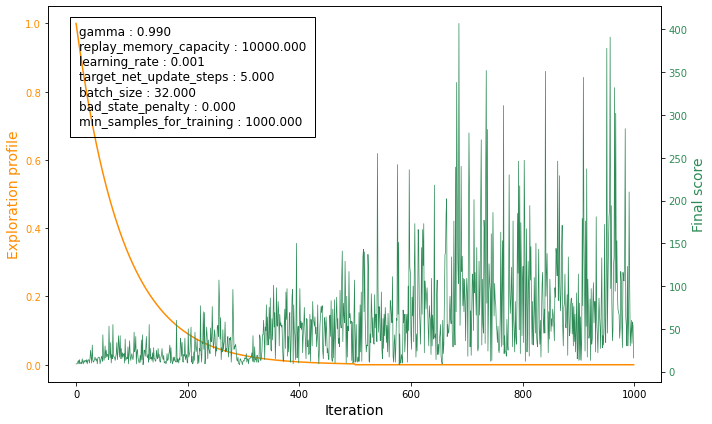

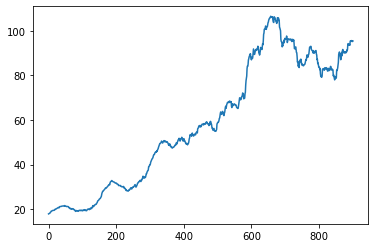

In [ ]:
plot_profile_score( cnn_expl_prof, training_score, cnn_params)
plt.plot(avg_window(training_score, 100))

In [89]:
## FINAL TRAINING
## IMG SIZE 150X100
## 3 LINEAR LAYERS, EXPONENTIAL DECAY FOR TEMPERATURE
## EPSILON GREEDY STRATEGY
env_pix = gym.make('CartPole-v1') 
rnd_seed() # Set a random seed for the environment (reproducible results)
env_pix.seed(seed)

# number of consecutive frames -1 
# used to infer velocities 
ml = 3

training_score = []
obs_history = deque(maxlen=ml)

### Initialization
# print('Initialising...')
replay_mem, policy_net, target_net, optimizer, loss_fn = initialize_cnn(cnn_params)

policy_net.load_state_dict(torch.load('cartpole_pix_crop'))#, map_location=torch.device('cpu')))
policy_net.to(device)

# print('Initialising frame history...')
for i in range(ml): 
    obs_history.append(np.zeros((1, 100, 150) ))

In [90]:
## FINAL TRAINING
## IMG SIZE 150X100
## 3 LINEAR LAYERS, EXPONENTIAL DECAY FOR TEMPERATURE
## lr = 0.0001
## EPSILON GREEDY STRATEGY
for episode_num, tau in enumerate(tqdm(cnn_expl_prof)):
    # Reset the environment and get the initial state
    state = env_pix.reset()
    obs = get_frame(env_pix)
    # Reset the score. The final score will be the total amount of steps before the pole falls
    score = 0
    done = False
    # Go on until the pole falls off
#     print('Updating frames...')
    for i in range(ml):
#         print('...', i, '...')
        obs = np.append( obs, obs_history[-i-1], axis=0)
    # obs is now 4 consecutive frames     
    
    while not done:
        # Adding history
#         print('History...')
        for i in range(ml):
            if obs_history[i] is None: obs_history[i] = np.zeros((1, 100, 150))
        # append frame to history
        obs_history.append(obs[0][np.newaxis, :])
        
#         print('Choosing action...')
        # Choose the action following the policy
        # action, q_values = choose_action_softmax_pix(policy_net, from_frame_to_tens(obs), temperature=tau)
        action, q_values = choose_action_epsilon_greedy_pix(policy_net, from_frame_to_tens(obs), tau)

        # Apply the action and get the next state, the reward and a flag "done" that is True if the game is ended
        next_state, reward, done, info = env_pix.step(action)
        next_obs = get_frame(env_pix)
        
#         print('History...')
        # update frame history 
        for i in range(ml):
            next_obs = np.append( next_obs, obs_history[-i-1], axis=0) 
        
        # Reward penalty when the cart is far from the centre
        off_cen_penalty = 1.
        reward = reward - off_cen_penalty * np.abs(state[0]) 

        # Update the final score (+1 for each step)
        score += 1
        # Apply penalty for bad state
        if done: # if the pole has fallen down 
            reward += cnn_params['bad_state_penalty']
            next_state = None
            next_obs = None

        # Update the replay memory
        replay_mem.push(obs, action, next_obs, reward)

        # Update the network
        if len(replay_mem) > cnn_params['min_samples_for_training']: # we enable the training only if we have enough samples in the replay memory, otherwise the training will use the same samples too often
            update_step_pix(policy_net, target_net, replay_mem, optimizer, loss_fn, cnn_params)

        # Set the current state for the next iteration
        obs = next_obs
        state = next_state

    # Update the target network every target_net_update_steps episodes
    if episode_num % cnn_params['target_net_update_steps'] == 0:
#         print('Updating target network...')
        target_net.load_state_dict(policy_net.state_dict()) # This will copy the weights of the policy network to the target network

    # Print the final score
    print(f"EPISODE: {episode_num + 1} - FINAL SCORE: {score} - Temperature: {tau}") # Print the final score
    if episode_num > 10:
      print(f"            - Last10avg: {avg_window(training_score, 10)[-1]}")
    if episode_num >= 50:
      print(f"            - Last50avg: {avg_window(training_score, 50)[-1]}")

    training_score.append(score)
    
env_pix.close()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



EPISODE: 1 - FINAL SCORE: 9 - Temperature: 1.0

EPISODE: 2 - FINAL SCORE: 10 - Temperature: 0.9940179640539353

EPISODE: 3 - FINAL SCORE: 12 - Temperature: 0.9880717128619305

EPISODE: 4 - FINAL SCORE: 13 - Temperature: 0.9821610323583008

EPISODE: 5 - FINAL SCORE: 9 - Temperature: 0.9762857097579093

EPISODE: 6 - FINAL SCORE: 12 - Temperature: 0.9704455335485082

EPISODE: 7 - FINAL SCORE: 12 - Temperature: 0.9646402934831231

EPISODE: 8 - FINAL SCORE: 10 - Temperature: 0.9588697805724845

EPISODE: 9 - FINAL SCORE: 13 - Temperature: 0.9531337870775047

EPISODE: 10 - FINAL SCORE: 11 - Temperature: 0.9474321065017983

EPISODE: 11 - FINAL SCORE: 9 - Temperature: 0.9417645335842487

EPISODE: 12 - FINAL SCORE: 18 - Temperature: 0.9361308642916188

- Last10avg: 11.100000000000001

EPISODE: 13 - FINAL SCORE: 11 - Temperature: 0.9305308958112057

- Last10avg: 11.9

EPISODE: 14 - FINAL SCORE: 9 - Temperature: 0.9249644265435393

- Last10avg: 11.8

EPISODE: 15 - FINAL SCORE: 9 - Temperature: 0.9194312560951247

- Last10avg: 11.400000000000002

EPISODE: 16 - FINAL SCORE: 11 - Temperature: 0.9139311852712282

- Last10avg: 11.400000000000002

EPISODE: 17 - FINAL SCORE: 11 - Temperature: 0.9084640160687062

- Last10avg: 11.3

EPISODE: 18 - FINAL SCORE: 10 - Temperature: 0.9030295516688768

- Last10avg: 11.2

EPISODE: 19 - FINAL SCORE: 8 - Temperature: 0.8976275964304349

- Last10avg: 11.200000000000001

EPISODE: 20 - FINAL SCORE: 10 - Temperature: 0.8922579558824083

- Last10avg: 10.700000000000001

EPISODE: 21 - FINAL SCORE: 9 - Temperature: 0.8869204367171575

- Last10avg: 10.600000000000001

EPISODE: 22 - FINAL SCORE: 11 - Temperature: 0.8816148467834161

- Last10avg: 10.600000000000001

EPISODE: 23 - FINAL SCORE: 19 - Temperature: 0.8763409950793732

- Last10avg: 9.899999999999999

EPISODE: 24 - FINAL SCORE: 12 - Temperature: 0.8710986917457983

- Last10avg: 10.700000000000001

EPISODE: 25 - FINAL SCORE: 11 - Temperature: 0.865887748059205

- Last10avg: 11.0

EPISODE: 26 - FINAL SCORE: 9 - Temperature: 0.8607079764250578

- Last10avg: 11.200000000000001

EPISODE: 27 - FINAL SCORE: 13 - Temperature: 0.8555591903710185

- Last10avg: 11.0

EPISODE: 28 - FINAL SCORE: 15 - Temperature: 0.850441204540233

- Last10avg: 11.200000000000001

EPISODE: 29 - FINAL SCORE: 19 - Temperature: 0.8453538346846587

- Last10avg: 11.700000000000001

EPISODE: 30 - FINAL SCORE: 12 - Temperature: 0.8402968976584314

- Last10avg: 12.800000000000002

EPISODE: 31 - FINAL SCORE: 16 - Temperature: 0.835270211411272

- Last10avg: 13.000000000000004

EPISODE: 32 - FINAL SCORE: 16 - Temperature: 0.8302735949819326

- Last10avg: 13.700000000000001

EPISODE: 33 - FINAL SCORE: 12 - Temperature: 0.8253068684916823

- Last10avg: 14.2

EPISODE: 34 - FINAL SCORE: 9 - Temperature: 0.8203698531378311

- Last10avg: 13.5

EPISODE: 35 - FINAL SCORE: 17 - Temperature: 0.8154623711872927

- Last10avg: 13.200000000000001

EPISODE: 36 - FINAL SCORE: 18 - Temperature: 0.8105842459701871

- Last10avg: 13.8

EPISODE: 37 - FINAL SCORE: 17 - Temperature: 0.8057353018734796

- Last10avg: 14.700000000000003

EPISODE: 38 - FINAL SCORE: 18 - Temperature: 0.8009153643346592

- Last10avg: 15.100000000000001

EPISODE: 39 - FINAL SCORE: 13 - Temperature: 0.7961242598354538

- Last10avg: 15.400000000000002

EPISODE: 40 - FINAL SCORE: 12 - Temperature: 0.7913618158955839

- Last10avg: 14.800000000000004

EPISODE: 41 - FINAL SCORE: 13 - Temperature: 0.7866278610665535

- Last10avg: 14.8

EPISODE: 42 - FINAL SCORE: 15 - Temperature: 0.7819222249254772

- Last10avg: 14.500000000000004

EPISODE: 43 - FINAL SCORE: 12 - Temperature: 0.7772447380689461

- Last10avg: 14.400000000000002

EPISODE: 44 - FINAL SCORE: 10 - Temperature: 0.772595232106928

- Last10avg: 14.400000000000002

EPISODE: 45 - FINAL SCORE: 16 - Temperature: 0.7679735396567061

- Last10avg: 14.5

EPISODE: 46 - FINAL SCORE: 19 - Temperature: 0.7633794943368531

- Last10avg: 14.4

EPISODE: 47 - FINAL SCORE: 14 - Temperature: 0.7588129307612413

- Last10avg: 14.5

EPISODE: 48 - FINAL SCORE: 16 - Temperature: 0.754273684533089

- Last10avg: 14.200000000000001

EPISODE: 49 - FINAL SCORE: 14 - Temperature: 0.7497615922390413

- Last10avg: 14.0

EPISODE: 50 - FINAL SCORE: 31 - Temperature: 0.7452764914432886

- Last10avg: 14.100000000000001

EPISODE: 51 - FINAL SCORE: 11 - Temperature: 0.7408182206817179

- Last10avg: 16.0

- Last50avg: 13.1

EPISODE: 52 - FINAL SCORE: 13 - Temperature: 0.7363866194561001

- Last10avg: 15.8

- Last50avg: 13.14

EPISODE: 53 - FINAL SCORE: 26 - Temperature: 0.7319815282283126

- Last10avg: 15.600000000000001

- Last50avg: 13.200000000000001

EPISODE: 54 - FINAL SCORE: 31 - Temperature: 0.7276027884145955

- Last10avg: 17.0

- Last50avg: 13.48

EPISODE: 55 - FINAL SCORE: 16 - Temperature: 0.7232502423798424

- Last10avg: 19.1

- Last50avg: 13.84

EPISODE: 56 - FINAL SCORE: 16 - Temperature: 0.7189237334319262

- Last10avg: 19.1

- Last50avg: 13.98

EPISODE: 57 - FINAL SCORE: 15 - Temperature: 0.7146231058160573

- Last10avg: 18.8

- Last50avg: 14.06

EPISODE: 58 - FINAL SCORE: 22 - Temperature: 0.7103482047091773

- Last10avg: 18.9

- Last50avg: 14.120000000000001

EPISODE: 59 - FINAL SCORE: 16 - Temperature: 0.7060988762143844

- Last10avg: 19.499999999999996

- Last50avg: 14.360000000000001

EPISODE: 60 - FINAL SCORE: 12 - Temperature: 0.701874967355394

- Last10avg: 19.7

- Last50avg: 14.42

EPISODE: 61 - FINAL SCORE: 17 - Temperature: 0.697676326071031

- Last10avg: 17.8

- Last50avg: 14.440000000000001

EPISODE: 62 - FINAL SCORE: 24 - Temperature: 0.6935028012097558

- Last10avg: 18.4

- Last50avg: 14.6

EPISODE: 63 - FINAL SCORE: 51 - Temperature: 0.6893542425242224

- Last10avg: 19.5

- Last50avg: 14.72

EPISODE: 64 - FINAL SCORE: 10 - Temperature: 0.6852305006658703

- Last10avg: 22.0

- Last50avg: 15.520000000000001

EPISODE: 65 - FINAL SCORE: 17 - Temperature: 0.6811314271795471

- Last10avg: 19.9

- Last50avg: 15.54

EPISODE: 66 - FINAL SCORE: 25 - Temperature: 0.6770568744981647

- Last10avg: 20.0

- Last50avg: 15.7

EPISODE: 67 - FINAL SCORE: 9 - Temperature: 0.6730066959373864

- Last10avg: 20.900000000000002

- Last50avg: 15.98

EPISODE: 68 - FINAL SCORE: 17 - Temperature: 0.6689807456903467

- Last10avg: 20.3

- Last50avg: 15.94

EPISODE: 69 - FINAL SCORE: 12 - Temperature: 0.6649788788224019

- Last10avg: 19.799999999999997

- Last50avg: 16.080000000000002

EPISODE: 70 - FINAL SCORE: 15 - Temperature: 0.6610009512659124

- Last10avg: 19.4

- Last50avg: 16.16

EPISODE: 71 - FINAL SCORE: 19 - Temperature: 0.6570468198150567

- Last10avg: 19.700000000000003

- Last50avg: 16.259999999999998

EPISODE: 72 - FINAL SCORE: 14 - Temperature: 0.6531163421206756

- Last10avg: 19.9

- Last50avg: 16.459999999999997

EPISODE: 73 - FINAL SCORE: 11 - Temperature: 0.6492093766851474

- Last10avg: 18.9

- Last50avg: 16.520000000000003

EPISODE: 74 - FINAL SCORE: 17 - Temperature: 0.6453257828572946

- Last10avg: 14.9

- Last50avg: 16.36

EPISODE: 75 - FINAL SCORE: 10 - Temperature: 0.6414654208273199

- Last10avg: 15.600000000000001

- Last50avg: 16.46

EPISODE: 76 - FINAL SCORE: 26 - Temperature: 0.6376281516217733

- Last10avg: 14.899999999999999

- Last50avg: 16.44

EPISODE: 77 - FINAL SCORE: 21 - Temperature: 0.6338138370985491

- Last10avg: 15.000000000000002

- Last50avg: 16.78

EPISODE: 78 - FINAL SCORE: 21 - Temperature: 0.6300223399419123

- Last10avg: 16.2

- Last50avg: 16.94

EPISODE: 79 - FINAL SCORE: 23 - Temperature: 0.6262535236575559

- Last10avg: 16.6

- Last50avg: 17.060000000000002

EPISODE: 80 - FINAL SCORE: 12 - Temperature: 0.6225072525676868

- Last10avg: 17.7

- Last50avg: 17.14

EPISODE: 81 - FINAL SCORE: 19 - Temperature: 0.6187833918061408

- Last10avg: 17.4

- Last50avg: 17.14

EPISODE: 82 - FINAL SCORE: 11 - Temperature: 0.6150818073135287

- Last10avg: 17.4

- Last50avg: 17.199999999999996

EPISODE: 83 - FINAL SCORE: 55 - Temperature: 0.6114023658324087

- Last10avg: 17.1

- Last50avg: 17.099999999999998

EPISODE: 84 - FINAL SCORE: 33 - Temperature: 0.6077449349024902

- Last10avg: 21.5

- Last50avg: 17.96

EPISODE: 85 - FINAL SCORE: 23 - Temperature: 0.6041093828558647

- Last10avg: 23.1

- Last50avg: 18.44

EPISODE: 86 - FINAL SCORE: 28 - Temperature: 0.6004955788122659

- Last10avg: 24.400000000000002

- Last50avg: 18.56

EPISODE: 87 - FINAL SCORE: 15 - Temperature: 0.596903392674358

- Last10avg: 24.6

- Last50avg: 18.76

EPISODE: 88 - FINAL SCORE: 23 - Temperature: 0.593332695123052

- Last10avg: 24.000000000000004

- Last50avg: 18.72

EPISODE: 89 - FINAL SCORE: 27 - Temperature: 0.5897833576128504

- Last10avg: 24.200000000000003

- Last50avg: 18.82

EPISODE: 90 - FINAL SCORE: 20 - Temperature: 0.5862552523672196

- Last10avg: 24.6

- Last50avg: 19.1

EPISODE: 91 - FINAL SCORE: 9 - Temperature: 0.5827482523739896

- Last10avg: 25.400000000000002

- Last50avg: 19.259999999999998

EPISODE: 92 - FINAL SCORE: 19 - Temperature: 0.579262231380782

- Last10avg: 24.4

- Last50avg: 19.18

EPISODE: 93 - FINAL SCORE: 11 - Temperature: 0.5757970638904645

- Last10avg: 25.2

- Last50avg: 19.259999999999998

EPISODE: 94 - FINAL SCORE: 11 - Temperature: 0.5723526251566332

- Last10avg: 20.8

- Last50avg: 19.24

EPISODE: 95 - FINAL SCORE: 12 - Temperature: 0.5689287911791218

- Last10avg: 18.600000000000005

- Last50avg: 19.259999999999998

EPISODE: 96 - FINAL SCORE: 20 - Temperature: 0.5655254386995371

- Last10avg: 17.5

- Last50avg: 19.179999999999996

EPISODE: 97 - FINAL SCORE: 29 - Temperature: 0.5621424451968224

- Last10avg: 16.7

- Last50avg: 19.199999999999996

EPISODE: 98 - FINAL SCORE: 26 - Temperature: 0.5587796888828462

- Last10avg: 18.1

- Last50avg: 19.499999999999996

EPISODE: 99 - FINAL SCORE: 14 - Temperature: 0.5554370486980182

- Last10avg: 18.400000000000002

- Last50avg: 19.7

EPISODE: 100 - FINAL SCORE: 14 - Temperature: 0.5521144043069306

- Last10avg: 17.099999999999998

- Last50avg: 19.700000000000003

EPISODE: 101 - FINAL SCORE: 21 - Temperature: 0.5488116360940264

- Last10avg: 16.5

- Last50avg: 19.360000000000003

EPISODE: 102 - FINAL SCORE: 36 - Temperature: 0.5455286251592933

- Last10avg: 17.7

- Last50avg: 19.560000000000002

EPISODE: 103 - FINAL SCORE: 18 - Temperature: 0.5422652533139832

- Last10avg: 19.400000000000002

- Last50avg: 20.020000000000003

EPISODE: 104 - FINAL SCORE: 11 - Temperature: 0.539021403076357

- Last10avg: 20.1

- Last50avg: 19.86

EPISODE: 105 - FINAL SCORE: 25 - Temperature: 0.535796957667456

- Last10avg: 20.100000000000005

- Last50avg: 19.46

EPISODE: 106 - FINAL SCORE: 14 - Temperature: 0.5325918010068972

- Last10avg: 21.400000000000002

- Last50avg: 19.64

EPISODE: 107 - FINAL SCORE: 27 - Temperature: 0.5294058177086945

- Last10avg: 20.8

- Last50avg: 19.6

EPISODE: 108 - FINAL SCORE: 32 - Temperature: 0.5262388930771054

- Last10avg: 20.599999999999998

- Last50avg: 19.84

EPISODE: 109 - FINAL SCORE: 14 - Temperature: 0.5230909131025008

- Last10avg: 21.2

- Last50avg: 20.04

EPISODE: 110 - FINAL SCORE: 16 - Temperature: 0.5199617644572618

- Last10avg: 21.2

- Last50avg: 20.0

EPISODE: 111 - FINAL SCORE: 19 - Temperature: 0.5168513344916992

- Last10avg: 21.4

- Last50avg: 20.080000000000002

EPISODE: 112 - FINAL SCORE: 43 - Temperature: 0.5137595112299983

- Last10avg: 21.2

- Last50avg: 20.12

EPISODE: 113 - FINAL SCORE: 15 - Temperature: 0.5106861833661879

- Last10avg: 21.9

- Last50avg: 20.5

EPISODE: 114 - FINAL SCORE: 39 - Temperature: 0.5076312402601327

- Last10avg: 21.6

- Last50avg: 19.78

EPISODE: 115 - FINAL SCORE: 18 - Temperature: 0.5045945719335512

- Last10avg: 24.4

- Last50avg: 20.360000000000003

EPISODE: 116 - FINAL SCORE: 12 - Temperature: 0.5015760690660555

- Last10avg: 23.7

- Last50avg: 20.380000000000003

EPISODE: 117 - FINAL SCORE: 13 - Temperature: 0.4985756229912165

- Last10avg: 23.5

- Last50avg: 20.119999999999997

EPISODE: 118 - FINAL SCORE: 28 - Temperature: 0.4955931256926514

- Last10avg: 22.100000000000005

- Last50avg: 20.2

EPISODE: 119 - FINAL SCORE: 16 - Temperature: 0.49262846980013547

- Last10avg: 21.7

- Last50avg: 20.42

EPISODE: 120 - FINAL SCORE: 26 - Temperature: 0.4896815485857362

- Last10avg: 21.900000000000006

- Last50avg: 20.499999999999996

EPISODE: 121 - FINAL SCORE: 37 - Temperature: 0.4867522559599717

- Last10avg: 22.900000000000006

- Last50avg: 20.720000000000002

EPISODE: 122 - FINAL SCORE: 49 - Temperature: 0.483840486467991

- Last10avg: 24.700000000000003

- Last50avg: 21.08

EPISODE: 123 - FINAL SCORE: 11 - Temperature: 0.480946135285778

- Last10avg: 25.300000000000004

- Last50avg: 21.78

EPISODE: 124 - FINAL SCORE: 9 - Temperature: 0.4780690982163776

- Last10avg: 24.900000000000006

- Last50avg: 21.779999999999998

EPISODE: 125 - FINAL SCORE: 18 - Temperature: 0.47520927168614446

- Last10avg: 21.9

- Last50avg: 21.619999999999997

EPISODE: 126 - FINAL SCORE: 14 - Temperature: 0.4723665527410147

- Last10avg: 21.900000000000002

- Last50avg: 21.78

EPISODE: 127 - FINAL SCORE: 12 - Temperature: 0.46954083904279925

- Last10avg: 22.099999999999998

- Last50avg: 21.54

EPISODE: 128 - FINAL SCORE: 50 - Temperature: 0.46673202886549986

- Last10avg: 21.999999999999996

- Last50avg: 21.36

EPISODE: 129 - FINAL SCORE: 10 - Temperature: 0.4639400210916467

- Last10avg: 24.2

- Last50avg: 21.94

EPISODE: 130 - FINAL SCORE: 12 - Temperature: 0.4611647152086584

- Last10avg: 23.6

- Last50avg: 21.68

EPISODE: 131 - FINAL SCORE: 13 - Temperature: 0.4584060113052235

- Last10avg: 22.200000000000003

- Last50avg: 21.679999999999996

EPISODE: 132 - FINAL SCORE: 21 - Temperature: 0.4556638100677035

- Last10avg: 19.8

- Last50avg: 21.56

EPISODE: 133 - FINAL SCORE: 22 - Temperature: 0.4529380127765577

- Last10avg: 17.000000000000004

- Last50avg: 21.76

EPISODE: 134 - FINAL SCORE: 29 - Temperature: 0.45022852130278923

- Last10avg: 18.1

- Last50avg: 21.100000000000005

EPISODE: 135 - FINAL SCORE: 15 - Temperature: 0.44753523810441237

- Last10avg: 20.1

- Last50avg: 21.02

EPISODE: 136 - FINAL SCORE: 38 - Temperature: 0.4448580662229411

- Last10avg: 19.800000000000004

- Last50avg: 20.86

EPISODE: 137 - FINAL SCORE: 22 - Temperature: 0.44219690927989863

- Last10avg: 22.2

- Last50avg: 21.060000000000002

EPISODE: 138 - FINAL SCORE: 37 - Temperature: 0.43955167147334756

- Last10avg: 23.200000000000003

- Last50avg: 21.200000000000003

EPISODE: 139 - FINAL SCORE: 17 - Temperature: 0.43692225757444114

- Last10avg: 21.9

- Last50avg: 21.48

EPISODE: 140 - FINAL SCORE: 11 - Temperature: 0.43430857292399505

- Last10avg: 22.599999999999998

- Last50avg: 21.28

EPISODE: 141 - FINAL SCORE: 21 - Temperature: 0.4317105234290797

- Last10avg: 22.5

- Last50avg: 21.099999999999998

EPISODE: 142 - FINAL SCORE: 16 - Temperature: 0.4291280155596326

- Last10avg: 23.300000000000004

- Last50avg: 21.340000000000003

EPISODE: 143 - FINAL SCORE: 39 - Temperature: 0.42656095634509145

- Last10avg: 22.800000000000004

- Last50avg: 21.28

EPISODE: 144 - FINAL SCORE: 50 - Temperature: 0.42400925337104733

- Last10avg: 24.500000000000007

- Last50avg: 21.840000000000003

EPISODE: 145 - FINAL SCORE: 43 - Temperature: 0.42147281477591764

- Last10avg: 26.6

- Last50avg: 22.620000000000005

EPISODE: 146 - FINAL SCORE: 13 - Temperature: 0.41895154924763905

- Last10avg: 29.400000000000002

- Last50avg: 23.240000000000002

EPISODE: 147 - FINAL SCORE: 30 - Temperature: 0.4164453660203801

- Last10avg: 26.900000000000002

- Last50avg: 23.1

EPISODE: 148 - FINAL SCORE: 17 - Temperature: 0.4139541748712741

- Last10avg: 27.700000000000003

- Last50avg: 23.12

EPISODE: 149 - FINAL SCORE: 24 - Temperature: 0.4114778861171706

- Last10avg: 25.7

- Last50avg: 22.94

EPISODE: 150 - FINAL SCORE: 16 - Temperature: 0.409016410611407

- Last10avg: 26.4

- Last50avg: 23.14

EPISODE: 151 - FINAL SCORE: 16 - Temperature: 0.40656965974059917

- Last10avg: 26.900000000000006

- Last50avg: 23.180000000000003

EPISODE: 152 - FINAL SCORE: 22 - Temperature: 0.4041375454214516

- Last10avg: 26.400000000000006

- Last50avg: 23.080000000000002

EPISODE: 153 - FINAL SCORE: 15 - Temperature: 0.4017199800975861

- Last10avg: 27.000000000000004

- Last50avg: 22.8

EPISODE: 154 - FINAL SCORE: 26 - Temperature: 0.3993168767363899

- Last10avg: 24.600000000000005

- Last50avg: 22.740000000000002

EPISODE: 155 - FINAL SCORE: 30 - Temperature: 0.3969281488258825

- Last10avg: 22.200000000000003

- Last50avg: 23.040000000000003

EPISODE: 156 - FINAL SCORE: 11 - Temperature: 0.39455371037160114

- Last10avg: 20.900000000000002

- Last50avg: 23.140000000000004

EPISODE: 157 - FINAL SCORE: 15 - Temperature: 0.392193475893505

- Last10avg: 20.700000000000003

- Last50avg: 23.08

EPISODE: 158 - FINAL SCORE: 27 - Temperature: 0.38984736042289797

- Last10avg: 19.200000000000003

- Last50avg: 22.84

EPISODE: 159 - FINAL SCORE: 29 - Temperature: 0.38751527949936976

- Last10avg: 20.2

- Last50avg: 22.740000000000002

EPISODE: 160 - FINAL SCORE: 30 - Temperature: 0.3851971491677552

- Last10avg: 20.700000000000003

- Last50avg: 23.04

EPISODE: 161 - FINAL SCORE: 16 - Temperature: 0.38289288597511206

- Last10avg: 22.1

- Last50avg: 23.32

EPISODE: 162 - FINAL SCORE: 11 - Temperature: 0.38060240696771647

- Last10avg: 22.1

- Last50avg: 23.26

EPISODE: 163 - FINAL SCORE: 12 - Temperature: 0.3783256296880768

- Last10avg: 21.0

- Last50avg: 22.619999999999997

EPISODE: 164 - FINAL SCORE: 49 - Temperature: 0.37606247217196515

- Last10avg: 20.7

- Last50avg: 22.56

EPISODE: 165 - FINAL SCORE: 21 - Temperature: 0.3738128529454665

- Last10avg: 23.0

- Last50avg: 22.759999999999998

EPISODE: 166 - FINAL SCORE: 20 - Temperature: 0.3715766910220457

- Last10avg: 22.1

- Last50avg: 22.820000000000004

EPISODE: 167 - FINAL SCORE: 17 - Temperature: 0.369353905899632

- Last10avg: 23.0

- Last50avg: 22.98

EPISODE: 168 - FINAL SCORE: 15 - Temperature: 0.36714441755772104

- Last10avg: 23.2

- Last50avg: 23.06

EPISODE: 169 - FINAL SCORE: 13 - Temperature: 0.36494814645449375

- Last10avg: 22.0

- Last50avg: 22.800000000000004

EPISODE: 170 - FINAL SCORE: 17 - Temperature: 0.36276501352395324

- Last10avg: 20.400000000000002

- Last50avg: 22.740000000000006

EPISODE: 171 - FINAL SCORE: 10 - Temperature: 0.3605949401730783

- Last10avg: 19.1

- Last50avg: 22.560000000000002

EPISODE: 172 - FINAL SCORE: 23 - Temperature: 0.3584378482789939

- Last10avg: 18.5

- Last50avg: 22.02

EPISODE: 173 - FINAL SCORE: 20 - Temperature: 0.3562936601861588

- Last10avg: 19.700000000000003

- Last50avg: 21.500000000000004

EPISODE: 174 - FINAL SCORE: 15 - Temperature: 0.35416229870357036

- Last10avg: 20.5

- Last50avg: 21.68

EPISODE: 175 - FINAL SCORE: 30 - Temperature: 0.3520436871019846

- Last10avg: 17.1

- Last50avg: 21.8

EPISODE: 176 - FINAL SCORE: 10 - Temperature: 0.34993774911115544

- Last10avg: 18.0

- Last50avg: 22.040000000000003

EPISODE: 177 - FINAL SCORE: 16 - Temperature: 0.3478444089170874

- Last10avg: 17.0

- Last50avg: 21.96

EPISODE: 178 - FINAL SCORE: 19 - Temperature: 0.3457635911593078

- Last10avg: 16.900000000000002

- Last50avg: 22.04

EPISODE: 179 - FINAL SCORE: 30 - Temperature: 0.34369522092815236

- Last10avg: 17.3

- Last50avg: 21.419999999999998

EPISODE: 180 - FINAL SCORE: 13 - Temperature: 0.34163922376206957

- Last10avg: 19.0

- Last50avg: 21.82

EPISODE: 181 - FINAL SCORE: 16 - Temperature: 0.3395955256449391

- Last10avg: 18.6

- Last50avg: 21.840000000000007

EPISODE: 182 - FINAL SCORE: 14 - Temperature: 0.3375640530034084

- Last10avg: 19.200000000000003

- Last50avg: 21.900000000000002

EPISODE: 183 - FINAL SCORE: 46 - Temperature: 0.3355447327042427

- Last10avg: 18.3

- Last50avg: 21.759999999999998

EPISODE: 184 - FINAL SCORE: 12 - Temperature: 0.33353749205169325

- Last10avg: 20.900000000000002

- Last50avg: 22.240000000000002

EPISODE: 185 - FINAL SCORE: 10 - Temperature: 0.3315422587848797

- Last10avg: 20.6

- Last50avg: 21.900000000000002

EPISODE: 186 - FINAL SCORE: 34 - Temperature: 0.3295589610751891

- Last10avg: 18.6

- Last50avg: 21.799999999999997

EPISODE: 187 - FINAL SCORE: 23 - Temperature: 0.3275875275236895

- Last10avg: 21.0

- Last50avg: 21.72

EPISODE: 188 - FINAL SCORE: 9 - Temperature: 0.3256278871585604

- Last10avg: 21.7

- Last50avg: 21.74

EPISODE: 189 - FINAL SCORE: 61 - Temperature: 0.3236799694325367

- Last10avg: 20.7

- Last50avg: 21.18

EPISODE: 190 - FINAL SCORE: 21 - Temperature: 0.3217437042203702

- Last10avg: 23.8

- Last50avg: 22.06

EPISODE: 191 - FINAL SCORE: 20 - Temperature: 0.31981902181630384

- Last10avg: 24.600000000000005

- Last50avg: 22.26

EPISODE: 192 - FINAL SCORE: 18 - Temperature: 0.31790585293156354

- Last10avg: 25.000000000000004

- Last50avg: 22.240000000000002

EPISODE: 193 - FINAL SCORE: 20 - Temperature: 0.31600412869186245

- Last10avg: 25.400000000000006

- Last50avg: 22.28

EPISODE: 194 - FINAL SCORE: 19 - Temperature: 0.31411378063492296

- Last10avg: 22.800000000000004

- Last50avg: 21.9

EPISODE: 195 - FINAL SCORE: 33 - Temperature: 0.3122347407080105

- Last10avg: 23.500000000000004

- Last50avg: 21.279999999999998

EPISODE: 196 - FINAL SCORE: 14 - Temperature: 0.31036694126548503

- Last10avg: 25.800000000000004

- Last50avg: 21.08

EPISODE: 197 - FINAL SCORE: 14 - Temperature: 0.30851031506636467

- Last10avg: 23.8

- Last50avg: 21.1

EPISODE: 198 - FINAL SCORE: 13 - Temperature: 0.306664795271906

- Last10avg: 22.9

- Last50avg: 20.78

EPISODE: 199 - FINAL SCORE: 17 - Temperature: 0.3048303154431968

- Last10avg: 23.3

- Last50avg: 20.700000000000003

EPISODE: 200 - FINAL SCORE: 27 - Temperature: 0.3030068095387654

- Last10avg: 18.9

- Last50avg: 20.560000000000002

EPISODE: 201 - FINAL SCORE: 18 - Temperature: 0.301194211912202

- Last10avg: 19.5

- Last50avg: 20.779999999999998

EPISODE: 202 - FINAL SCORE: 21 - Temperature: 0.2993924573097967

- Last10avg: 19.3

- Last50avg: 20.82

EPISODE: 203 - FINAL SCORE: 17 - Temperature: 0.2976014808681888

- Last10avg: 19.600000000000005

- Last50avg: 20.8

EPISODE: 204 - FINAL SCORE: 18 - Temperature: 0.2958212181120332

- Last10avg: 19.3

- Last50avg: 20.84

EPISODE: 205 - FINAL SCORE: 33 - Temperature: 0.29405160495167837

- Last10avg: 19.200000000000003

- Last50avg: 20.679999999999996

EPISODE: 206 - FINAL SCORE: 22 - Temperature: 0.2922925776808594

- Last10avg: 19.200000000000003

- Last50avg: 20.74

EPISODE: 207 - FINAL SCORE: 15 - Temperature: 0.2905440729744046

- Last10avg: 20.0

- Last50avg: 20.96

EPISODE: 208 - FINAL SCORE: 11 - Temperature: 0.28880602788595566

- Last10avg: 20.1

- Last50avg: 20.96

EPISODE: 209 - FINAL SCORE: 16 - Temperature: 0.28707837984570167

- Last10avg: 19.900000000000002

- Last50avg: 20.639999999999997

EPISODE: 210 - FINAL SCORE: 9 - Temperature: 0.28536106665812666

- Last10avg: 19.800000000000004

- Last50avg: 20.38

EPISODE: 211 - FINAL SCORE: 34 - Temperature: 0.2836540264997704

- Last10avg: 18.0

- Last50avg: 19.96

EPISODE: 212 - FINAL SCORE: 15 - Temperature: 0.28195719791700274

- Last10avg: 19.6

- Last50avg: 20.319999999999997

EPISODE: 213 - FINAL SCORE: 9 - Temperature: 0.28027051982381157

- Last10avg: 19.0

- Last50avg: 20.400000000000002

EPISODE: 214 - FINAL SCORE: 31 - Temperature: 0.27859393149960326

- Last10avg: 18.2

- Last50avg: 20.34

EPISODE: 215 - FINAL SCORE: 16 - Temperature: 0.2769273725870171

- Last10avg: 19.5

- Last50avg: 19.98

EPISODE: 216 - FINAL SCORE: 24 - Temperature: 0.27527078308975234

- Last10avg: 17.800000000000004

- Last50avg: 19.88

EPISODE: 217 - FINAL SCORE: 10 - Temperature: 0.27362410337040804

- Last10avg: 18.0

- Last50avg: 19.96

EPISODE: 218 - FINAL SCORE: 20 - Temperature: 0.2719872741483365

- Last10avg: 17.5

- Last50avg: 19.82

EPISODE: 219 - FINAL SCORE: 24 - Temperature: 0.270360236497509

- Last10avg: 18.4

- Last50avg: 19.919999999999998

EPISODE: 220 - FINAL SCORE: 13 - Temperature: 0.26874293184439435

- Last10avg: 19.200000000000003

- Last50avg: 20.139999999999997

EPISODE: 221 - FINAL SCORE: 19 - Temperature: 0.26713530196585034

- Last10avg: 19.6

- Last50avg: 20.060000000000002

EPISODE: 222 - FINAL SCORE: 13 - Temperature: 0.2655372889870278

- Last10avg: 18.099999999999998

- Last50avg: 20.240000000000002

EPISODE: 223 - FINAL SCORE: 12 - Temperature: 0.2639488353792868

- Last10avg: 17.900000000000002

- Last50avg: 20.04

EPISODE: 224 - FINAL SCORE: 15 - Temperature: 0.262369883958126

- Last10avg: 18.200000000000003

- Last50avg: 19.88

EPISODE: 225 - FINAL SCORE: 19 - Temperature: 0.26080037788112365

- Last10avg: 16.6

- Last50avg: 19.88

EPISODE: 226 - FINAL SCORE: 40 - Temperature: 0.2592402606458915

- Last10avg: 16.900000000000002

- Last50avg: 19.66

EPISODE: 227 - FINAL SCORE: 11 - Temperature: 0.25768947608804055

- Last10avg: 18.5

- Last50avg: 20.259999999999998

EPISODE: 228 - FINAL SCORE: 31 - Temperature: 0.2561479683791593

- Last10avg: 18.6

- Last50avg: 20.16

EPISODE: 229 - FINAL SCORE: 12 - Temperature: 0.2546156820248037

- Last10avg: 19.700000000000003

- Last50avg: 20.400000000000002

EPISODE: 230 - FINAL SCORE: 15 - Temperature: 0.25309256186249957

- Last10avg: 18.5

- Last50avg: 20.04

EPISODE: 231 - FINAL SCORE: 17 - Temperature: 0.25157855305975646

- Last10avg: 18.7

- Last50avg: 20.08

EPISODE: 232 - FINAL SCORE: 10 - Temperature: 0.2500736011120941

- Last10avg: 18.5

- Last50avg: 20.1

EPISODE: 233 - FINAL SCORE: 29 - Temperature: 0.24857765184107966

- Last10avg: 18.2

- Last50avg: 20.02

EPISODE: 234 - FINAL SCORE: 18 - Temperature: 0.24709065139237796

- Last10avg: 19.9

- Last50avg: 19.68

EPISODE: 235 - FINAL SCORE: 37 - Temperature: 0.2456125462338122

- Last10avg: 20.2

- Last50avg: 19.8

EPISODE: 236 - FINAL SCORE: 16 - Temperature: 0.2441432831534371

- Last10avg: 22.0

- Last50avg: 20.34

EPISODE: 237 - FINAL SCORE: 17 - Temperature: 0.24268280925762298

- Last10avg: 19.600000000000005

- Last50avg: 19.98

EPISODE: 238 - FINAL SCORE: 18 - Temperature: 0.24123107196915192

- Last10avg: 20.200000000000003

- Last50avg: 19.86

EPISODE: 239 - FINAL SCORE: 19 - Temperature: 0.2397880190253247

- Last10avg: 18.900000000000002

- Last50avg: 20.04

EPISODE: 240 - FINAL SCORE: 25 - Temperature: 0.23835359847607956

- Last10avg: 19.6

- Last50avg: 19.2

EPISODE: 241 - FINAL SCORE: 9 - Temperature: 0.23692775868212176

- Last10avg: 20.6

- Last50avg: 19.279999999999998

EPISODE: 242 - FINAL SCORE: 23 - Temperature: 0.23551044831306475

- Last10avg: 19.799999999999997

- Last50avg: 19.06

EPISODE: 243 - FINAL SCORE: 18 - Temperature: 0.2341016163455822

- Last10avg: 21.099999999999998

- Last50avg: 19.16

EPISODE: 244 - FINAL SCORE: 66 - Temperature: 0.23270121206157107

- Last10avg: 20.000000000000004

- Last50avg: 19.12

EPISODE: 245 - FINAL SCORE: 22 - Temperature: 0.23130918504632592

- Last10avg: 24.800000000000004

- Last50avg: 20.06

EPISODE: 246 - FINAL SCORE: 15 - Temperature: 0.22992548518672384

- Last10avg: 23.3

- Last50avg: 19.84

EPISODE: 247 - FINAL SCORE: 15 - Temperature: 0.2285500626694205

- Last10avg: 23.200000000000003

- Last50avg: 19.86

EPISODE: 248 - FINAL SCORE: 26 - Temperature: 0.22718286797905665

- Last10avg: 23.0

- Last50avg: 19.880000000000003

EPISODE: 249 - FINAL SCORE: 15 - Temperature: 0.22582385189647586

- Last10avg: 23.800000000000004

- Last50avg: 20.14

EPISODE: 250 - FINAL SCORE: 26 - Temperature: 0.22447296549695234

- Last10avg: 23.400000000000002

- Last50avg: 20.1

EPISODE: 251 - FINAL SCORE: 12 - Temperature: 0.22313016014842982

- Last10avg: 23.500000000000004

- Last50avg: 20.080000000000002

EPISODE: 252 - FINAL SCORE: 26 - Temperature: 0.22179538750977074

- Last10avg: 23.800000000000004

- Last50avg: 19.96

EPISODE: 253 - FINAL SCORE: 16 - Temperature: 0.22046859952901593

- Last10avg: 24.100000000000005

- Last50avg: 20.059999999999995

EPISODE: 254 - FINAL SCORE: 44 - Temperature: 0.2191497484416548

- Last10avg: 23.900000000000002

- Last50avg: 20.04

EPISODE: 255 - FINAL SCORE: 12 - Temperature: 0.21783878676890578

- Last10avg: 21.700000000000003

- Last50avg: 20.56

EPISODE: 256 - FINAL SCORE: 17 - Temperature: 0.21653566731600707

- Last10avg: 20.7

- Last50avg: 20.139999999999997

EPISODE: 257 - FINAL SCORE: 21 - Temperature: 0.21524034317051757

- Last10avg: 20.9

- Last50avg: 20.04

EPISODE: 258 - FINAL SCORE: 16 - Temperature: 0.21395276770062824

- Last10avg: 21.5

- Last50avg: 20.16

EPISODE: 259 - FINAL SCORE: 27 - Temperature: 0.21267289455348304

- Last10avg: 20.500000000000004

- Last50avg: 20.259999999999998

EPISODE: 260 - FINAL SCORE: 44 - Temperature: 0.21140067765351048

- Last10avg: 21.700000000000003

- Last50avg: 20.479999999999997

EPISODE: 261 - FINAL SCORE: 20 - Temperature: 0.21013607120076472

- Last10avg: 23.5

- Last50avg: 21.179999999999996

EPISODE: 262 - FINAL SCORE: 44 - Temperature: 0.20887902966927693

- Last10avg: 24.299999999999997

- Last50avg: 20.899999999999995

EPISODE: 263 - FINAL SCORE: 30 - Temperature: 0.2076295078054162

- Last10avg: 26.1

- Last50avg: 21.479999999999997

EPISODE: 264 - FINAL SCORE: 16 - Temperature: 0.20638746062626045

- Last10avg: 27.5

- Last50avg: 21.900000000000002

EPISODE: 265 - FINAL SCORE: 12 - Temperature: 0.20515284341797715

- Last10avg: 24.700000000000003

- Last50avg: 21.6

EPISODE: 266 - FINAL SCORE: 24 - Temperature: 0.20392561173421342

- Last10avg: 24.700000000000003

- Last50avg: 21.52

EPISODE: 267 - FINAL SCORE: 21 - Temperature: 0.2027057213944961

- Last10avg: 25.400000000000006

- Last50avg: 21.519999999999996

EPISODE: 268 - FINAL SCORE: 29 - Temperature: 0.20149312848264125

- Last10avg: 25.400000000000006

- Last50avg: 21.740000000000002

EPISODE: 269 - FINAL SCORE: 16 - Temperature: 0.20028778934517305

- Last10avg: 26.700000000000003

- Last50avg: 21.92

EPISODE: 270 - FINAL SCORE: 20 - Temperature: 0.1990896605897524

- Last10avg: 25.6

- Last50avg: 21.759999999999998

EPISODE: 271 - FINAL SCORE: 25 - Temperature: 0.19789869908361465

- Last10avg: 23.200000000000003

- Last50avg: 21.9

EPISODE: 272 - FINAL SCORE: 20 - Temperature: 0.19671486195201704

- Last10avg: 23.700000000000003

- Last50avg: 22.020000000000003

EPISODE: 273 - FINAL SCORE: 78 - Temperature: 0.1955381065766949

- Last10avg: 21.299999999999997

- Last50avg: 22.16

EPISODE: 274 - FINAL SCORE: 28 - Temperature: 0.19436839059432767

- Last10avg: 26.1

- Last50avg: 23.479999999999997

EPISODE: 275 - FINAL SCORE: 22 - Temperature: 0.19320567189501364

- Last10avg: 27.300000000000004

- Last50avg: 23.739999999999995

EPISODE: 276 - FINAL SCORE: 45 - Temperature: 0.19204990862075408

- Last10avg: 28.3

- Last50avg: 23.8

EPISODE: 277 - FINAL SCORE: 30 - Temperature: 0.19090105916394629

- Last10avg: 30.4

- Last50avg: 23.900000000000002

EPISODE: 278 - FINAL SCORE: 32 - Temperature: 0.18975908216588572

- Last10avg: 31.3

- Last50avg: 24.28

EPISODE: 279 - FINAL SCORE: 12 - Temperature: 0.18862393651527715

- Last10avg: 31.599999999999998

- Last50avg: 24.300000000000004

EPISODE: 280 - FINAL SCORE: 72 - Temperature: 0.18749558134675454

- Last10avg: 31.2

- Last50avg: 24.3

EPISODE: 281 - FINAL SCORE: 40 - Temperature: 0.18637397603940994

- Last10avg: 36.4

- Last50avg: 25.44

EPISODE: 282 - FINAL SCORE: 16 - Temperature: 0.1852590802153312

- Last10avg: 37.9

- Last50avg: 25.900000000000002

EPISODE: 283 - FINAL SCORE: 17 - Temperature: 0.18415085373814827

- Last10avg: 37.5

- Last50avg: 26.02

EPISODE: 284 - FINAL SCORE: 18 - Temperature: 0.18304925671158812

- Last10avg: 31.4

- Last50avg: 25.78

EPISODE: 285 - FINAL SCORE: 34 - Temperature: 0.18195424947803898

- Last10avg: 30.4

- Last50avg: 25.78

EPISODE: 286 - FINAL SCORE: 34 - Temperature: 0.1808657926171221

- Last10avg: 31.6

- Last50avg: 25.72

EPISODE: 287 - FINAL SCORE: 19 - Temperature: 0.17978384694427302

- Last10avg: 30.5

- Last50avg: 26.08

EPISODE: 288 - FINAL SCORE: 24 - Temperature: 0.17870837350933053

- Last10avg: 29.4

- Last50avg: 26.12

EPISODE: 289 - FINAL SCORE: 20 - Temperature: 0.17763933359513498

- Last10avg: 28.599999999999994

- Last50avg: 26.240000000000002

EPISODE: 290 - FINAL SCORE: 51 - Temperature: 0.17657668871613388

- Last10avg: 29.4

- Last50avg: 26.259999999999998

EPISODE: 291 - FINAL SCORE: 25 - Temperature: 0.17552040061699692

- Last10avg: 27.300000000000004

- Last50avg: 26.779999999999998

EPISODE: 292 - FINAL SCORE: 35 - Temperature: 0.17447043127123832

- Last10avg: 25.800000000000004

- Last50avg: 27.1

EPISODE: 293 - FINAL SCORE: 22 - Temperature: 0.17342674287984838

- Last10avg: 27.700000000000003

- Last50avg: 27.34

EPISODE: 294 - FINAL SCORE: 181 - Temperature: 0.17238929786993218

- Last10avg: 28.200000000000003

- Last50avg: 27.42

EPISODE: 295 - FINAL SCORE: 15 - Temperature: 0.17135805889335742

- Last10avg: 44.5

- Last50avg: 29.720000000000002

EPISODE: 296 - FINAL SCORE: 34 - Temperature: 0.17033298882540943

- Last10avg: 42.6

- Last50avg: 29.580000000000002

EPISODE: 297 - FINAL SCORE: 91 - Temperature: 0.16931405076345524

- Last10avg: 42.6

- Last50avg: 29.959999999999997

EPISODE: 298 - FINAL SCORE: 21 - Temperature: 0.16830120802561438

- Last10avg: 49.8

- Last50avg: 31.479999999999997

EPISODE: 299 - FINAL SCORE: 15 - Temperature: 0.16729442414943907

- Last10avg: 49.50000000000001

- Last50avg: 31.380000000000003

EPISODE: 300 - FINAL SCORE: 15 - Temperature: 0.16629366289060088

- Last10avg: 49.00000000000001

- Last50avg: 31.380000000000006

EPISODE: 301 - FINAL SCORE: 54 - Temperature: 0.16529888822158656

- Last10avg: 45.400000000000006

- Last50avg: 31.160000000000004

EPISODE: 302 - FINAL SCORE: 107 - Temperature: 0.16431006433040046

- Last10avg: 48.300000000000004

- Last50avg: 32.0

EPISODE: 303 - FINAL SCORE: 60 - Temperature: 0.16332715561927583

- Last10avg: 55.50000000000001

- Last50avg: 33.62

EPISODE: 304 - FINAL SCORE: 58 - Temperature: 0.16235012670339277

- Last10avg: 59.300000000000004

- Last50avg: 34.5

EPISODE: 305 - FINAL SCORE: 25 - Temperature: 0.16137894240960496

- Last10avg: 47.0

- Last50avg: 34.78

EPISODE: 306 - FINAL SCORE: 12 - Temperature: 0.16041356777517274

- Last10avg: 48.0

- Last50avg: 35.03999999999999

EPISODE: 307 - FINAL SCORE: 36 - Temperature: 0.15945396804650522

- Last10avg: 45.80000000000001

- Last50avg: 34.940000000000005

EPISODE: 308 - FINAL SCORE: 24 - Temperature: 0.1585001086779083

- Last10avg: 40.300000000000004

- Last50avg: 35.24

EPISODE: 309 - FINAL SCORE: 33 - Temperature: 0.15755195533034194

- Last10avg: 40.60000000000001

- Last50avg: 35.4

EPISODE: 310 - FINAL SCORE: 17 - Temperature: 0.156609473870183

- Last10avg: 42.4

- Last50avg: 35.519999999999996

EPISODE: 311 - FINAL SCORE: 19 - Temperature: 0.15567263036799733

- Last10avg: 42.6

- Last50avg: 34.980000000000004

EPISODE: 312 - FINAL SCORE: 15 - Temperature: 0.1547413910973175

- Last10avg: 39.1

- Last50avg: 34.96000000000001

EPISODE: 313 - FINAL SCORE: 72 - Temperature: 0.15381572253342932

- Last10avg: 29.9

- Last50avg: 34.38

EPISODE: 314 - FINAL SCORE: 12 - Temperature: 0.15289559135216438

- Last10avg: 31.099999999999998

- Last50avg: 35.22

EPISODE: 315 - FINAL SCORE: 12 - Temperature: 0.15198096442870093

- Last10avg: 26.5

- Last50avg: 35.14

EPISODE: 316 - FINAL SCORE: 37 - Temperature: 0.15107180883637084

- Last10avg: 25.200000000000003

- Last50avg: 35.14

EPISODE: 317 - FINAL SCORE: 14 - Temperature: 0.15016809184547467

- Last10avg: 27.7

- Last50avg: 35.400000000000006

EPISODE: 318 - FINAL SCORE: 16 - Temperature: 0.14926978092210305

- Last10avg: 25.499999999999996

- Last50avg: 35.260000000000005

EPISODE: 319 - FINAL SCORE: 17 - Temperature: 0.14837684372696586

- Last10avg: 24.7

- Last50avg: 35.0

EPISODE: 320 - FINAL SCORE: 10 - Temperature: 0.14748924811422748

- Last10avg: 23.099999999999998

- Last50avg: 35.02

EPISODE: 321 - FINAL SCORE: 13 - Temperature: 0.14660696213035015

- Last10avg: 22.4

- Last50avg: 34.82000000000001

EPISODE: 322 - FINAL SCORE: 14 - Temperature: 0.145729954012943

- Last10avg: 21.799999999999997

- Last50avg: 34.58

EPISODE: 323 - FINAL SCORE: 51 - Temperature: 0.14485819218961926

- Last10avg: 21.7

- Last50avg: 34.46

EPISODE: 324 - FINAL SCORE: 16 - Temperature: 0.14399164527685895

- Last10avg: 19.6

- Last50avg: 33.92000000000001

EPISODE: 325 - FINAL SCORE: 11 - Temperature: 0.14313028207887982

- Last10avg: 20.000000000000004

- Last50avg: 33.68000000000001

EPISODE: 326 - FINAL SCORE: 11 - Temperature: 0.14227407158651353

- Last10avg: 19.900000000000006

- Last50avg: 33.46

EPISODE: 327 - FINAL SCORE: 10 - Temperature: 0.14142298297609007

- Last10avg: 17.3

- Last50avg: 32.78

EPISODE: 328 - FINAL SCORE: 52 - Temperature: 0.14057698560832735

- Last10avg: 16.9

- Last50avg: 32.38

EPISODE: 329 - FINAL SCORE: 34 - Temperature: 0.13973604902722894

- Last10avg: 20.5

- Last50avg: 32.78

EPISODE: 330 - FINAL SCORE: 12 - Temperature: 0.13890014295898698

- Last10avg: 22.200000000000003

- Last50avg: 33.22

EPISODE: 331 - FINAL SCORE: 14 - Temperature: 0.13806923731089282

- Last10avg: 22.400000000000002

- Last50avg: 32.019999999999996

EPISODE: 332 - FINAL SCORE: 9 - Temperature: 0.13724330217025327

- Last10avg: 22.499999999999996

- Last50avg: 31.499999999999996

EPISODE: 333 - FINAL SCORE: 10 - Temperature: 0.13642230780331424

- Last10avg: 21.999999999999996

- Last50avg: 31.36

EPISODE: 334 - FINAL SCORE: 12 - Temperature: 0.13560622465418967

- Last10avg: 17.9

- Last50avg: 31.22

EPISODE: 335 - FINAL SCORE: 12 - Temperature: 0.1347950233437982

- Last10avg: 17.5

- Last50avg: 31.099999999999998

EPISODE: 336 - FINAL SCORE: 9 - Temperature: 0.13398867466880493

- Last10avg: 17.6

- Last50avg: 30.659999999999997

EPISODE: 337 - FINAL SCORE: 20 - Temperature: 0.1331871496005706

- Last10avg: 17.4

- Last50avg: 30.159999999999997

EPISODE: 338 - FINAL SCORE: 12 - Temperature: 0.13239041928410605

- Last10avg: 18.4

- Last50avg: 30.18

EPISODE: 339 - FINAL SCORE: 14 - Temperature: 0.131598455037034

- Last10avg: 14.400000000000002

- Last50avg: 29.939999999999998

EPISODE: 340 - FINAL SCORE: 9 - Temperature: 0.13081122834855582

- Last10avg: 12.4

- Last50avg: 29.819999999999997

EPISODE: 341 - FINAL SCORE: 36 - Temperature: 0.1300287108784259

- Last10avg: 12.100000000000001

- Last50avg: 28.980000000000004

EPISODE: 342 - FINAL SCORE: 36 - Temperature: 0.12925087445593067

- Last10avg: 14.300000000000002

- Last50avg: 29.2

EPISODE: 343 - FINAL SCORE: 18 - Temperature: 0.12847769107887502

- Last10avg: 17.0

- Last50avg: 29.22

EPISODE: 344 - FINAL SCORE: 47 - Temperature: 0.12770913291257377

- Last10avg: 17.8

- Last50avg: 29.14

EPISODE: 345 - FINAL SCORE: 10 - Temperature: 0.12694517228885002

- Last10avg: 21.3

- Last50avg: 26.460000000000004

EPISODE: 346 - FINAL SCORE: 11 - Temperature: 0.12618578170503877

- Last10avg: 21.1

- Last50avg: 26.36

EPISODE: 347 - FINAL SCORE: 12 - Temperature: 0.12543093382299697

- Last10avg: 21.300000000000004

- Last50avg: 25.9

EPISODE: 348 - FINAL SCORE: 13 - Temperature: 0.12468060146811931

- Last10avg: 20.500000000000004

- Last50avg: 24.319999999999997

EPISODE: 349 - FINAL SCORE: 11 - Temperature: 0.12393475762836002

- Last10avg: 20.6

- Last50avg: 24.160000000000004

EPISODE: 350 - FINAL SCORE: 17 - Temperature: 0.12319337545326038

- Last10avg: 20.300000000000004

- Last50avg: 24.080000000000002

EPISODE: 351 - FINAL SCORE: 9 - Temperature: 0.12245642825298195

- Last10avg: 21.1

- Last50avg: 24.12

EPISODE: 352 - FINAL SCORE: 12 - Temperature: 0.12172388949734589

- Last10avg: 18.400000000000002

- Last50avg: 23.220000000000002

EPISODE: 353 - FINAL SCORE: 11 - Temperature: 0.12099573281487792

- Last10avg: 16.000000000000004

- Last50avg: 21.32

EPISODE: 354 - FINAL SCORE: 13 - Temperature: 0.12027193199185891

- Last10avg: 15.300000000000002

- Last50avg: 20.34

EPISODE: 355 - FINAL SCORE: 19 - Temperature: 0.11955246097138099

- Last10avg: 11.9

- Last50avg: 19.44

EPISODE: 356 - FINAL SCORE: 11 - Temperature: 0.11883729385240965

- Last10avg: 12.800000000000002

- Last50avg: 19.32

EPISODE: 357 - FINAL SCORE: 9 - Temperature: 0.11812640488885146

- Last10avg: 12.800000000000002

- Last50avg: 19.3

EPISODE: 358 - FINAL SCORE: 43 - Temperature: 0.11741976848862698

- Last10avg: 12.500000000000002

- Last50avg: 18.759999999999998

EPISODE: 359 - FINAL SCORE: 62 - Temperature: 0.11671735921274944

- Last10avg: 15.5

- Last50avg: 19.14

EPISODE: 360 - FINAL SCORE: 10 - Temperature: 0.116019151774409

- Last10avg: 20.599999999999998

- Last50avg: 19.72

EPISODE: 361 - FINAL SCORE: 54 - Temperature: 0.11532512103806251

- Last10avg: 19.9

- Last50avg: 19.58

EPISODE: 362 - FINAL SCORE: 15 - Temperature: 0.11463524201852858

- Last10avg: 24.4

- Last50avg: 20.279999999999998

EPISODE: 363 - FINAL SCORE: 26 - Temperature: 0.11394948988008793

- Last10avg: 24.700000000000003

- Last50avg: 20.279999999999998

EPISODE: 364 - FINAL SCORE: 30 - Temperature: 0.11326783993558948

- Last10avg: 26.200000000000003

- Last50avg: 19.36

EPISODE: 365 - FINAL SCORE: 46 - Temperature: 0.11259026764556165

- Last10avg: 27.9

- Last50avg: 19.720000000000002

EPISODE: 366 - FINAL SCORE: 13 - Temperature: 0.11191674861732888

- Last10avg: 30.6

- Last50avg: 20.400000000000006

EPISODE: 367 - FINAL SCORE: 14 - Temperature: 0.11124725860413336

- Last10avg: 30.800000000000004

- Last50avg: 19.920000000000005

EPISODE: 368 - FINAL SCORE: 15 - Temperature: 0.11058177350426224

- Last10avg: 31.3

- Last50avg: 19.920000000000005

EPISODE: 369 - FINAL SCORE: 82 - Temperature: 0.10992026936018012

- Last10avg: 28.500000000000004

- Last50avg: 19.900000000000002

EPISODE: 370 - FINAL SCORE: 65 - Temperature: 0.10926272235766643

- Last10avg: 30.5

- Last50avg: 21.2

EPISODE: 371 - FINAL SCORE: 68 - Temperature: 0.10860910882495801

- Last10avg: 36.0

- Last50avg: 22.3

EPISODE: 372 - FINAL SCORE: 46 - Temperature: 0.10795940523189702

- Last10avg: 37.400000000000006

- Last50avg: 23.400000000000002

EPISODE: 373 - FINAL SCORE: 46 - Temperature: 0.10731358818908403

- Last10avg: 40.50000000000001

- Last50avg: 24.040000000000003

EPISODE: 374 - FINAL SCORE: 19 - Temperature: 0.10667163444703576

- Last10avg: 42.5

- Last50avg: 23.940000000000005

EPISODE: 375 - FINAL SCORE: 14 - Temperature: 0.10603352089534814

- Last10avg: 41.4

- Last50avg: 24.000000000000004

EPISODE: 376 - FINAL SCORE: 21 - Temperature: 0.10539922456186433

- Last10avg: 38.2

- Last50avg: 24.06

EPISODE: 377 - FINAL SCORE: 37 - Temperature: 0.10476872261184789

- Last10avg: 39.0

- Last50avg: 24.260000000000005

EPISODE: 378 - FINAL SCORE: 13 - Temperature: 0.10414199234716055

- Last10avg: 41.300000000000004

- Last50avg: 24.8

EPISODE: 379 - FINAL SCORE: 50 - Temperature: 0.10351901120544506

- Last10avg: 41.1

- Last50avg: 24.02

EPISODE: 380 - FINAL SCORE: 28 - Temperature: 0.102899756759313

- Last10avg: 37.9

- Last50avg: 24.34

EPISODE: 381 - FINAL SCORE: 24 - Temperature: 0.10228420671553744

- Last10avg: 34.2

- Last50avg: 24.66

EPISODE: 382 - FINAL SCORE: 13 - Temperature: 0.1016723389142504

- Last10avg: 29.800000000000004

- Last50avg: 24.86

EPISODE: 383 - FINAL SCORE: 73 - Temperature: 0.1010641313281449

- Last10avg: 26.500000000000004

- Last50avg: 24.940000000000005

EPISODE: 384 - FINAL SCORE: 11 - Temperature: 0.1004595620616821

- Last10avg: 29.200000000000003

- Last50avg: 26.200000000000003

EPISODE: 385 - FINAL SCORE: 138 - Temperature: 0.09985860935030318

- Last10avg: 28.400000000000006

- Last50avg: 26.18

EPISODE: 386 - FINAL SCORE: 123 - Temperature: 0.09926125155964566

- Last10avg: 40.80000000000001

- Last50avg: 28.7

EPISODE: 387 - FINAL SCORE: 17 - Temperature: 0.0986674671847645

- Last10avg: 51.0

- Last50avg: 30.980000000000004

EPISODE: 388 - FINAL SCORE: 45 - Temperature: 0.09807723484935806

- Last10avg: 49.0

- Last50avg: 30.92

EPISODE: 389 - FINAL SCORE: 64 - Temperature: 0.09749053330499854

- Last10avg: 52.2

- Last50avg: 31.58

EPISODE: 390 - FINAL SCORE: 13 - Temperature: 0.09690734143036704

- Last10avg: 53.6

- Last50avg: 32.58

EPISODE: 391 - FINAL SCORE: 64 - Temperature: 0.09632763823049303

- Last10avg: 52.1

- Last50avg: 32.66

EPISODE: 392 - FINAL SCORE: 33 - Temperature: 0.09575140283599869

- Last10avg: 56.099999999999994

- Last50avg: 33.220000000000006

EPISODE: 393 - FINAL SCORE: 170 - Temperature: 0.09517861450234759

- Last10avg: 58.099999999999994

- Last50avg: 33.16

EPISODE: 394 - FINAL SCORE: 38 - Temperature: 0.09460925260909793

- Last10avg: 67.8

- Last50avg: 36.199999999999996

EPISODE: 395 - FINAL SCORE: 14 - Temperature: 0.09404329665916

- Last10avg: 70.49999999999999

- Last50avg: 36.019999999999996

EPISODE: 396 - FINAL SCORE: 267 - Temperature: 0.09348072627805847

- Last10avg: 58.099999999999994

- Last50avg: 36.1

EPISODE: 397 - FINAL SCORE: 217 - Temperature: 0.09292152121319885

- Last10avg: 72.5

- Last50avg: 41.220000000000006

EPISODE: 398 - FINAL SCORE: 57 - Temperature: 0.0923656613331385

- Last10avg: 92.50000000000001

- Last50avg: 45.32000000000001

EPISODE: 399 - FINAL SCORE: 323 - Temperature: 0.09181312662686165

- Last10avg: 93.70000000000002

- Last50avg: 46.2

EPISODE: 400 - FINAL SCORE: 195 - Temperature: 0.09126389720305915

- Last10avg: 119.60000000000002

- Last50avg: 52.440000000000005

EPISODE: 401 - FINAL SCORE: 387 - Temperature: 0.09071795328941247

- Last10avg: 137.8

- Last50avg: 56.0

EPISODE: 402 - FINAL SCORE: 112 - Temperature: 0.0901752752318818

- Last10avg: 170.10000000000002

- Last50avg: 63.56

EPISODE: 403 - FINAL SCORE: 188 - Temperature: 0.08963584349399842

- Last10avg: 178.0

- Last50avg: 65.56

EPISODE: 404 - FINAL SCORE: 131 - Temperature: 0.08909963865616147

- Last10avg: 179.8

- Last50avg: 69.10000000000001

EPISODE: 405 - FINAL SCORE: 156 - Temperature: 0.08856664141493892

- Last10avg: 189.1

- Last50avg: 71.46000000000001

EPISODE: 406 - FINAL SCORE: 78 - Temperature: 0.08803683258237255

- Last10avg: 203.3

- Last50avg: 74.2

EPISODE: 407 - FINAL SCORE: 170 - Temperature: 0.08751019308528712

- Last10avg: 184.4

- Last50avg: 75.54

EPISODE: 408 - FINAL SCORE: 43 - Temperature: 0.0869867039646039

- Last10avg: 179.70000000000002

- Last50avg: 78.76000000000002

EPISODE: 409 - FINAL SCORE: 51 - Temperature: 0.08646634637465792

- Last10avg: 178.3

- Last50avg: 78.76

EPISODE: 410 - FINAL SCORE: 51 - Temperature: 0.08594910158251985

- Last10avg: 151.1

- Last50avg: 78.53999999999999

EPISODE: 411 - FINAL SCORE: 55 - Temperature: 0.08543495096732123

- Last10avg: 136.7

- Last50avg: 79.36

EPISODE: 412 - FINAL SCORE: 25 - Temperature: 0.08492387601958445

- Last10avg: 103.49999999999999

- Last50avg: 79.38

EPISODE: 413 - FINAL SCORE: 92 - Temperature: 0.08441585834055614

- Last10avg: 94.79999999999998

- Last50avg: 79.58

EPISODE: 414 - FINAL SCORE: 42 - Temperature: 0.08391087964154503

- Last10avg: 85.2

- Last50avg: 80.9

EPISODE: 415 - FINAL SCORE: 40 - Temperature: 0.08340892174326339

- Last10avg: 76.30000000000001

- Last50avg: 81.14000000000001

EPISODE: 416 - FINAL SCORE: 12 - Temperature: 0.0829099665751727

- Last10avg: 64.70000000000002

- Last50avg: 81.02000000000001

EPISODE: 417 - FINAL SCORE: 32 - Temperature: 0.08241399617483297

- Last10avg: 58.10000000000001

- Last50avg: 81.0

EPISODE: 418 - FINAL SCORE: 26 - Temperature: 0.0819209926872563

- Last10avg: 44.30000000000001

- Last50avg: 81.36

EPISODE: 419 - FINAL SCORE: 38 - Temperature: 0.08143093836426381

- Last10avg: 42.600000000000016

- Last50avg: 81.58000000000001

EPISODE: 420 - FINAL SCORE: 48 - Temperature: 0.08094381556384701

- Last10avg: 41.300000000000004

- Last50avg: 80.7

EPISODE: 421 - FINAL SCORE: 31 - Temperature: 0.08045960674953244

- Last10avg: 41.0

- Last50avg: 80.36

EPISODE: 422 - FINAL SCORE: 49 - Temperature: 0.07997829448975051

- Last10avg: 38.6

- Last50avg: 79.62

EPISODE: 423 - FINAL SCORE: 44 - Temperature: 0.07949986145720786

- Last10avg: 41.0

- Last50avg: 79.68000000000002

EPISODE: 424 - FINAL SCORE: 104 - Temperature: 0.07902429042826369

- Last10avg: 36.199999999999996

- Last50avg: 79.64

EPISODE: 425 - FINAL SCORE: 69 - Temperature: 0.07855156428230954

- Last10avg: 42.4

- Last50avg: 81.34

EPISODE: 426 - FINAL SCORE: 24 - Temperature: 0.07808166600115317

- Last10avg: 45.3

- Last50avg: 82.44

EPISODE: 427 - FINAL SCORE: 100 - Temperature: 0.07761457866840563

- Last10avg: 46.5

- Last50avg: 82.5

EPISODE: 428 - FINAL SCORE: 104 - Temperature: 0.07715028546887258

- Last10avg: 53.3

- Last50avg: 83.76

EPISODE: 429 - FINAL SCORE: 31 - Temperature: 0.0766887696879486

- Last10avg: 61.099999999999994

- Last50avg: 85.58

EPISODE: 430 - FINAL SCORE: 183 - Temperature: 0.07623001471101583

- Last10avg: 60.4

- Last50avg: 85.2

EPISODE: 431 - FINAL SCORE: 74 - Temperature: 0.07577400402284548

- Last10avg: 73.9

- Last50avg: 88.3

EPISODE: 432 - FINAL SCORE: 136 - Temperature: 0.07532072120700357

- Last10avg: 78.2

- Last50avg: 89.3

EPISODE: 433 - FINAL SCORE: 19 - Temperature: 0.07487014994525974

- Last10avg: 86.9

- Last50avg: 91.76

EPISODE: 434 - FINAL SCORE: 85 - Temperature: 0.07442227401699995

- Last10avg: 84.4

- Last50avg: 90.67999999999999

EPISODE: 435 - FINAL SCORE: 150 - Temperature: 0.07397707729864236

- Last10avg: 82.50000000000001

- Last50avg: 92.16

EPISODE: 436 - FINAL SCORE: 48 - Temperature: 0.0735345437630571

- Last10avg: 90.60000000000001

- Last50avg: 92.4

EPISODE: 437 - FINAL SCORE: 61 - Temperature: 0.07309465747898901

- Last10avg: 93.0

- Last50avg: 90.89999999999999

EPISODE: 438 - FINAL SCORE: 232 - Temperature: 0.07265740261048442

- Last10avg: 89.1

- Last50avg: 91.77999999999999

EPISODE: 439 - FINAL SCORE: 118 - Temperature: 0.07222276341632078

- Last10avg: 101.9

- Last50avg: 95.52

EPISODE: 440 - FINAL SCORE: 65 - Temperature: 0.07179072424944025

- Last10avg: 110.6

- Last50avg: 96.6

EPISODE: 441 - FINAL SCORE: 61 - Temperature: 0.07136126955638605

- Last10avg: 98.8

- Last50avg: 97.63999999999999

EPISODE: 442 - FINAL SCORE: 146 - Temperature: 0.07093438387674295

- Last10avg: 97.49999999999999

- Last50avg: 97.58

EPISODE: 443 - FINAL SCORE: 169 - Temperature: 0.0705100518425803

- Last10avg: 98.5

- Last50avg: 99.84

EPISODE: 444 - FINAL SCORE: 106 - Temperature: 0.07008825817789911

- Last10avg: 113.5

- Last50avg: 99.82000000000001

EPISODE: 445 - FINAL SCORE: 91 - Temperature: 0.06966898769808184

- Last10avg: 115.6

- Last50avg: 101.18

EPISODE: 446 - FINAL SCORE: 163 - Temperature: 0.069252225309346

- Last10avg: 109.70000000000002

- Last50avg: 102.72

EPISODE: 447 - FINAL SCORE: 14 - Temperature: 0.06883795600820049

- Last10avg: 121.2

- Last50avg: 100.64

EPISODE: 448 - FINAL SCORE: 61 - Temperature: 0.06842616488090583

- Last10avg: 116.50000000000001

- Last50avg: 96.58

EPISODE: 449 - FINAL SCORE: 75 - Temperature: 0.06801683710293688

- Last10avg: 99.39999999999999

- Last50avg: 96.66

EPISODE: 450 - FINAL SCORE: 137 - Temperature: 0.0676099579384495

- Last10avg: 95.10000000000001

- Last50avg: 91.7

EPISODE: 451 - FINAL SCORE: 95 - Temperature: 0.06720551273974976

- Last10avg: 102.30000000000001

- Last50avg: 90.54

EPISODE: 452 - FINAL SCORE: 194 - Temperature: 0.06680348694676687

- Last10avg: 105.70000000000002

- Last50avg: 84.7

EPISODE: 453 - FINAL SCORE: 34 - Temperature: 0.06640386608652883

- Last10avg: 110.50000000000001

- Last50avg: 86.34

EPISODE: 454 - FINAL SCORE: 37 - Temperature: 0.06600663577264156

- Last10avg: 97.00000000000001

- Last50avg: 83.26

EPISODE: 455 - FINAL SCORE: 116 - Temperature: 0.0656117817047708

- Last10avg: 90.10000000000001

- Last50avg: 81.38

EPISODE: 456 - FINAL SCORE: 42 - Temperature: 0.06521928966812753

- Last10avg: 92.60000000000002

- Last50avg: 80.57999999999998

EPISODE: 457 - FINAL SCORE: 110 - Temperature: 0.06482914553295596

- Last10avg: 80.50000000000001

- Last50avg: 79.86

EPISODE: 458 - FINAL SCORE: 196 - Temperature: 0.06444133525402518

- Last10avg: 90.10000000000001

- Last50avg: 78.66000000000001

EPISODE: 459 - FINAL SCORE: 120 - Temperature: 0.06405584487012317

- Last10avg: 103.60000000000002

- Last50avg: 81.72000000000001

EPISODE: 460 - FINAL SCORE: 96 - Temperature: 0.06367266050355457

- Last10avg: 108.10000000000002

- Last50avg: 83.10000000000001

EPISODE: 461 - FINAL SCORE: 135 - Temperature: 0.0632917683596407

- Last10avg: 104.0

- Last50avg: 84.00000000000001

EPISODE: 462 - FINAL SCORE: 85 - Temperature: 0.06291315472622334

- Last10avg: 108.0

- Last50avg: 85.6

EPISODE: 463 - FINAL SCORE: 181 - Temperature: 0.06253680597317074

- Last10avg: 97.1

- Last50avg: 86.80000000000001

EPISODE: 464 - FINAL SCORE: 140 - Temperature: 0.062162708551887165

- Last10avg: 111.80000000000001

- Last50avg: 88.58

EPISODE: 465 - FINAL SCORE: 140 - Temperature: 0.061790848994825016

- Last10avg: 122.1

- Last50avg: 90.54

EPISODE: 466 - FINAL SCORE: 95 - Temperature: 0.06142121391500013

- Last10avg: 124.5

- Last50avg: 92.53999999999999

EPISODE: 467 - FINAL SCORE: 20 - Temperature: 0.06105379000550965

- Last10avg: 129.8

- Last50avg: 94.2

EPISODE: 468 - FINAL SCORE: 145 - Temperature: 0.06068856403905322

- Last10avg: 120.80000000000001

- Last50avg: 93.96000000000001

EPISODE: 469 - FINAL SCORE: 216 - Temperature: 0.06032552286745654

- Last10avg: 115.7

- Last50avg: 96.34

EPISODE: 470 - FINAL SCORE: 99 - Temperature: 0.05996465342119827

- Last10avg: 125.30000000000001

- Last50avg: 99.89999999999999

EPISODE: 471 - FINAL SCORE: 150 - Temperature: 0.05960594270893937

- Last10avg: 125.6

- Last50avg: 100.92

EPISODE: 472 - FINAL SCORE: 151 - Temperature: 0.05924937781705543

- Last10avg: 127.1

- Last50avg: 103.30000000000001

EPISODE: 473 - FINAL SCORE: 140 - Temperature: 0.05889494590917182

- Last10avg: 133.7

- Last50avg: 105.33999999999999

EPISODE: 474 - FINAL SCORE: 39 - Temperature: 0.0585426342257016

- Last10avg: 129.6

- Last50avg: 107.25999999999999

EPISODE: 475 - FINAL SCORE: 156 - Temperature: 0.05819243008338615

- Last10avg: 119.5

- Last50avg: 105.96000000000001

EPISODE: 476 - FINAL SCORE: 115 - Temperature: 0.057844320874838484

- Last10avg: 121.1

- Last50avg: 107.70000000000002

EPISODE: 477 - FINAL SCORE: 101 - Temperature: 0.057498294068089484

- Last10avg: 123.1

- Last50avg: 109.52

EPISODE: 478 - FINAL SCORE: 83 - Temperature: 0.05715433720613676

- Last10avg: 131.2

- Last50avg: 109.53999999999999

EPISODE: 479 - FINAL SCORE: 50 - Temperature: 0.056812437906496156

- Last10avg: 124.99999999999999

- Last50avg: 109.11999999999999

EPISODE: 480 - FINAL SCORE: 55 - Temperature: 0.05647258386075594

- Last10avg: 108.39999999999999

- Last50avg: 109.5

EPISODE: 481 - FINAL SCORE: 135 - Temperature: 0.056134762834133725

- Last10avg: 103.99999999999999

- Last50avg: 106.94

EPISODE: 482 - FINAL SCORE: 50 - Temperature: 0.05579896266503611

- Last10avg: 102.5

- Last50avg: 108.16

EPISODE: 483 - FINAL SCORE: 164 - Temperature: 0.05546517126462075

- Last10avg: 92.4

- Last50avg: 106.44000000000001

EPISODE: 484 - FINAL SCORE: 98 - Temperature: 0.05513337661636116

- Last10avg: 94.80000000000001

- Last50avg: 109.34

EPISODE: 485 - FINAL SCORE: 155 - Temperature: 0.054803566775614154

- Last10avg: 100.7

- Last50avg: 109.60000000000001

EPISODE: 486 - FINAL SCORE: 86 - Temperature: 0.05447572986918986

- Last10avg: 100.60000000000001

- Last50avg: 109.7

EPISODE: 487 - FINAL SCORE: 111 - Temperature: 0.05414985409492427

- Last10avg: 97.7

- Last50avg: 110.46000000000001

EPISODE: 488 - FINAL SCORE: 88 - Temperature: 0.05382592772125428

- Last10avg: 98.69999999999999

- Last50avg: 111.46000000000001

EPISODE: 489 - FINAL SCORE: 55 - Temperature: 0.05350393908679544

- Last10avg: 99.2

- Last50avg: 108.58000000000001

EPISODE: 490 - FINAL SCORE: 127 - Temperature: 0.05318387659992216

- Last10avg: 99.7

- Last50avg: 107.32000000000001

EPISODE: 491 - FINAL SCORE: 164 - Temperature: 0.05286572873835037

- Last10avg: 106.9

- Last50avg: 108.56

EPISODE: 492 - FINAL SCORE: 82 - Temperature: 0.05254948404872266

- Last10avg: 109.80000000000001

- Last50avg: 110.62000000000002

EPISODE: 493 - FINAL SCORE: 179 - Temperature: 0.05223513114619603

- Last10avg: 113.00000000000001

- Last50avg: 109.34000000000002

EPISODE: 494 - FINAL SCORE: 236 - Temperature: 0.05192265871403207

- Last10avg: 114.50000000000001

- Last50avg: 109.54

EPISODE: 495 - FINAL SCORE: 306 - Temperature: 0.05161205550318949

- Last10avg: 128.3

- Last50avg: 112.14

EPISODE: 496 - FINAL SCORE: 102 - Temperature: 0.051303310331919136

- Last10avg: 143.4

- Last50avg: 116.44

EPISODE: 497 - FINAL SCORE: 372 - Temperature: 0.050996412085361466

- Last10avg: 145.0

- Last50avg: 115.22000000000001

EPISODE: 498 - FINAL SCORE: 113 - Temperature: 0.050691349715146494

- Last10avg: 171.10000000000002

- Last50avg: 122.38

EPISODE: 499 - FINAL SCORE: 114 - Temperature: 0.05038811223899596

- Last10avg: 173.60000000000002

- Last50avg: 123.42

EPISODE: 500 - FINAL SCORE: 152 - Temperature: 0.05008668874032795

- Last10avg: 179.50000000000003

- Last50avg: 124.2

EPISODE: 501 - FINAL SCORE: 125 - Temperature: 0.049787068367863944

- Last10avg: 182.0

- Last50avg: 124.5

EPISODE: 502 - FINAL SCORE: 58 - Temperature: 0.04948924033523819

- Last10avg: 178.10000000000002

- Last50avg: 125.1

EPISODE: 503 - FINAL SCORE: 112 - Temperature: 0.04919319392060936

- Last10avg: 175.70000000000002

- Last50avg: 122.37999999999998

EPISODE: 504 - FINAL SCORE: 30 - Temperature: 0.04889891846627456

- Last10avg: 169.0

- Last50avg: 123.94

EPISODE: 505 - FINAL SCORE: 143 - Temperature: 0.048606403378285604

- Last10avg: 148.4

- Last50avg: 123.8

EPISODE: 506 - FINAL SCORE: 140 - Temperature: 0.04831563812606777

- Last10avg: 132.10000000000002

- Last50avg: 124.33999999999999

EPISODE: 507 - FINAL SCORE: 154 - Temperature: 0.048026612242040585

- Last10avg: 135.89999999999998

- Last50avg: 126.3

EPISODE: 508 - FINAL SCORE: 293 - Temperature: 0.047739315321240997

- Last10avg: 114.10000000000001

- Last50avg: 127.17999999999999

EPISODE: 509 - FINAL SCORE: 168 - Temperature: 0.0474537370209488

- Last10avg: 132.10000000000002

- Last50avg: 129.12

EPISODE: 510 - FINAL SCORE: 188 - Temperature: 0.04716986706031437

- Last10avg: 137.5

- Last50avg: 130.08

EPISODE: 511 - FINAL SCORE: 130 - Temperature: 0.046887695219988486

- Last10avg: 141.1

- Last50avg: 131.92000000000002

EPISODE: 512 - FINAL SCORE: 225 - Temperature: 0.0466072113417544

- Last10avg: 141.6

- Last50avg: 131.82

EPISODE: 513 - FINAL SCORE: 52 - Temperature: 0.046328405328162174

- Last10avg: 158.3

- Last50avg: 134.62

EPISODE: 514 - FINAL SCORE: 86 - Temperature: 0.046051267142165245

- Last10avg: 152.29999999999998

- Last50avg: 132.04

EPISODE: 515 - FINAL SCORE: 114 - Temperature: 0.04577578680675899

- Last10avg: 157.89999999999998

- Last50avg: 130.95999999999998

EPISODE: 516 - FINAL SCORE: 377 - Temperature: 0.04550195440462157

- Last10avg: 155.0

- Last50avg: 130.44

EPISODE: 517 - FINAL SCORE: 77 - Temperature: 0.04522976007775692

- Last10avg: 178.7

- Last50avg: 136.07999999999998

EPISODE: 518 - FINAL SCORE: 123 - Temperature: 0.04495919402713988

- Last10avg: 171.0

- Last50avg: 137.22

EPISODE: 519 - FINAL SCORE: 173 - Temperature: 0.04469024651236344

- Last10avg: 154.0

- Last50avg: 136.78000000000003

EPISODE: 520 - FINAL SCORE: 234 - Temperature: 0.044422907851287996

- Last10avg: 154.50000000000003

- Last50avg: 135.92000000000002

EPISODE: 521 - FINAL SCORE: 153 - Temperature: 0.04415716841969286

- Last10avg: 159.10000000000002

- Last50avg: 138.62

EPISODE: 522 - FINAL SCORE: 197 - Temperature: 0.043893018650929816

- Last10avg: 161.4

- Last50avg: 138.68

EPISODE: 523 - FINAL SCORE: 110 - Temperature: 0.043630449035578674

- Last10avg: 158.60000000000002

- Last50avg: 139.60000000000002

EPISODE: 524 - FINAL SCORE: 185 - Temperature: 0.04336945012110491

- Last10avg: 164.40000000000003

- Last50avg: 139.0

EPISODE: 525 - FINAL SCORE: 85 - Temperature: 0.043110012511519386

- Last10avg: 174.3

- Last50avg: 141.92

EPISODE: 526 - FINAL SCORE: 73 - Temperature: 0.042852126867040166

- Last10avg: 171.4

- Last50avg: 140.5

EPISODE: 527 - FINAL SCORE: 114 - Temperature: 0.042595783903756214

- Last10avg: 141.0

- Last50avg: 139.66

EPISODE: 528 - FINAL SCORE: 77 - Temperature: 0.042340974393293145

- Last10avg: 144.70000000000002

- Last50avg: 139.92000000000002

EPISODE: 529 - FINAL SCORE: 92 - Temperature: 0.042087689162481054

- Last10avg: 140.1

- Last50avg: 139.8

EPISODE: 530 - FINAL SCORE: 12 - Temperature: 0.04183591909302428

- Last10avg: 132.0

- Last50avg: 140.64

EPISODE: 531 - FINAL SCORE: 61 - Temperature: 0.04158565512117316

- Last10avg: 109.80000000000001

- Last50avg: 139.78

EPISODE: 532 - FINAL SCORE: 105 - Temperature: 0.041336888237397666

- Last10avg: 100.60000000000001

- Last50avg: 138.3

EPISODE: 533 - FINAL SCORE: 148 - Temperature: 0.04108960948606308

- Last10avg: 91.39999999999999

- Last50avg: 139.39999999999998

EPISODE: 534 - FINAL SCORE: 16 - Temperature: 0.040843809965107676

- Last10avg: 95.2

- Last50avg: 139.07999999999998

EPISODE: 535 - FINAL SCORE: 38 - Temperature: 0.04059948082572218

- Last10avg: 78.30000000000001

- Last50avg: 137.44

EPISODE: 536 - FINAL SCORE: 143 - Temperature: 0.04035661327203115

- Last10avg: 73.6

- Last50avg: 135.1

EPISODE: 537 - FINAL SCORE: 111 - Temperature: 0.040115198560776416

- Last10avg: 80.60000000000001

- Last50avg: 136.24

EPISODE: 538 - FINAL SCORE: 28 - Temperature: 0.03987522800100232

- Last10avg: 80.30000000000001

- Last50avg: 136.24

EPISODE: 539 - FINAL SCORE: 106 - Temperature: 0.0396366929537428

- Last10avg: 75.39999999999999

- Last50avg: 135.04

EPISODE: 540 - FINAL SCORE: 71 - Temperature: 0.03939958483171039

- Last10avg: 76.80000000000001

- Last50avg: 136.06

EPISODE: 541 - FINAL SCORE: 93 - Temperature: 0.039163895098987066

- Last10avg: 82.69999999999999

- Last50avg: 134.94

EPISODE: 542 - FINAL SCORE: 99 - Temperature: 0.038929615270717005

- Last10avg: 85.89999999999999

- Last50avg: 133.52

EPISODE: 543 - FINAL SCORE: 109 - Temperature: 0.038696736912801115

- Last10avg: 85.3

- Last50avg: 133.86

EPISODE: 544 - FINAL SCORE: 128 - Temperature: 0.03846525164159334

- Last10avg: 81.40000000000002

- Last50avg: 132.46

EPISODE: 545 - FINAL SCORE: 89 - Temperature: 0.03823515112359889

- Last10avg: 92.60000000000001

- Last50avg: 130.3

EPISODE: 546 - FINAL SCORE: 69 - Temperature: 0.0380064270751743

- Last10avg: 97.70000000000002

- Last50avg: 125.96000000000001

EPISODE: 547 - FINAL SCORE: 115 - Temperature: 0.037779071262229125

- Last10avg: 90.30000000000001

- Last50avg: 125.3

EPISODE: 548 - FINAL SCORE: 108 - Temperature: 0.03755307549992954

- Last10avg: 90.70000000000002

- Last50avg: 120.15999999999998

EPISODE: 549 - FINAL SCORE: 100 - Temperature: 0.03732843165240367

- Last10avg: 98.70000000000002

- Last50avg: 120.05999999999999

EPISODE: 550 - FINAL SCORE: 148 - Temperature: 0.03710513163244876

- Last10avg: 98.1

- Last50avg: 119.78

EPISODE: 551 - FINAL SCORE: 154 - Temperature: 0.036883167401239994

- Last10avg: 105.8

- Last50avg: 119.69999999999999

EPISODE: 552 - FINAL SCORE: 56 - Temperature: 0.03666253096804106

- Last10avg: 111.9

- Last50avg: 120.27999999999999

EPISODE: 553 - FINAL SCORE: 142 - Temperature: 0.036443214389916524

- Last10avg: 107.6

- Last50avg: 120.24

EPISODE: 554 - FINAL SCORE: 134 - Temperature: 0.03622520977144589

- Last10avg: 110.9

- Last50avg: 120.84

EPISODE: 555 - FINAL SCORE: 49 - Temperature: 0.036008509264439374

- Last10avg: 111.50000000000001

- Last50avg: 122.92000000000002

EPISODE: 556 - FINAL SCORE: 91 - Temperature: 0.0357931050676553

- Last10avg: 107.50000000000001

- Last50avg: 121.04

EPISODE: 557 - FINAL SCORE: 92 - Temperature: 0.035578989426519304

- Last10avg: 109.7

- Last50avg: 120.05999999999999

EPISODE: 558 - FINAL SCORE: 171 - Temperature: 0.035366154632845204

- Last10avg: 107.4

- Last50avg: 118.82

EPISODE: 559 - FINAL SCORE: 44 - Temperature: 0.035154593024557444

- Last10avg: 113.70000000000002

- Last50avg: 116.38000000000001

EPISODE: 560 - FINAL SCORE: 227 - Temperature: 0.03494429698541527

- Last10avg: 108.10000000000002

- Last50avg: 113.9

EPISODE: 561 - FINAL SCORE: 86 - Temperature: 0.03473525894473855

- Last10avg: 116.00000000000001

- Last50avg: 114.67999999999999

EPISODE: 562 - FINAL SCORE: 212 - Temperature: 0.03452747137713525

- Last10avg: 109.2

- Last50avg: 113.8

EPISODE: 563 - FINAL SCORE: 59 - Temperature: 0.03432092680223051

- Last10avg: 124.80000000000001

- Last50avg: 113.53999999999999

EPISODE: 564 - FINAL SCORE: 210 - Temperature: 0.03411561778439733

- Last10avg: 116.50000000000001

- Last50avg: 113.68

EPISODE: 565 - FINAL SCORE: 39 - Temperature: 0.03391153693248887

- Last10avg: 124.10000000000001

- Last50avg: 116.16000000000001

EPISODE: 566 - FINAL SCORE: 75 - Temperature: 0.033708676899572416

- Last10avg: 123.10000000000002

- Last50avg: 114.66

EPISODE: 567 - FINAL SCORE: 25 - Temperature: 0.03350703038266488

- Last10avg: 121.50000000000003

- Last50avg: 108.62

EPISODE: 568 - FINAL SCORE: 72 - Temperature: 0.033306590122469906

- Last10avg: 114.80000000000001

- Last50avg: 107.58000000000001

EPISODE: 569 - FINAL SCORE: 61 - Temperature: 0.03310734890311645

- Last10avg: 104.90000000000002

- Last50avg: 106.56

EPISODE: 570 - FINAL SCORE: 44 - Temperature: 0.0329092995518991

- Last10avg: 106.60000000000001

- Last50avg: 104.32

EPISODE: 571 - FINAL SCORE: 151 - Temperature: 0.03271243493901982

- Last10avg: 88.3

- Last50avg: 100.52

EPISODE: 572 - FINAL SCORE: 69 - Temperature: 0.032516747977331305

- Last10avg: 94.80000000000001

- Last50avg: 100.48

EPISODE: 573 - FINAL SCORE: 100 - Temperature: 0.03232223162208179

- Last10avg: 80.5

- Last50avg: 97.92

EPISODE: 574 - FINAL SCORE: 15 - Temperature: 0.03212887887066145

- Last10avg: 84.60000000000001

- Last50avg: 97.72

EPISODE: 575 - FINAL SCORE: 19 - Temperature: 0.03193668276235039

- Last10avg: 65.1

- Last50avg: 94.32000000000001

EPISODE: 576 - FINAL SCORE: 125 - Temperature: 0.03174563637806795

- Last10avg: 63.1

- Last50avg: 92.99999999999999

EPISODE: 577 - FINAL SCORE: 63 - Temperature: 0.031555732840123654

- Last10avg: 68.1

- Last50avg: 94.03999999999999

EPISODE: 578 - FINAL SCORE: 109 - Temperature: 0.03136696531196961

- Last10avg: 71.89999999999999

- Last50avg: 93.02

EPISODE: 579 - FINAL SCORE: 212 - Temperature: 0.031179326997954438

- Last10avg: 75.60000000000001

- Last50avg: 93.66000000000001

EPISODE: 580 - FINAL SCORE: 151 - Temperature: 0.030992811143078575

- Last10avg: 90.7

- Last50avg: 96.06

EPISODE: 581 - FINAL SCORE: 233 - Temperature: 0.03080741103275109

- Last10avg: 101.4

- Last50avg: 98.83999999999999

EPISODE: 582 - FINAL SCORE: 66 - Temperature: 0.030623119992547975

- Last10avg: 109.59999999999998

- Last50avg: 102.27999999999999

EPISODE: 583 - FINAL SCORE: 189 - Temperature: 0.03043993138797189

- Last10avg: 109.3

- Last50avg: 101.5

EPISODE: 584 - FINAL SCORE: 25 - Temperature: 0.030257838624213308

- Last10avg: 118.2

- Last50avg: 102.32

EPISODE: 585 - FINAL SCORE: 108 - Temperature: 0.030076835145913042

- Last10avg: 119.2

- Last50avg: 102.5

EPISODE: 586 - FINAL SCORE: 129 - Temperature: 0.02989691443692632

- Last10avg: 128.1

- Last50avg: 103.9

EPISODE: 587 - FINAL SCORE: 112 - Temperature: 0.0297180700200882

- Last10avg: 128.5

- Last50avg: 103.61999999999999

EPISODE: 588 - FINAL SCORE: 115 - Temperature: 0.02954029545698037

- Last10avg: 133.4

- Last50avg: 103.64

EPISODE: 589 - FINAL SCORE: 115 - Temperature: 0.029363584347699347

- Last10avg: 134.0

- Last50avg: 105.38

EPISODE: 590 - FINAL SCORE: 100 - Temperature: 0.0291879303306261

- Last10avg: 124.30000000000001

- Last50avg: 105.56

EPISODE: 591 - FINAL SCORE: 113 - Temperature: 0.029013327082197053

- Last10avg: 119.20000000000002

- Last50avg: 106.14

EPISODE: 592 - FINAL SCORE: 52 - Temperature: 0.028839768316676423

- Last10avg: 107.2

- Last50avg: 106.54

EPISODE: 593 - FINAL SCORE: 84 - Temperature: 0.028667247785929894

- Last10avg: 105.80000000000001

- Last50avg: 105.60000000000002

EPISODE: 594 - FINAL SCORE: 91 - Temperature: 0.028495759279199707

- Last10avg: 95.30000000000001

- Last50avg: 105.10000000000002

EPISODE: 595 - FINAL SCORE: 102 - Temperature: 0.02832529662288112

- Last10avg: 101.9

- Last50avg: 104.36000000000001

EPISODE: 596 - FINAL SCORE: 189 - Temperature: 0.028155853680300106

- Last10avg: 101.30000000000001

- Last50avg: 104.62

EPISODE: 597 - FINAL SCORE: 36 - Temperature: 0.02798742435149242

- Last10avg: 107.30000000000001

- Last50avg: 107.02000000000001

EPISODE: 598 - FINAL SCORE: 136 - Temperature: 0.027820002572984018

- Last10avg: 99.7

- Last50avg: 105.44

EPISODE: 599 - FINAL SCORE: 65 - Temperature: 0.027653582317572808

- Last10avg: 101.80000000000001

- Last50avg: 106.00000000000001

EPISODE: 600 - FINAL SCORE: 204 - Temperature: 0.027488157594111634

- Last10avg: 96.80000000000001

- Last50avg: 105.30000000000001

EPISODE: 601 - FINAL SCORE: 140 - Temperature: 0.02732372244729257

- Last10avg: 107.20000000000002

- Last50avg: 106.42

EPISODE: 602 - FINAL SCORE: 136 - Temperature: 0.027160270957432564

- Last10avg: 109.90000000000002

- Last50avg: 106.14

EPISODE: 603 - FINAL SCORE: 273 - Temperature: 0.02699779724026034

- Last10avg: 118.30000000000001

- Last50avg: 107.74000000000001

EPISODE: 604 - FINAL SCORE: 146 - Temperature: 0.02683629544670454

- Last10avg: 137.20000000000002

- Last50avg: 110.36

EPISODE: 605 - FINAL SCORE: 118 - Temperature: 0.026675759762683146

- Last10avg: 142.70000000000002

- Last50avg: 110.6

EPISODE: 606 - FINAL SCORE: 153 - Temperature: 0.02651618440889418

- Last10avg: 144.30000000000004

- Last50avg: 111.98

EPISODE: 607 - FINAL SCORE: 114 - Temperature: 0.02635756364060769

- Last10avg: 140.70000000000002

- Last50avg: 113.22000000000001

EPISODE: 608 - FINAL SCORE: 89 - Temperature: 0.02619989174745889

- Last10avg: 148.5

- Last50avg: 113.66000000000001

EPISODE: 609 - FINAL SCORE: 127 - Temperature: 0.026043163053242592

- Last10avg: 143.8

- Last50avg: 112.02

EPISODE: 610 - FINAL SCORE: 14 - Temperature: 0.025887371915708866

- Last10avg: 150.0

- Last50avg: 113.67999999999999

EPISODE: 611 - FINAL SCORE: 18 - Temperature: 0.02573251272635994

- Last10avg: 131.0

- Last50avg: 109.42

EPISODE: 612 - FINAL SCORE: 218 - Temperature: 0.025578579910248294

- Last10avg: 118.80000000000003

- Last50avg: 108.06000000000002

EPISODE: 613 - FINAL SCORE: 94 - Temperature: 0.025425567925775903

- Last10avg: 127.00000000000001

- Last50avg: 108.18

EPISODE: 614 - FINAL SCORE: 206 - Temperature: 0.025273471264494796

- Last10avg: 109.10000000000001

- Last50avg: 108.88

EPISODE: 615 - FINAL SCORE: 89 - Temperature: 0.02512228445090875

- Last10avg: 115.1

- Last50avg: 108.80000000000001

EPISODE: 616 - FINAL SCORE: 93 - Temperature: 0.024972002042276155

- Last10avg: 112.20000000000002

- Last50avg: 109.80000000000001

EPISODE: 617 - FINAL SCORE: 226 - Temperature: 0.02482261862841406

- Last10avg: 106.2

- Last50avg: 110.16

EPISODE: 618 - FINAL SCORE: 427 - Temperature: 0.02467412883150343

- Last10avg: 117.4

- Last50avg: 114.17999999999999

EPISODE: 619 - FINAL SCORE: 408 - Temperature: 0.024526527305895537

- Last10avg: 151.2

- Last50avg: 121.28

EPISODE: 620 - FINAL SCORE: 117 - Temperature: 0.024379808737919537

- Last10avg: 179.3

- Last50avg: 128.22000000000003

EPISODE: 621 - FINAL SCORE: 140 - Temperature: 0.024233967845691123

- Last10avg: 189.60000000000002

- Last50avg: 129.68

EPISODE: 622 - FINAL SCORE: 500 - Temperature: 0.024088999378922418

- Last10avg: 201.8

- Last50avg: 129.46000000000004

EPISODE: 623 - FINAL SCORE: 113 - Temperature: 0.023944898118732967

- Last10avg: 230.0

- Last50avg: 138.08

EPISODE: 624 - FINAL SCORE: 133 - Temperature: 0.023801658877461853

- Last10avg: 231.9

- Last50avg: 138.34

EPISODE: 625 - FINAL SCORE: 182 - Temperature: 0.023659276498480913

- Last10avg: 224.60000000000002

- Last50avg: 140.7

EPISODE: 626 - FINAL SCORE: 386 - Temperature: 0.023517745856009107

- Last10avg: 233.90000000000003

- Last50avg: 143.96

EPISODE: 627 - FINAL SCORE: 109 - Temperature: 0.023377061854928043

- Last10avg: 263.20000000000005

- Last50avg: 149.17999999999998

EPISODE: 628 - FINAL SCORE: 129 - Temperature: 0.023237219430598487

- Last10avg: 251.5

- Last50avg: 150.1

EPISODE: 629 - FINAL SCORE: 131 - Temperature: 0.02309821354867806

- Last10avg: 221.7

- Last50avg: 150.50000000000003

EPISODE: 630 - FINAL SCORE: 118 - Temperature: 0.022960039204939983

- Last10avg: 194.0

- Last50avg: 148.88000000000002

EPISODE: 631 - FINAL SCORE: 92 - Temperature: 0.02282269142509297

- Last10avg: 194.10000000000002

- Last50avg: 148.22000000000003

EPISODE: 632 - FINAL SCORE: 109 - Temperature: 0.022686165264602126

- Last10avg: 189.3

- Last50avg: 145.4

EPISODE: 633 - FINAL SCORE: 154 - Temperature: 0.022550455808510915

- Last10avg: 150.20000000000002

- Last50avg: 146.26000000000002

EPISODE: 634 - FINAL SCORE: 83 - Temperature: 0.022415558171264255

- Last10avg: 154.3

- Last50avg: 145.56000000000003

EPISODE: 635 - FINAL SCORE: 121 - Temperature: 0.02228146749653264

- Last10avg: 149.30000000000004

- Last50avg: 146.72

EPISODE: 636 - FINAL SCORE: 132 - Temperature: 0.022148178957037315

- Last10avg: 143.20000000000002

- Last50avg: 146.98

EPISODE: 637 - FINAL SCORE: 124 - Temperature: 0.02201568775437645

- Last10avg: 117.80000000000003

- Last50avg: 147.04

EPISODE: 638 - FINAL SCORE: 119 - Temperature: 0.021883989118852424

- Last10avg: 119.3

- Last50avg: 147.27999999999997

EPISODE: 639 - FINAL SCORE: 138 - Temperature: 0.021753078309300157

- Last10avg: 118.30000000000003

- Last50avg: 147.35999999999999

EPISODE: 640 - FINAL SCORE: 203 - Temperature: 0.021622950612916365

- Last10avg: 119.0

- Last50avg: 147.82

EPISODE: 641 - FINAL SCORE: 100 - Temperature: 0.021493601345089923

- Last10avg: 127.5

- Last50avg: 149.88

EPISODE: 642 - FINAL SCORE: 67 - Temperature: 0.021365025849233204

- Last10avg: 128.3

- Last50avg: 149.62

EPISODE: 643 - FINAL SCORE: 182 - Temperature: 0.021237219496614484

- Last10avg: 124.10000000000001

- Last50avg: 149.92000000000002

EPISODE: 644 - FINAL SCORE: 102 - Temperature: 0.021110177686191275

- Last10avg: 126.9

- Last50avg: 151.88

EPISODE: 645 - FINAL SCORE: 85 - Temperature: 0.02098389584444467

- Last10avg: 128.8

- Last50avg: 152.1

EPISODE: 646 - FINAL SCORE: 113 - Temperature: 0.020858369425214716

- Last10avg: 125.2

- Last50avg: 151.76

EPISODE: 647 - FINAL SCORE: 95 - Temperature: 0.02073359390953678

- Last10avg: 123.30000000000001

- Last50avg: 150.24

EPISODE: 648 - FINAL SCORE: 248 - Temperature: 0.020609564805478826

- Last10avg: 120.4

- Last50avg: 151.42

EPISODE: 649 - FINAL SCORE: 233 - Temperature: 0.020486277647979705

- Last10avg: 133.3

- Last50avg: 153.66000000000003

EPISODE: 650 - FINAL SCORE: 104 - Temperature: 0.020363727998688425

- Last10avg: 142.8

- Last50avg: 157.02

EPISODE: 651 - FINAL SCORE: 100 - Temperature: 0.02024191144580438

- Last10avg: 132.9

- Last50avg: 155.02000000000004

EPISODE: 652 - FINAL SCORE: 102 - Temperature: 0.020120823603918526

- Last10avg: 132.9

- Last50avg: 154.22000000000003

EPISODE: 653 - FINAL SCORE: 126 - Temperature: 0.02000046011385546

- Last10avg: 136.4

- Last50avg: 153.54

EPISODE: 654 - FINAL SCORE: 116 - Temperature: 0.01988081664251654

- Last10avg: 130.8

- Last50avg: 150.60000000000002

EPISODE: 655 - FINAL SCORE: 135 - Temperature: 0.01976188888272388

- Last10avg: 132.20000000000002

- Last50avg: 150.00000000000003

EPISODE: 656 - FINAL SCORE: 113 - Temperature: 0.019643672553065292

- Last10avg: 137.20000000000002

- Last50avg: 150.34

EPISODE: 657 - FINAL SCORE: 114 - Temperature: 0.019526163397740135

- Last10avg: 137.20000000000002

- Last50avg: 149.54

EPISODE: 658 - FINAL SCORE: 104 - Temperature: 0.019409357186406115

- Last10avg: 139.1

- Last50avg: 149.54

EPISODE: 659 - FINAL SCORE: 131 - Temperature: 0.01929324971402702

- Last10avg: 124.7

- Last50avg: 149.84000000000003

EPISODE: 660 - FINAL SCORE: 169 - Temperature: 0.01917783680072131

- Last10avg: 114.50000000000003

- Last50avg: 149.92000000000004

EPISODE: 661 - FINAL SCORE: 103 - Temperature: 0.019063114291611637

- Last10avg: 121.00000000000003

- Last50avg: 153.02

EPISODE: 662 - FINAL SCORE: 103 - Temperature: 0.01894907805667527

- Last10avg: 121.30000000000003

- Last50avg: 154.72

EPISODE: 663 - FINAL SCORE: 123 - Temperature: 0.018835723990595448

- Last10avg: 121.4

- Last50avg: 152.42000000000002

EPISODE: 664 - FINAL SCORE: 99 - Temperature: 0.018723048012613555

- Last10avg: 121.10000000000001

- Last50avg: 153.00000000000003

EPISODE: 665 - FINAL SCORE: 112 - Temperature: 0.01861104606638221

- Last10avg: 119.4

- Last50avg: 150.86

EPISODE: 666 - FINAL SCORE: 152 - Temperature: 0.018499714119819242

- Last10avg: 117.10000000000001

- Last50avg: 151.32

EPISODE: 667 - FINAL SCORE: 243 - Temperature: 0.018389048164962556

- Last10avg: 121.00000000000001

- Last50avg: 152.5

EPISODE: 668 - FINAL SCORE: 149 - Temperature: 0.01827904421782583

- Last10avg: 133.9

- Last50avg: 152.84

EPISODE: 669 - FINAL SCORE: 134 - Temperature: 0.0181696983182551

- Last10avg: 138.4

- Last50avg: 147.28

EPISODE: 670 - FINAL SCORE: 92 - Temperature: 0.018061006529786143

- Last10avg: 138.7

- Last50avg: 141.79999999999998

EPISODE: 671 - FINAL SCORE: 159 - Temperature: 0.01795296493950285

- Last10avg: 131.0

- Last50avg: 141.3

EPISODE: 672 - FINAL SCORE: 151 - Temperature: 0.017845569657896316

- Last10avg: 136.60000000000002

- Last50avg: 141.68

EPISODE: 673 - FINAL SCORE: 140 - Temperature: 0.017738816818724773

- Last10avg: 141.40000000000003

- Last50avg: 134.70000000000002

EPISODE: 674 - FINAL SCORE: 132 - Temperature: 0.0176327025788745

- Last10avg: 143.10000000000002

- Last50avg: 135.24000000000004

EPISODE: 675 - FINAL SCORE: 166 - Temperature: 0.0175272231182214

- Last10avg: 146.4

- Last50avg: 135.21999999999997

EPISODE: 676 - FINAL SCORE: 123 - Temperature: 0.0174223746394935

- Last10avg: 151.79999999999998

- Last50avg: 134.89999999999998

EPISODE: 677 - FINAL SCORE: 128 - Temperature: 0.017318153368134255

- Last10avg: 148.90000000000003

- Last50avg: 129.64000000000001

KeyboardInterrupt: ignored

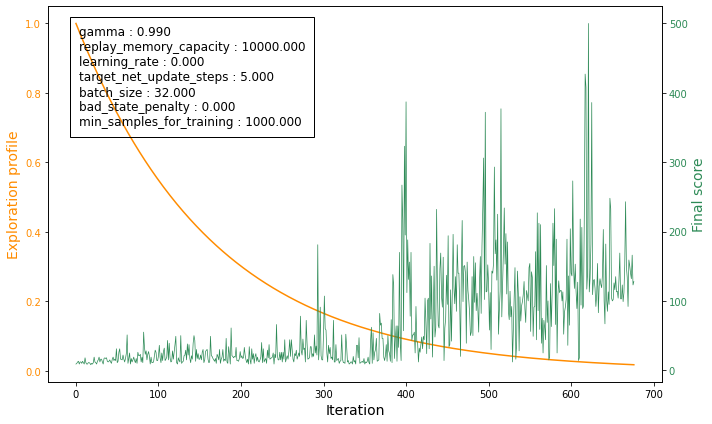

In [94]:
plot_profile_score(cnn_expl_prof[:677], training_score, cnn_params)

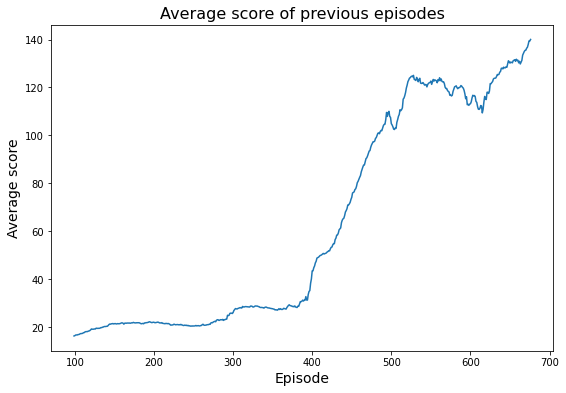

In [96]:
fig, ax = plt.subplots(figsize=(9,6))

plt.plot(np.arange(99,677), avg_window(training_score, 100))
plt.xlabel('Episode', fontsize=14)
plt.ylabel('Average score', fontsize=14)
plt.title('Average score of previous episodes', fontsize=16)
plt.show()

In [93]:
torch.save(policy_net.state_dict(), 'pix_cartpole_FINAL')

In [36]:
## DEEPMIND ARCHITECTURE, EXPONENTIAL EXPLORATION PROFILE
## IMG SIZE = 100X100
# Initialize the Gym environment
env_pix = gym.make('CartPole-v1') 
rnd_seed() # Set a random seed for the environment (reproducible results)
env_pix.seed(seed)

# number of consecutive frames -1 
# used to infer velocities 
ml = 3

training_score = []
obs_history = deque(maxlen=ml)

### Initialization
# print('Initialising...')
replay_mem, policy_net, target_net, optimizer, loss_fn = initialize_cnn(cnn_params)

# policy_net.load_state_dict(torch.load('cartpole_pix_crop', map_location=torch.device('cpu')))
policy_net.to(device)

# print('Initialising frame history...')
for i in range(ml): 
    obs_history.append(np.zeros((1, 100, 100) ))

In [37]:
## DEEPMIND ARCHITECTURE, EXPONENTIAL EXPLORATION PROFILE
## IMG SIZE = 100X100
for episode_num, tau in enumerate(tqdm(cnn_expl_prof)):
    # Reset the environment and get the initial state
    state = env_pix.reset()
    obs = get_frame(env_pix)
    # Reset the score. The final score will be the total amount of steps before the pole falls
    score = 0
    done = False
    # Go on until the pole falls off
#     print('Updating frames...')
    for i in range(ml):
#         print('...', i, '...')
        obs = np.append( obs, obs_history[-i-1], axis=0)
    # obs is now 4 consecutive frames     
    
    while not done:
        # Adding history
#         print('History...')
        for i in range(ml):
            if obs_history[i] is None: obs_history[i] = np.zeros((1, 100, 100))
        # append frame to history
        obs_history.append(obs[0][np.newaxis, :])
        
#         print('Choosing action...')
        # Choose the action following the policy
        # action, q_values = choose_action_softmax_pix(policy_net, from_frame_to_tens(obs), temperature=tau)
        action, q_values = choose_action_epsilon_greedy_pix(policy_net, from_frame_to_tens(obs), tau)

        # Apply the action and get the next state, the reward and a flag "done" that is True if the game is ended
        next_state, reward, done, info = env_pix.step(action)
        next_obs = get_frame(env_pix)
        
#         print('History...')
        # update frame history 
        for i in range(ml):
            next_obs = np.append( next_obs, obs_history[-i-1], axis=0) 
        
        # Reward penalty when the cart is far from the centre
        off_cen_penalty = 1.
        reward = reward - off_cen_penalty * np.abs(state[0]) 

        # Update the final score (+1 for each step)
        score += 1
        # Apply penalty for bad state
        if done: # if the pole has fallen down 
            reward += cnn_params['bad_state_penalty']
            next_state = None
            next_obs = None

        # Update the replay memory
        replay_mem.push(obs, action, next_obs, reward)

        # Update the network
        if len(replay_mem) > cnn_params['min_samples_for_training']: # we enable the training only if we have enough samples in the replay memory, otherwise the training will use the same samples too often
            update_step_pix(policy_net, target_net, replay_mem, optimizer, loss_fn, cnn_params)

        # Set the current state for the next iteration
        obs = next_obs
        state = next_state

    # Update the target network every target_net_update_steps episodes
    if episode_num % cnn_params['target_net_update_steps'] == 0:
#         print('Updating target network...')
        target_net.load_state_dict(policy_net.state_dict()) # This will copy the weights of the policy network to the target network

    # Print the final score
    print(f"EPISODE: {episode_num + 1} - FINAL SCORE: {score} - Temperature: {tau}") # Print the final score
    if episode_num > 10:
      print(f"            - Last10avg: {avg_window(training_score, 10)[-1]}")
    if episode_num >= 50:
      print(f"            - Last50avg: {avg_window(training_score, 50)[-1]}")

    training_score.append(score)
    
env_pix.close()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



EPISODE: 1 - FINAL SCORE: 10 - Temperature: 1.0

EPISODE: 2 - FINAL SCORE: 9 - Temperature: 0.9940179640539353

EPISODE: 3 - FINAL SCORE: 9 - Temperature: 0.9880717128619305

EPISODE: 4 - FINAL SCORE: 9 - Temperature: 0.9821610323583008

EPISODE: 5 - FINAL SCORE: 13 - Temperature: 0.9762857097579093

EPISODE: 6 - FINAL SCORE: 9 - Temperature: 0.9704455335485082

EPISODE: 7 - FINAL SCORE: 9 - Temperature: 0.9646402934831231

EPISODE: 8 - FINAL SCORE: 9 - Temperature: 0.9588697805724845

EPISODE: 9 - FINAL SCORE: 8 - Temperature: 0.9531337870775047

EPISODE: 10 - FINAL SCORE: 10 - Temperature: 0.9474321065017983

EPISODE: 11 - FINAL SCORE: 10 - Temperature: 0.9417645335842487

EPISODE: 12 - FINAL SCORE: 9 - Temperature: 0.9361308642916188

- Last10avg: 9.5

EPISODE: 13 - FINAL SCORE: 9 - Temperature: 0.9305308958112057

- Last10avg: 9.500000000000002

EPISODE: 14 - FINAL SCORE: 12 - Temperature: 0.9249644265435393

- Last10avg: 9.5

EPISODE: 15 - FINAL SCORE: 12 - Temperature: 0.9194312560951247

- Last10avg: 9.8

EPISODE: 16 - FINAL SCORE: 10 - Temperature: 0.9139311852712282

- Last10avg: 9.7

EPISODE: 17 - FINAL SCORE: 10 - Temperature: 0.9084640160687062

- Last10avg: 9.8

EPISODE: 18 - FINAL SCORE: 13 - Temperature: 0.9030295516688768

- Last10avg: 9.900000000000002

EPISODE: 19 - FINAL SCORE: 11 - Temperature: 0.8976275964304349

- Last10avg: 10.3

EPISODE: 20 - FINAL SCORE: 13 - Temperature: 0.8922579558824083

- Last10avg: 10.6

EPISODE: 21 - FINAL SCORE: 11 - Temperature: 0.8869204367171575

- Last10avg: 10.9

EPISODE: 22 - FINAL SCORE: 10 - Temperature: 0.8816148467834161

- Last10avg: 11.0

EPISODE: 23 - FINAL SCORE: 10 - Temperature: 0.8763409950793732

- Last10avg: 11.100000000000001

EPISODE: 24 - FINAL SCORE: 13 - Temperature: 0.8710986917457983

- Last10avg: 11.200000000000001

EPISODE: 25 - FINAL SCORE: 15 - Temperature: 0.865887748059205

- Last10avg: 11.3

EPISODE: 26 - FINAL SCORE: 10 - Temperature: 0.8607079764250578

- Last10avg: 11.600000000000001

EPISODE: 27 - FINAL SCORE: 11 - Temperature: 0.8555591903710185

- Last10avg: 11.600000000000001

EPISODE: 28 - FINAL SCORE: 12 - Temperature: 0.850441204540233

- Last10avg: 11.700000000000001

EPISODE: 29 - FINAL SCORE: 13 - Temperature: 0.8453538346846587

- Last10avg: 11.600000000000001

EPISODE: 30 - FINAL SCORE: 11 - Temperature: 0.8402968976584314

- Last10avg: 11.8

EPISODE: 31 - FINAL SCORE: 15 - Temperature: 0.835270211411272

- Last10avg: 11.6

EPISODE: 32 - FINAL SCORE: 11 - Temperature: 0.8302735949819326

- Last10avg: 12.000000000000002

EPISODE: 33 - FINAL SCORE: 14 - Temperature: 0.8253068684916823

- Last10avg: 12.1

EPISODE: 34 - FINAL SCORE: 16 - Temperature: 0.8203698531378311

- Last10avg: 12.5

EPISODE: 35 - FINAL SCORE: 11 - Temperature: 0.8154623711872927

- Last10avg: 12.8

EPISODE: 36 - FINAL SCORE: 11 - Temperature: 0.8105842459701871

- Last10avg: 12.4

EPISODE: 37 - FINAL SCORE: 13 - Temperature: 0.8057353018734796

- Last10avg: 12.5

EPISODE: 38 - FINAL SCORE: 12 - Temperature: 0.8009153643346592

- Last10avg: 12.7

EPISODE: 39 - FINAL SCORE: 14 - Temperature: 0.7961242598354538

- Last10avg: 12.7

EPISODE: 40 - FINAL SCORE: 8 - Temperature: 0.7913618158955839

- Last10avg: 12.800000000000002

EPISODE: 41 - FINAL SCORE: 9 - Temperature: 0.7866278610665535

- Last10avg: 12.500000000000002

EPISODE: 42 - FINAL SCORE: 16 - Temperature: 0.7819222249254772

- Last10avg: 11.9

EPISODE: 43 - FINAL SCORE: 10 - Temperature: 0.7772447380689461

- Last10avg: 12.4

EPISODE: 44 - FINAL SCORE: 11 - Temperature: 0.772595232106928

- Last10avg: 12.000000000000002

EPISODE: 45 - FINAL SCORE: 8 - Temperature: 0.7679735396567061

- Last10avg: 11.5

EPISODE: 46 - FINAL SCORE: 11 - Temperature: 0.7633794943368531

- Last10avg: 11.200000000000001

EPISODE: 47 - FINAL SCORE: 17 - Temperature: 0.7588129307612413

- Last10avg: 11.200000000000001

EPISODE: 48 - FINAL SCORE: 9 - Temperature: 0.754273684533089

- Last10avg: 11.600000000000001

EPISODE: 49 - FINAL SCORE: 15 - Temperature: 0.7497615922390413

- Last10avg: 11.300000000000002

EPISODE: 50 - FINAL SCORE: 12 - Temperature: 0.7452764914432886

- Last10avg: 11.4

EPISODE: 51 - FINAL SCORE: 25 - Temperature: 0.7408182206817179

- Last10avg: 11.8

- Last50avg: 11.26

EPISODE: 52 - FINAL SCORE: 9 - Temperature: 0.7363866194561001

- Last10avg: 13.399999999999999

- Last50avg: 11.56

EPISODE: 53 - FINAL SCORE: 14 - Temperature: 0.7319815282283126

- Last10avg: 12.700000000000001

- Last50avg: 11.559999999999999

EPISODE: 54 - FINAL SCORE: 16 - Temperature: 0.7276027884145955

- Last10avg: 13.100000000000001

- Last50avg: 11.659999999999998

EPISODE: 55 - FINAL SCORE: 14 - Temperature: 0.7232502423798424

- Last10avg: 13.600000000000001

- Last50avg: 11.799999999999999

EPISODE: 56 - FINAL SCORE: 14 - Temperature: 0.7189237334319262

- Last10avg: 14.200000000000001

- Last50avg: 11.82

EPISODE: 57 - FINAL SCORE: 10 - Temperature: 0.7146231058160573

- Last10avg: 14.5

- Last50avg: 11.919999999999998

EPISODE: 58 - FINAL SCORE: 8 - Temperature: 0.7103482047091773

- Last10avg: 13.8

- Last50avg: 11.94

EPISODE: 59 - FINAL SCORE: 37 - Temperature: 0.7060988762143844

- Last10avg: 13.700000000000003

- Last50avg: 11.92

EPISODE: 60 - FINAL SCORE: 23 - Temperature: 0.701874967355394

- Last10avg: 15.900000000000002

- Last50avg: 12.5

EPISODE: 61 - FINAL SCORE: 16 - Temperature: 0.697676326071031

- Last10avg: 17.000000000000004

- Last50avg: 12.76

EPISODE: 62 - FINAL SCORE: 29 - Temperature: 0.6935028012097558

- Last10avg: 16.100000000000005

- Last50avg: 12.880000000000003

EPISODE: 63 - FINAL SCORE: 10 - Temperature: 0.6893542425242224

- Last10avg: 18.1

- Last50avg: 13.280000000000001

EPISODE: 64 - FINAL SCORE: 16 - Temperature: 0.6852305006658703

- Last10avg: 17.700000000000003

- Last50avg: 13.299999999999999

EPISODE: 65 - FINAL SCORE: 17 - Temperature: 0.6811314271795471

- Last10avg: 17.700000000000003

- Last50avg: 13.379999999999999

EPISODE: 66 - FINAL SCORE: 12 - Temperature: 0.6770568744981647

- Last10avg: 18.0

- Last50avg: 13.48

EPISODE: 67 - FINAL SCORE: 16 - Temperature: 0.6730066959373864

- Last10avg: 17.8

- Last50avg: 13.52

EPISODE: 68 - FINAL SCORE: 19 - Temperature: 0.6689807456903467

- Last10avg: 18.400000000000002

- Last50avg: 13.64

EPISODE: 69 - FINAL SCORE: 16 - Temperature: 0.6649788788224019

- Last10avg: 19.5

- Last50avg: 13.760000000000002

EPISODE: 70 - FINAL SCORE: 23 - Temperature: 0.6610009512659124

- Last10avg: 17.400000000000002

- Last50avg: 13.860000000000001

EPISODE: 71 - FINAL SCORE: 23 - Temperature: 0.6570468198150567

- Last10avg: 17.4

- Last50avg: 14.060000000000002

EPISODE: 72 - FINAL SCORE: 10 - Temperature: 0.6531163421206756

- Last10avg: 18.1

- Last50avg: 14.300000000000002

EPISODE: 73 - FINAL SCORE: 16 - Temperature: 0.6492093766851474

- Last10avg: 16.200000000000003

- Last50avg: 14.3

EPISODE: 74 - FINAL SCORE: 35 - Temperature: 0.6453257828572946

- Last10avg: 16.8

- Last50avg: 14.42

EPISODE: 75 - FINAL SCORE: 42 - Temperature: 0.6414654208273199

- Last10avg: 18.700000000000003

- Last50avg: 14.86

EPISODE: 76 - FINAL SCORE: 16 - Temperature: 0.6376281516217733

- Last10avg: 21.2

- Last50avg: 15.399999999999999

EPISODE: 77 - FINAL SCORE: 35 - Temperature: 0.6338138370985491

- Last10avg: 21.6

- Last50avg: 15.52

EPISODE: 78 - FINAL SCORE: 35 - Temperature: 0.6300223399419123

- Last10avg: 23.500000000000004

- Last50avg: 16.0

EPISODE: 79 - FINAL SCORE: 18 - Temperature: 0.6262535236575559

- Last10avg: 25.1

- Last50avg: 16.46

EPISODE: 80 - FINAL SCORE: 13 - Temperature: 0.6225072525676868

- Last10avg: 25.300000000000004

- Last50avg: 16.56

EPISODE: 81 - FINAL SCORE: 14 - Temperature: 0.6187833918061408

- Last10avg: 24.300000000000004

- Last50avg: 16.6

EPISODE: 82 - FINAL SCORE: 53 - Temperature: 0.6150818073135287

- Last10avg: 23.4

- Last50avg: 16.580000000000002

EPISODE: 83 - FINAL SCORE: 34 - Temperature: 0.6114023658324087

- Last10avg: 27.7

- Last50avg: 17.419999999999998

EPISODE: 84 - FINAL SCORE: 17 - Temperature: 0.6077449349024902

- Last10avg: 29.5

- Last50avg: 17.819999999999997

EPISODE: 85 - FINAL SCORE: 15 - Temperature: 0.6041093828558647

- Last10avg: 27.7

- Last50avg: 17.84

EPISODE: 86 - FINAL SCORE: 15 - Temperature: 0.6004955788122659

- Last10avg: 25.000000000000004

- Last50avg: 17.92

EPISODE: 87 - FINAL SCORE: 26 - Temperature: 0.596903392674358

- Last10avg: 24.900000000000002

- Last50avg: 18.0

EPISODE: 88 - FINAL SCORE: 11 - Temperature: 0.593332695123052

- Last10avg: 24.000000000000004

- Last50avg: 18.259999999999998

EPISODE: 89 - FINAL SCORE: 29 - Temperature: 0.5897833576128504

- Last10avg: 21.600000000000005

- Last50avg: 18.24

EPISODE: 90 - FINAL SCORE: 33 - Temperature: 0.5862552523672196

- Last10avg: 22.700000000000003

- Last50avg: 18.54

EPISODE: 91 - FINAL SCORE: 19 - Temperature: 0.5827482523739896

- Last10avg: 24.700000000000006

- Last50avg: 19.04

EPISODE: 92 - FINAL SCORE: 13 - Temperature: 0.579262231380782

- Last10avg: 25.200000000000006

- Last50avg: 19.240000000000002

EPISODE: 93 - FINAL SCORE: 11 - Temperature: 0.5757970638904645

- Last10avg: 21.2

- Last50avg: 19.18

EPISODE: 94 - FINAL SCORE: 15 - Temperature: 0.5723526251566332

- Last10avg: 18.900000000000002

- Last50avg: 19.2

EPISODE: 95 - FINAL SCORE: 14 - Temperature: 0.5689287911791218

- Last10avg: 18.700000000000003

- Last50avg: 19.279999999999998

EPISODE: 96 - FINAL SCORE: 25 - Temperature: 0.5655254386995371

- Last10avg: 18.6

- Last50avg: 19.400000000000002

EPISODE: 97 - FINAL SCORE: 19 - Temperature: 0.5621424451968224

- Last10avg: 19.6

- Last50avg: 19.68

EPISODE: 98 - FINAL SCORE: 10 - Temperature: 0.5587796888828462

- Last10avg: 18.9

- Last50avg: 19.72

EPISODE: 99 - FINAL SCORE: 11 - Temperature: 0.5554370486980182

- Last10avg: 18.8

- Last50avg: 19.740000000000002

EPISODE: 100 - FINAL SCORE: 26 - Temperature: 0.5521144043069306

- Last10avg: 17.0

- Last50avg: 19.66

EPISODE: 101 - FINAL SCORE: 21 - Temperature: 0.5488116360940264

- Last10avg: 16.3

- Last50avg: 19.94

EPISODE: 102 - FINAL SCORE: 19 - Temperature: 0.5455286251592933

- Last10avg: 16.5

- Last50avg: 19.860000000000003

EPISODE: 103 - FINAL SCORE: 13 - Temperature: 0.5422652533139832

- Last10avg: 17.099999999999998

- Last50avg: 20.06

EPISODE: 104 - FINAL SCORE: 13 - Temperature: 0.539021403076357

- Last10avg: 17.3

- Last50avg: 20.04

EPISODE: 105 - FINAL SCORE: 28 - Temperature: 0.535796957667456

- Last10avg: 17.1

- Last50avg: 19.980000000000004

EPISODE: 106 - FINAL SCORE: 13 - Temperature: 0.5325918010068972

- Last10avg: 18.5

- Last50avg: 20.26

EPISODE: 107 - FINAL SCORE: 13 - Temperature: 0.5294058177086945

- Last10avg: 17.3

- Last50avg: 20.240000000000002

EPISODE: 108 - FINAL SCORE: 42 - Temperature: 0.5262388930771054

- Last10avg: 16.700000000000003

- Last50avg: 20.300000000000004

EPISODE: 109 - FINAL SCORE: 29 - Temperature: 0.5230909131025008

- Last10avg: 19.900000000000006

- Last50avg: 20.98

EPISODE: 110 - FINAL SCORE: 12 - Temperature: 0.5199617644572618

- Last10avg: 21.700000000000003

- Last50avg: 20.819999999999997

EPISODE: 111 - FINAL SCORE: 12 - Temperature: 0.5168513344916992

- Last10avg: 20.3

- Last50avg: 20.599999999999998

EPISODE: 112 - FINAL SCORE: 34 - Temperature: 0.5137595112299983

- Last10avg: 19.4

- Last50avg: 20.519999999999996

EPISODE: 113 - FINAL SCORE: 32 - Temperature: 0.5106861833661879

- Last10avg: 20.9

- Last50avg: 20.62

EPISODE: 114 - FINAL SCORE: 19 - Temperature: 0.5076312402601327

- Last10avg: 22.8

- Last50avg: 21.060000000000002

EPISODE: 115 - FINAL SCORE: 51 - Temperature: 0.5045945719335512

- Last10avg: 23.400000000000002

- Last50avg: 21.12

EPISODE: 116 - FINAL SCORE: 8 - Temperature: 0.5015760690660555

- Last10avg: 25.700000000000003

- Last50avg: 21.8

EPISODE: 117 - FINAL SCORE: 13 - Temperature: 0.4985756229912165

- Last10avg: 25.200000000000003

- Last50avg: 21.72

EPISODE: 118 - FINAL SCORE: 16 - Temperature: 0.4955931256926514

- Last10avg: 25.200000000000003

- Last50avg: 21.660000000000004

EPISODE: 119 - FINAL SCORE: 43 - Temperature: 0.49262846980013547

- Last10avg: 22.600000000000005

- Last50avg: 21.6

EPISODE: 120 - FINAL SCORE: 16 - Temperature: 0.4896815485857362

- Last10avg: 24.000000000000004

- Last50avg: 22.14

EPISODE: 121 - FINAL SCORE: 16 - Temperature: 0.4867522559599717

- Last10avg: 24.400000000000006

- Last50avg: 22.0

EPISODE: 122 - FINAL SCORE: 12 - Temperature: 0.483840486467991

- Last10avg: 24.800000000000008

- Last50avg: 21.86

EPISODE: 123 - FINAL SCORE: 16 - Temperature: 0.480946135285778

- Last10avg: 22.600000000000005

- Last50avg: 21.9

EPISODE: 124 - FINAL SCORE: 17 - Temperature: 0.4780690982163776

- Last10avg: 21.000000000000004

- Last50avg: 21.9

EPISODE: 125 - FINAL SCORE: 13 - Temperature: 0.47520927168614446

- Last10avg: 20.8

- Last50avg: 21.540000000000003

EPISODE: 126 - FINAL SCORE: 20 - Temperature: 0.4723665527410147

- Last10avg: 17.0

- Last50avg: 20.96

EPISODE: 127 - FINAL SCORE: 9 - Temperature: 0.46954083904279925

- Last10avg: 18.200000000000003

- Last50avg: 21.040000000000003

EPISODE: 128 - FINAL SCORE: 18 - Temperature: 0.46673202886549986

- Last10avg: 17.8

- Last50avg: 20.519999999999996

EPISODE: 129 - FINAL SCORE: 36 - Temperature: 0.4639400210916467

- Last10avg: 18.0

- Last50avg: 20.18

EPISODE: 130 - FINAL SCORE: 17 - Temperature: 0.4611647152086584

- Last10avg: 17.3

- Last50avg: 20.54

EPISODE: 131 - FINAL SCORE: 24 - Temperature: 0.4584060113052235

- Last10avg: 17.400000000000002

- Last50avg: 20.619999999999997

EPISODE: 132 - FINAL SCORE: 23 - Temperature: 0.4556638100677035

- Last10avg: 18.200000000000003

- Last50avg: 20.82

EPISODE: 133 - FINAL SCORE: 21 - Temperature: 0.4529380127765577

- Last10avg: 19.3

- Last50avg: 20.220000000000002

EPISODE: 134 - FINAL SCORE: 39 - Temperature: 0.45022852130278923

- Last10avg: 19.8

- Last50avg: 19.960000000000004

EPISODE: 135 - FINAL SCORE: 22 - Temperature: 0.44753523810441237

- Last10avg: 22.0

- Last50avg: 20.400000000000006

EPISODE: 136 - FINAL SCORE: 24 - Temperature: 0.4448580662229411

- Last10avg: 22.900000000000002

- Last50avg: 20.540000000000003

EPISODE: 137 - FINAL SCORE: 34 - Temperature: 0.44219690927989863

- Last10avg: 23.300000000000004

- Last50avg: 20.720000000000002

EPISODE: 138 - FINAL SCORE: 23 - Temperature: 0.43955167147334756

- Last10avg: 25.799999999999997

- Last50avg: 20.880000000000003

EPISODE: 139 - FINAL SCORE: 23 - Temperature: 0.43692225757444114

- Last10avg: 26.3

- Last50avg: 21.12

EPISODE: 140 - FINAL SCORE: 21 - Temperature: 0.43430857292399505

- Last10avg: 25.0

- Last50avg: 21.0

EPISODE: 141 - FINAL SCORE: 20 - Temperature: 0.4317105234290797

- Last10avg: 25.400000000000006

- Last50avg: 20.76

EPISODE: 142 - FINAL SCORE: 21 - Temperature: 0.4291280155596326

- Last10avg: 25.000000000000004

- Last50avg: 20.78

EPISODE: 143 - FINAL SCORE: 39 - Temperature: 0.42656095634509145

- Last10avg: 24.800000000000004

- Last50avg: 20.94

EPISODE: 144 - FINAL SCORE: 24 - Temperature: 0.42400925337104733

- Last10avg: 26.6

- Last50avg: 21.500000000000004

EPISODE: 145 - FINAL SCORE: 55 - Temperature: 0.42147281477591764

- Last10avg: 25.1

- Last50avg: 21.680000000000003

EPISODE: 146 - FINAL SCORE: 16 - Temperature: 0.41895154924763905

- Last10avg: 28.4

- Last50avg: 22.500000000000004

EPISODE: 147 - FINAL SCORE: 23 - Temperature: 0.4164453660203801

- Last10avg: 27.6

- Last50avg: 22.32

EPISODE: 148 - FINAL SCORE: 15 - Temperature: 0.4139541748712741

- Last10avg: 26.500000000000004

- Last50avg: 22.4

EPISODE: 149 - FINAL SCORE: 22 - Temperature: 0.4114778861171706

- Last10avg: 25.700000000000003

- Last50avg: 22.500000000000004

EPISODE: 150 - FINAL SCORE: 10 - Temperature: 0.409016410611407

- Last10avg: 25.6

- Last50avg: 22.720000000000002

EPISODE: 151 - FINAL SCORE: 12 - Temperature: 0.40656965974059917

- Last10avg: 24.5

- Last50avg: 22.4

EPISODE: 152 - FINAL SCORE: 12 - Temperature: 0.4041375454214516

- Last10avg: 23.7

- Last50avg: 22.22

EPISODE: 153 - FINAL SCORE: 20 - Temperature: 0.4017199800975861

- Last10avg: 22.8

- Last50avg: 22.08

EPISODE: 154 - FINAL SCORE: 18 - Temperature: 0.3993168767363899

- Last10avg: 20.9

- Last50avg: 22.22

EPISODE: 155 - FINAL SCORE: 53 - Temperature: 0.3969281488258825

- Last10avg: 20.3

- Last50avg: 22.32

EPISODE: 156 - FINAL SCORE: 20 - Temperature: 0.39455371037160114

- Last10avg: 20.1

- Last50avg: 22.819999999999997

EPISODE: 157 - FINAL SCORE: 14 - Temperature: 0.392193475893505

- Last10avg: 20.5

- Last50avg: 22.959999999999997

EPISODE: 158 - FINAL SCORE: 17 - Temperature: 0.38984736042289797

- Last10avg: 19.6

- Last50avg: 22.98

EPISODE: 159 - FINAL SCORE: 15 - Temperature: 0.38751527949936976

- Last10avg: 19.8

- Last50avg: 22.48

EPISODE: 160 - FINAL SCORE: 16 - Temperature: 0.3851971491677552

- Last10avg: 19.1

- Last50avg: 22.200000000000003

EPISODE: 161 - FINAL SCORE: 44 - Temperature: 0.38289288597511206

- Last10avg: 19.700000000000003

- Last50avg: 22.28

EPISODE: 162 - FINAL SCORE: 16 - Temperature: 0.38060240696771647

- Last10avg: 22.900000000000006

- Last50avg: 22.919999999999998

EPISODE: 163 - FINAL SCORE: 11 - Temperature: 0.3783256296880768

- Last10avg: 23.300000000000004

- Last50avg: 22.56

EPISODE: 164 - FINAL SCORE: 24 - Temperature: 0.37606247217196515

- Last10avg: 22.400000000000006

- Last50avg: 22.14

EPISODE: 165 - FINAL SCORE: 12 - Temperature: 0.3738128529454665

- Last10avg: 23.000000000000007

- Last50avg: 22.24

EPISODE: 166 - FINAL SCORE: 15 - Temperature: 0.3715766910220457

- Last10avg: 18.900000000000002

- Last50avg: 21.46

EPISODE: 167 - FINAL SCORE: 21 - Temperature: 0.369353905899632

- Last10avg: 18.400000000000002

- Last50avg: 21.6

EPISODE: 168 - FINAL SCORE: 34 - Temperature: 0.36714441755772104

- Last10avg: 19.1

- Last50avg: 21.76

EPISODE: 169 - FINAL SCORE: 15 - Temperature: 0.36494814645449375

- Last10avg: 20.800000000000004

- Last50avg: 22.120000000000005

EPISODE: 170 - FINAL SCORE: 24 - Temperature: 0.36276501352395324

- Last10avg: 20.8

- Last50avg: 21.56

EPISODE: 171 - FINAL SCORE: 23 - Temperature: 0.3605949401730783

- Last10avg: 21.6

- Last50avg: 21.72

EPISODE: 172 - FINAL SCORE: 15 - Temperature: 0.3584378482789939

- Last10avg: 19.500000000000004

- Last50avg: 21.860000000000003

EPISODE: 173 - FINAL SCORE: 30 - Temperature: 0.3562936601861588

- Last10avg: 19.400000000000002

- Last50avg: 21.92

EPISODE: 174 - FINAL SCORE: 11 - Temperature: 0.35416229870357036

- Last10avg: 21.3

- Last50avg: 22.200000000000003

EPISODE: 175 - FINAL SCORE: 20 - Temperature: 0.3520436871019846

- Last10avg: 20.000000000000004

- Last50avg: 22.080000000000002

EPISODE: 176 - FINAL SCORE: 15 - Temperature: 0.34993774911115544

- Last10avg: 20.800000000000004

- Last50avg: 22.22

EPISODE: 177 - FINAL SCORE: 19 - Temperature: 0.3478444089170874

- Last10avg: 20.800000000000004

- Last50avg: 22.12

EPISODE: 178 - FINAL SCORE: 39 - Temperature: 0.3457635911593078

- Last10avg: 20.6

- Last50avg: 22.32

EPISODE: 179 - FINAL SCORE: 36 - Temperature: 0.34369522092815236

- Last10avg: 21.1

- Last50avg: 22.74

EPISODE: 180 - FINAL SCORE: 10 - Temperature: 0.34163922376206957

- Last10avg: 23.200000000000003

- Last50avg: 22.74

EPISODE: 181 - FINAL SCORE: 10 - Temperature: 0.3395955256449391

- Last10avg: 21.800000000000004

- Last50avg: 22.599999999999998

EPISODE: 182 - FINAL SCORE: 27 - Temperature: 0.3375640530034084

- Last10avg: 20.5

- Last50avg: 22.32

EPISODE: 183 - FINAL SCORE: 11 - Temperature: 0.3355447327042427

- Last10avg: 21.7

- Last50avg: 22.400000000000002

EPISODE: 184 - FINAL SCORE: 22 - Temperature: 0.33353749205169325

- Last10avg: 19.8

- Last50avg: 22.2

EPISODE: 185 - FINAL SCORE: 19 - Temperature: 0.3315422587848797

- Last10avg: 20.900000000000002

- Last50avg: 21.860000000000003

EPISODE: 186 - FINAL SCORE: 48 - Temperature: 0.3295589610751891

- Last10avg: 20.8

- Last50avg: 21.8

EPISODE: 187 - FINAL SCORE: 50 - Temperature: 0.3275875275236895

- Last10avg: 24.1

- Last50avg: 22.28

EPISODE: 188 - FINAL SCORE: 12 - Temperature: 0.3256278871585604

- Last10avg: 27.2

- Last50avg: 22.6

EPISODE: 189 - FINAL SCORE: 21 - Temperature: 0.3236799694325367

- Last10avg: 24.500000000000004

- Last50avg: 22.38

EPISODE: 190 - FINAL SCORE: 15 - Temperature: 0.3217437042203702

- Last10avg: 23.000000000000004

- Last50avg: 22.34

EPISODE: 191 - FINAL SCORE: 24 - Temperature: 0.31981902181630384

- Last10avg: 23.500000000000004

- Last50avg: 22.220000000000002

EPISODE: 192 - FINAL SCORE: 10 - Temperature: 0.31790585293156354

- Last10avg: 24.900000000000006

- Last50avg: 22.300000000000004

EPISODE: 193 - FINAL SCORE: 33 - Temperature: 0.31600412869186245

- Last10avg: 23.200000000000003

- Last50avg: 22.080000000000002

EPISODE: 194 - FINAL SCORE: 28 - Temperature: 0.31411378063492296

- Last10avg: 25.400000000000002

- Last50avg: 21.96

EPISODE: 195 - FINAL SCORE: 18 - Temperature: 0.3122347407080105

- Last10avg: 26.0

- Last50avg: 22.04

EPISODE: 196 - FINAL SCORE: 33 - Temperature: 0.31036694126548503

- Last10avg: 25.900000000000002

- Last50avg: 21.3

EPISODE: 197 - FINAL SCORE: 25 - Temperature: 0.30851031506636467

- Last10avg: 24.400000000000002

- Last50avg: 21.64

EPISODE: 198 - FINAL SCORE: 11 - Temperature: 0.306664795271906

- Last10avg: 21.900000000000002

- Last50avg: 21.68

EPISODE: 199 - FINAL SCORE: 18 - Temperature: 0.3048303154431968

- Last10avg: 21.800000000000004

- Last50avg: 21.599999999999998

EPISODE: 200 - FINAL SCORE: 48 - Temperature: 0.3030068095387654

- Last10avg: 21.500000000000004

- Last50avg: 21.52

EPISODE: 201 - FINAL SCORE: 17 - Temperature: 0.301194211912202

- Last10avg: 24.800000000000004

- Last50avg: 22.28

EPISODE: 202 - FINAL SCORE: 14 - Temperature: 0.2993924573097967

- Last10avg: 24.1

- Last50avg: 22.38

EPISODE: 203 - FINAL SCORE: 26 - Temperature: 0.2976014808681888

- Last10avg: 24.5

- Last50avg: 22.42

EPISODE: 204 - FINAL SCORE: 10 - Temperature: 0.2958212181120332

- Last10avg: 23.8

- Last50avg: 22.540000000000003

EPISODE: 205 - FINAL SCORE: 15 - Temperature: 0.29405160495167837

- Last10avg: 22.000000000000004

- Last50avg: 22.38

EPISODE: 206 - FINAL SCORE: 9 - Temperature: 0.2922925776808594

- Last10avg: 21.700000000000003

- Last50avg: 21.619999999999997

EPISODE: 207 - FINAL SCORE: 24 - Temperature: 0.2905440729744046

- Last10avg: 19.3

- Last50avg: 21.4

EPISODE: 208 - FINAL SCORE: 29 - Temperature: 0.28880602788595566

- Last10avg: 19.200000000000003

- Last50avg: 21.599999999999998

EPISODE: 209 - FINAL SCORE: 14 - Temperature: 0.28707837984570167

- Last10avg: 21.0

- Last50avg: 21.84

EPISODE: 210 - FINAL SCORE: 23 - Temperature: 0.28536106665812666

- Last10avg: 20.6

- Last50avg: 21.82

EPISODE: 211 - FINAL SCORE: 26 - Temperature: 0.2836540264997704

- Last10avg: 18.1

- Last50avg: 21.96

EPISODE: 212 - FINAL SCORE: 15 - Temperature: 0.28195719791700274

- Last10avg: 19.000000000000004

- Last50avg: 21.6

EPISODE: 213 - FINAL SCORE: 54 - Temperature: 0.28027051982381157

- Last10avg: 19.1

- Last50avg: 21.58

EPISODE: 214 - FINAL SCORE: 17 - Temperature: 0.27859393149960326

- Last10avg: 21.9

- Last50avg: 22.439999999999998

EPISODE: 215 - FINAL SCORE: 18 - Temperature: 0.2769273725870171

- Last10avg: 22.6

- Last50avg: 22.299999999999997

EPISODE: 216 - FINAL SCORE: 28 - Temperature: 0.27527078308975234

- Last10avg: 22.900000000000002

- Last50avg: 22.419999999999998

EPISODE: 217 - FINAL SCORE: 19 - Temperature: 0.27362410337040804

- Last10avg: 24.8

- Last50avg: 22.679999999999996

EPISODE: 218 - FINAL SCORE: 21 - Temperature: 0.2719872741483365

- Last10avg: 24.3

- Last50avg: 22.639999999999997

EPISODE: 219 - FINAL SCORE: 23 - Temperature: 0.270360236497509

- Last10avg: 23.500000000000004

- Last50avg: 22.38

EPISODE: 220 - FINAL SCORE: 9 - Temperature: 0.26874293184439435

- Last10avg: 24.400000000000002

- Last50avg: 22.540000000000003

EPISODE: 221 - FINAL SCORE: 26 - Temperature: 0.26713530196585034

- Last10avg: 23.0

- Last50avg: 22.240000000000002

EPISODE: 222 - FINAL SCORE: 10 - Temperature: 0.2655372889870278

- Last10avg: 23.000000000000004

- Last50avg: 22.299999999999997

EPISODE: 223 - FINAL SCORE: 20 - Temperature: 0.2639488353792868

- Last10avg: 22.5

- Last50avg: 22.199999999999996

EPISODE: 224 - FINAL SCORE: 15 - Temperature: 0.262369883958126

- Last10avg: 19.1

- Last50avg: 21.999999999999996

EPISODE: 225 - FINAL SCORE: 16 - Temperature: 0.26080037788112365

- Last10avg: 18.900000000000002

- Last50avg: 22.08

EPISODE: 226 - FINAL SCORE: 18 - Temperature: 0.2592402606458915

- Last10avg: 18.700000000000003

- Last50avg: 22.0

EPISODE: 227 - FINAL SCORE: 13 - Temperature: 0.25768947608804055

- Last10avg: 17.7

- Last50avg: 22.06

EPISODE: 228 - FINAL SCORE: 17 - Temperature: 0.2561479683791593

- Last10avg: 17.1

- Last50avg: 21.94

EPISODE: 229 - FINAL SCORE: 44 - Temperature: 0.2546156820248037

- Last10avg: 16.700000000000003

- Last50avg: 21.5

EPISODE: 230 - FINAL SCORE: 26 - Temperature: 0.25309256186249957

- Last10avg: 18.800000000000004

- Last50avg: 21.66

EPISODE: 231 - FINAL SCORE: 15 - Temperature: 0.25157855305975646

- Last10avg: 20.5

- Last50avg: 21.98

EPISODE: 232 - FINAL SCORE: 34 - Temperature: 0.2500736011120941

- Last10avg: 19.4

- Last50avg: 22.080000000000002

EPISODE: 233 - FINAL SCORE: 17 - Temperature: 0.24857765184107966

- Last10avg: 21.799999999999997

- Last50avg: 22.220000000000002

EPISODE: 234 - FINAL SCORE: 44 - Temperature: 0.24709065139237796

- Last10avg: 21.499999999999996

- Last50avg: 22.34

EPISODE: 235 - FINAL SCORE: 17 - Temperature: 0.2456125462338122

- Last10avg: 24.4

- Last50avg: 22.779999999999998

EPISODE: 236 - FINAL SCORE: 12 - Temperature: 0.2441432831534371

- Last10avg: 24.500000000000004

- Last50avg: 22.74

EPISODE: 237 - FINAL SCORE: 14 - Temperature: 0.24268280925762298

- Last10avg: 23.9

- Last50avg: 22.019999999999996

EPISODE: 238 - FINAL SCORE: 14 - Temperature: 0.24123107196915192

- Last10avg: 24.0

- Last50avg: 21.3

EPISODE: 239 - FINAL SCORE: 14 - Temperature: 0.2397880190253247

- Last10avg: 23.699999999999996

- Last50avg: 21.340000000000003

EPISODE: 240 - FINAL SCORE: 16 - Temperature: 0.23835359847607956

- Last10avg: 20.699999999999996

- Last50avg: 21.200000000000003

EPISODE: 241 - FINAL SCORE: 23 - Temperature: 0.23692775868212176

- Last10avg: 19.7

- Last50avg: 21.22

EPISODE: 242 - FINAL SCORE: 12 - Temperature: 0.23551044831306475

- Last10avg: 20.5

- Last50avg: 21.200000000000003

EPISODE: 243 - FINAL SCORE: 44 - Temperature: 0.2341016163455822

- Last10avg: 18.3

- Last50avg: 21.24

EPISODE: 244 - FINAL SCORE: 18 - Temperature: 0.23270121206157107

- Last10avg: 21.0

- Last50avg: 21.46

EPISODE: 245 - FINAL SCORE: 20 - Temperature: 0.23130918504632592

- Last10avg: 18.400000000000002

- Last50avg: 21.259999999999998

EPISODE: 246 - FINAL SCORE: 26 - Temperature: 0.22992548518672384

- Last10avg: 18.700000000000003

- Last50avg: 21.299999999999997

EPISODE: 247 - FINAL SCORE: 40 - Temperature: 0.2285500626694205

- Last10avg: 20.1

- Last50avg: 21.16

EPISODE: 248 - FINAL SCORE: 38 - Temperature: 0.22718286797905665

- Last10avg: 22.700000000000003

- Last50avg: 21.46

EPISODE: 249 - FINAL SCORE: 20 - Temperature: 0.22582385189647586

- Last10avg: 25.100000000000005

- Last50avg: 22.0

EPISODE: 250 - FINAL SCORE: 13 - Temperature: 0.22447296549695234

- Last10avg: 25.7

- Last50avg: 22.04

EPISODE: 251 - FINAL SCORE: 42 - Temperature: 0.22313016014842982

- Last10avg: 25.400000000000002

- Last50avg: 21.34

EPISODE: 252 - FINAL SCORE: 16 - Temperature: 0.22179538750977074

- Last10avg: 27.3

- Last50avg: 21.840000000000003

EPISODE: 253 - FINAL SCORE: 28 - Temperature: 0.22046859952901593

- Last10avg: 27.7

- Last50avg: 21.88

EPISODE: 254 - FINAL SCORE: 16 - Temperature: 0.2191497484416548

- Last10avg: 26.100000000000005

- Last50avg: 21.919999999999998

EPISODE: 255 - FINAL SCORE: 20 - Temperature: 0.21783878676890578

- Last10avg: 25.900000000000006

- Last50avg: 22.04

EPISODE: 256 - FINAL SCORE: 27 - Temperature: 0.21653566731600707

- Last10avg: 25.900000000000006

- Last50avg: 22.14

EPISODE: 257 - FINAL SCORE: 37 - Temperature: 0.21524034317051757

- Last10avg: 26.000000000000004

- Last50avg: 22.499999999999996

EPISODE: 258 - FINAL SCORE: 16 - Temperature: 0.21395276770062824

- Last10avg: 25.7

- Last50avg: 22.759999999999998

EPISODE: 259 - FINAL SCORE: 17 - Temperature: 0.21267289455348304

- Last10avg: 23.5

- Last50avg: 22.5

EPISODE: 260 - FINAL SCORE: 19 - Temperature: 0.21140067765351048

- Last10avg: 23.2

- Last50avg: 22.56

EPISODE: 261 - FINAL SCORE: 39 - Temperature: 0.21013607120076472

- Last10avg: 23.8

- Last50avg: 22.479999999999997

EPISODE: 262 - FINAL SCORE: 12 - Temperature: 0.20887902966927693

- Last10avg: 23.5

- Last50avg: 22.74

EPISODE: 263 - FINAL SCORE: 10 - Temperature: 0.2076295078054162

- Last10avg: 23.099999999999998

- Last50avg: 22.68

EPISODE: 264 - FINAL SCORE: 20 - Temperature: 0.20638746062626045

- Last10avg: 21.3

- Last50avg: 21.799999999999997

EPISODE: 265 - FINAL SCORE: 15 - Temperature: 0.20515284341797715

- Last10avg: 21.7

- Last50avg: 21.859999999999996

EPISODE: 266 - FINAL SCORE: 15 - Temperature: 0.20392561173421342

- Last10avg: 21.2

- Last50avg: 21.8

EPISODE: 267 - FINAL SCORE: 14 - Temperature: 0.2027057213944961

- Last10avg: 20.0

- Last50avg: 21.54

EPISODE: 268 - FINAL SCORE: 34 - Temperature: 0.20149312848264125

- Last10avg: 17.7

- Last50avg: 21.44

EPISODE: 269 - FINAL SCORE: 16 - Temperature: 0.20028778934517305

- Last10avg: 19.5

- Last50avg: 21.700000000000003

EPISODE: 270 - FINAL SCORE: 20 - Temperature: 0.1990896605897524

- Last10avg: 19.400000000000002

- Last50avg: 21.560000000000002

EPISODE: 271 - FINAL SCORE: 21 - Temperature: 0.19789869908361465

- Last10avg: 19.500000000000004

- Last50avg: 21.78

EPISODE: 272 - FINAL SCORE: 16 - Temperature: 0.19671486195201704

- Last10avg: 17.7

- Last50avg: 21.68

EPISODE: 273 - FINAL SCORE: 12 - Temperature: 0.1955381065766949

- Last10avg: 18.1

- Last50avg: 21.800000000000004

EPISODE: 274 - FINAL SCORE: 35 - Temperature: 0.19436839059432767

- Last10avg: 18.3

- Last50avg: 21.64

EPISODE: 275 - FINAL SCORE: 13 - Temperature: 0.19320567189501364

- Last10avg: 19.8

- Last50avg: 22.04

EPISODE: 276 - FINAL SCORE: 19 - Temperature: 0.19204990862075408

- Last10avg: 19.6

- Last50avg: 21.98

EPISODE: 277 - FINAL SCORE: 12 - Temperature: 0.19090105916394629

- Last10avg: 20.0

- Last50avg: 22.0

EPISODE: 278 - FINAL SCORE: 9 - Temperature: 0.18975908216588572

- Last10avg: 19.799999999999997

- Last50avg: 21.979999999999997

EPISODE: 279 - FINAL SCORE: 13 - Temperature: 0.18862393651527715

- Last10avg: 17.3

- Last50avg: 21.819999999999997

EPISODE: 280 - FINAL SCORE: 23 - Temperature: 0.18749558134675454

- Last10avg: 17.0

- Last50avg: 21.2

EPISODE: 281 - FINAL SCORE: 18 - Temperature: 0.18637397603940994

- Last10avg: 17.3

- Last50avg: 21.14

EPISODE: 282 - FINAL SCORE: 11 - Temperature: 0.1852590802153312

- Last10avg: 17.0

- Last50avg: 21.2

EPISODE: 283 - FINAL SCORE: 45 - Temperature: 0.18415085373814827

- Last10avg: 16.500000000000004

- Last50avg: 20.739999999999995

EPISODE: 284 - FINAL SCORE: 22 - Temperature: 0.18304925671158812

- Last10avg: 19.800000000000004

- Last50avg: 21.299999999999997

EPISODE: 285 - FINAL SCORE: 12 - Temperature: 0.18195424947803898

- Last10avg: 18.5

- Last50avg: 20.860000000000003

EPISODE: 286 - FINAL SCORE: 25 - Temperature: 0.1808657926171221

- Last10avg: 18.400000000000002

- Last50avg: 20.759999999999998

EPISODE: 287 - FINAL SCORE: 23 - Temperature: 0.17978384694427302

- Last10avg: 19.0

- Last50avg: 21.02

EPISODE: 288 - FINAL SCORE: 22 - Temperature: 0.17870837350933053

- Last10avg: 20.1

- Last50avg: 21.200000000000003

EPISODE: 289 - FINAL SCORE: 13 - Temperature: 0.17763933359513498

- Last10avg: 21.4

- Last50avg: 21.360000000000003

EPISODE: 290 - FINAL SCORE: 28 - Temperature: 0.17657668871613388

- Last10avg: 21.400000000000002

- Last50avg: 21.340000000000003

EPISODE: 291 - FINAL SCORE: 9 - Temperature: 0.17552040061699692

- Last10avg: 21.900000000000002

- Last50avg: 21.58

EPISODE: 292 - FINAL SCORE: 15 - Temperature: 0.17447043127123832

- Last10avg: 21.0

- Last50avg: 21.3

EPISODE: 293 - FINAL SCORE: 13 - Temperature: 0.17342674287984838

- Last10avg: 21.400000000000002

- Last50avg: 21.360000000000003

EPISODE: 294 - FINAL SCORE: 10 - Temperature: 0.17238929786993218

- Last10avg: 18.200000000000006

- Last50avg: 20.740000000000002

EPISODE: 295 - FINAL SCORE: 31 - Temperature: 0.17135805889335742

- Last10avg: 17.0

- Last50avg: 20.58

EPISODE: 296 - FINAL SCORE: 12 - Temperature: 0.17033298882540943

- Last10avg: 18.900000000000002

- Last50avg: 20.8

EPISODE: 297 - FINAL SCORE: 9 - Temperature: 0.16931405076345524

- Last10avg: 17.6

- Last50avg: 20.520000000000003

EPISODE: 298 - FINAL SCORE: 26 - Temperature: 0.16830120802561438

- Last10avg: 16.2

- Last50avg: 19.900000000000002

EPISODE: 299 - FINAL SCORE: 19 - Temperature: 0.16729442414943907

- Last10avg: 16.6

- Last50avg: 19.66

EPISODE: 300 - FINAL SCORE: 26 - Temperature: 0.16629366289060088

- Last10avg: 17.2

- Last50avg: 19.64

EPISODE: 301 - FINAL SCORE: 14 - Temperature: 0.16529888822158656

- Last10avg: 17.0

- Last50avg: 19.9

EPISODE: 302 - FINAL SCORE: 12 - Temperature: 0.16431006433040046

- Last10avg: 17.5

- Last50avg: 19.34

EPISODE: 303 - FINAL SCORE: 15 - Temperature: 0.16332715561927583

- Last10avg: 17.2

- Last50avg: 19.26

EPISODE: 304 - FINAL SCORE: 16 - Temperature: 0.16235012670339277

- Last10avg: 17.400000000000002

- Last50avg: 19.0

EPISODE: 305 - FINAL SCORE: 25 - Temperature: 0.16137894240960496

- Last10avg: 18.000000000000004

- Last50avg: 19.000000000000004

EPISODE: 306 - FINAL SCORE: 14 - Temperature: 0.16041356777517274

- Last10avg: 17.4

- Last50avg: 19.1

EPISODE: 307 - FINAL SCORE: 27 - Temperature: 0.15945396804650522

- Last10avg: 17.6

- Last50avg: 18.840000000000003

EPISODE: 308 - FINAL SCORE: 13 - Temperature: 0.1585001086779083

- Last10avg: 19.4

- Last50avg: 18.64

EPISODE: 309 - FINAL SCORE: 27 - Temperature: 0.15755195533034194

- Last10avg: 18.1

- Last50avg: 18.580000000000002

EPISODE: 310 - FINAL SCORE: 42 - Temperature: 0.156609473870183

- Last10avg: 18.900000000000002

- Last50avg: 18.780000000000005

EPISODE: 311 - FINAL SCORE: 46 - Temperature: 0.15567263036799733

- Last10avg: 20.5

- Last50avg: 19.240000000000002

EPISODE: 312 - FINAL SCORE: 28 - Temperature: 0.1547413910973175

- Last10avg: 23.700000000000003

- Last50avg: 19.380000000000003

EPISODE: 313 - FINAL SCORE: 15 - Temperature: 0.15381572253342932

- Last10avg: 25.3

- Last50avg: 19.7

EPISODE: 314 - FINAL SCORE: 17 - Temperature: 0.15289559135216438

- Last10avg: 25.3

- Last50avg: 19.799999999999997

EPISODE: 315 - FINAL SCORE: 10 - Temperature: 0.15198096442870093

- Last10avg: 25.400000000000002

- Last50avg: 19.740000000000002

EPISODE: 316 - FINAL SCORE: 21 - Temperature: 0.15107180883637084

- Last10avg: 23.900000000000002

- Last50avg: 19.64

EPISODE: 317 - FINAL SCORE: 62 - Temperature: 0.15016809184547467

- Last10avg: 24.6

- Last50avg: 19.76

EPISODE: 318 - FINAL SCORE: 16 - Temperature: 0.14926978092210305

- Last10avg: 28.1

- Last50avg: 20.720000000000002

EPISODE: 319 - FINAL SCORE: 11 - Temperature: 0.14837684372696586

- Last10avg: 28.400000000000002

- Last50avg: 20.36

EPISODE: 320 - FINAL SCORE: 40 - Temperature: 0.14748924811422748

- Last10avg: 26.800000000000004

- Last50avg: 20.259999999999998

EPISODE: 321 - FINAL SCORE: 11 - Temperature: 0.14660696213035015

- Last10avg: 26.600000000000005

- Last50avg: 20.66

EPISODE: 322 - FINAL SCORE: 11 - Temperature: 0.145729954012943

- Last10avg: 23.100000000000005

- Last50avg: 20.459999999999997

EPISODE: 323 - FINAL SCORE: 56 - Temperature: 0.14485819218961926

- Last10avg: 21.400000000000002

- Last50avg: 20.36

EPISODE: 324 - FINAL SCORE: 36 - Temperature: 0.14399164527685895

- Last10avg: 25.500000000000004

- Last50avg: 21.24

EPISODE: 325 - FINAL SCORE: 20 - Temperature: 0.14313028207887982

- Last10avg: 27.400000000000006

- Last50avg: 21.26

EPISODE: 326 - FINAL SCORE: 29 - Temperature: 0.14227407158651353

- Last10avg: 28.400000000000006

- Last50avg: 21.4

EPISODE: 327 - FINAL SCORE: 13 - Temperature: 0.14142298297609007

- Last10avg: 29.200000000000003

- Last50avg: 21.599999999999994

EPISODE: 328 - FINAL SCORE: 30 - Temperature: 0.14057698560832735

- Last10avg: 24.3

- Last50avg: 21.62

EPISODE: 329 - FINAL SCORE: 18 - Temperature: 0.13973604902722894

- Last10avg: 25.7

- Last50avg: 22.040000000000003

EPISODE: 330 - FINAL SCORE: 11 - Temperature: 0.13890014295898698

- Last10avg: 26.4

- Last50avg: 22.14

EPISODE: 331 - FINAL SCORE: 12 - Temperature: 0.13806923731089282

- Last10avg: 23.500000000000004

- Last50avg: 21.9

EPISODE: 332 - FINAL SCORE: 14 - Temperature: 0.13724330217025327

- Last10avg: 23.6

- Last50avg: 21.779999999999998

EPISODE: 333 - FINAL SCORE: 13 - Temperature: 0.13642230780331424

- Last10avg: 23.900000000000002

- Last50avg: 21.84

EPISODE: 334 - FINAL SCORE: 13 - Temperature: 0.13560622465418967

- Last10avg: 19.6

- Last50avg: 21.200000000000006

EPISODE: 335 - FINAL SCORE: 27 - Temperature: 0.1347950233437982

- Last10avg: 17.3

- Last50avg: 21.020000000000003

EPISODE: 336 - FINAL SCORE: 13 - Temperature: 0.13398867466880493

- Last10avg: 18.000000000000004

- Last50avg: 21.320000000000004

EPISODE: 337 - FINAL SCORE: 12 - Temperature: 0.1331871496005706

- Last10avg: 16.400000000000002

- Last50avg: 21.080000000000002

EPISODE: 338 - FINAL SCORE: 13 - Temperature: 0.13239041928410605

- Last10avg: 16.3

- Last50avg: 20.86

EPISODE: 339 - FINAL SCORE: 26 - Temperature: 0.131598455037034

- Last10avg: 14.600000000000001

- Last50avg: 20.68

EPISODE: 340 - FINAL SCORE: 25 - Temperature: 0.13081122834855582

- Last10avg: 15.4

- Last50avg: 20.94

EPISODE: 341 - FINAL SCORE: 28 - Temperature: 0.1300287108784259

- Last10avg: 16.800000000000004

- Last50avg: 20.88

EPISODE: 342 - FINAL SCORE: 9 - Temperature: 0.12925087445593067

- Last10avg: 18.4

- Last50avg: 21.26

EPISODE: 343 - FINAL SCORE: 25 - Temperature: 0.12847769107887502

- Last10avg: 17.9

- Last50avg: 21.14

EPISODE: 344 - FINAL SCORE: 23 - Temperature: 0.12770913291257377

- Last10avg: 19.1

- Last50avg: 21.380000000000003

EPISODE: 345 - FINAL SCORE: 19 - Temperature: 0.12694517228885002

- Last10avg: 20.1

- Last50avg: 21.640000000000004

EPISODE: 346 - FINAL SCORE: 20 - Temperature: 0.12618578170503877

- Last10avg: 19.3

- Last50avg: 21.400000000000002

EPISODE: 347 - FINAL SCORE: 56 - Temperature: 0.12543093382299697

- Last10avg: 20.0

- Last50avg: 21.56

EPISODE: 348 - FINAL SCORE: 18 - Temperature: 0.12468060146811931

- Last10avg: 24.400000000000002

- Last50avg: 22.5

EPISODE: 349 - FINAL SCORE: 9 - Temperature: 0.12393475762836002

- Last10avg: 24.900000000000002

- Last50avg: 22.34

EPISODE: 350 - FINAL SCORE: 10 - Temperature: 0.12319337545326038

- Last10avg: 23.200000000000003

- Last50avg: 22.14

EPISODE: 351 - FINAL SCORE: 16 - Temperature: 0.12245642825298195

- Last10avg: 21.7

- Last50avg: 21.819999999999997

EPISODE: 352 - FINAL SCORE: 14 - Temperature: 0.12172388949734589

- Last10avg: 20.500000000000004

- Last50avg: 21.86

EPISODE: 353 - FINAL SCORE: 11 - Temperature: 0.12099573281487792

- Last10avg: 21.0

- Last50avg: 21.900000000000002

EPISODE: 354 - FINAL SCORE: 14 - Temperature: 0.12027193199185891

- Last10avg: 19.6

- Last50avg: 21.82

EPISODE: 355 - FINAL SCORE: 14 - Temperature: 0.11955246097138099

- Last10avg: 18.7

- Last50avg: 21.78

EPISODE: 356 - FINAL SCORE: 66 - Temperature: 0.11883729385240965

- Last10avg: 18.2

- Last50avg: 21.560000000000002

EPISODE: 357 - FINAL SCORE: 13 - Temperature: 0.11812640488885146

- Last10avg: 22.8

- Last50avg: 22.6

EPISODE: 358 - FINAL SCORE: 20 - Temperature: 0.11741976848862698

- Last10avg: 18.500000000000004

- Last50avg: 22.32

EPISODE: 359 - FINAL SCORE: 11 - Temperature: 0.11671735921274944

- Last10avg: 18.700000000000003

- Last50avg: 22.459999999999997

EPISODE: 360 - FINAL SCORE: 47 - Temperature: 0.116019151774409

- Last10avg: 18.900000000000002

- Last50avg: 22.139999999999997

EPISODE: 361 - FINAL SCORE: 14 - Temperature: 0.11532512103806251

- Last10avg: 22.6

- Last50avg: 22.24

EPISODE: 362 - FINAL SCORE: 13 - Temperature: 0.11463524201852858

- Last10avg: 22.400000000000002

- Last50avg: 21.600000000000005

EPISODE: 363 - FINAL SCORE: 13 - Temperature: 0.11394948988008793

- Last10avg: 22.3

- Last50avg: 21.300000000000004

EPISODE: 364 - FINAL SCORE: 13 - Temperature: 0.11326783993558948

- Last10avg: 22.5

- Last50avg: 21.260000000000005

EPISODE: 365 - FINAL SCORE: 13 - Temperature: 0.11259026764556165

- Last10avg: 22.400000000000002

- Last50avg: 21.180000000000003

EPISODE: 366 - FINAL SCORE: 43 - Temperature: 0.11191674861732888

- Last10avg: 22.3

- Last50avg: 21.240000000000002

EPISODE: 367 - FINAL SCORE: 12 - Temperature: 0.11124725860413336

- Last10avg: 20.000000000000004

- Last50avg: 21.68

EPISODE: 368 - FINAL SCORE: 13 - Temperature: 0.11058177350426224

- Last10avg: 19.900000000000002

- Last50avg: 20.679999999999996

EPISODE: 369 - FINAL SCORE: 13 - Temperature: 0.10992026936018012

- Last10avg: 19.200000000000003

- Last50avg: 20.62

EPISODE: 370 - FINAL SCORE: 11 - Temperature: 0.10926272235766643

- Last10avg: 19.400000000000002

- Last50avg: 20.660000000000004

EPISODE: 371 - FINAL SCORE: 12 - Temperature: 0.10860910882495801

- Last10avg: 15.799999999999999

- Last50avg: 20.080000000000002

EPISODE: 372 - FINAL SCORE: 106 - Temperature: 0.10795940523189702

- Last10avg: 15.600000000000001

- Last50avg: 20.099999999999998

EPISODE: 373 - FINAL SCORE: 18 - Temperature: 0.10731358818908403

- Last10avg: 24.900000000000002

- Last50avg: 22.0

EPISODE: 374 - FINAL SCORE: 12 - Temperature: 0.10667163444703576

- Last10avg: 25.400000000000006

- Last50avg: 21.24

EPISODE: 375 - FINAL SCORE: 16 - Temperature: 0.10603352089534814

- Last10avg: 25.3

- Last50avg: 20.76

EPISODE: 376 - FINAL SCORE: 29 - Temperature: 0.10539922456186433

- Last10avg: 25.6

- Last50avg: 20.68

EPISODE: 377 - FINAL SCORE: 15 - Temperature: 0.10476872261184789

- Last10avg: 24.200000000000003

- Last50avg: 20.68

EPISODE: 378 - FINAL SCORE: 30 - Temperature: 0.10414199234716055

- Last10avg: 24.5

- Last50avg: 20.720000000000002

EPISODE: 379 - FINAL SCORE: 45 - Temperature: 0.10351901120544506

- Last10avg: 26.200000000000003

- Last50avg: 20.720000000000002

EPISODE: 380 - FINAL SCORE: 12 - Temperature: 0.102899756759313

- Last10avg: 29.400000000000006

- Last50avg: 21.26

EPISODE: 381 - FINAL SCORE: 21 - Temperature: 0.10228420671553744

- Last10avg: 29.500000000000004

- Last50avg: 21.279999999999998

EPISODE: 382 - FINAL SCORE: 18 - Temperature: 0.1016723389142504

- Last10avg: 30.400000000000002

- Last50avg: 21.460000000000004

EPISODE: 383 - FINAL SCORE: 22 - Temperature: 0.1010641313281449

- Last10avg: 21.6

- Last50avg: 21.540000000000003

EPISODE: 384 - FINAL SCORE: 13 - Temperature: 0.1004595620616821

- Last10avg: 22.000000000000004

- Last50avg: 21.720000000000002

EPISODE: 385 - FINAL SCORE: 15 - Temperature: 0.09985860935030318

- Last10avg: 22.1

- Last50avg: 21.720000000000002

EPISODE: 386 - FINAL SCORE: 35 - Temperature: 0.09926125155964566

- Last10avg: 22.0

- Last50avg: 21.480000000000004

EPISODE: 387 - FINAL SCORE: 17 - Temperature: 0.0986674671847645

- Last10avg: 22.6

- Last50avg: 21.92

EPISODE: 388 - FINAL SCORE: 36 - Temperature: 0.09807723484935806

- Last10avg: 22.8

- Last50avg: 22.02

EPISODE: 389 - FINAL SCORE: 24 - Temperature: 0.09749053330499854

- Last10avg: 23.400000000000002

- Last50avg: 22.48

EPISODE: 390 - FINAL SCORE: 18 - Temperature: 0.09690734143036704

- Last10avg: 21.300000000000004

- Last50avg: 22.44

EPISODE: 391 - FINAL SCORE: 37 - Temperature: 0.09632763823049303

- Last10avg: 21.900000000000002

- Last50avg: 22.3

EPISODE: 392 - FINAL SCORE: 27 - Temperature: 0.09575140283599869

- Last10avg: 23.5

- Last50avg: 22.48

EPISODE: 393 - FINAL SCORE: 54 - Temperature: 0.09517861450234759

- Last10avg: 24.4

- Last50avg: 22.84

EPISODE: 394 - FINAL SCORE: 40 - Temperature: 0.09460925260909793

- Last10avg: 27.6

- Last50avg: 23.419999999999995

EPISODE: 395 - FINAL SCORE: 11 - Temperature: 0.09404329665916

- Last10avg: 30.300000000000004

- Last50avg: 23.759999999999998

EPISODE: 396 - FINAL SCORE: 13 - Temperature: 0.09348072627805847

- Last10avg: 29.900000000000006

- Last50avg: 23.599999999999998

EPISODE: 397 - FINAL SCORE: 15 - Temperature: 0.09292152121319885

- Last10avg: 27.700000000000006

- Last50avg: 23.46

EPISODE: 398 - FINAL SCORE: 42 - Temperature: 0.0923656613331385

- Last10avg: 27.500000000000004

- Last50avg: 22.64

EPISODE: 399 - FINAL SCORE: 45 - Temperature: 0.09181312662686165

- Last10avg: 28.1

- Last50avg: 23.12

EPISODE: 400 - FINAL SCORE: 18 - Temperature: 0.09126389720305915

- Last10avg: 30.200000000000003

- Last50avg: 23.84

EPISODE: 401 - FINAL SCORE: 16 - Temperature: 0.09071795328941247

- Last10avg: 30.200000000000003

- Last50avg: 24.0

EPISODE: 402 - FINAL SCORE: 17 - Temperature: 0.0901752752318818

- Last10avg: 28.1

- Last50avg: 24.0

EPISODE: 403 - FINAL SCORE: 17 - Temperature: 0.08963584349399842

- Last10avg: 27.1

- Last50avg: 24.06

EPISODE: 404 - FINAL SCORE: 17 - Temperature: 0.08909963865616147

- Last10avg: 23.400000000000002

- Last50avg: 24.18

EPISODE: 405 - FINAL SCORE: 20 - Temperature: 0.08856664141493892

- Last10avg: 21.1

- Last50avg: 24.240000000000002

EPISODE: 406 - FINAL SCORE: 12 - Temperature: 0.08803683258237255

- Last10avg: 22.0

- Last50avg: 24.36

EPISODE: 407 - FINAL SCORE: 10 - Temperature: 0.08751019308528712

- Last10avg: 21.9

- Last50avg: 23.279999999999998

EPISODE: 408 - FINAL SCORE: 20 - Temperature: 0.0869867039646039

- Last10avg: 21.4

- Last50avg: 23.22

EPISODE: 409 - FINAL SCORE: 15 - Temperature: 0.08646634637465792

- Last10avg: 19.2

- Last50avg: 23.22

EPISODE: 410 - FINAL SCORE: 89 - Temperature: 0.08594910158251985

- Last10avg: 16.2

- Last50avg: 23.299999999999997

EPISODE: 411 - FINAL SCORE: 36 - Temperature: 0.08543495096732123

- Last10avg: 23.299999999999997

- Last50avg: 24.14

EPISODE: 412 - FINAL SCORE: 22 - Temperature: 0.08492387601958445

- Last10avg: 25.300000000000004

- Last50avg: 24.580000000000002

EPISODE: 413 - FINAL SCORE: 16 - Temperature: 0.08441585834055614

- Last10avg: 25.8

- Last50avg: 24.76

EPISODE: 414 - FINAL SCORE: 18 - Temperature: 0.08391087964154503

- Last10avg: 25.700000000000003

- Last50avg: 24.820000000000004

EPISODE: 415 - FINAL SCORE: 49 - Temperature: 0.08340892174326339

- Last10avg: 25.800000000000004

- Last50avg: 24.92

EPISODE: 416 - FINAL SCORE: 25 - Temperature: 0.0829099665751727

- Last10avg: 28.700000000000003

- Last50avg: 25.640000000000004

EPISODE: 417 - FINAL SCORE: 11 - Temperature: 0.08241399617483297

- Last10avg: 30.0

- Last50avg: 25.28

EPISODE: 418 - FINAL SCORE: 28 - Temperature: 0.0819209926872563

- Last10avg: 30.1

- Last50avg: 25.259999999999998

EPISODE: 419 - FINAL SCORE: 22 - Temperature: 0.08143093836426381

- Last10avg: 30.900000000000002

- Last50avg: 25.56

EPISODE: 420 - FINAL SCORE: 15 - Temperature: 0.08094381556384701

- Last10avg: 31.6

- Last50avg: 25.740000000000002

EPISODE: 421 - FINAL SCORE: 45 - Temperature: 0.08045960674953244

- Last10avg: 24.200000000000003

- Last50avg: 25.820000000000004

EPISODE: 422 - FINAL SCORE: 11 - Temperature: 0.07997829448975051

- Last10avg: 25.099999999999998

- Last50avg: 26.48

EPISODE: 423 - FINAL SCORE: 11 - Temperature: 0.07949986145720786

- Last10avg: 24.000000000000004

- Last50avg: 24.58

EPISODE: 424 - FINAL SCORE: 16 - Temperature: 0.07902429042826369

- Last10avg: 23.500000000000004

- Last50avg: 24.439999999999998

EPISODE: 425 - FINAL SCORE: 32 - Temperature: 0.07855156428230954

- Last10avg: 23.300000000000004

- Last50avg: 24.520000000000003

EPISODE: 426 - FINAL SCORE: 23 - Temperature: 0.07808166600115317

- Last10avg: 21.6

- Last50avg: 24.840000000000003

EPISODE: 427 - FINAL SCORE: 14 - Temperature: 0.07761457866840563

- Last10avg: 21.400000000000002

- Last50avg: 24.720000000000002

EPISODE: 428 - FINAL SCORE: 34 - Temperature: 0.07715028546887258

- Last10avg: 21.7

- Last50avg: 24.700000000000003

EPISODE: 429 - FINAL SCORE: 27 - Temperature: 0.0766887696879486

- Last10avg: 22.299999999999997

- Last50avg: 24.78

EPISODE: 430 - FINAL SCORE: 30 - Temperature: 0.07623001471101583

- Last10avg: 22.8

- Last50avg: 24.42

EPISODE: 431 - FINAL SCORE: 13 - Temperature: 0.07577400402284548

- Last10avg: 24.3

- Last50avg: 24.78

EPISODE: 432 - FINAL SCORE: 15 - Temperature: 0.07532072120700357

- Last10avg: 21.1

- Last50avg: 24.620000000000005

EPISODE: 433 - FINAL SCORE: 30 - Temperature: 0.07487014994525974

- Last10avg: 21.500000000000004

- Last50avg: 24.560000000000002

EPISODE: 434 - FINAL SCORE: 9 - Temperature: 0.07442227401699995

- Last10avg: 23.400000000000002

- Last50avg: 24.720000000000002

EPISODE: 435 - FINAL SCORE: 11 - Temperature: 0.07397707729864236

- Last10avg: 22.7

- Last50avg: 24.64

EPISODE: 436 - FINAL SCORE: 13 - Temperature: 0.0735345437630571

- Last10avg: 20.6

- Last50avg: 24.56

EPISODE: 437 - FINAL SCORE: 14 - Temperature: 0.07309465747898901

- Last10avg: 19.6

- Last50avg: 24.12

EPISODE: 438 - FINAL SCORE: 20 - Temperature: 0.07265740261048442

- Last10avg: 19.6

- Last50avg: 24.060000000000002

EPISODE: 439 - FINAL SCORE: 83 - Temperature: 0.07222276341632078

- Last10avg: 18.2

- Last50avg: 23.74

EPISODE: 440 - FINAL SCORE: 34 - Temperature: 0.07179072424944025

- Last10avg: 23.800000000000004

- Last50avg: 24.919999999999998

EPISODE: 441 - FINAL SCORE: 16 - Temperature: 0.07136126955638605

- Last10avg: 24.200000000000003

- Last50avg: 25.24

EPISODE: 442 - FINAL SCORE: 73 - Temperature: 0.07093438387674295

- Last10avg: 24.5

- Last50avg: 24.82

EPISODE: 443 - FINAL SCORE: 19 - Temperature: 0.0705100518425803

- Last10avg: 30.3

- Last50avg: 25.740000000000002

EPISODE: 444 - FINAL SCORE: 11 - Temperature: 0.07008825817789911

- Last10avg: 29.2

- Last50avg: 25.040000000000003

EPISODE: 445 - FINAL SCORE: 13 - Temperature: 0.06966898769808184

- Last10avg: 29.400000000000002

- Last50avg: 24.459999999999997

EPISODE: 446 - FINAL SCORE: 23 - Temperature: 0.069252225309346

- Last10avg: 29.6

- Last50avg: 24.5

EPISODE: 447 - FINAL SCORE: 12 - Temperature: 0.06883795600820049

- Last10avg: 30.600000000000005

- Last50avg: 24.7

EPISODE: 448 - FINAL SCORE: 25 - Temperature: 0.06842616488090583

- Last10avg: 30.400000000000002

- Last50avg: 24.639999999999997

EPISODE: 449 - FINAL SCORE: 14 - Temperature: 0.06801683710293688

- Last10avg: 30.900000000000002

- Last50avg: 24.299999999999997

EPISODE: 450 - FINAL SCORE: 25 - Temperature: 0.0676099579384495

- Last10avg: 24.0

- Last50avg: 23.68

EPISODE: 451 - FINAL SCORE: 10 - Temperature: 0.06720551273974976

- Last10avg: 23.1

- Last50avg: 23.82

EPISODE: 452 - FINAL SCORE: 22 - Temperature: 0.06680348694676687

- Last10avg: 22.5

- Last50avg: 23.7

EPISODE: 453 - FINAL SCORE: 19 - Temperature: 0.06640386608652883

- Last10avg: 17.400000000000002

- Last50avg: 23.8

EPISODE: 454 - FINAL SCORE: 26 - Temperature: 0.06600663577264156

- Last10avg: 17.400000000000002

- Last50avg: 23.84

EPISODE: 455 - FINAL SCORE: 11 - Temperature: 0.0656117817047708

- Last10avg: 18.900000000000002

- Last50avg: 24.019999999999996

EPISODE: 456 - FINAL SCORE: 35 - Temperature: 0.06521928966812753

- Last10avg: 18.700000000000003

- Last50avg: 23.84

EPISODE: 457 - FINAL SCORE: 20 - Temperature: 0.06482914553295596

- Last10avg: 19.900000000000002

- Last50avg: 24.299999999999997

EPISODE: 458 - FINAL SCORE: 27 - Temperature: 0.06444133525402518

- Last10avg: 20.700000000000003

- Last50avg: 24.499999999999996

EPISODE: 459 - FINAL SCORE: 19 - Temperature: 0.06405584487012317

- Last10avg: 20.9

- Last50avg: 24.639999999999997

EPISODE: 460 - FINAL SCORE: 37 - Temperature: 0.06367266050355457

- Last10avg: 21.4

- Last50avg: 24.72

EPISODE: 461 - FINAL SCORE: 10 - Temperature: 0.0632917683596407

- Last10avg: 22.599999999999998

- Last50avg: 23.68

EPISODE: 462 - FINAL SCORE: 13 - Temperature: 0.06291315472622334

- Last10avg: 22.599999999999998

- Last50avg: 23.159999999999997

EPISODE: 463 - FINAL SCORE: 9 - Temperature: 0.06253680597317074

- Last10avg: 21.700000000000003

- Last50avg: 22.98

EPISODE: 464 - FINAL SCORE: 16 - Temperature: 0.062162708551887165

- Last10avg: 20.7

- Last50avg: 22.84

EPISODE: 465 - FINAL SCORE: 19 - Temperature: 0.061790848994825016

- Last10avg: 19.700000000000003

- Last50avg: 22.8

EPISODE: 466 - FINAL SCORE: 19 - Temperature: 0.06142121391500013

- Last10avg: 20.5

- Last50avg: 22.2

EPISODE: 467 - FINAL SCORE: 26 - Temperature: 0.06105379000550965

- Last10avg: 18.9

- Last50avg: 22.08

EPISODE: 468 - FINAL SCORE: 10 - Temperature: 0.06068856403905322

- Last10avg: 19.500000000000004

- Last50avg: 22.38

EPISODE: 469 - FINAL SCORE: 12 - Temperature: 0.06032552286745654

- Last10avg: 17.8

- Last50avg: 22.02

EPISODE: 470 - FINAL SCORE: 14 - Temperature: 0.05996465342119827

- Last10avg: 17.1

- Last50avg: 21.82

EPISODE: 471 - FINAL SCORE: 28 - Temperature: 0.05960594270893937

- Last10avg: 14.799999999999999

- Last50avg: 21.8

EPISODE: 472 - FINAL SCORE: 35 - Temperature: 0.05924937781705543

- Last10avg: 16.6

- Last50avg: 21.459999999999997

EPISODE: 473 - FINAL SCORE: 33 - Temperature: 0.05889494590917182

- Last10avg: 18.800000000000004

- Last50avg: 21.939999999999998

EPISODE: 474 - FINAL SCORE: 21 - Temperature: 0.0585426342257016

- Last10avg: 21.2

- Last50avg: 22.380000000000003

EPISODE: 475 - FINAL SCORE: 17 - Temperature: 0.05819243008338615

- Last10avg: 21.700000000000006

- Last50avg: 22.480000000000004

EPISODE: 476 - FINAL SCORE: 18 - Temperature: 0.057844320874838484

- Last10avg: 21.5

- Last50avg: 22.180000000000003

EPISODE: 477 - FINAL SCORE: 16 - Temperature: 0.057498294068089484

- Last10avg: 21.400000000000002

- Last50avg: 22.080000000000002

EPISODE: 478 - FINAL SCORE: 15 - Temperature: 0.05715433720613676

- Last10avg: 20.400000000000002

- Last50avg: 22.12

EPISODE: 479 - FINAL SCORE: 37 - Temperature: 0.056812437906496156

- Last10avg: 20.900000000000002

- Last50avg: 21.740000000000006

EPISODE: 480 - FINAL SCORE: 42 - Temperature: 0.05647258386075594

- Last10avg: 23.400000000000002

- Last50avg: 21.94

EPISODE: 481 - FINAL SCORE: 13 - Temperature: 0.056134762834133725

- Last10avg: 26.200000000000003

- Last50avg: 22.18

EPISODE: 482 - FINAL SCORE: 12 - Temperature: 0.05579896266503611

- Last10avg: 24.700000000000003

- Last50avg: 22.180000000000003

EPISODE: 483 - FINAL SCORE: 16 - Temperature: 0.05546517126462075

- Last10avg: 22.4

- Last50avg: 22.12

EPISODE: 484 - FINAL SCORE: 19 - Temperature: 0.05513337661636116

- Last10avg: 20.700000000000003

- Last50avg: 21.84

EPISODE: 485 - FINAL SCORE: 31 - Temperature: 0.054803566775614154

- Last10avg: 20.5

- Last50avg: 22.04

EPISODE: 486 - FINAL SCORE: 27 - Temperature: 0.05447572986918986

- Last10avg: 21.900000000000002

- Last50avg: 22.439999999999998

EPISODE: 487 - FINAL SCORE: 17 - Temperature: 0.05414985409492427

- Last10avg: 22.8

- Last50avg: 22.720000000000002

EPISODE: 488 - FINAL SCORE: 16 - Temperature: 0.05382592772125428

- Last10avg: 22.900000000000002

- Last50avg: 22.779999999999998

EPISODE: 489 - FINAL SCORE: 13 - Temperature: 0.05350393908679544

- Last10avg: 23.000000000000004

- Last50avg: 22.7

EPISODE: 490 - FINAL SCORE: 10 - Temperature: 0.05318387659992216

- Last10avg: 20.6

- Last50avg: 21.3

EPISODE: 491 - FINAL SCORE: 19 - Temperature: 0.05286572873835037

- Last10avg: 17.4

- Last50avg: 20.82

EPISODE: 492 - FINAL SCORE: 27 - Temperature: 0.05254948404872266

- Last10avg: 18.0

- Last50avg: 20.88

EPISODE: 493 - FINAL SCORE: 18 - Temperature: 0.05223513114619603

- Last10avg: 19.5

- Last50avg: 19.959999999999997

EPISODE: 494 - FINAL SCORE: 11 - Temperature: 0.05192265871403207

- Last10avg: 19.700000000000003

- Last50avg: 19.939999999999998

EPISODE: 495 - FINAL SCORE: 14 - Temperature: 0.05161205550318949

- Last10avg: 18.900000000000006

- Last50avg: 19.939999999999998

EPISODE: 496 - FINAL SCORE: 12 - Temperature: 0.051303310331919136

- Last10avg: 17.200000000000003

- Last50avg: 19.96

EPISODE: 497 - FINAL SCORE: 12 - Temperature: 0.050996412085361466

- Last10avg: 15.700000000000003

- Last50avg: 19.740000000000002

EPISODE: 498 - FINAL SCORE: 21 - Temperature: 0.050691349715146494

- Last10avg: 15.2

- Last50avg: 19.74

EPISODE: 499 - FINAL SCORE: 30 - Temperature: 0.05038811223899596

- Last10avg: 15.700000000000001

- Last50avg: 19.66

EPISODE: 500 - FINAL SCORE: 11 - Temperature: 0.05008668874032795

- Last10avg: 17.4

- Last50avg: 19.980000000000004

EPISODE: 501 - FINAL SCORE: 34 - Temperature: 0.049787068367863944

- Last10avg: 17.5

- Last50avg: 19.700000000000003

EPISODE: 502 - FINAL SCORE: 15 - Temperature: 0.04948924033523819

- Last10avg: 19.0

- Last50avg: 20.18

EPISODE: 503 - FINAL SCORE: 15 - Temperature: 0.04919319392060936

- Last10avg: 17.8

- Last50avg: 20.040000000000003

EPISODE: 504 - FINAL SCORE: 19 - Temperature: 0.04889891846627456

- Last10avg: 17.5

- Last50avg: 19.96

EPISODE: 505 - FINAL SCORE: 20 - Temperature: 0.048606403378285604

- Last10avg: 18.299999999999997

- Last50avg: 19.82

EPISODE: 506 - FINAL SCORE: 11 - Temperature: 0.04831563812606777

- Last10avg: 18.9

- Last50avg: 19.999999999999996

EPISODE: 507 - FINAL SCORE: 9 - Temperature: 0.048026612242040585

- Last10avg: 18.800000000000004

- Last50avg: 19.519999999999996

EPISODE: 508 - FINAL SCORE: 30 - Temperature: 0.047739315321240997

- Last10avg: 18.5

- Last50avg: 19.299999999999997

EPISODE: 509 - FINAL SCORE: 10 - Temperature: 0.0474537370209488

- Last10avg: 19.4

- Last50avg: 19.36

EPISODE: 510 - FINAL SCORE: 14 - Temperature: 0.04716986706031437

- Last10avg: 17.4

- Last50avg: 19.180000000000003

EPISODE: 511 - FINAL SCORE: 25 - Temperature: 0.046887695219988486

- Last10avg: 17.7

- Last50avg: 18.720000000000002

EPISODE: 512 - FINAL SCORE: 14 - Temperature: 0.0466072113417544

- Last10avg: 16.8

- Last50avg: 19.020000000000003

EPISODE: 513 - FINAL SCORE: 18 - Temperature: 0.046328405328162174

- Last10avg: 16.7

- Last50avg: 19.040000000000003

EPISODE: 514 - FINAL SCORE: 41 - Temperature: 0.046051267142165245

- Last10avg: 17.0

- Last50avg: 19.22

EPISODE: 515 - FINAL SCORE: 12 - Temperature: 0.04577578680675899

- Last10avg: 19.200000000000003

- Last50avg: 19.72

EPISODE: 516 - FINAL SCORE: 11 - Temperature: 0.04550195440462157

- Last10avg: 18.400000000000002

- Last50avg: 19.58

EPISODE: 517 - FINAL SCORE: 12 - Temperature: 0.04522976007775692

- Last10avg: 18.400000000000002

- Last50avg: 19.419999999999998

EPISODE: 518 - FINAL SCORE: 30 - Temperature: 0.04495919402713988

- Last10avg: 18.700000000000003

- Last50avg: 19.139999999999997

EPISODE: 519 - FINAL SCORE: 25 - Temperature: 0.04469024651236344

- Last10avg: 18.700000000000003

- Last50avg: 19.540000000000003

EPISODE: 520 - FINAL SCORE: 13 - Temperature: 0.044422907851287996

- Last10avg: 20.200000000000003

- Last50avg: 19.800000000000004

EPISODE: 521 - FINAL SCORE: 38 - Temperature: 0.04415716841969286

- Last10avg: 20.1

- Last50avg: 19.780000000000005

EPISODE: 522 - FINAL SCORE: 27 - Temperature: 0.043893018650929816

- Last10avg: 21.400000000000002

- Last50avg: 19.980000000000004

EPISODE: 523 - FINAL SCORE: 56 - Temperature: 0.043630449035578674

- Last10avg: 22.700000000000003

- Last50avg: 19.82

EPISODE: 524 - FINAL SCORE: 14 - Temperature: 0.04336945012110491

- Last10avg: 26.500000000000004

- Last50avg: 20.28

EPISODE: 525 - FINAL SCORE: 25 - Temperature: 0.043110012511519386

- Last10avg: 23.8

- Last50avg: 20.140000000000004

EPISODE: 526 - FINAL SCORE: 23 - Temperature: 0.042852126867040166

- Last10avg: 25.1

- Last50avg: 20.300000000000004

EPISODE: 527 - FINAL SCORE: 17 - Temperature: 0.042595783903756214

- Last10avg: 26.3

- Last50avg: 20.400000000000006

EPISODE: 528 - FINAL SCORE: 25 - Temperature: 0.042340974393293145

- Last10avg: 26.8

- Last50avg: 20.420000000000005

EPISODE: 529 - FINAL SCORE: 28 - Temperature: 0.042087689162481054

- Last10avg: 26.3

- Last50avg: 20.62

EPISODE: 530 - FINAL SCORE: 12 - Temperature: 0.04183591909302428

- Last10avg: 26.600000000000005

- Last50avg: 20.439999999999998

EPISODE: 531 - FINAL SCORE: 21 - Temperature: 0.04158565512117316

- Last10avg: 26.5

- Last50avg: 19.839999999999996

EPISODE: 532 - FINAL SCORE: 10 - Temperature: 0.041336888237397666

- Last10avg: 24.800000000000004

- Last50avg: 20.000000000000004

EPISODE: 533 - FINAL SCORE: 18 - Temperature: 0.04108960948606308

- Last10avg: 23.1

- Last50avg: 19.960000000000004

EPISODE: 534 - FINAL SCORE: 14 - Temperature: 0.040843809965107676

- Last10avg: 19.300000000000004

- Last50avg: 20.0

EPISODE: 535 - FINAL SCORE: 29 - Temperature: 0.04059948082572218

- Last10avg: 19.3

- Last50avg: 19.900000000000002

EPISODE: 536 - FINAL SCORE: 9 - Temperature: 0.04035661327203115

- Last10avg: 19.700000000000003

- Last50avg: 19.86

EPISODE: 537 - FINAL SCORE: 15 - Temperature: 0.040115198560776416

- Last10avg: 18.299999999999997

- Last50avg: 19.5

EPISODE: 538 - FINAL SCORE: 13 - Temperature: 0.03987522800100232

- Last10avg: 18.1

- Last50avg: 19.460000000000004

EPISODE: 539 - FINAL SCORE: 10 - Temperature: 0.0396366929537428

- Last10avg: 16.900000000000002

- Last50avg: 19.400000000000006

EPISODE: 540 - FINAL SCORE: 10 - Temperature: 0.03939958483171039

- Last10avg: 15.100000000000003

- Last50avg: 19.340000000000003

EPISODE: 541 - FINAL SCORE: 14 - Temperature: 0.039163895098987066

- Last10avg: 14.900000000000002

- Last50avg: 19.34

EPISODE: 542 - FINAL SCORE: 19 - Temperature: 0.038929615270717005

- Last10avg: 14.200000000000001

- Last50avg: 19.24

EPISODE: 543 - FINAL SCORE: 29 - Temperature: 0.038696736912801115

- Last10avg: 15.100000000000001

- Last50avg: 19.08

EPISODE: 544 - FINAL SCORE: 11 - Temperature: 0.03846525164159334

- Last10avg: 16.200000000000003

- Last50avg: 19.299999999999997

EPISODE: 545 - FINAL SCORE: 39 - Temperature: 0.03823515112359889

- Last10avg: 15.900000000000002

- Last50avg: 19.299999999999997

EPISODE: 546 - FINAL SCORE: 31 - Temperature: 0.0380064270751743

- Last10avg: 16.9

- Last50avg: 19.799999999999997

EPISODE: 547 - FINAL SCORE: 12 - Temperature: 0.037779071262229125

- Last10avg: 19.1

- Last50avg: 20.180000000000003

EPISODE: 548 - FINAL SCORE: 11 - Temperature: 0.03755307549992954

- Last10avg: 18.8

- Last50avg: 20.18

EPISODE: 549 - FINAL SCORE: 18 - Temperature: 0.03732843165240367

- Last10avg: 18.6

- Last50avg: 19.98

EPISODE: 550 - FINAL SCORE: 31 - Temperature: 0.03710513163244876

- Last10avg: 19.400000000000002

- Last50avg: 19.740000000000002

EPISODE: 551 - FINAL SCORE: 26 - Temperature: 0.036883167401239994

- Last10avg: 21.500000000000004

- Last50avg: 20.14

EPISODE: 552 - FINAL SCORE: 33 - Temperature: 0.03666253096804106

- Last10avg: 22.700000000000003

- Last50avg: 19.98

EPISODE: 553 - FINAL SCORE: 12 - Temperature: 0.036443214389916524

- Last10avg: 24.1

- Last50avg: 20.34

EPISODE: 554 - FINAL SCORE: 16 - Temperature: 0.03622520977144589

- Last10avg: 22.400000000000002

- Last50avg: 20.279999999999998

EPISODE: 555 - FINAL SCORE: 12 - Temperature: 0.036008509264439374

- Last10avg: 22.900000000000002

- Last50avg: 20.22

EPISODE: 556 - FINAL SCORE: 16 - Temperature: 0.0357931050676553

- Last10avg: 20.2

- Last50avg: 20.06

EPISODE: 557 - FINAL SCORE: 22 - Temperature: 0.035578989426519304

- Last10avg: 18.700000000000003

- Last50avg: 20.16

EPISODE: 558 - FINAL SCORE: 39 - Temperature: 0.035366154632845204

- Last10avg: 19.700000000000003

- Last50avg: 20.420000000000005

EPISODE: 559 - FINAL SCORE: 16 - Temperature: 0.035154593024557444

- Last10avg: 22.5

- Last50avg: 20.600000000000005

EPISODE: 560 - FINAL SCORE: 27 - Temperature: 0.03494429698541527

- Last10avg: 22.300000000000004

- Last50avg: 20.720000000000002

EPISODE: 561 - FINAL SCORE: 21 - Temperature: 0.03473525894473855

- Last10avg: 21.900000000000002

- Last50avg: 20.98

EPISODE: 562 - FINAL SCORE: 43 - Temperature: 0.03452747137713525

- Last10avg: 21.400000000000002

- Last50avg: 20.900000000000002

EPISODE: 563 - FINAL SCORE: 38 - Temperature: 0.03432092680223051

- Last10avg: 22.400000000000002

- Last50avg: 21.48

EPISODE: 564 - FINAL SCORE: 22 - Temperature: 0.03411561778439733

- Last10avg: 25.000000000000004

- Last50avg: 21.88

EPISODE: 565 - FINAL SCORE: 13 - Temperature: 0.03391153693248887

- Last10avg: 25.599999999999998

- Last50avg: 21.500000000000004

EPISODE: 566 - FINAL SCORE: 32 - Temperature: 0.033708676899572416

- Last10avg: 25.7

- Last50avg: 21.520000000000003

EPISODE: 567 - FINAL SCORE: 16 - Temperature: 0.03350703038266488

- Last10avg: 27.3

- Last50avg: 21.94

EPISODE: 568 - FINAL SCORE: 12 - Temperature: 0.033306590122469906

- Last10avg: 26.7

- Last50avg: 22.020000000000003

EPISODE: 569 - FINAL SCORE: 19 - Temperature: 0.03310734890311645

- Last10avg: 24.0

- Last50avg: 21.66

EPISODE: 570 - FINAL SCORE: 17 - Temperature: 0.0329092995518991

- Last10avg: 24.3

- Last50avg: 21.54

EPISODE: 571 - FINAL SCORE: 10 - Temperature: 0.03271243493901982

- Last10avg: 23.3

- Last50avg: 21.619999999999997

EPISODE: 572 - FINAL SCORE: 23 - Temperature: 0.032516747977331305

- Last10avg: 22.2

- Last50avg: 21.06

EPISODE: 573 - FINAL SCORE: 14 - Temperature: 0.03232223162208179

- Last10avg: 20.200000000000003

- Last50avg: 20.98

EPISODE: 574 - FINAL SCORE: 20 - Temperature: 0.03212887887066145

- Last10avg: 17.8

- Last50avg: 20.140000000000004

EPISODE: 575 - FINAL SCORE: 23 - Temperature: 0.03193668276235039

- Last10avg: 17.6

- Last50avg: 20.26

EPISODE: 576 - FINAL SCORE: 10 - Temperature: 0.03174563637806795

- Last10avg: 18.600000000000005

- Last50avg: 20.22

EPISODE: 577 - FINAL SCORE: 14 - Temperature: 0.031555732840123654

- Last10avg: 16.400000000000002

- Last50avg: 19.960000000000004

EPISODE: 578 - FINAL SCORE: 43 - Temperature: 0.03136696531196961

- Last10avg: 16.200000000000003

- Last50avg: 19.900000000000002

EPISODE: 579 - FINAL SCORE: 24 - Temperature: 0.031179326997954438

- Last10avg: 19.3

- Last50avg: 20.26

EPISODE: 580 - FINAL SCORE: 11 - Temperature: 0.030992811143078575

- Last10avg: 19.800000000000004

- Last50avg: 20.180000000000003

EPISODE: 581 - FINAL SCORE: 13 - Temperature: 0.03080741103275109

- Last10avg: 19.200000000000003

- Last50avg: 20.16

EPISODE: 582 - FINAL SCORE: 26 - Temperature: 0.030623119992547975

- Last10avg: 19.500000000000004

- Last50avg: 20.000000000000004

EPISODE: 583 - FINAL SCORE: 15 - Temperature: 0.03043993138797189

- Last10avg: 19.800000000000004

- Last50avg: 20.32

EPISODE: 584 - FINAL SCORE: 24 - Temperature: 0.030257838624213308

- Last10avg: 19.900000000000002

- Last50avg: 20.259999999999998

EPISODE: 585 - FINAL SCORE: 22 - Temperature: 0.030076835145913042

- Last10avg: 20.300000000000004

- Last50avg: 20.46

EPISODE: 586 - FINAL SCORE: 31 - Temperature: 0.02989691443692632

- Last10avg: 20.2

- Last50avg: 20.32

EPISODE: 587 - FINAL SCORE: 34 - Temperature: 0.0297180700200882

- Last10avg: 22.3

- Last50avg: 20.760000000000005

EPISODE: 588 - FINAL SCORE: 35 - Temperature: 0.02954029545698037

- Last10avg: 24.300000000000004

- Last50avg: 21.140000000000004

EPISODE: 589 - FINAL SCORE: 13 - Temperature: 0.029363584347699347

- Last10avg: 23.5

- Last50avg: 21.580000000000002

EPISODE: 590 - FINAL SCORE: 19 - Temperature: 0.0291879303306261

- Last10avg: 22.400000000000002

- Last50avg: 21.64

EPISODE: 591 - FINAL SCORE: 29 - Temperature: 0.029013327082197053

- Last10avg: 23.2

- Last50avg: 21.82

EPISODE: 592 - FINAL SCORE: 20 - Temperature: 0.028839768316676423

- Last10avg: 24.799999999999997

- Last50avg: 22.119999999999997

EPISODE: 593 - FINAL SCORE: 12 - Temperature: 0.028667247785929894

- Last10avg: 24.200000000000003

- Last50avg: 22.139999999999997

EPISODE: 594 - FINAL SCORE: 13 - Temperature: 0.028495759279199707

- Last10avg: 23.900000000000002

- Last50avg: 21.799999999999997

EPISODE: 595 - FINAL SCORE: 23 - Temperature: 0.02832529662288112

- Last10avg: 22.800000000000004

- Last50avg: 21.84

EPISODE: 596 - FINAL SCORE: 39 - Temperature: 0.028155853680300106

- Last10avg: 22.900000000000002

- Last50avg: 21.520000000000003

EPISODE: 597 - FINAL SCORE: 31 - Temperature: 0.02798742435149242

- Last10avg: 23.700000000000003

- Last50avg: 21.680000000000003

EPISODE: 598 - FINAL SCORE: 40 - Temperature: 0.027820002572984018

- Last10avg: 23.400000000000006

- Last50avg: 22.060000000000002

EPISODE: 599 - FINAL SCORE: 25 - Temperature: 0.027653582317572808

- Last10avg: 23.900000000000006

- Last50avg: 22.64

EPISODE: 600 - FINAL SCORE: 46 - Temperature: 0.027488157594111634

- Last10avg: 25.1

- Last50avg: 22.78

EPISODE: 601 - FINAL SCORE: 40 - Temperature: 0.02732372244729257

- Last10avg: 27.800000000000004

- Last50avg: 23.080000000000002

EPISODE: 602 - FINAL SCORE: 33 - Temperature: 0.027160270957432564

- Last10avg: 28.900000000000002

- Last50avg: 23.360000000000003

EPISODE: 603 - FINAL SCORE: 11 - Temperature: 0.02699779724026034

- Last10avg: 30.200000000000003

- Last50avg: 23.36

EPISODE: 604 - FINAL SCORE: 27 - Temperature: 0.02683629544670454

- Last10avg: 30.100000000000005

- Last50avg: 23.34

EPISODE: 605 - FINAL SCORE: 55 - Temperature: 0.026675759762683146

- Last10avg: 31.500000000000004

- Last50avg: 23.56

EPISODE: 606 - FINAL SCORE: 10 - Temperature: 0.02651618440889418

- Last10avg: 34.7

- Last50avg: 24.42

EPISODE: 607 - FINAL SCORE: 22 - Temperature: 0.02635756364060769

- Last10avg: 31.8

- Last50avg: 24.3

EPISODE: 608 - FINAL SCORE: 17 - Temperature: 0.02619989174745889

- Last10avg: 30.900000000000002

- Last50avg: 24.3

EPISODE: 609 - FINAL SCORE: 28 - Temperature: 0.026043163053242592

- Last10avg: 28.6

- Last50avg: 23.86

EPISODE: 610 - FINAL SCORE: 12 - Temperature: 0.025887371915708866

- Last10avg: 28.900000000000002

- Last50avg: 24.099999999999998

EPISODE: 611 - FINAL SCORE: 16 - Temperature: 0.02573251272635994

- Last10avg: 25.5

- Last50avg: 23.799999999999997

EPISODE: 612 - FINAL SCORE: 14 - Temperature: 0.025578579910248294

- Last10avg: 23.1

- Last50avg: 23.7

EPISODE: 613 - FINAL SCORE: 22 - Temperature: 0.025425567925775903

- Last10avg: 21.2

- Last50avg: 23.120000000000005

EPISODE: 614 - FINAL SCORE: 31 - Temperature: 0.025273471264494796

- Last10avg: 22.299999999999997

- Last50avg: 22.800000000000004

EPISODE: 615 - FINAL SCORE: 16 - Temperature: 0.02512228445090875

- Last10avg: 22.7

- Last50avg: 22.980000000000004

EPISODE: 616 - FINAL SCORE: 16 - Temperature: 0.024972002042276155

- Last10avg: 18.800000000000004

- Last50avg: 23.040000000000003

EPISODE: 617 - FINAL SCORE: 10 - Temperature: 0.02482261862841406

- Last10avg: 19.400000000000006

- Last50avg: 22.72

EPISODE: 618 - FINAL SCORE: 10 - Temperature: 0.02467412883150343

- Last10avg: 18.200000000000003

- Last50avg: 22.599999999999998

EPISODE: 619 - FINAL SCORE: 18 - Temperature: 0.024526527305895537

- Last10avg: 17.5

- Last50avg: 22.56

EPISODE: 620 - FINAL SCORE: 16 - Temperature: 0.024379808737919537

- Last10avg: 16.5

- Last50avg: 22.54

EPISODE: 621 - FINAL SCORE: 18 - Temperature: 0.024233967845691123

- Last10avg: 16.900000000000002

- Last50avg: 22.520000000000003

EPISODE: 622 - FINAL SCORE: 16 - Temperature: 0.024088999378922418

- Last10avg: 17.1

- Last50avg: 22.68

EPISODE: 623 - FINAL SCORE: 21 - Temperature: 0.023944898118732967

- Last10avg: 17.3

- Last50avg: 22.54

EPISODE: 624 - FINAL SCORE: 31 - Temperature: 0.023801658877461853

- Last10avg: 17.200000000000003

- Last50avg: 22.680000000000003

EPISODE: 625 - FINAL SCORE: 15 - Temperature: 0.023659276498480913

- Last10avg: 17.2

- Last50avg: 22.900000000000002

EPISODE: 626 - FINAL SCORE: 19 - Temperature: 0.023517745856009107

- Last10avg: 17.1

- Last50avg: 22.740000000000002

EPISODE: 627 - FINAL SCORE: 9 - Temperature: 0.023377061854928043

- Last10avg: 17.4

- Last50avg: 22.92

EPISODE: 628 - FINAL SCORE: 18 - Temperature: 0.023237219430598487

- Last10avg: 17.299999999999997

- Last50avg: 22.819999999999997

EPISODE: 629 - FINAL SCORE: 12 - Temperature: 0.02309821354867806

- Last10avg: 18.1

- Last50avg: 22.32

EPISODE: 630 - FINAL SCORE: 35 - Temperature: 0.022960039204939983

- Last10avg: 17.5

- Last50avg: 22.080000000000002

EPISODE: 631 - FINAL SCORE: 13 - Temperature: 0.02282269142509297

- Last10avg: 19.400000000000002

- Last50avg: 22.560000000000002

EPISODE: 632 - FINAL SCORE: 12 - Temperature: 0.022686165264602126

- Last10avg: 18.900000000000002

- Last50avg: 22.560000000000002

EPISODE: 633 - FINAL SCORE: 13 - Temperature: 0.022550455808510915

- Last10avg: 18.5

- Last50avg: 22.28

EPISODE: 634 - FINAL SCORE: 18 - Temperature: 0.022415558171264255

- Last10avg: 17.700000000000003

- Last50avg: 22.240000000000002

EPISODE: 635 - FINAL SCORE: 13 - Temperature: 0.02228146749653264

- Last10avg: 16.400000000000002

- Last50avg: 22.12

EPISODE: 636 - FINAL SCORE: 40 - Temperature: 0.022148178957037315

- Last10avg: 16.200000000000003

- Last50avg: 21.94

EPISODE: 637 - FINAL SCORE: 15 - Temperature: 0.02201568775437645

- Last10avg: 18.300000000000004

- Last50avg: 22.120000000000005

EPISODE: 638 - FINAL SCORE: 14 - Temperature: 0.021883989118852424

- Last10avg: 18.900000000000002

- Last50avg: 21.740000000000002

EPISODE: 639 - FINAL SCORE: 10 - Temperature: 0.021753078309300157

- Last10avg: 18.5

- Last50avg: 21.320000000000004

EPISODE: 640 - FINAL SCORE: 30 - Temperature: 0.021622950612916365

- Last10avg: 18.3

- Last50avg: 21.26

EPISODE: 641 - FINAL SCORE: 36 - Temperature: 0.021493601345089923

- Last10avg: 17.799999999999997

- Last50avg: 21.48

EPISODE: 642 - FINAL SCORE: 10 - Temperature: 0.021365025849233204

- Last10avg: 20.1

- Last50avg: 21.62

EPISODE: 643 - FINAL SCORE: 44 - Temperature: 0.021237219496614484

- Last10avg: 19.900000000000002

- Last50avg: 21.419999999999998

EPISODE: 644 - FINAL SCORE: 32 - Temperature: 0.021110177686191275

- Last10avg: 23.0

- Last50avg: 22.06

EPISODE: 645 - FINAL SCORE: 12 - Temperature: 0.02098389584444467

- Last10avg: 24.399999999999995

- Last50avg: 22.44

EPISODE: 646 - FINAL SCORE: 12 - Temperature: 0.020858369425214716

- Last10avg: 24.299999999999997

- Last50avg: 22.220000000000002

EPISODE: 647 - FINAL SCORE: 16 - Temperature: 0.02073359390953678

- Last10avg: 21.5

- Last50avg: 21.68

EPISODE: 648 - FINAL SCORE: 73 - Temperature: 0.020609564805478826

- Last10avg: 21.6

- Last50avg: 21.38

EPISODE: 649 - FINAL SCORE: 41 - Temperature: 0.020486277647979705

- Last10avg: 27.5

- Last50avg: 22.04

EPISODE: 650 - FINAL SCORE: 20 - Temperature: 0.020363727998688425

- Last10avg: 30.6

- Last50avg: 22.36

EPISODE: 651 - FINAL SCORE: 11 - Temperature: 0.02024191144580438

- Last10avg: 29.6

- Last50avg: 21.839999999999996

EPISODE: 652 - FINAL SCORE: 12 - Temperature: 0.020120823603918526

- Last10avg: 27.1

- Last50avg: 21.259999999999998

EPISODE: 653 - FINAL SCORE: 18 - Temperature: 0.02000046011385546

- Last10avg: 27.3

- Last50avg: 20.84

EPISODE: 654 - FINAL SCORE: 13 - Temperature: 0.01988081664251654

- Last10avg: 24.700000000000003

- Last50avg: 20.98

EPISODE: 655 - FINAL SCORE: 31 - Temperature: 0.01976188888272388

- Last10avg: 22.800000000000004

- Last50avg: 20.700000000000003

EPISODE: 656 - FINAL SCORE: 39 - Temperature: 0.019643672553065292

- Last10avg: 24.700000000000006

- Last50avg: 20.220000000000006

EPISODE: 657 - FINAL SCORE: 27 - Temperature: 0.019526163397740135

- Last10avg: 27.400000000000006

- Last50avg: 20.8

EPISODE: 658 - FINAL SCORE: 23 - Temperature: 0.019409357186406115

- Last10avg: 28.500000000000004

- Last50avg: 20.9

EPISODE: 659 - FINAL SCORE: 31 - Temperature: 0.01929324971402702

- Last10avg: 23.500000000000004

- Last50avg: 21.02

EPISODE: 660 - FINAL SCORE: 23 - Temperature: 0.01917783680072131

- Last10avg: 22.500000000000004

- Last50avg: 21.080000000000002

EPISODE: 661 - FINAL SCORE: 22 - Temperature: 0.019063114291611637

- Last10avg: 22.800000000000004

- Last50avg: 21.3

EPISODE: 662 - FINAL SCORE: 40 - Temperature: 0.01894907805667527

- Last10avg: 23.900000000000002

- Last50avg: 21.42

EPISODE: 663 - FINAL SCORE: 11 - Temperature: 0.018835723990595448

- Last10avg: 26.700000000000003

- Last50avg: 21.94

EPISODE: 664 - FINAL SCORE: 27 - Temperature: 0.018723048012613555

- Last10avg: 26.000000000000004

- Last50avg: 21.72

EPISODE: 665 - FINAL SCORE: 31 - Temperature: 0.01861104606638221

- Last10avg: 27.4

- Last50avg: 21.64

EPISODE: 666 - FINAL SCORE: 16 - Temperature: 0.018499714119819242

- Last10avg: 27.400000000000002

- Last50avg: 21.94

EPISODE: 667 - FINAL SCORE: 18 - Temperature: 0.018389048164962556

- Last10avg: 25.100000000000005

- Last50avg: 21.94

EPISODE: 668 - FINAL SCORE: 31 - Temperature: 0.01827904421782583

- Last10avg: 24.200000000000006

- Last50avg: 22.1

EPISODE: 669 - FINAL SCORE: 69 - Temperature: 0.0181696983182551

- Last10avg: 25.000000000000007

- Last50avg: 22.52

EPISODE: 670 - FINAL SCORE: 9 - Temperature: 0.018061006529786143

- Last10avg: 28.800000000000004

- Last50avg: 23.54

EPISODE: 671 - FINAL SCORE: 13 - Temperature: 0.01795296493950285

- Last10avg: 27.4

- Last50avg: 23.399999999999995

EPISODE: 672 - FINAL SCORE: 54 - Temperature: 0.017845569657896316

- Last10avg: 26.500000000000004

- Last50avg: 23.3

EPISODE: 673 - FINAL SCORE: 41 - Temperature: 0.017738816818724773

- Last10avg: 27.9

- Last50avg: 24.060000000000002

EPISODE: 674 - FINAL SCORE: 20 - Temperature: 0.0176327025788745

- Last10avg: 30.900000000000006

- Last50avg: 24.46

EPISODE: 675 - FINAL SCORE: 13 - Temperature: 0.0175272231182214

- Last10avg: 30.200000000000003

- Last50avg: 24.24

EPISODE: 676 - FINAL SCORE: 20 - Temperature: 0.0174223746394935

- Last10avg: 28.400000000000002

- Last50avg: 24.2

EPISODE: 677 - FINAL SCORE: 15 - Temperature: 0.017318153368134255

- Last10avg: 28.800000000000004

- Last50avg: 24.220000000000002

EPISODE: 678 - FINAL SCORE: 10 - Temperature: 0.017214555552166607

- Last10avg: 28.500000000000004

- Last50avg: 24.34

EPISODE: 679 - FINAL SCORE: 27 - Temperature: 0.017111577462058016

- Last10avg: 26.400000000000002

- Last50avg: 24.18

EPISODE: 680 - FINAL SCORE: 24 - Temperature: 0.017009215390586124

- Last10avg: 22.2

- Last50avg: 24.48

EPISODE: 681 - FINAL SCORE: 16 - Temperature: 0.01690746565270528

- Last10avg: 23.700000000000003

- Last50avg: 24.26

EPISODE: 682 - FINAL SCORE: 26 - Temperature: 0.016806324585413937

- Last10avg: 24.0

- Last50avg: 24.320000000000004

EPISODE: 683 - FINAL SCORE: 13 - Temperature: 0.016705788547622755

- Last10avg: 21.200000000000003

- Last50avg: 24.599999999999998

EPISODE: 684 - FINAL SCORE: 47 - Temperature: 0.016605853920023516

- Last10avg: 18.400000000000002

- Last50avg: 24.6

EPISODE: 685 - FINAL SCORE: 11 - Temperature: 0.016506517104958845

- Last10avg: 21.099999999999998

- Last50avg: 25.180000000000003

EPISODE: 686 - FINAL SCORE: 24 - Temperature: 0.016407774526292645

- Last10avg: 20.900000000000002

- Last50avg: 25.14

EPISODE: 687 - FINAL SCORE: 28 - Temperature: 0.016309622629281432

- Last10avg: 21.300000000000004

- Last50avg: 24.82

EPISODE: 688 - FINAL SCORE: 31 - Temperature: 0.016212057880446332

- Last10avg: 22.600000000000005

- Last50avg: 25.08

EPISODE: 689 - FINAL SCORE: 15 - Temperature: 0.016115076767445814

- Last10avg: 24.700000000000006

- Last50avg: 25.42

EPISODE: 690 - FINAL SCORE: 18 - Temperature: 0.01601867579894937

- Last10avg: 23.500000000000004

- Last50avg: 25.520000000000003

EPISODE: 691 - FINAL SCORE: 15 - Temperature: 0.015922851504511698

- Last10avg: 22.900000000000002

- Last50avg: 25.279999999999998

EPISODE: 692 - FINAL SCORE: 16 - Temperature: 0.015827600434447853

- Last10avg: 22.800000000000004

- Last50avg: 24.86

EPISODE: 693 - FINAL SCORE: 30 - Temperature: 0.015732919159709046

- Last10avg: 21.8

- Last50avg: 24.98

EPISODE: 694 - FINAL SCORE: 16 - Temperature: 0.015638804271759132

- Last10avg: 23.500000000000004

- Last50avg: 24.700000000000003

EPISODE: 695 - FINAL SCORE: 18 - Temperature: 0.015545252382451996

- Last10avg: 20.400000000000002

- Last50avg: 24.380000000000003

EPISODE: 696 - FINAL SCORE: 11 - Temperature: 0.015452260123909515

- Last10avg: 21.100000000000005

- Last50avg: 24.5

EPISODE: 697 - FINAL SCORE: 24 - Temperature: 0.015359824148400343

- Last10avg: 19.800000000000004

- Last50avg: 24.48

EPISODE: 698 - FINAL SCORE: 16 - Temperature: 0.015267941128219388

- Last10avg: 19.4

- Last50avg: 24.64

EPISODE: 699 - FINAL SCORE: 24 - Temperature: 0.015176607755567978

- Last10avg: 17.900000000000002

- Last50avg: 23.5

EPISODE: 700 - FINAL SCORE: 26 - Temperature: 0.01508582074243484

- Last10avg: 18.800000000000004

- Last50avg: 23.16

EPISODE: 701 - FINAL SCORE: 13 - Temperature: 0.014995576820477717

- Last10avg: 19.6

- Last50avg: 23.28

EPISODE: 702 - FINAL SCORE: 20 - Temperature: 0.014905872740905641

- Last10avg: 19.400000000000002

- Last50avg: 23.32

EPISODE: 703 - FINAL SCORE: 16 - Temperature: 0.014816705274362072

- Last10avg: 19.8

- Last50avg: 23.48

EPISODE: 704 - FINAL SCORE: 10 - Temperature: 0.014728071210808588

- Last10avg: 18.400000000000002

- Last50avg: 23.44

EPISODE: 705 - FINAL SCORE: 10 - Temperature: 0.014639967359409327

- Last10avg: 17.8

- Last50avg: 23.38

EPISODE: 706 - FINAL SCORE: 18 - Temperature: 0.014552390548416136

- Last10avg: 17.0

- Last50avg: 22.96

EPISODE: 707 - FINAL SCORE: 28 - Temperature: 0.014465337625054335

- Last10avg: 17.7

- Last50avg: 22.54

EPISODE: 708 - FINAL SCORE: 26 - Temperature: 0.014378805455409293

- Last10avg: 18.099999999999998

- Last50avg: 22.56

EPISODE: 709 - FINAL SCORE: 18 - Temperature: 0.014292790924313573

- Last10avg: 19.1

- Last50avg: 22.619999999999997

EPISODE: 710 - FINAL SCORE: 17 - Temperature: 0.014207290935234738

- Last10avg: 18.500000000000004

- Last50avg: 22.360000000000003

EPISODE: 711 - FINAL SCORE: 26 - Temperature: 0.014122302410163962

- Last10avg: 17.6

- Last50avg: 22.240000000000002

EPISODE: 712 - FINAL SCORE: 18 - Temperature: 0.014037822289505161

- Last10avg: 18.900000000000002

- Last50avg: 22.32

EPISODE: 713 - FINAL SCORE: 17 - Temperature: 0.013953847531964868

- Last10avg: 18.700000000000003

- Last50avg: 21.88

EPISODE: 714 - FINAL SCORE: 20 - Temperature: 0.013870375114442758

- Last10avg: 18.799999999999997

- Last50avg: 22.0

EPISODE: 715 - FINAL SCORE: 11 - Temperature: 0.013787402031922757

- Last10avg: 19.799999999999997

- Last50avg: 21.86

EPISODE: 716 - FINAL SCORE: 14 - Temperature: 0.013704925297364945

- Last10avg: 19.900000000000006

- Last50avg: 21.459999999999997

EPISODE: 717 - FINAL SCORE: 18 - Temperature: 0.013622941941597985

- Last10avg: 19.5

- Last50avg: 21.42

EPISODE: 718 - FINAL SCORE: 12 - Temperature: 0.01354144901321219

- Last10avg: 18.500000000000004

- Last50avg: 21.42

EPISODE: 719 - FINAL SCORE: 19 - Temperature: 0.013460443578453348

- Last10avg: 17.1

- Last50avg: 21.039999999999996

EPISODE: 720 - FINAL SCORE: 39 - Temperature: 0.01337992272111706

- Last10avg: 17.2

- Last50avg: 20.04

EPISODE: 721 - FINAL SCORE: 55 - Temperature: 0.013299883542443767

- Last10avg: 19.400000000000002

- Last50avg: 20.64

EPISODE: 722 - FINAL SCORE: 25 - Temperature: 0.013220323161014402

- Last10avg: 22.3

- Last50avg: 21.480000000000004

EPISODE: 723 - FINAL SCORE: 40 - Temperature: 0.01314123871264662

- Last10avg: 23.000000000000004

- Last50avg: 20.900000000000002

EPISODE: 724 - FINAL SCORE: 31 - Temperature: 0.013062627350291747

- Last10avg: 25.3

- Last50avg: 20.88

EPISODE: 725 - FINAL SCORE: 16 - Temperature: 0.012984486243932261

- Last10avg: 26.400000000000002

- Last50avg: 21.1

EPISODE: 726 - FINAL SCORE: 19 - Temperature: 0.012906812580479873

- Last10avg: 26.900000000000006

- Last50avg: 21.16

EPISODE: 727 - FINAL SCORE: 18 - Temperature: 0.01282960356367432

- Last10avg: 27.400000000000002

- Last50avg: 21.139999999999997

EPISODE: 728 - FINAL SCORE: 35 - Temperature: 0.012752856413982657

- Last10avg: 27.400000000000002

- Last50avg: 21.2

EPISODE: 729 - FINAL SCORE: 24 - Temperature: 0.012676568368499208

- Last10avg: 29.700000000000003

- Last50avg: 21.7

EPISODE: 730 - FINAL SCORE: 18 - Temperature: 0.012600736680846106

- Last10avg: 30.200000000000003

- Last50avg: 21.64

EPISODE: 731 - FINAL SCORE: 23 - Temperature: 0.012525358621074385

- Last10avg: 28.099999999999998

- Last50avg: 21.52

EPISODE: 732 - FINAL SCORE: 17 - Temperature: 0.012450431475565764

- Last10avg: 24.9

- Last50avg: 21.66

EPISODE: 733 - FINAL SCORE: 20 - Temperature: 0.012375952546934922

- Last10avg: 24.1

- Last50avg: 21.48

EPISODE: 734 - FINAL SCORE: 27 - Temperature: 0.012301919153932363

- Last10avg: 22.1

- Last50avg: 21.619999999999997

EPISODE: 735 - FINAL SCORE: 19 - Temperature: 0.012228328631347955

- Last10avg: 21.700000000000003

- Last50avg: 21.22

EPISODE: 736 - FINAL SCORE: 14 - Temperature: 0.012155178329914935

- Last10avg: 22.0

- Last50avg: 21.38

EPISODE: 737 - FINAL SCORE: 25 - Temperature: 0.012082465616214554

- Last10avg: 21.499999999999996

- Last50avg: 21.18

EPISODE: 738 - FINAL SCORE: 8 - Temperature: 0.012010187872581275

- Last10avg: 22.199999999999996

- Last50avg: 21.12

EPISODE: 739 - FINAL SCORE: 29 - Temperature: 0.011938342497008501

- Last10avg: 19.5

- Last50avg: 20.66

EPISODE: 740 - FINAL SCORE: 17 - Temperature: 0.01186692690305496

- Last10avg: 20.0

- Last50avg: 20.939999999999998

EPISODE: 741 - FINAL SCORE: 39 - Temperature: 0.011795938519751572

- Last10avg: 19.900000000000002

- Last50avg: 20.919999999999998

EPISODE: 742 - FINAL SCORE: 10 - Temperature: 0.011725374791508845

- Last10avg: 21.5

- Last50avg: 21.400000000000002

EPISODE: 743 - FINAL SCORE: 49 - Temperature: 0.011655233178024955

- Last10avg: 20.800000000000004

- Last50avg: 21.28

EPISODE: 744 - FINAL SCORE: 8 - Temperature: 0.011585511154194242

- Last10avg: 23.700000000000003

- Last50avg: 21.66

EPISODE: 745 - FINAL SCORE: 29 - Temperature: 0.011516206210016314

- Last10avg: 21.8

- Last50avg: 21.5

EPISODE: 746 - FINAL SCORE: 36 - Temperature: 0.01144731585050571

- Last10avg: 22.800000000000004

- Last50avg: 21.720000000000002

EPISODE: 747 - FINAL SCORE: 30 - Temperature: 0.011378837595602027

- Last10avg: 25.000000000000007

- Last50avg: 22.22

EPISODE: 748 - FINAL SCORE: 45 - Temperature: 0.0113107689800807

- Last10avg: 25.5

- Last50avg: 22.34

EPISODE: 749 - FINAL SCORE: 23 - Temperature: 0.01124310755346423

- Last10avg: 29.200000000000003

- Last50avg: 22.92

EPISODE: 750 - FINAL SCORE: 14 - Temperature: 0.011175850879933932

- Last10avg: 28.6

- Last50avg: 22.9

EPISODE: 751 - FINAL SCORE: 12 - Temperature: 0.011108996538242306

- Last10avg: 28.3

- Last50avg: 22.660000000000004

EPISODE: 752 - FINAL SCORE: 11 - Temperature: 0.01104254212162583

- Last10avg: 25.6

- Last50avg: 22.639999999999997

EPISODE: 753 - FINAL SCORE: 12 - Temperature: 0.010976485237718327

- Last10avg: 25.700000000000003

- Last50avg: 22.459999999999997

EPISODE: 754 - FINAL SCORE: 14 - Temperature: 0.010910823508464855

- Last10avg: 22.0

- Last50avg: 22.38

EPISODE: 755 - FINAL SCORE: 10 - Temperature: 0.010845554570036048

- Last10avg: 22.599999999999998

- Last50avg: 22.46

EPISODE: 756 - FINAL SCORE: 51 - Temperature: 0.010780676072743084

- Last10avg: 20.7

- Last50avg: 22.46

EPISODE: 757 - FINAL SCORE: 25 - Temperature: 0.010716185680953061

- Last10avg: 22.200000000000003

- Last50avg: 23.12

EPISODE: 758 - FINAL SCORE: 19 - Temperature: 0.010652081073004893

- Last10avg: 21.700000000000003

- Last50avg: 23.060000000000002

EPISODE: 759 - FINAL SCORE: 13 - Temperature: 0.01058835994112578

- Last10avg: 19.099999999999998

- Last50avg: 22.919999999999998

EPISODE: 760 - FINAL SCORE: 27 - Temperature: 0.01052501999134809

- Last10avg: 18.1

- Last50avg: 22.82

EPISODE: 761 - FINAL SCORE: 12 - Temperature: 0.010462058943426795

- Last10avg: 19.4

- Last50avg: 23.02

EPISODE: 762 - FINAL SCORE: 31 - Temperature: 0.010399474530757374

- Last10avg: 19.400000000000002

- Last50avg: 22.74

EPISODE: 763 - FINAL SCORE: 19 - Temperature: 0.010337264500294195

- Last10avg: 21.400000000000002

- Last50avg: 23.0

EPISODE: 764 - FINAL SCORE: 26 - Temperature: 0.010275426612469454

- Last10avg: 22.1

- Last50avg: 23.04

EPISODE: 765 - FINAL SCORE: 18 - Temperature: 0.01021395864111252

- Last10avg: 23.300000000000004

- Last50avg: 23.16

EPISODE: 766 - FINAL SCORE: 22 - Temperature: 0.010152858373369763

- Last10avg: 24.1

- Last50avg: 23.3

EPISODE: 767 - FINAL SCORE: 34 - Temperature: 0.01009212360962496

- Last10avg: 21.200000000000003

- Last50avg: 23.46

EPISODE: 768 - FINAL SCORE: 16 - Temperature: 0.010031752163420051

- Last10avg: 22.1

- Last50avg: 23.78

EPISODE: 769 - FINAL SCORE: 10 - Temperature: 0.009971741861376457

- Last10avg: 21.800000000000004

- Last50avg: 23.86

EPISODE: 770 - FINAL SCORE: 27 - Temperature: 0.009912090543116831

- Last10avg: 21.5

- Last50avg: 23.68

EPISODE: 771 - FINAL SCORE: 27 - Temperature: 0.009852796061187257

- Last10avg: 21.500000000000004

- Last50avg: 23.439999999999998

EPISODE: 772 - FINAL SCORE: 12 - Temperature: 0.009793856280979988

- Last10avg: 23.0

- Last50avg: 22.88

EPISODE: 773 - FINAL SCORE: 14 - Temperature: 0.00973526908065658

- Last10avg: 21.099999999999998

- Last50avg: 22.62

EPISODE: 774 - FINAL SCORE: 36 - Temperature: 0.009677032351071476

- Last10avg: 20.599999999999998

- Last50avg: 22.099999999999998

EPISODE: 775 - FINAL SCORE: 34 - Temperature: 0.009619143995696133

- Last10avg: 21.599999999999998

- Last50avg: 22.2

EPISODE: 776 - FINAL SCORE: 12 - Temperature: 0.009561601930543505

- Last10avg: 23.200000000000003

- Last50avg: 22.56

EPISODE: 777 - FINAL SCORE: 21 - Temperature: 0.009504404084093029

- Last10avg: 22.2

- Last50avg: 22.419999999999998

EPISODE: 778 - FINAL SCORE: 21 - Temperature: 0.009447548397216066

- Last10avg: 20.900000000000002

- Last50avg: 22.48

EPISODE: 779 - FINAL SCORE: 26 - Temperature: 0.009391032823101731

- Last10avg: 21.400000000000002

- Last50avg: 22.200000000000003

EPISODE: 780 - FINAL SCORE: 11 - Temperature: 0.009334855327183261

- Last10avg: 23.000000000000004

- Last50avg: 22.240000000000002

EPISODE: 781 - FINAL SCORE: 20 - Temperature: 0.009279013887064744

- Last10avg: 21.400000000000002

- Last50avg: 22.1

EPISODE: 782 - FINAL SCORE: 10 - Temperature: 0.009223506492448286

- Last10avg: 20.700000000000003

- Last50avg: 22.04

EPISODE: 783 - FINAL SCORE: 18 - Temperature: 0.009168331145061697

- Last10avg: 20.500000000000004

- Last50avg: 21.9

EPISODE: 784 - FINAL SCORE: 28 - Temperature: 0.00911348585858651

- Last10avg: 20.9

- Last50avg: 21.86

EPISODE: 785 - FINAL SCORE: 19 - Temperature: 0.009058968658586491

- Last10avg: 20.1

- Last50avg: 21.88

EPISODE: 786 - FINAL SCORE: 31 - Temperature: 0.00900477758243656

- Last10avg: 18.599999999999998

- Last50avg: 21.88

EPISODE: 787 - FINAL SCORE: 15 - Temperature: 0.008950910679252104

- Last10avg: 20.500000000000004

- Last50avg: 22.22

EPISODE: 788 - FINAL SCORE: 15 - Temperature: 0.0088973660098188

- Last10avg: 19.900000000000002

- Last50avg: 22.020000000000003

EPISODE: 789 - FINAL SCORE: 20 - Temperature: 0.008844141646522776

- Last10avg: 19.3

- Last50avg: 22.16

EPISODE: 790 - FINAL SCORE: 27 - Temperature: 0.008791235673281187

- Last10avg: 18.7

- Last50avg: 21.98

EPISODE: 791 - FINAL SCORE: 21 - Temperature: 0.00873864618547329

- Last10avg: 20.3

- Last50avg: 22.18

EPISODE: 792 - FINAL SCORE: 15 - Temperature: 0.008686371289871845

- Last10avg: 20.400000000000002

- Last50avg: 21.82

EPISODE: 793 - FINAL SCORE: 14 - Temperature: 0.008634409104574966

- Last10avg: 20.900000000000002

- Last50avg: 21.92

EPISODE: 794 - FINAL SCORE: 14 - Temperature: 0.008582757758938376

- Last10avg: 20.5

- Last50avg: 21.220000000000002

EPISODE: 795 - FINAL SCORE: 26 - Temperature: 0.008531415393508037

- Last10avg: 19.099999999999994

- Last50avg: 21.340000000000003

EPISODE: 796 - FINAL SCORE: 24 - Temperature: 0.00848038015995326

- Last10avg: 19.8

- Last50avg: 21.28

EPISODE: 797 - FINAL SCORE: 17 - Temperature: 0.008429650221000132

- Last10avg: 19.1

- Last50avg: 21.04

EPISODE: 798 - FINAL SCORE: 54 - Temperature: 0.008379223750365355

- Last10avg: 19.3

- Last50avg: 20.78

EPISODE: 799 - FINAL SCORE: 25 - Temperature: 0.008329098932690548

- Last10avg: 23.200000000000003

- Last50avg: 20.959999999999997

EPISODE: 800 - FINAL SCORE: 14 - Temperature: 0.008279273963476861

- Last10avg: 23.700000000000003

- Last50avg: 21.0

EPISODE: 801 - FINAL SCORE: 25 - Temperature: 0.008229747049020023

- Last10avg: 22.4

- Last50avg: 21.0

EPISODE: 802 - FINAL SCORE: 22 - Temperature: 0.00818051640634577

- Last10avg: 22.799999999999997

- Last50avg: 21.26

EPISODE: 803 - FINAL SCORE: 16 - Temperature: 0.008131580263145637

- Last10avg: 23.499999999999996

- Last50avg: 21.48

EPISODE: 804 - FINAL SCORE: 11 - Temperature: 0.008082936857713186

- Last10avg: 23.7

- Last50avg: 21.560000000000002

EPISODE: 805 - FINAL SCORE: 16 - Temperature: 0.00803458443888058

- Last10avg: 23.400000000000002

- Last50avg: 21.5

EPISODE: 806 - FINAL SCORE: 14 - Temperature: 0.007986521265955502

- Last10avg: 22.400000000000006

- Last50avg: 21.62

EPISODE: 807 - FINAL SCORE: 33 - Temperature: 0.007938745608658544

- Last10avg: 21.400000000000006

- Last50avg: 20.880000000000003

EPISODE: 808 - FINAL SCORE: 18 - Temperature: 0.007891255747060883

- Last10avg: 23.0

- Last50avg: 21.040000000000003

EPISODE: 809 - FINAL SCORE: 34 - Temperature: 0.007844049971522373

- Last10avg: 19.400000000000002

- Last50avg: 21.02

EPISODE: 810 - FINAL SCORE: 17 - Temperature: 0.007797126582630004

- Last10avg: 20.300000000000004

- Last50avg: 21.439999999999998

EPISODE: 811 - FINAL SCORE: 26 - Temperature: 0.007750483891136692

- Last10avg: 20.6

- Last50avg: 21.24

EPISODE: 812 - FINAL SCORE: 15 - Temperature: 0.007704120217900515

- Last10avg: 20.700000000000003

- Last50avg: 21.520000000000003

EPISODE: 813 - FINAL SCORE: 22 - Temperature: 0.007658033893824235

- Last10avg: 20.000000000000004

- Last50avg: 21.200000000000003

EPISODE: 814 - FINAL SCORE: 13 - Temperature: 0.0076122232597951945

- Last10avg: 20.6

- Last50avg: 21.26

EPISODE: 815 - FINAL SCORE: 14 - Temperature: 0.0075666866666256345

- Last10avg: 20.800000000000004

- Last50avg: 21.000000000000004

EPISODE: 816 - FINAL SCORE: 19 - Temperature: 0.00752142247499327

- Last10avg: 20.6

- Last50avg: 20.920000000000005

EPISODE: 817 - FINAL SCORE: 26 - Temperature: 0.007476429055382319

- Last10avg: 21.099999999999998

- Last50avg: 20.86

EPISODE: 818 - FINAL SCORE: 31 - Temperature: 0.007431704788024824

- Last10avg: 20.400000000000002

- Last50avg: 20.699999999999996

EPISODE: 819 - FINAL SCORE: 17 - Temperature: 0.007387248062842316

- Last10avg: 21.700000000000006

- Last50avg: 21.0

EPISODE: 820 - FINAL SCORE: 13 - Temperature: 0.007343057279387895

- Last10avg: 20.0

- Last50avg: 21.14

EPISODE: 821 - FINAL SCORE: 13 - Temperature: 0.007299130846788583

- Last10avg: 19.6

- Last50avg: 20.86

EPISODE: 822 - FINAL SCORE: 9 - Temperature: 0.007255467183688062

- Last10avg: 18.3

- Last50avg: 20.580000000000002

EPISODE: 823 - FINAL SCORE: 39 - Temperature: 0.007212064718189751

- Last10avg: 17.7

- Last50avg: 20.52

EPISODE: 824 - FINAL SCORE: 25 - Temperature: 0.007168921887800194

- Last10avg: 19.400000000000002

- Last50avg: 21.020000000000003

EPISODE: 825 - FINAL SCORE: 32 - Temperature: 0.007126037139372841

- Last10avg: 20.6

- Last50avg: 20.8

EPISODE: 826 - FINAL SCORE: 26 - Temperature: 0.007083408929052125

- Last10avg: 22.400000000000002

- Last50avg: 20.759999999999998

EPISODE: 827 - FINAL SCORE: 20 - Temperature: 0.007041035722217858

- Last10avg: 23.100000000000005

- Last50avg: 21.040000000000003

EPISODE: 828 - FINAL SCORE: 13 - Temperature: 0.006998915993430023

- Last10avg: 22.500000000000004

- Last50avg: 21.02

EPISODE: 829 - FINAL SCORE: 23 - Temperature: 0.006957048226373836

- Last10avg: 20.700000000000003

- Last50avg: 20.86

EPISODE: 830 - FINAL SCORE: 12 - Temperature: 0.00691543091380516

- Last10avg: 21.300000000000004

- Last50avg: 20.8

EPISODE: 831 - FINAL SCORE: 27 - Temperature: 0.006874062557496255

- Last10avg: 21.2

- Last50avg: 20.819999999999997

EPISODE: 832 - FINAL SCORE: 32 - Temperature: 0.006832941668181813

- Last10avg: 22.599999999999998

- Last50avg: 20.959999999999997

EPISODE: 833 - FINAL SCORE: 13 - Temperature: 0.006792066765505384

- Last10avg: 24.9

- Last50avg: 21.400000000000002

EPISODE: 834 - FINAL SCORE: 33 - Temperature: 0.006751436377966063

- Last10avg: 22.3

- Last50avg: 21.3

EPISODE: 835 - FINAL SCORE: 19 - Temperature: 0.0067110490428655

- Last10avg: 23.1

- Last50avg: 21.4

EPISODE: 836 - FINAL SCORE: 12 - Temperature: 0.006670903306255274

- Last10avg: 21.799999999999997

- Last50avg: 21.4

EPISODE: 837 - FINAL SCORE: 37 - Temperature: 0.006630997722884531

- Last10avg: 20.4

- Last50avg: 21.019999999999996

EPISODE: 838 - FINAL SCORE: 19 - Temperature: 0.006591330856147961

- Last10avg: 22.1

- Last50avg: 21.46

EPISODE: 839 - FINAL SCORE: 23 - Temperature: 0.0065519012780340825

- Last10avg: 22.700000000000003

- Last50avg: 21.54

EPISODE: 840 - FINAL SCORE: 12 - Temperature: 0.006512707569073814

- Last10avg: 22.7

- Last50avg: 21.6

EPISODE: 841 - FINAL SCORE: 54 - Temperature: 0.006473748318289405

- Last10avg: 22.7

- Last50avg: 21.3

EPISODE: 842 - FINAL SCORE: 26 - Temperature: 0.006435022123143626

- Last10avg: 25.4

- Last50avg: 21.959999999999997

EPISODE: 843 - FINAL SCORE: 33 - Temperature: 0.006396527589489258

- Last10avg: 24.800000000000004

- Last50avg: 22.179999999999996

EPISODE: 844 - FINAL SCORE: 12 - Temperature: 0.006358263331518937

- Last10avg: 26.800000000000008

- Last50avg: 22.56

EPISODE: 845 - FINAL SCORE: 10 - Temperature: 0.006320227971715243

- Last10avg: 24.700000000000003

- Last50avg: 22.519999999999996

EPISODE: 846 - FINAL SCORE: 28 - Temperature: 0.006282420140801118

- Last10avg: 23.8

- Last50avg: 22.199999999999996

EPISODE: 847 - FINAL SCORE: 16 - Temperature: 0.0062448384776905685

- Last10avg: 25.400000000000002

- Last50avg: 22.28

EPISODE: 848 - FINAL SCORE: 18 - Temperature: 0.006207481629439654

- Last10avg: 23.3

- Last50avg: 22.26

EPISODE: 849 - FINAL SCORE: 14 - Temperature: 0.006170348251197808

- Last10avg: 23.200000000000003

- Last50avg: 21.54

EPISODE: 850 - FINAL SCORE: 25 - Temperature: 0.006133437006159409

- Last10avg: 22.300000000000004

- Last50avg: 21.32

EPISODE: 851 - FINAL SCORE: 17 - Temperature: 0.006096746565515638

- Last10avg: 23.6

- Last50avg: 21.540000000000003

EPISODE: 852 - FINAL SCORE: 18 - Temperature: 0.006060275608406675

- Last10avg: 19.900000000000002

- Last50avg: 21.38

EPISODE: 853 - FINAL SCORE: 17 - Temperature: 0.0060240228218741265

- Last10avg: 19.1

- Last50avg: 21.3

EPISODE: 854 - FINAL SCORE: 45 - Temperature: 0.005987986900813759

- Last10avg: 17.5

- Last50avg: 21.319999999999997

EPISODE: 855 - FINAL SCORE: 23 - Temperature: 0.005952166547928531

- Last10avg: 20.8

- Last50avg: 21.999999999999996

EPISODE: 856 - FINAL SCORE: 12 - Temperature: 0.005916560473681857

- Last10avg: 22.1

- Last50avg: 22.14

EPISODE: 857 - FINAL SCORE: 20 - Temperature: 0.005881167396251225

- Last10avg: 20.5

- Last50avg: 22.1

EPISODE: 858 - FINAL SCORE: 11 - Temperature: 0.00584598604148203

- Last10avg: 20.900000000000002

- Last50avg: 21.84

EPISODE: 859 - FINAL SCORE: 31 - Temperature: 0.005811015142841691

- Last10avg: 20.200000000000003

- Last50avg: 21.699999999999996

EPISODE: 860 - FINAL SCORE: 12 - Temperature: 0.005776253441374083

- Last10avg: 21.900000000000002

- Last50avg: 21.64

EPISODE: 861 - FINAL SCORE: 22 - Temperature: 0.005741699685654202

- Last10avg: 20.6

- Last50avg: 21.54

EPISODE: 862 - FINAL SCORE: 21 - Temperature: 0.005707352631743109

- Last10avg: 21.099999999999998

- Last50avg: 21.46

EPISODE: 863 - FINAL SCORE: 14 - Temperature: 0.005673211043143158

- Last10avg: 21.4

- Last50avg: 21.580000000000002

EPISODE: 864 - FINAL SCORE: 25 - Temperature: 0.005639273690753463

- Last10avg: 21.099999999999998

- Last50avg: 21.42

EPISODE: 865 - FINAL SCORE: 25 - Temperature: 0.005605539352825678

- Last10avg: 19.099999999999998

- Last50avg: 21.660000000000004

EPISODE: 866 - FINAL SCORE: 21 - Temperature: 0.005572006814919998

- Last10avg: 19.3

- Last50avg: 21.880000000000003

EPISODE: 867 - FINAL SCORE: 36 - Temperature: 0.005538674869861427

- Last10avg: 20.200000000000003

- Last50avg: 21.92

EPISODE: 868 - FINAL SCORE: 19 - Temperature: 0.00550554231769635

- Last10avg: 21.800000000000004

- Last50avg: 22.120000000000005

EPISODE: 869 - FINAL SCORE: 29 - Temperature: 0.005472607965649308

- Last10avg: 22.6

- Last50avg: 21.88

EPISODE: 870 - FINAL SCORE: 15 - Temperature: 0.005439870628080073

- Last10avg: 22.4

- Last50avg: 22.12

EPISODE: 871 - FINAL SCORE: 34 - Temperature: 0.00540732912644096

- Last10avg: 22.700000000000003

- Last50avg: 22.16

EPISODE: 872 - FINAL SCORE: 22 - Temperature: 0.005374982289234386

- Last10avg: 23.9

- Last50avg: 22.580000000000002

EPISODE: 873 - FINAL SCORE: 16 - Temperature: 0.005342828951970723

- Last10avg: 23.999999999999996

- Last50avg: 22.84

EPISODE: 874 - FINAL SCORE: 39 - Temperature: 0.005310867957126362

- Last10avg: 24.2

- Last50avg: 22.380000000000003

EPISODE: 875 - FINAL SCORE: 18 - Temperature: 0.0052790981541020274

- Last10avg: 25.6

- Last50avg: 22.660000000000004

EPISODE: 876 - FINAL SCORE: 11 - Temperature: 0.005247518399181385

- Last10avg: 24.900000000000002

- Last50avg: 22.380000000000003

EPISODE: 877 - FINAL SCORE: 22 - Temperature: 0.005216127555489844

- Last10avg: 23.900000000000002

- Last50avg: 22.08

EPISODE: 878 - FINAL SCORE: 22 - Temperature: 0.005184924492953644

- Last10avg: 22.500000000000004

- Last50avg: 22.12

EPISODE: 879 - FINAL SCORE: 10 - Temperature: 0.005153908088259167

- Last10avg: 22.8

- Last50avg: 22.300000000000004

EPISODE: 880 - FINAL SCORE: 12 - Temperature: 0.005123077224812486

- Last10avg: 20.900000000000002

- Last50avg: 22.040000000000003

EPISODE: 881 - FINAL SCORE: 10 - Temperature: 0.005123077224812486

- Last10avg: 20.6

- Last50avg: 22.04

EPISODE: 882 - FINAL SCORE: 32 - Temperature: 0.005123077224812486

- Last10avg: 18.2

- Last50avg: 21.7

EPISODE: 883 - FINAL SCORE: 16 - Temperature: 0.005123077224812486

- Last10avg: 19.2

- Last50avg: 21.7

EPISODE: 884 - FINAL SCORE: 35 - Temperature: 0.005123077224812486

- Last10avg: 19.2

- Last50avg: 21.76

EPISODE: 885 - FINAL SCORE: 13 - Temperature: 0.005123077224812486

- Last10avg: 18.799999999999997

- Last50avg: 21.8

EPISODE: 886 - FINAL SCORE: 19 - Temperature: 0.005123077224812486

- Last10avg: 18.3

- Last50avg: 21.680000000000003

EPISODE: 887 - FINAL SCORE: 19 - Temperature: 0.005123077224812486

- Last10avg: 19.099999999999998

- Last50avg: 21.82

EPISODE: 888 - FINAL SCORE: 13 - Temperature: 0.005123077224812486

- Last10avg: 18.8

- Last50avg: 21.46

EPISODE: 889 - FINAL SCORE: 31 - Temperature: 0.005123077224812486

- Last10avg: 17.900000000000002

- Last50avg: 21.340000000000003

EPISODE: 890 - FINAL SCORE: 24 - Temperature: 0.005123077224812486

- Last10avg: 20.000000000000004

- Last50avg: 21.500000000000004

EPISODE: 891 - FINAL SCORE: 54 - Temperature: 0.005123077224812486

- Last10avg: 21.200000000000003

- Last50avg: 21.740000000000002

EPISODE: 892 - FINAL SCORE: 19 - Temperature: 0.005123077224812486

- Last10avg: 25.6

- Last50avg: 21.74

EPISODE: 893 - FINAL SCORE: 26 - Temperature: 0.005123077224812486

- Last10avg: 24.299999999999997

- Last50avg: 21.599999999999998

EPISODE: 894 - FINAL SCORE: 31 - Temperature: 0.005123077224812486

- Last10avg: 25.3

- Last50avg: 21.459999999999997

EPISODE: 895 - FINAL SCORE: 19 - Temperature: 0.005123077224812486

- Last10avg: 24.900000000000002

- Last50avg: 21.84

EPISODE: 896 - FINAL SCORE: 21 - Temperature: 0.005123077224812486

- Last10avg: 25.5

- Last50avg: 22.02

EPISODE: 897 - FINAL SCORE: 17 - Temperature: 0.005123077224812486

- Last10avg: 25.700000000000003

- Last50avg: 21.88

EPISODE: 898 - FINAL SCORE: 16 - Temperature: 0.005123077224812486

- Last10avg: 25.500000000000004

- Last50avg: 21.900000000000002

EPISODE: 899 - FINAL SCORE: 14 - Temperature: 0.005123077224812486

- Last10avg: 25.8

- Last50avg: 21.860000000000003

EPISODE: 900 - FINAL SCORE: 10 - Temperature: 0.005123077224812486

- Last10avg: 24.1

- Last50avg: 21.860000000000003

EPISODE: 901 - FINAL SCORE: 28 - Temperature: 0.005123077224812486

- Last10avg: 22.7

- Last50avg: 21.560000000000002

EPISODE: 902 - FINAL SCORE: 16 - Temperature: 0.005123077224812486

- Last10avg: 20.1

- Last50avg: 21.78

EPISODE: 903 - FINAL SCORE: 11 - Temperature: 0.005123077224812486

- Last10avg: 19.800000000000004

- Last50avg: 21.74

EPISODE: 904 - FINAL SCORE: 59 - Temperature: 0.005123077224812486

- Last10avg: 18.300000000000004

- Last50avg: 21.62

EPISODE: 905 - FINAL SCORE: 32 - Temperature: 0.005123077224812486

- Last10avg: 21.1

- Last50avg: 21.9

EPISODE: 906 - FINAL SCORE: 52 - Temperature: 0.005123077224812486

- Last10avg: 22.400000000000002

- Last50avg: 22.08

EPISODE: 907 - FINAL SCORE: 27 - Temperature: 0.005123077224812486

- Last10avg: 25.5

- Last50avg: 22.88

EPISODE: 908 - FINAL SCORE: 8 - Temperature: 0.005123077224812486

- Last10avg: 26.5

- Last50avg: 23.02

EPISODE: 909 - FINAL SCORE: 21 - Temperature: 0.005123077224812486

- Last10avg: 25.7

- Last50avg: 22.96

EPISODE: 910 - FINAL SCORE: 15 - Temperature: 0.005123077224812486

- Last10avg: 26.400000000000002

- Last50avg: 22.76

EPISODE: 911 - FINAL SCORE: 24 - Temperature: 0.005123077224812486

- Last10avg: 26.900000000000002

- Last50avg: 22.82

EPISODE: 912 - FINAL SCORE: 12 - Temperature: 0.005123077224812486

- Last10avg: 26.5

- Last50avg: 22.86

EPISODE: 913 - FINAL SCORE: 19 - Temperature: 0.005123077224812486

- Last10avg: 26.099999999999998

- Last50avg: 22.68

EPISODE: 914 - FINAL SCORE: 26 - Temperature: 0.005123077224812486

- Last10avg: 26.900000000000002

- Last50avg: 22.779999999999998

EPISODE: 915 - FINAL SCORE: 16 - Temperature: 0.005123077224812486

- Last10avg: 23.6

- Last50avg: 22.799999999999997

EPISODE: 916 - FINAL SCORE: 24 - Temperature: 0.005123077224812486

- Last10avg: 22.000000000000004

- Last50avg: 22.62

EPISODE: 917 - FINAL SCORE: 55 - Temperature: 0.005123077224812486

- Last10avg: 19.200000000000003

- Last50avg: 22.680000000000003

EPISODE: 918 - FINAL SCORE: 35 - Temperature: 0.005123077224812486

- Last10avg: 22.0

- Last50avg: 23.060000000000002

EPISODE: 919 - FINAL SCORE: 14 - Temperature: 0.005123077224812486

- Last10avg: 24.7

- Last50avg: 23.38

EPISODE: 920 - FINAL SCORE: 15 - Temperature: 0.005123077224812486

- Last10avg: 24.0

- Last50avg: 23.080000000000002

EPISODE: 921 - FINAL SCORE: 17 - Temperature: 0.005123077224812486

- Last10avg: 24.0

- Last50avg: 23.080000000000002

EPISODE: 922 - FINAL SCORE: 19 - Temperature: 0.005123077224812486

- Last10avg: 23.3

- Last50avg: 22.740000000000002

EPISODE: 923 - FINAL SCORE: 22 - Temperature: 0.005123077224812486

- Last10avg: 23.999999999999996

- Last50avg: 22.68

EPISODE: 924 - FINAL SCORE: 12 - Temperature: 0.005123077224812486

- Last10avg: 24.299999999999997

- Last50avg: 22.8

EPISODE: 925 - FINAL SCORE: 27 - Temperature: 0.005123077224812486

- Last10avg: 22.9

- Last50avg: 22.259999999999998

EPISODE: 926 - FINAL SCORE: 23 - Temperature: 0.005123077224812486

- Last10avg: 23.999999999999996

- Last50avg: 22.439999999999998

EPISODE: 927 - FINAL SCORE: 23 - Temperature: 0.005123077224812486

- Last10avg: 23.900000000000002

- Last50avg: 22.68

EPISODE: 928 - FINAL SCORE: 28 - Temperature: 0.005123077224812486

- Last10avg: 20.700000000000003

- Last50avg: 22.700000000000003

EPISODE: 929 - FINAL SCORE: 38 - Temperature: 0.005123077224812486

- Last10avg: 20.000000000000004

- Last50avg: 22.82

EPISODE: 930 - FINAL SCORE: 35 - Temperature: 0.005123077224812486

- Last10avg: 22.400000000000002

- Last50avg: 23.380000000000003

EPISODE: 931 - FINAL SCORE: 22 - Temperature: 0.005123077224812486

- Last10avg: 24.400000000000002

- Last50avg: 23.840000000000003

EPISODE: 932 - FINAL SCORE: 24 - Temperature: 0.005123077224812486

- Last10avg: 24.900000000000002

- Last50avg: 24.080000000000002

EPISODE: 933 - FINAL SCORE: 41 - Temperature: 0.005123077224812486

- Last10avg: 25.4

- Last50avg: 23.92

EPISODE: 934 - FINAL SCORE: 36 - Temperature: 0.005123077224812486

- Last10avg: 27.300000000000004

- Last50avg: 24.42

EPISODE: 935 - FINAL SCORE: 19 - Temperature: 0.005123077224812486

- Last10avg: 29.700000000000003

- Last50avg: 24.44

EPISODE: 936 - FINAL SCORE: 26 - Temperature: 0.005123077224812486

- Last10avg: 28.900000000000006

- Last50avg: 24.56

EPISODE: 937 - FINAL SCORE: 20 - Temperature: 0.005123077224812486

- Last10avg: 29.200000000000003

- Last50avg: 24.7

EPISODE: 938 - FINAL SCORE: 20 - Temperature: 0.005123077224812486

- Last10avg: 28.900000000000002

- Last50avg: 24.72

EPISODE: 939 - FINAL SCORE: 14 - Temperature: 0.005123077224812486

- Last10avg: 28.1

- Last50avg: 24.86

EPISODE: 940 - FINAL SCORE: 12 - Temperature: 0.005123077224812486

- Last10avg: 25.700000000000003

- Last50avg: 24.52

EPISODE: 941 - FINAL SCORE: 9 - Temperature: 0.005123077224812486

- Last10avg: 23.4

- Last50avg: 24.279999999999998

EPISODE: 942 - FINAL SCORE: 52 - Temperature: 0.005123077224812486

- Last10avg: 22.099999999999998

- Last50avg: 23.38

EPISODE: 943 - FINAL SCORE: 22 - Temperature: 0.005123077224812486

- Last10avg: 24.9

- Last50avg: 24.04

EPISODE: 944 - FINAL SCORE: 13 - Temperature: 0.005123077224812486

- Last10avg: 23.0

- Last50avg: 23.96

EPISODE: 945 - FINAL SCORE: 20 - Temperature: 0.005123077224812486

- Last10avg: 20.700000000000003

- Last50avg: 23.6

EPISODE: 946 - FINAL SCORE: 17 - Temperature: 0.005123077224812486

- Last10avg: 20.8

- Last50avg: 23.62

EPISODE: 947 - FINAL SCORE: 36 - Temperature: 0.005123077224812486

- Last10avg: 19.900000000000002

- Last50avg: 23.54

EPISODE: 948 - FINAL SCORE: 16 - Temperature: 0.005123077224812486

- Last10avg: 21.500000000000004

- Last50avg: 23.919999999999998

EPISODE: 949 - FINAL SCORE: 33 - Temperature: 0.005123077224812486

- Last10avg: 21.100000000000005

- Last50avg: 23.92

EPISODE: 950 - FINAL SCORE: 39 - Temperature: 0.005123077224812486

- Last10avg: 23.000000000000004

- Last50avg: 24.3

EPISODE: 951 - FINAL SCORE: 40 - Temperature: 0.005123077224812486

- Last10avg: 25.700000000000003

- Last50avg: 24.88

EPISODE: 952 - FINAL SCORE: 12 - Temperature: 0.005123077224812486

- Last10avg: 28.800000000000004

- Last50avg: 25.12

EPISODE: 953 - FINAL SCORE: 18 - Temperature: 0.005123077224812486

- Last10avg: 24.8

- Last50avg: 25.04

EPISODE: 954 - FINAL SCORE: 11 - Temperature: 0.005123077224812486

- Last10avg: 24.4

- Last50avg: 25.179999999999996

EPISODE: 955 - FINAL SCORE: 28 - Temperature: 0.005123077224812486

- Last10avg: 24.200000000000003

- Last50avg: 24.22

EPISODE: 956 - FINAL SCORE: 15 - Temperature: 0.005123077224812486

- Last10avg: 25.000000000000004

- Last50avg: 24.139999999999997

EPISODE: 957 - FINAL SCORE: 15 - Temperature: 0.005123077224812486

- Last10avg: 24.8

- Last50avg: 23.400000000000002

EPISODE: 958 - FINAL SCORE: 13 - Temperature: 0.005123077224812486

- Last10avg: 22.700000000000003

- Last50avg: 23.160000000000004

EPISODE: 959 - FINAL SCORE: 20 - Temperature: 0.005123077224812486

- Last10avg: 22.400000000000002

- Last50avg: 23.26

EPISODE: 960 - FINAL SCORE: 16 - Temperature: 0.005123077224812486

- Last10avg: 21.100000000000005

- Last50avg: 23.24

EPISODE: 961 - FINAL SCORE: 14 - Temperature: 0.005123077224812486

- Last10avg: 18.800000000000004

- Last50avg: 23.259999999999998

EPISODE: 962 - FINAL SCORE: 27 - Temperature: 0.005123077224812486

- Last10avg: 16.2

- Last50avg: 23.060000000000002

EPISODE: 963 - FINAL SCORE: 11 - Temperature: 0.005123077224812486

- Last10avg: 17.700000000000003

- Last50avg: 23.360000000000003

EPISODE: 964 - FINAL SCORE: 14 - Temperature: 0.005123077224812486

- Last10avg: 17.000000000000004

- Last50avg: 23.2

EPISODE: 965 - FINAL SCORE: 19 - Temperature: 0.005123077224812486

- Last10avg: 17.3

- Last50avg: 22.96

EPISODE: 966 - FINAL SCORE: 14 - Temperature: 0.005123077224812486

- Last10avg: 16.4

- Last50avg: 23.02

EPISODE: 967 - FINAL SCORE: 20 - Temperature: 0.005123077224812486

- Last10avg: 16.3

- Last50avg: 22.820000000000004

EPISODE: 968 - FINAL SCORE: 22 - Temperature: 0.005123077224812486

- Last10avg: 16.8

- Last50avg: 22.12

EPISODE: 969 - FINAL SCORE: 14 - Temperature: 0.005123077224812486

- Last10avg: 17.700000000000003

- Last50avg: 21.86

EPISODE: 970 - FINAL SCORE: 22 - Temperature: 0.005123077224812486

- Last10avg: 17.1

- Last50avg: 21.860000000000003

EPISODE: 971 - FINAL SCORE: 51 - Temperature: 0.005123077224812486

- Last10avg: 17.700000000000003

- Last50avg: 22.000000000000004

EPISODE: 972 - FINAL SCORE: 15 - Temperature: 0.005123077224812486

- Last10avg: 21.400000000000002

- Last50avg: 22.68

EPISODE: 973 - FINAL SCORE: 39 - Temperature: 0.005123077224812486

- Last10avg: 20.200000000000003

- Last50avg: 22.6

EPISODE: 974 - FINAL SCORE: 30 - Temperature: 0.005123077224812486

- Last10avg: 23.0

- Last50avg: 22.94

EPISODE: 975 - FINAL SCORE: 15 - Temperature: 0.005123077224812486

- Last10avg: 24.6

- Last50avg: 23.300000000000004

EPISODE: 976 - FINAL SCORE: 21 - Temperature: 0.005123077224812486

- Last10avg: 24.200000000000003

- Last50avg: 23.060000000000006

EPISODE: 977 - FINAL SCORE: 32 - Temperature: 0.005123077224812486

- Last10avg: 24.900000000000006

- Last50avg: 23.020000000000003

EPISODE: 978 - FINAL SCORE: 24 - Temperature: 0.005123077224812486

- Last10avg: 26.100000000000005

- Last50avg: 23.200000000000003

EPISODE: 979 - FINAL SCORE: 17 - Temperature: 0.005123077224812486

- Last10avg: 26.300000000000004

- Last50avg: 23.12

EPISODE: 980 - FINAL SCORE: 25 - Temperature: 0.005123077224812486

- Last10avg: 26.600000000000005

- Last50avg: 22.700000000000003

EPISODE: 981 - FINAL SCORE: 18 - Temperature: 0.005123077224812486

- Last10avg: 26.900000000000002

- Last50avg: 22.500000000000004

EPISODE: 982 - FINAL SCORE: 16 - Temperature: 0.005123077224812486

- Last10avg: 23.6

- Last50avg: 22.42

EPISODE: 983 - FINAL SCORE: 17 - Temperature: 0.005123077224812486

- Last10avg: 23.700000000000003

- Last50avg: 22.259999999999998

EPISODE: 984 - FINAL SCORE: 11 - Temperature: 0.005123077224812486

- Last10avg: 21.500000000000004

- Last50avg: 21.78

EPISODE: 985 - FINAL SCORE: 16 - Temperature: 0.005123077224812486

- Last10avg: 19.600000000000005

- Last50avg: 21.279999999999998

EPISODE: 986 - FINAL SCORE: 27 - Temperature: 0.005123077224812486

- Last10avg: 19.700000000000006

- Last50avg: 21.22

EPISODE: 987 - FINAL SCORE: 16 - Temperature: 0.005123077224812486

- Last10avg: 20.300000000000004

- Last50avg: 21.240000000000002

EPISODE: 988 - FINAL SCORE: 15 - Temperature: 0.005123077224812486

- Last10avg: 18.7

- Last50avg: 21.16

EPISODE: 989 - FINAL SCORE: 38 - Temperature: 0.005123077224812486

- Last10avg: 17.8

- Last50avg: 21.06

EPISODE: 990 - FINAL SCORE: 12 - Temperature: 0.005123077224812486

- Last10avg: 19.900000000000002

- Last50avg: 21.540000000000003

EPISODE: 991 - FINAL SCORE: 26 - Temperature: 0.005123077224812486

- Last10avg: 18.599999999999998

- Last50avg: 21.540000000000003

EPISODE: 992 - FINAL SCORE: 21 - Temperature: 0.005123077224812486

- Last10avg: 19.400000000000002

- Last50avg: 21.880000000000003

EPISODE: 993 - FINAL SCORE: 33 - Temperature: 0.005123077224812486

- Last10avg: 19.900000000000006

- Last50avg: 21.26

EPISODE: 994 - FINAL SCORE: 15 - Temperature: 0.005123077224812486

- Last10avg: 21.500000000000004

- Last50avg: 21.480000000000004

EPISODE: 995 - FINAL SCORE: 44 - Temperature: 0.005123077224812486

- Last10avg: 21.900000000000002

- Last50avg: 21.520000000000003

EPISODE: 996 - FINAL SCORE: 44 - Temperature: 0.005123077224812486

- Last10avg: 24.700000000000003

- Last50avg: 22.0

EPISODE: 997 - FINAL SCORE: 12 - Temperature: 0.005123077224812486

- Last10avg: 26.4

- Last50avg: 22.54

EPISODE: 998 - FINAL SCORE: 35 - Temperature: 0.005123077224812486

- Last10avg: 25.999999999999996

- Last50avg: 22.06

EPISODE: 999 - FINAL SCORE: 12 - Temperature: 0.005123077224812486

- Last10avg: 27.999999999999996

- Last50avg: 22.439999999999998

EPISODE: 1000 - FINAL SCORE: 11 - Temperature: 0.005123077224812486

- Last10avg: 25.4

- Last50avg: 22.02

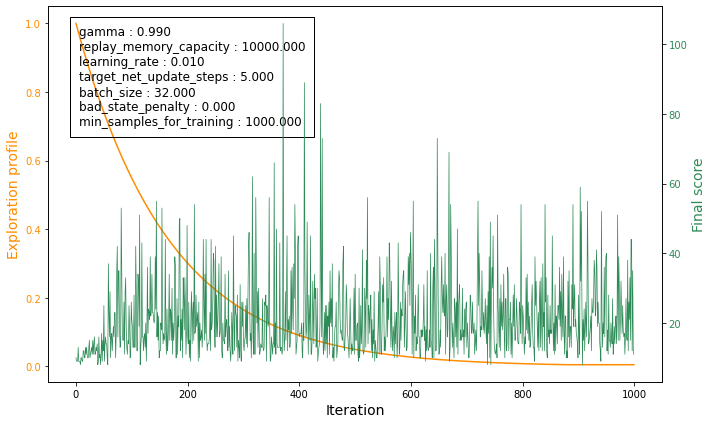

In [38]:
plot_profile_score( cnn_expl_prof, training_score, cnn_params)

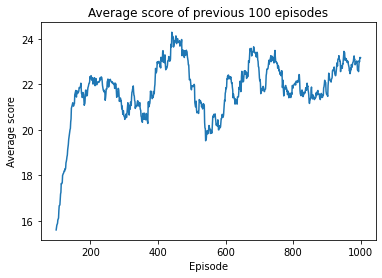

In [41]:
plt.plot(np.arange(99,1000), avg_window(training_score, 100))
plt.xlabel('Episode')
plt.ylabel('Average score')
plt.title('Average score of previous 100 episodes')
plt.show()

In [42]:
torch.save(policy_net.state_dict(), 'pixel_cnn_exponential')

In [43]:
## DEEPMIND ARCHITECTURE, DEEPMIND-LIKE EXPLORATION PROFILE
## IMG SIZE = 100X100
# Initialize the Gym environment
env_dm = gym.make('CartPole-v1') 
rnd_seed() # Set a random seed for the environment (reproducible results)
env_dm.seed(seed)

# number of consecutive frames -1 
# used to infer velocities 
ml = 3

training_score_dm = []
obs_history_dm = deque(maxlen=ml)

### Initialization
# print('Initialising...')
replay_mem_dm, policy_net_dm, target_net_dm, optimizer_dm, loss_fn = initialize_cnn(cnn_params)

# policy_net.load_state_dict(torch.load('cartpole_pix_crop', map_location=torch.device('cpu')))
policy_net_dm.to(device)

# print('Initialising frame history...')
for i in range(ml): 
    obs_history_dm.append(np.zeros((1, 100, 100) ))

In [44]:
## DEEPMIND ARCHITECTURE, DEEPMIND-LIKE EXPLORATION PROFILE
## IMG SIZE = 100X100
for episode_num, tau in enumerate(tqdm(lin_expl_prof)):
    # Reset the environment and get the initial state
    state = env_dm.reset()
    obs = get_frame(env_dm)
    # Reset the score. The final score will be the total amount of steps before the pole falls
    score = 0
    done = False
    # Go on until the pole falls off
#     print('Updating frames...')
    for i in range(ml):
#         print('...', i, '...')
        obs = np.append( obs, obs_history_dm[-i-1], axis=0)
    # obs is now 4 consecutive frames     
    
    while not done:
        # Adding history
#         print('History...')
        for i in range(ml):
            if obs_history_dm[i] is None: obs_history_dm[i] = np.zeros((1, 100, 100))
        # append frame to history
        obs_history_dm.append(obs[0][np.newaxis, :])
        
#         print('Choosing action...')
        # Choose the action following the policy
        # action, q_values = choose_action_softmax_pix(policy_net, from_frame_to_tens(obs), temperature=tau)
        action, q_values = choose_action_epsilon_greedy_pix(policy_net_dm, from_frame_to_tens(obs), tau)

        # Apply the action and get the next state, the reward and a flag "done" that is True if the game is ended
        next_state, reward, done, info = env_dm.step(action)
        next_obs = get_frame(env_dm)
        
#         print('History...')
        # update frame history 
        for i in range(ml):
            next_obs = np.append( next_obs, obs_history[-i-1], axis=0) 
        
        # Reward penalty when the cart is far from the centre
        off_cen_penalty = 1.
        reward = reward - off_cen_penalty * np.abs(state[0]) 

        # Update the final score (+1 for each step)
        score += 1
        # Apply penalty for bad state
        if done: # if the pole has fallen down 
            reward += cnn_params['bad_state_penalty']
            next_state = None
            next_obs = None

        # Update the replay memory
        replay_mem_dm.push(obs, action, next_obs, reward)

        # Update the network
        if len(replay_mem) > cnn_params['min_samples_for_training']: # we enable the training only if we have enough samples in the replay memory, otherwise the training will use the same samples too often
            update_step_pix(policy_net_dm, target_net_dm, replay_mem_dm, optimizer_dm, loss_fn, cnn_params)

        # Set the current state for the next iteration
        obs = next_obs
        state = next_state

    # Update the target network every target_net_update_steps episodes
    if episode_num % cnn_params['target_net_update_steps'] == 0:
#         print('Updating target network...')
        target_net_dm.load_state_dict(policy_net_dm.state_dict()) # This will copy the weights of the policy network to the target network

    # Print the final score
    print(f"EPISODE: {episode_num + 1} - FINAL SCORE: {score} - Temperature: {tau}") # Print the final score
    if episode_num > 10:
      print(f"            - Last10avg: {avg_window(training_score_dm, 10)[-1]}")
    if episode_num >= 50:
      print(f"            - Last50avg: {avg_window(training_score_dm, 50)[-1]}")

    training_score_dm.append(score)
    
env_dm.close()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



EPISODE: 1 - FINAL SCORE: 15 - Temperature: 1.0

EPISODE: 2 - FINAL SCORE: 9 - Temperature: 0.991

EPISODE: 3 - FINAL SCORE: 9 - Temperature: 0.982

EPISODE: 4 - FINAL SCORE: 9 - Temperature: 0.973

EPISODE: 5 - FINAL SCORE: 12 - Temperature: 0.964

EPISODE: 6 - FINAL SCORE: 11 - Temperature: 0.955

EPISODE: 7 - FINAL SCORE: 12 - Temperature: 0.946

EPISODE: 8 - FINAL SCORE: 11 - Temperature: 0.937

EPISODE: 9 - FINAL SCORE: 10 - Temperature: 0.9279999999999999

EPISODE: 10 - FINAL SCORE: 25 - Temperature: 0.919

EPISODE: 11 - FINAL SCORE: 14 - Temperature: 0.91

EPISODE: 12 - FINAL SCORE: 9 - Temperature: 0.901

- Last10avg: 12.200000000000001

EPISODE: 13 - FINAL SCORE: 16 - Temperature: 0.892

- Last10avg: 12.200000000000001

EPISODE: 14 - FINAL SCORE: 13 - Temperature: 0.883

- Last10avg: 12.9

EPISODE: 15 - FINAL SCORE: 24 - Temperature: 0.874

- Last10avg: 13.300000000000002

EPISODE: 16 - FINAL SCORE: 28 - Temperature: 0.865

- Last10avg: 14.500000000000002

EPISODE: 17 - FINAL SCORE: 19 - Temperature: 0.856

- Last10avg: 16.200000000000003

EPISODE: 18 - FINAL SCORE: 10 - Temperature: 0.847

- Last10avg: 16.900000000000002

EPISODE: 19 - FINAL SCORE: 15 - Temperature: 0.838

- Last10avg: 16.800000000000004

EPISODE: 20 - FINAL SCORE: 11 - Temperature: 0.829

- Last10avg: 17.300000000000004

EPISODE: 21 - FINAL SCORE: 17 - Temperature: 0.82

- Last10avg: 15.9

EPISODE: 22 - FINAL SCORE: 14 - Temperature: 0.8109999999999999

- Last10avg: 16.2

EPISODE: 23 - FINAL SCORE: 10 - Temperature: 0.802

- Last10avg: 16.7

EPISODE: 24 - FINAL SCORE: 14 - Temperature: 0.7929999999999999

- Last10avg: 16.1

EPISODE: 25 - FINAL SCORE: 12 - Temperature: 0.784

- Last10avg: 16.200000000000003

EPISODE: 26 - FINAL SCORE: 26 - Temperature: 0.7749999999999999

- Last10avg: 15.0

EPISODE: 27 - FINAL SCORE: 15 - Temperature: 0.766

- Last10avg: 14.799999999999999

EPISODE: 28 - FINAL SCORE: 23 - Temperature: 0.757

- Last10avg: 14.4

EPISODE: 29 - FINAL SCORE: 11 - Temperature: 0.748

- Last10avg: 15.700000000000001

EPISODE: 30 - FINAL SCORE: 18 - Temperature: 0.739

- Last10avg: 15.3

EPISODE: 31 - FINAL SCORE: 22 - Temperature: 0.73

- Last10avg: 16.0

EPISODE: 32 - FINAL SCORE: 19 - Temperature: 0.721

- Last10avg: 16.500000000000004

EPISODE: 33 - FINAL SCORE: 17 - Temperature: 0.712

- Last10avg: 17.0

EPISODE: 34 - FINAL SCORE: 38 - Temperature: 0.703

- Last10avg: 17.7

EPISODE: 35 - FINAL SCORE: 21 - Temperature: 0.694

- Last10avg: 20.100000000000005

EPISODE: 36 - FINAL SCORE: 29 - Temperature: 0.6849999999999999

- Last10avg: 21.000000000000004

EPISODE: 37 - FINAL SCORE: 48 - Temperature: 0.6759999999999999

- Last10avg: 21.300000000000004

EPISODE: 38 - FINAL SCORE: 13 - Temperature: 0.667

- Last10avg: 24.600000000000005

EPISODE: 39 - FINAL SCORE: 13 - Temperature: 0.6579999999999999

- Last10avg: 23.6

EPISODE: 40 - FINAL SCORE: 10 - Temperature: 0.649

- Last10avg: 23.8

EPISODE: 41 - FINAL SCORE: 10 - Temperature: 0.6399999999999999

- Last10avg: 23.000000000000004

EPISODE: 42 - FINAL SCORE: 13 - Temperature: 0.631

- Last10avg: 21.800000000000004

EPISODE: 43 - FINAL SCORE: 11 - Temperature: 0.6219999999999999

- Last10avg: 21.200000000000003

EPISODE: 44 - FINAL SCORE: 33 - Temperature: 0.613

- Last10avg: 20.600000000000005

EPISODE: 45 - FINAL SCORE: 26 - Temperature: 0.604

- Last10avg: 20.100000000000005

EPISODE: 46 - FINAL SCORE: 18 - Temperature: 0.595

- Last10avg: 20.600000000000005

EPISODE: 47 - FINAL SCORE: 17 - Temperature: 0.586

- Last10avg: 19.500000000000004

EPISODE: 48 - FINAL SCORE: 14 - Temperature: 0.577

- Last10avg: 16.400000000000002

EPISODE: 49 - FINAL SCORE: 12 - Temperature: 0.568

- Last10avg: 16.5

EPISODE: 50 - FINAL SCORE: 19 - Temperature: 0.5589999999999999

- Last10avg: 16.400000000000002

EPISODE: 51 - FINAL SCORE: 24 - Temperature: 0.5499999999999999

- Last10avg: 17.3

- Last50avg: 16.9

EPISODE: 52 - FINAL SCORE: 55 - Temperature: 0.5409999999999999

- Last10avg: 18.700000000000003

- Last50avg: 17.08

EPISODE: 53 - FINAL SCORE: 17 - Temperature: 0.5319999999999999

- Last10avg: 22.900000000000002

- Last50avg: 18.0

EPISODE: 54 - FINAL SCORE: 10 - Temperature: 0.5229999999999999

- Last10avg: 23.5

- Last50avg: 18.16

EPISODE: 55 - FINAL SCORE: 18 - Temperature: 0.514

- Last10avg: 21.2

- Last50avg: 18.18

EPISODE: 56 - FINAL SCORE: 12 - Temperature: 0.5049999999999999

- Last10avg: 20.400000000000002

- Last50avg: 18.3

EPISODE: 57 - FINAL SCORE: 19 - Temperature: 0.496

- Last10avg: 19.8

- Last50avg: 18.319999999999997

EPISODE: 58 - FINAL SCORE: 31 - Temperature: 0.487

- Last10avg: 20.0

- Last50avg: 18.46

EPISODE: 59 - FINAL SCORE: 28 - Temperature: 0.478

- Last10avg: 21.7

- Last50avg: 18.86

EPISODE: 60 - FINAL SCORE: 59 - Temperature: 0.469

- Last10avg: 23.3

- Last50avg: 19.22

EPISODE: 61 - FINAL SCORE: 18 - Temperature: 0.45999999999999996

- Last10avg: 27.300000000000004

- Last50avg: 19.9

EPISODE: 62 - FINAL SCORE: 20 - Temperature: 0.45099999999999996

- Last10avg: 26.7

- Last50avg: 19.979999999999997

EPISODE: 63 - FINAL SCORE: 11 - Temperature: 0.44199999999999995

- Last10avg: 23.200000000000003

- Last50avg: 20.2

EPISODE: 64 - FINAL SCORE: 40 - Temperature: 0.43299999999999994

- Last10avg: 22.600000000000005

- Last50avg: 20.099999999999998

EPISODE: 65 - FINAL SCORE: 25 - Temperature: 0.42399999999999993

- Last10avg: 25.600000000000005

- Last50avg: 20.639999999999997

EPISODE: 66 - FINAL SCORE: 14 - Temperature: 0.4149999999999999

- Last10avg: 26.300000000000004

- Last50avg: 20.66

EPISODE: 67 - FINAL SCORE: 15 - Temperature: 0.4059999999999999

- Last10avg: 26.5

- Last50avg: 20.380000000000003

EPISODE: 68 - FINAL SCORE: 25 - Temperature: 0.3969999999999999

- Last10avg: 26.1

- Last50avg: 20.3

EPISODE: 69 - FINAL SCORE: 22 - Temperature: 0.3879999999999999

- Last10avg: 25.5

- Last50avg: 20.599999999999998

EPISODE: 70 - FINAL SCORE: 29 - Temperature: 0.3789999999999999

- Last10avg: 24.899999999999995

- Last50avg: 20.740000000000002

EPISODE: 71 - FINAL SCORE: 13 - Temperature: 0.3699999999999999

- Last10avg: 21.9

- Last50avg: 21.1

EPISODE: 72 - FINAL SCORE: 24 - Temperature: 0.3609999999999999

- Last10avg: 21.400000000000002

- Last50avg: 21.02

EPISODE: 73 - FINAL SCORE: 15 - Temperature: 0.35199999999999987

- Last10avg: 21.800000000000004

- Last50avg: 21.220000000000002

EPISODE: 74 - FINAL SCORE: 17 - Temperature: 0.34299999999999997

- Last10avg: 22.200000000000003

- Last50avg: 21.32

EPISODE: 75 - FINAL SCORE: 15 - Temperature: 0.33399999999999996

- Last10avg: 19.900000000000002

- Last50avg: 21.380000000000003

EPISODE: 76 - FINAL SCORE: 11 - Temperature: 0.32499999999999996

- Last10avg: 18.900000000000002

- Last50avg: 21.44

EPISODE: 77 - FINAL SCORE: 16 - Temperature: 0.31599999999999995

- Last10avg: 18.600000000000005

- Last50avg: 21.14

EPISODE: 78 - FINAL SCORE: 21 - Temperature: 0.30699999999999994

- Last10avg: 18.700000000000003

- Last50avg: 21.16

EPISODE: 79 - FINAL SCORE: 17 - Temperature: 0.29799999999999993

- Last10avg: 18.3

- Last50avg: 21.120000000000005

EPISODE: 80 - FINAL SCORE: 34 - Temperature: 0.2889999999999999

- Last10avg: 17.8

- Last50avg: 21.240000000000006

EPISODE: 81 - FINAL SCORE: 11 - Temperature: 0.2799999999999999

- Last10avg: 18.299999999999997

- Last50avg: 21.56

EPISODE: 82 - FINAL SCORE: 22 - Temperature: 0.2709999999999999

- Last10avg: 18.1

- Last50avg: 21.34

EPISODE: 83 - FINAL SCORE: 17 - Temperature: 0.2619999999999999

- Last10avg: 17.9

- Last50avg: 21.400000000000002

EPISODE: 84 - FINAL SCORE: 40 - Temperature: 0.2529999999999999

- Last10avg: 18.099999999999998

- Last50avg: 21.400000000000002

EPISODE: 85 - FINAL SCORE: 18 - Temperature: 0.24399999999999988

- Last10avg: 20.4

- Last50avg: 21.44

EPISODE: 86 - FINAL SCORE: 10 - Temperature: 0.23499999999999988

- Last10avg: 20.700000000000003

- Last50avg: 21.38

EPISODE: 87 - FINAL SCORE: 13 - Temperature: 0.22599999999999987

- Last10avg: 20.6

- Last50avg: 20.999999999999996

EPISODE: 88 - FINAL SCORE: 15 - Temperature: 0.21699999999999986

- Last10avg: 20.3

- Last50avg: 20.3

EPISODE: 89 - FINAL SCORE: 21 - Temperature: 0.20799999999999996

- Last10avg: 19.700000000000003

- Last50avg: 20.340000000000003

EPISODE: 90 - FINAL SCORE: 36 - Temperature: 0.19899999999999995

- Last10avg: 20.1

- Last50avg: 20.500000000000004

EPISODE: 91 - FINAL SCORE: 12 - Temperature: 0.18999999999999995

- Last10avg: 20.300000000000004

- Last50avg: 21.020000000000003

EPISODE: 92 - FINAL SCORE: 45 - Temperature: 0.18099999999999994

- Last10avg: 20.400000000000002

- Last50avg: 21.06

EPISODE: 93 - FINAL SCORE: 30 - Temperature: 0.17199999999999993

- Last10avg: 22.7

- Last50avg: 21.7

EPISODE: 94 - FINAL SCORE: 37 - Temperature: 0.16299999999999992

- Last10avg: 24.0

- Last50avg: 22.08

EPISODE: 95 - FINAL SCORE: 16 - Temperature: 0.15399999999999991

- Last10avg: 23.7

- Last50avg: 22.16

EPISODE: 96 - FINAL SCORE: 13 - Temperature: 0.1449999999999999

- Last10avg: 23.5

- Last50avg: 21.959999999999997

EPISODE: 97 - FINAL SCORE: 10 - Temperature: 0.1359999999999999

- Last10avg: 23.8

- Last50avg: 21.860000000000003

EPISODE: 98 - FINAL SCORE: 47 - Temperature: 0.1269999999999999

- Last10avg: 23.500000000000004

- Last50avg: 21.720000000000002

EPISODE: 99 - FINAL SCORE: 13 - Temperature: 0.11799999999999988

- Last10avg: 26.700000000000003

- Last50avg: 22.380000000000003

EPISODE: 100 - FINAL SCORE: 19 - Temperature: 0.10899999999999987

- Last10avg: 25.900000000000002

- Last50avg: 22.400000000000002

EPISODE: 101 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 24.199999999999996

- Last50avg: 22.4

EPISODE: 102 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 25.1

- Last50avg: 22.34

EPISODE: 103 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 22.900000000000002

- Last50avg: 21.700000000000003

EPISODE: 104 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 21.000000000000004

- Last50avg: 21.58

EPISODE: 105 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 18.900000000000006

- Last50avg: 21.7

EPISODE: 106 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 18.5

- Last50avg: 21.580000000000002

EPISODE: 107 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 18.3

- Last50avg: 21.56

EPISODE: 108 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 18.7

- Last50avg: 21.46

EPISODE: 109 - FINAL SCORE: 30 - Temperature: 0.1

- Last10avg: 16.5

- Last50avg: 21.34

EPISODE: 110 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 18.2

- Last50avg: 21.380000000000003

EPISODE: 111 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 18.1

- Last50avg: 20.560000000000002

EPISODE: 112 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 16.9

- Last50avg: 20.38

EPISODE: 113 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 16.200000000000003

- Last50avg: 20.3

EPISODE: 114 - FINAL SCORE: 37 - Temperature: 0.1

- Last10avg: 17.400000000000002

- Last50avg: 20.54

EPISODE: 115 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 19.5

- Last50avg: 20.48

EPISODE: 116 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 19.400000000000002

- Last50avg: 20.2

EPISODE: 117 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 20.100000000000005

- Last50avg: 20.28

EPISODE: 118 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 19.900000000000002

- Last50avg: 20.22

EPISODE: 119 - FINAL SCORE: 51 - Temperature: 0.1

- Last10avg: 18.9

- Last50avg: 20.02

EPISODE: 120 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 21.000000000000004

- Last50avg: 20.6

EPISODE: 121 - FINAL SCORE: 52 - Temperature: 0.1

- Last10avg: 20.200000000000003

- Last50avg: 20.22

EPISODE: 122 - FINAL SCORE: 33 - Temperature: 0.1

- Last10avg: 24.500000000000004

- Last50avg: 20.999999999999996

EPISODE: 123 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 26.200000000000003

- Last50avg: 21.18

EPISODE: 124 - FINAL SCORE: 26 - Temperature: 0.1

- Last10avg: 25.200000000000003

- Last50avg: 21.140000000000004

EPISODE: 125 - FINAL SCORE: 43 - Temperature: 0.1

- Last10avg: 24.100000000000005

- Last50avg: 21.32

EPISODE: 126 - FINAL SCORE: 49 - Temperature: 0.1

- Last10avg: 27.300000000000004

- Last50avg: 21.88

EPISODE: 127 - FINAL SCORE: 30 - Temperature: 0.1

- Last10avg: 30.400000000000006

- Last50avg: 22.64

EPISODE: 128 - FINAL SCORE: 20 - Temperature: 0.1

- Last10avg: 32.2

- Last50avg: 22.92

EPISODE: 129 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 32.7

- Last50avg: 22.9

EPISODE: 130 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 28.900000000000002

- Last50avg: 22.82

EPISODE: 131 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 28.900000000000002

- Last50avg: 22.34

EPISODE: 132 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 25.2

- Last50avg: 22.419999999999998

EPISODE: 133 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 23.500000000000004

- Last50avg: 22.3

EPISODE: 134 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 24.500000000000004

- Last50avg: 22.42

EPISODE: 135 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 23.000000000000004

- Last50avg: 21.84

EPISODE: 136 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 20.800000000000004

- Last50avg: 21.900000000000002

EPISODE: 137 - FINAL SCORE: 27 - Temperature: 0.1

- Last10avg: 17.2

- Last50avg: 21.960000000000004

EPISODE: 138 - FINAL SCORE: 30 - Temperature: 0.1

- Last10avg: 16.900000000000002

- Last50avg: 22.240000000000002

EPISODE: 139 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 17.900000000000002

- Last50avg: 22.540000000000003

EPISODE: 140 - FINAL SCORE: 20 - Temperature: 0.1

- Last10avg: 18.3

- Last50avg: 22.46

EPISODE: 141 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 19.3

- Last50avg: 22.139999999999997

EPISODE: 142 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 19.3

- Last50avg: 22.2

EPISODE: 143 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 18.8

- Last50avg: 21.52

EPISODE: 144 - FINAL SCORE: 30 - Temperature: 0.1

- Last10avg: 17.9

- Last50avg: 21.2

EPISODE: 145 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 19.8

- Last50avg: 21.060000000000002

EPISODE: 146 - FINAL SCORE: 47 - Temperature: 0.1

- Last10avg: 19.3

- Last50avg: 21.060000000000002

EPISODE: 147 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 22.7

- Last50avg: 21.740000000000002

EPISODE: 148 - FINAL SCORE: 28 - Temperature: 0.1

- Last10avg: 21.7

- Last50avg: 21.880000000000003

EPISODE: 149 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 21.5

- Last50avg: 21.5

EPISODE: 150 - FINAL SCORE: 38 - Temperature: 0.1

- Last10avg: 21.2

- Last50avg: 21.52

EPISODE: 151 - FINAL SCORE: 20 - Temperature: 0.1

- Last10avg: 23.0

- Last50avg: 21.900000000000002

EPISODE: 152 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 23.5

- Last50avg: 21.88

EPISODE: 153 - FINAL SCORE: 40 - Temperature: 0.1

- Last10avg: 23.5

- Last50avg: 21.64

EPISODE: 154 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 26.1

- Last50avg: 22.220000000000002

EPISODE: 155 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 24.0

- Last50avg: 22.080000000000002

EPISODE: 156 - FINAL SCORE: 24 - Temperature: 0.1

- Last10avg: 24.000000000000004

- Last50avg: 22.16

EPISODE: 157 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 21.700000000000003

- Last50avg: 22.42

EPISODE: 158 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 21.9

- Last50avg: 22.52

EPISODE: 159 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 20.3

- Last50avg: 22.259999999999998

EPISODE: 160 - FINAL SCORE: 37 - Temperature: 0.1

- Last10avg: 19.9

- Last50avg: 21.86

EPISODE: 161 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 19.8

- Last50avg: 22.239999999999995

EPISODE: 162 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 19.400000000000002

- Last50avg: 22.38

EPISODE: 163 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 19.400000000000002

- Last50avg: 22.28

EPISODE: 164 - FINAL SCORE: 37 - Temperature: 0.1

- Last10avg: 16.5

- Last50avg: 22.04

EPISODE: 165 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 19.3

- Last50avg: 22.039999999999996

EPISODE: 166 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 19.8

- Last50avg: 22.24

EPISODE: 167 - FINAL SCORE: 33 - Temperature: 0.1

- Last10avg: 18.500000000000004

- Last50avg: 22.1

EPISODE: 168 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 19.9

- Last50avg: 22.52

EPISODE: 169 - FINAL SCORE: 24 - Temperature: 0.1

- Last10avg: 19.7

- Last50avg: 22.419999999999998

EPISODE: 170 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 21.1

- Last50avg: 21.88

EPISODE: 171 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 18.4

- Last50avg: 21.88

EPISODE: 172 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 18.900000000000002

- Last50avg: 21.26

EPISODE: 173 - FINAL SCORE: 30 - Temperature: 0.1

- Last10avg: 20.1

- Last50avg: 21.060000000000002

EPISODE: 174 - FINAL SCORE: 27 - Temperature: 0.1

- Last10avg: 22.000000000000004

- Last50avg: 21.400000000000006

EPISODE: 175 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 21.0

- Last50avg: 21.42

EPISODE: 176 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 20.700000000000003

- Last50avg: 20.919999999999998

EPISODE: 177 - FINAL SCORE: 35 - Temperature: 0.1

- Last10avg: 20.8

- Last50avg: 20.179999999999996

EPISODE: 178 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 21.0

- Last50avg: 20.28

EPISODE: 179 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 21.3

- Last50avg: 20.140000000000004

EPISODE: 180 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 20.3

- Last50avg: 20.160000000000007

EPISODE: 181 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 21.400000000000002

- Last50avg: 20.380000000000003

EPISODE: 182 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 20.900000000000002

- Last50avg: 20.400000000000002

EPISODE: 183 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 20.0

- Last50avg: 20.360000000000003

EPISODE: 184 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 19.3

- Last50avg: 20.360000000000003

EPISODE: 185 - FINAL SCORE: 33 - Temperature: 0.1

- Last10avg: 18.499999999999996

- Last50avg: 20.52

EPISODE: 186 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 20.0

- Last50avg: 20.76

EPISODE: 187 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 20.3

- Last50avg: 20.800000000000004

EPISODE: 188 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 18.300000000000004

- Last50avg: 20.560000000000002

EPISODE: 189 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 18.4

- Last50avg: 20.240000000000006

EPISODE: 190 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 18.6

- Last50avg: 20.220000000000002

EPISODE: 191 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 17.900000000000002

- Last50avg: 20.1

EPISODE: 192 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 17.3

- Last50avg: 20.0

EPISODE: 193 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 17.6

- Last50avg: 20.119999999999997

EPISODE: 194 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 16.400000000000002

- Last50avg: 20.06

EPISODE: 195 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 16.200000000000003

- Last50avg: 19.8

EPISODE: 196 - FINAL SCORE: 29 - Temperature: 0.1

- Last10avg: 14.600000000000001

- Last50avg: 19.82

EPISODE: 197 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 16.0

- Last50avg: 19.459999999999997

EPISODE: 198 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 15.800000000000002

- Last50avg: 19.38

EPISODE: 199 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 16.1

- Last50avg: 19.16

EPISODE: 200 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.400000000000004

- Last50avg: 19.06

EPISODE: 201 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 15.000000000000002

- Last50avg: 18.5

EPISODE: 202 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 15.500000000000002

- Last50avg: 18.4

EPISODE: 203 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 15.400000000000002

- Last50avg: 18.5

EPISODE: 204 - FINAL SCORE: 41 - Temperature: 0.1

- Last10avg: 15.200000000000001

- Last50avg: 17.88

EPISODE: 205 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 17.6

- Last50avg: 18.52

EPISODE: 206 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 17.200000000000003

- Last50avg: 18.460000000000004

EPISODE: 207 - FINAL SCORE: 44 - Temperature: 0.1

- Last10avg: 16.400000000000002

- Last50avg: 18.400000000000002

EPISODE: 208 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 19.5

- Last50avg: 18.900000000000002

EPISODE: 209 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 19.3

- Last50avg: 18.96

EPISODE: 210 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 19.400000000000002

- Last50avg: 18.96

EPISODE: 211 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 20.3

- Last50avg: 18.599999999999998

EPISODE: 212 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 19.699999999999996

- Last50avg: 18.459999999999997

EPISODE: 213 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 19.799999999999997

- Last50avg: 18.580000000000002

EPISODE: 214 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 20.7

- Last50avg: 18.72

EPISODE: 215 - FINAL SCORE: 34 - Temperature: 0.1

- Last10avg: 17.700000000000003

- Last50avg: 18.2

EPISODE: 216 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 19.800000000000004

- Last50avg: 18.46

EPISODE: 217 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 18.800000000000004

- Last50avg: 18.46

EPISODE: 218 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.8

- Last50avg: 18.080000000000002

EPISODE: 219 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 15.3

- Last50avg: 18.080000000000002

EPISODE: 220 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 15.600000000000001

- Last50avg: 17.860000000000003

EPISODE: 221 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.100000000000001

- Last50avg: 17.940000000000005

EPISODE: 222 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 15.3

- Last50avg: 17.740000000000002

EPISODE: 223 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 15.700000000000001

- Last50avg: 17.700000000000003

EPISODE: 224 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.3

- Last50avg: 17.380000000000003

EPISODE: 225 - FINAL SCORE: 27 - Temperature: 0.1

- Last10avg: 15.3

- Last50avg: 17.06

EPISODE: 226 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 14.600000000000001

- Last50avg: 17.24

EPISODE: 227 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 14.6

- Last50avg: 17.22

EPISODE: 228 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.100000000000001

- Last50avg: 16.7

EPISODE: 229 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.100000000000001

- Last50avg: 16.639999999999997

EPISODE: 230 - FINAL SCORE: 43 - Temperature: 0.1

- Last10avg: 13.8

- Last50avg: 16.56

EPISODE: 231 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 16.700000000000003

- Last50avg: 17.0

EPISODE: 232 - FINAL SCORE: 45 - Temperature: 0.1

- Last10avg: 17.1

- Last50avg: 16.98

EPISODE: 233 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 19.5

- Last50avg: 17.599999999999998

EPISODE: 234 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 20.200000000000003

- Last50avg: 17.560000000000002

EPISODE: 235 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 20.1

- Last50avg: 17.380000000000003

EPISODE: 236 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 18.700000000000003

- Last50avg: 16.980000000000004

EPISODE: 237 - FINAL SCORE: 46 - Temperature: 0.1

- Last10avg: 19.299999999999997

- Last50avg: 17.020000000000003

EPISODE: 238 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 23.0

- Last50avg: 17.64

EPISODE: 239 - FINAL SCORE: 38 - Temperature: 0.1

- Last10avg: 23.300000000000004

- Last50avg: 17.620000000000005

EPISODE: 240 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 26.100000000000005

- Last50avg: 18.060000000000002

EPISODE: 241 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 23.300000000000004

- Last50avg: 18.080000000000002

EPISODE: 242 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 23.600000000000005

- Last50avg: 18.24

EPISODE: 243 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 20.800000000000004

- Last50avg: 18.24

EPISODE: 244 - FINAL SCORE: 33 - Temperature: 0.1

- Last10avg: 19.800000000000004

- Last50avg: 18.24

EPISODE: 245 - FINAL SCORE: 24 - Temperature: 0.1

- Last10avg: 22.1

- Last50avg: 18.56

EPISODE: 246 - FINAL SCORE: 36 - Temperature: 0.1

- Last10avg: 23.200000000000003

- Last50avg: 18.7

EPISODE: 247 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 25.1

- Last50avg: 18.84

EPISODE: 248 - FINAL SCORE: 40 - Temperature: 0.1

- Last10avg: 21.800000000000004

- Last50avg: 18.84

EPISODE: 249 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 24.500000000000004

- Last50avg: 19.300000000000004

EPISODE: 250 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 22.0

- Last50avg: 19.380000000000003

EPISODE: 251 - FINAL SCORE: 35 - Temperature: 0.1

- Last10avg: 22.300000000000004

- Last50avg: 19.540000000000003

EPISODE: 252 - FINAL SCORE: 38 - Temperature: 0.1

- Last10avg: 24.0

- Last50avg: 19.94

EPISODE: 253 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 26.1

- Last50avg: 20.380000000000003

EPISODE: 254 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 26.100000000000005

- Last50avg: 20.42

EPISODE: 255 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 23.800000000000004

- Last50avg: 19.8

EPISODE: 256 - FINAL SCORE: 31 - Temperature: 0.1

- Last10avg: 23.500000000000004

- Last50avg: 19.960000000000004

EPISODE: 257 - FINAL SCORE: 35 - Temperature: 0.1

- Last10avg: 23.000000000000004

- Last50avg: 20.160000000000004

EPISODE: 258 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 25.200000000000003

- Last50avg: 19.98

EPISODE: 259 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 22.3

- Last50avg: 19.9

EPISODE: 260 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 22.0

- Last50avg: 19.9

EPISODE: 261 - FINAL SCORE: 20 - Temperature: 0.1

- Last10avg: 22.500000000000004

- Last50avg: 19.98

EPISODE: 262 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 21.0

- Last50avg: 20.2

EPISODE: 263 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 18.500000000000004

- Last50avg: 20.12

EPISODE: 264 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 18.8

- Last50avg: 20.040000000000003

EPISODE: 265 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 19.699999999999996

- Last50avg: 20.2

EPISODE: 266 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 18.900000000000002

- Last50avg: 19.78

EPISODE: 267 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 17.1

- Last50avg: 19.820000000000004

EPISODE: 268 - FINAL SCORE: 26 - Temperature: 0.1

- Last10avg: 15.000000000000002

- Last50avg: 19.820000000000004

EPISODE: 269 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 16.500000000000004

- Last50avg: 20.140000000000004

EPISODE: 270 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 16.6

- Last50avg: 20.099999999999998

EPISODE: 271 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.3

- Last50avg: 20.02

EPISODE: 272 - FINAL SCORE: 31 - Temperature: 0.1

- Last10avg: 14.399999999999999

- Last50avg: 20.02

EPISODE: 273 - FINAL SCORE: 20 - Temperature: 0.1

- Last10avg: 16.2

- Last50avg: 20.220000000000002

EPISODE: 274 - FINAL SCORE: 24 - Temperature: 0.1

- Last10avg: 16.799999999999997

- Last50avg: 20.34

EPISODE: 275 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 17.299999999999997

- Last50avg: 20.599999999999998

EPISODE: 276 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 16.9

- Last50avg: 20.24

EPISODE: 277 - FINAL SCORE: 33 - Temperature: 0.1

- Last10avg: 16.7

- Last50avg: 20.240000000000002

EPISODE: 278 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 18.6

- Last50avg: 20.720000000000002

EPISODE: 279 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 18.2

- Last50avg: 20.96

EPISODE: 280 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 18.0

- Last50avg: 20.94

EPISODE: 281 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 18.5

- Last50avg: 20.38

EPISODE: 282 - FINAL SCORE: 27 - Temperature: 0.1

- Last10avg: 19.099999999999998

- Last50avg: 20.42

EPISODE: 283 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 18.700000000000003

- Last50avg: 20.06

EPISODE: 284 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 17.6

- Last50avg: 19.82

EPISODE: 285 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 16.200000000000003

- Last50avg: 19.82

EPISODE: 286 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 16.599999999999998

- Last50avg: 19.820000000000004

EPISODE: 287 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 16.5

- Last50avg: 19.680000000000003

EPISODE: 288 - FINAL SCORE: 37 - Temperature: 0.1

- Last10avg: 14.600000000000001

- Last50avg: 19.040000000000003

EPISODE: 289 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 16.1

- Last50avg: 19.52

EPISODE: 290 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 16.500000000000004

- Last50avg: 19.020000000000003

EPISODE: 291 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 16.100000000000005

- Last50avg: 18.94

EPISODE: 292 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 16.5

- Last50avg: 19.0

EPISODE: 293 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 15.5

- Last50avg: 19.000000000000004

EPISODE: 294 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 17.1

- Last50avg: 19.28

EPISODE: 295 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 17.6

- Last50avg: 18.919999999999998

EPISODE: 296 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 17.7

- Last50avg: 18.720000000000002

EPISODE: 297 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 17.8

- Last50avg: 18.220000000000002

EPISODE: 298 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 17.7

- Last50avg: 18.220000000000002

EPISODE: 299 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 16.2

- Last50avg: 17.86

EPISODE: 300 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 16.400000000000002

- Last50avg: 17.900000000000002

EPISODE: 301 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 16.900000000000002

- Last50avg: 17.860000000000003

EPISODE: 302 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 16.200000000000003

- Last50avg: 17.44

EPISODE: 303 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 16.3

- Last50avg: 17.04

EPISODE: 304 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 15.200000000000001

- Last50avg: 17.1

EPISODE: 305 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 16.0

- Last50avg: 17.360000000000003

EPISODE: 306 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 16.200000000000003

- Last50avg: 17.26

EPISODE: 307 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 16.900000000000002

- Last50avg: 17.0

EPISODE: 308 - FINAL SCORE: 26 - Temperature: 0.1

- Last10avg: 16.700000000000003

- Last50avg: 16.52

EPISODE: 309 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 17.1

- Last50avg: 16.819999999999997

EPISODE: 310 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 16.4

- Last50avg: 16.78

EPISODE: 311 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.8

- Last50avg: 16.52

EPISODE: 312 - FINAL SCORE: 55 - Temperature: 0.1

- Last10avg: 15.4

- Last50avg: 16.32

EPISODE: 313 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 19.1

- Last50avg: 17.16

EPISODE: 314 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 18.900000000000002

- Last50avg: 17.119999999999997

EPISODE: 315 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 18.2

- Last50avg: 17.06

EPISODE: 316 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 17.5

- Last50avg: 16.98

EPISODE: 317 - FINAL SCORE: 40 - Temperature: 0.1

- Last10avg: 17.9

- Last50avg: 17.16

EPISODE: 318 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 20.8

- Last50avg: 17.68

EPISODE: 319 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 19.9

- Last50avg: 17.5

EPISODE: 320 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 19.999999999999996

- Last50avg: 17.46

EPISODE: 321 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 19.9

- Last50avg: 17.439999999999998

EPISODE: 322 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 19.9

- Last50avg: 17.419999999999998

EPISODE: 323 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 16.700000000000003

- Last50avg: 17.26

EPISODE: 324 - FINAL SCORE: 26 - Temperature: 0.1

- Last10avg: 18.0

- Last50avg: 17.36

EPISODE: 325 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 19.000000000000004

- Last50avg: 17.4

EPISODE: 326 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 19.900000000000002

- Last50avg: 17.58

EPISODE: 327 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 18.8

- Last50avg: 17.58

EPISODE: 328 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 16.0

- Last50avg: 17.159999999999997

EPISODE: 329 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 15.5

- Last50avg: 16.959999999999997

EPISODE: 330 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 16.3

- Last50avg: 17.119999999999997

EPISODE: 331 - FINAL SCORE: 32 - Temperature: 0.1

- Last10avg: 17.0

- Last50avg: 17.14

EPISODE: 332 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 19.2

- Last50avg: 17.44

EPISODE: 333 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 19.0

- Last50avg: 17.32

EPISODE: 334 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 18.000000000000004

- Last50avg: 17.44

EPISODE: 335 - FINAL SCORE: 20 - Temperature: 0.1

- Last10avg: 16.8

- Last50avg: 17.52

EPISODE: 336 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 17.0

- Last50avg: 17.659999999999997

EPISODE: 337 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 16.900000000000002

- Last50avg: 17.66

EPISODE: 338 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 17.200000000000003

- Last50avg: 17.68

EPISODE: 339 - FINAL SCORE: 20 - Temperature: 0.1

- Last10avg: 17.2

- Last50avg: 17.18

EPISODE: 340 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 17.5

- Last50avg: 17.319999999999997

EPISODE: 341 - FINAL SCORE: 32 - Temperature: 0.1

- Last10avg: 17.200000000000003

- Last50avg: 17.360000000000003

EPISODE: 342 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 17.2

- Last50avg: 17.580000000000002

EPISODE: 343 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 16.700000000000003

- Last50avg: 17.56

EPISODE: 344 - FINAL SCORE: 29 - Temperature: 0.1

- Last10avg: 16.3

- Last50avg: 17.28

EPISODE: 345 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 17.799999999999997

- Last50avg: 17.56

EPISODE: 346 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 16.599999999999998

- Last50avg: 17.44

EPISODE: 347 - FINAL SCORE: 48 - Temperature: 0.1

- Last10avg: 17.1

- Last50avg: 17.520000000000003

EPISODE: 348 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 20.400000000000002

- Last50avg: 18.220000000000002

EPISODE: 349 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 20.500000000000004

- Last50avg: 18.040000000000003

EPISODE: 350 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 19.800000000000004

- Last50avg: 18.000000000000004

EPISODE: 351 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 19.400000000000002

- Last50avg: 17.860000000000003

EPISODE: 352 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 17.700000000000003

- Last50avg: 17.88

EPISODE: 353 - FINAL SCORE: 20 - Temperature: 0.1

- Last10avg: 18.0

- Last50avg: 17.9

EPISODE: 354 - FINAL SCORE: 29 - Temperature: 0.1

- Last10avg: 18.900000000000002

- Last50avg: 18.02

EPISODE: 355 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 18.9

- Last50avg: 18.139999999999997

EPISODE: 356 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 19.1

- Last50avg: 18.02

EPISODE: 357 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 18.6

- Last50avg: 17.86

EPISODE: 358 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.4

- Last50avg: 17.959999999999997

EPISODE: 359 - FINAL SCORE: 35 - Temperature: 0.1

- Last10avg: 15.1

- Last50avg: 17.64

EPISODE: 360 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 17.299999999999997

- Last50avg: 18.18

EPISODE: 361 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 17.599999999999998

- Last50avg: 18.22

EPISODE: 362 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 17.1

- Last50avg: 18.22

EPISODE: 363 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 16.4

- Last50avg: 17.36

EPISODE: 364 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 15.899999999999999

- Last50avg: 17.419999999999998

EPISODE: 365 - FINAL SCORE: 43 - Temperature: 0.1

- Last10avg: 14.3

- Last50avg: 17.36

EPISODE: 366 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 17.6

- Last50avg: 18.040000000000003

EPISODE: 367 - FINAL SCORE: 38 - Temperature: 0.1

- Last10avg: 17.6

- Last50avg: 17.8

EPISODE: 368 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 19.8

- Last50avg: 17.76

EPISODE: 369 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 20.5

- Last50avg: 17.76

EPISODE: 370 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 18.3

- Last50avg: 17.840000000000003

EPISODE: 371 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 19.400000000000002

- Last50avg: 18.12

EPISODE: 372 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 20.6

- Last50avg: 18.360000000000003

EPISODE: 373 - FINAL SCORE: 26 - Temperature: 0.1

- Last10avg: 21.500000000000004

- Last50avg: 18.320000000000004

EPISODE: 374 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 22.600000000000005

- Last50avg: 18.34

EPISODE: 375 - FINAL SCORE: 27 - Temperature: 0.1

- Last10avg: 22.500000000000004

- Last50avg: 18.06

EPISODE: 376 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 20.9

- Last50avg: 18.24

EPISODE: 377 - FINAL SCORE: 39 - Temperature: 0.1

- Last10avg: 21.2

- Last50avg: 18.28

EPISODE: 378 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 21.300000000000004

- Last50avg: 18.820000000000004

EPISODE: 379 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 21.3

- Last50avg: 18.92

EPISODE: 380 - FINAL SCORE: 30 - Temperature: 0.1

- Last10avg: 20.899999999999995

- Last50avg: 18.759999999999998

EPISODE: 381 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 21.599999999999998

- Last50avg: 19.04

EPISODE: 382 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 20.400000000000002

- Last50avg: 18.599999999999998

EPISODE: 383 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 19.9

- Last50avg: 18.499999999999996

EPISODE: 384 - FINAL SCORE: 20 - Temperature: 0.1

- Last10avg: 18.3

- Last50avg: 18.4

EPISODE: 385 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 19.1

- Last50avg: 18.52

EPISODE: 386 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 17.299999999999997

- Last50avg: 18.299999999999997

EPISODE: 387 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 17.3

- Last50avg: 18.360000000000003

EPISODE: 388 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 15.0

- Last50avg: 18.38

EPISODE: 389 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 15.100000000000001

- Last50avg: 18.5

EPISODE: 390 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 16.0

- Last50avg: 18.459999999999997

EPISODE: 391 - FINAL SCORE: 39 - Temperature: 0.1

- Last10avg: 13.900000000000002

- Last50avg: 18.379999999999995

EPISODE: 392 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 16.800000000000004

- Last50avg: 18.52

EPISODE: 393 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 17.400000000000002

- Last50avg: 18.64

EPISODE: 394 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 18.900000000000002

- Last50avg: 18.92

EPISODE: 395 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 17.8

- Last50avg: 18.52

EPISODE: 396 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 18.2

- Last50avg: 18.62

EPISODE: 397 - FINAL SCORE: 28 - Temperature: 0.1

- Last10avg: 18.2

- Last50avg: 18.580000000000005

EPISODE: 398 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 19.400000000000002

- Last50avg: 18.18

EPISODE: 399 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 18.700000000000003

- Last50avg: 18.139999999999997

EPISODE: 400 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 18.1

- Last50avg: 18.119999999999997

EPISODE: 401 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 18.200000000000003

- Last50avg: 18.14

EPISODE: 402 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 15.5

- Last50avg: 18.08

EPISODE: 403 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.100000000000001

- Last50avg: 18.06

EPISODE: 404 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 13.700000000000001

- Last50avg: 17.88

EPISODE: 405 - FINAL SCORE: 28 - Temperature: 0.1

- Last10avg: 14.0

- Last50avg: 17.539999999999996

EPISODE: 406 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.500000000000004

- Last50avg: 17.9

EPISODE: 407 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 15.300000000000002

- Last50avg: 17.919999999999998

EPISODE: 408 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.700000000000003

- Last50avg: 18.040000000000003

EPISODE: 409 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 14.600000000000001

- Last50avg: 18.04

EPISODE: 410 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.899999999999999

- Last50avg: 17.64

EPISODE: 411 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 14.899999999999999

- Last50avg: 17.6

EPISODE: 412 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 15.2

- Last50avg: 17.7

EPISODE: 413 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 14.900000000000002

- Last50avg: 17.76

EPISODE: 414 - FINAL SCORE: 36 - Temperature: 0.1

- Last10avg: 15.0

- Last50avg: 17.7

EPISODE: 415 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 17.400000000000002

- Last50avg: 18.159999999999997

EPISODE: 416 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 15.8

- Last50avg: 17.539999999999996

EPISODE: 417 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 16.8

- Last50avg: 17.76

EPISODE: 418 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 17.1

- Last50avg: 17.5

EPISODE: 419 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 17.1

- Last50avg: 17.36

EPISODE: 420 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 16.5

- Last50avg: 17.279999999999998

EPISODE: 421 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 16.6

- Last50avg: 17.04

EPISODE: 422 - FINAL SCORE: 32 - Temperature: 0.1

- Last10avg: 16.3

- Last50avg: 16.839999999999996

EPISODE: 423 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 18.0

- Last50avg: 17.06

EPISODE: 424 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 17.8

- Last50avg: 16.74

EPISODE: 425 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 15.6

- Last50avg: 16.78

EPISODE: 426 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 15.200000000000001

- Last50avg: 16.400000000000002

EPISODE: 427 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 15.000000000000002

- Last50avg: 16.52

EPISODE: 428 - FINAL SCORE: 27 - Temperature: 0.1

- Last10avg: 14.000000000000002

- Last50avg: 16.04

EPISODE: 429 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 15.700000000000003

- Last50avg: 16.24

EPISODE: 430 - FINAL SCORE: 36 - Temperature: 0.1

- Last10avg: 17.1

- Last50avg: 16.52

EPISODE: 431 - FINAL SCORE: 45 - Temperature: 0.1

- Last10avg: 19.6

- Last50avg: 16.64

EPISODE: 432 - FINAL SCORE: 29 - Temperature: 0.1

- Last10avg: 22.900000000000002

- Last50avg: 17.34

EPISODE: 433 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 22.6

- Last50avg: 17.599999999999998

EPISODE: 434 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 23.200000000000003

- Last50avg: 17.72

EPISODE: 435 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 23.000000000000004

- Last50avg: 17.56

EPISODE: 436 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 23.2

- Last50avg: 17.58

EPISODE: 437 - FINAL SCORE: 31 - Temperature: 0.1

- Last10avg: 22.2

- Last50avg: 17.5

EPISODE: 438 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 23.8

- Last50avg: 17.8

EPISODE: 439 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 22.0

- Last50avg: 17.62

EPISODE: 440 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 20.7

- Last50avg: 17.46

EPISODE: 441 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 17.999999999999996

- Last50avg: 17.46

EPISODE: 442 - FINAL SCORE: 20 - Temperature: 0.1

- Last10avg: 14.600000000000001

- Last50avg: 16.9

EPISODE: 443 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 13.700000000000001

- Last50avg: 16.86

EPISODE: 444 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.600000000000001

- Last50avg: 16.860000000000003

EPISODE: 445 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 14.4

- Last50avg: 16.88

EPISODE: 446 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 14.200000000000001

- Last50avg: 16.78

EPISODE: 447 - FINAL SCORE: 39 - Temperature: 0.1

- Last10avg: 14.700000000000001

- Last50avg: 16.8

EPISODE: 448 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 15.500000000000002

- Last50avg: 17.020000000000003

EPISODE: 449 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 16.1

- Last50avg: 17.1

EPISODE: 450 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 16.400000000000002

- Last50avg: 17.120000000000005

EPISODE: 451 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 17.6

- Last50avg: 17.340000000000003

EPISODE: 452 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 17.900000000000002

- Last50avg: 17.380000000000003

EPISODE: 453 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 18.200000000000003

- Last50avg: 17.480000000000004

EPISODE: 454 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 17.900000000000002

- Last50avg: 17.7

EPISODE: 455 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 17.900000000000002

- Last50avg: 17.66

EPISODE: 456 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 18.200000000000003

- Last50avg: 17.319999999999997

EPISODE: 457 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 18.000000000000004

- Last50avg: 17.34

EPISODE: 458 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 15.000000000000002

- Last50avg: 17.08

EPISODE: 459 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 14.400000000000002

- Last50avg: 17.06

EPISODE: 460 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 14.000000000000002

- Last50avg: 16.939999999999998

EPISODE: 461 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 13.0

- Last50avg: 16.96

EPISODE: 462 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 12.6

- Last50avg: 16.86

EPISODE: 463 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 12.0

- Last50avg: 16.9

EPISODE: 464 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 11.5

- Last50avg: 17.0

EPISODE: 465 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 12.0

- Last50avg: 16.580000000000002

EPISODE: 466 - FINAL SCORE: 31 - Temperature: 0.1

- Last10avg: 12.100000000000001

- Last50avg: 16.58

EPISODE: 467 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 14.000000000000002

- Last50avg: 16.779999999999998

EPISODE: 468 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.0

- Last50avg: 16.66

EPISODE: 469 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.200000000000001

- Last50avg: 16.679999999999996

EPISODE: 470 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 15.299999999999999

- Last50avg: 16.7

EPISODE: 471 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.400000000000002

- Last50avg: 16.72

EPISODE: 472 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 15.500000000000002

- Last50avg: 16.7

EPISODE: 473 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 15.5

- Last50avg: 16.4

EPISODE: 474 - FINAL SCORE: 42 - Temperature: 0.1

- Last10avg: 15.700000000000001

- Last50avg: 16.58

EPISODE: 475 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 18.400000000000002

- Last50avg: 17.139999999999997

EPISODE: 476 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 18.1

- Last50avg: 17.16

EPISODE: 477 - FINAL SCORE: 32 - Temperature: 0.1

- Last10avg: 15.900000000000002

- Last50avg: 16.96

EPISODE: 478 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 17.2

- Last50avg: 17.299999999999997

EPISODE: 479 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 17.3

- Last50avg: 16.999999999999996

EPISODE: 480 - FINAL SCORE: 28 - Temperature: 0.1

- Last10avg: 18.0

- Last50avg: 16.88

EPISODE: 481 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 19.6

- Last50avg: 16.72

EPISODE: 482 - FINAL SCORE: 26 - Temperature: 0.1

- Last10avg: 20.8

- Last50avg: 16.28

EPISODE: 483 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 21.700000000000003

- Last50avg: 16.220000000000002

EPISODE: 484 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 21.600000000000005

- Last50avg: 16.26

EPISODE: 485 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 19.900000000000002

- Last50avg: 16.52

EPISODE: 486 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 20.7

- Last50avg: 16.66

EPISODE: 487 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 20.6

- Last50avg: 16.64

EPISODE: 488 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 18.8

- Last50avg: 16.3

EPISODE: 489 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 19.0

- Last50avg: 16.400000000000002

EPISODE: 490 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 19.400000000000006

- Last50avg: 16.62

EPISODE: 491 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 17.6

- Last50avg: 16.640000000000004

EPISODE: 492 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 16.500000000000004

- Last50avg: 16.66

EPISODE: 493 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 15.099999999999998

- Last50avg: 16.499999999999996

EPISODE: 494 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 14.600000000000001

- Last50avg: 16.259999999999998

EPISODE: 495 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 13.000000000000002

- Last50avg: 16.240000000000002

EPISODE: 496 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 12.500000000000004

- Last50avg: 16.32

EPISODE: 497 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 13.100000000000003

- Last50avg: 16.32

EPISODE: 498 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 13.3

- Last50avg: 15.86

EPISODE: 499 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 13.300000000000002

- Last50avg: 15.839999999999998

EPISODE: 500 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 12.200000000000001

- Last50avg: 15.78

EPISODE: 501 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 12.500000000000002

- Last50avg: 15.62

EPISODE: 502 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 13.5

- Last50avg: 15.78

EPISODE: 503 - FINAL SCORE: 26 - Temperature: 0.1

- Last10avg: 14.0

- Last50avg: 15.659999999999998

EPISODE: 504 - FINAL SCORE: 38 - Temperature: 0.1

- Last10avg: 15.299999999999999

- Last50avg: 15.739999999999998

EPISODE: 505 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 18.2

- Last50avg: 16.3

EPISODE: 506 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 18.2

- Last50avg: 16.32

EPISODE: 507 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 17.900000000000002

- Last50avg: 16.299999999999997

EPISODE: 508 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 18.100000000000005

- Last50avg: 16.479999999999997

EPISODE: 509 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 17.9

- Last50avg: 16.54

EPISODE: 510 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 17.900000000000002

- Last50avg: 16.56

EPISODE: 511 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 18.1

- Last50avg: 16.64

EPISODE: 512 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 16.900000000000002

- Last50avg: 16.64

EPISODE: 513 - FINAL SCORE: 31 - Temperature: 0.1

- Last10avg: 17.400000000000002

- Last50avg: 16.740000000000002

EPISODE: 514 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 17.900000000000002

- Last50avg: 17.02

EPISODE: 515 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.3

- Last50avg: 16.96

EPISODE: 516 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 15.200000000000001

- Last50avg: 16.939999999999998

EPISODE: 517 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 15.3

- Last50avg: 16.56

EPISODE: 518 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.3

- Last50avg: 16.54

EPISODE: 519 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 15.100000000000001

- Last50avg: 16.52

EPISODE: 520 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 15.900000000000002

- Last50avg: 16.679999999999996

EPISODE: 521 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.800000000000002

- Last50avg: 16.72

EPISODE: 522 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 15.900000000000002

- Last50avg: 16.72

EPISODE: 523 - FINAL SCORE: 27 - Temperature: 0.1

- Last10avg: 15.000000000000002

- Last50avg: 16.64

EPISODE: 524 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.600000000000001

- Last50avg: 16.8

EPISODE: 525 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 14.400000000000002

- Last50avg: 16.16

EPISODE: 526 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.0

- Last50avg: 16.32

EPISODE: 527 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 14.8

- Last50avg: 16.34

EPISODE: 528 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 15.5

- Last50avg: 16.2

EPISODE: 529 - FINAL SCORE: 37 - Temperature: 0.1

- Last10avg: 16.3

- Last50avg: 16.32

EPISODE: 530 - FINAL SCORE: 32 - Temperature: 0.1

- Last10avg: 18.2

- Last50avg: 16.72

EPISODE: 531 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 20.0

- Last50avg: 16.8

EPISODE: 532 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 20.099999999999998

- Last50avg: 16.58

EPISODE: 533 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 20.2

- Last50avg: 16.34

EPISODE: 534 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 18.499999999999996

- Last50avg: 16.18

EPISODE: 535 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 18.499999999999996

- Last50avg: 15.879999999999999

EPISODE: 536 - FINAL SCORE: 24 - Temperature: 0.1

- Last10avg: 18.599999999999998

- Last50avg: 15.899999999999999

EPISODE: 537 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 20.0

- Last50avg: 16.22

EPISODE: 538 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 20.0

- Last50avg: 16.44

EPISODE: 539 - FINAL SCORE: 31 - Temperature: 0.1

- Last10avg: 20.500000000000004

- Last50avg: 16.62

EPISODE: 540 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 19.900000000000002

- Last50avg: 16.820000000000004

EPISODE: 541 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 17.800000000000004

- Last50avg: 16.84

EPISODE: 542 - FINAL SCORE: 28 - Temperature: 0.1

- Last10avg: 17.700000000000003

- Last50avg: 16.82

EPISODE: 543 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 19.1

- Last50avg: 17.139999999999997

EPISODE: 544 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 19.799999999999997

- Last50avg: 17.22

EPISODE: 545 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 19.799999999999997

- Last50avg: 17.240000000000002

EPISODE: 546 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 18.9

- Last50avg: 17.179999999999996

EPISODE: 547 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 18.1

- Last50avg: 17.22

EPISODE: 548 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 16.700000000000003

- Last50avg: 17.12

EPISODE: 549 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 15.600000000000001

- Last50avg: 17.08

EPISODE: 550 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 13.7

- Last50avg: 17.119999999999997

EPISODE: 551 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 13.700000000000001

- Last50avg: 17.08

EPISODE: 552 - FINAL SCORE: 26 - Temperature: 0.1

- Last10avg: 15.1

- Last50avg: 17.14

EPISODE: 553 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 14.9

- Last50avg: 17.32

EPISODE: 554 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 15.7

- Last50avg: 17.3

EPISODE: 555 - FINAL SCORE: 26 - Temperature: 0.1

- Last10avg: 15.900000000000002

- Last50avg: 16.779999999999998

EPISODE: 556 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 17.6

- Last50avg: 17.06

EPISODE: 557 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 17.100000000000005

- Last50avg: 17.06

EPISODE: 558 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 18.2

- Last50avg: 17.140000000000004

EPISODE: 559 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 18.0

- Last50avg: 17.1

EPISODE: 560 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 17.799999999999997

- Last50avg: 17.099999999999998

EPISODE: 561 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 18.099999999999998

- Last50avg: 17.080000000000002

EPISODE: 562 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 16.4

- Last50avg: 17.040000000000003

EPISODE: 563 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.400000000000002

- Last50avg: 16.919999999999998

EPISODE: 564 - FINAL SCORE: 35 - Temperature: 0.1

- Last10avg: 14.000000000000002

- Last50avg: 16.52

EPISODE: 565 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 16.3

- Last50avg: 16.98

EPISODE: 566 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.700000000000001

- Last50avg: 16.96

EPISODE: 567 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 14.6

- Last50avg: 16.919999999999998

EPISODE: 568 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 14.100000000000001

- Last50avg: 16.9

EPISODE: 569 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 14.3

- Last50avg: 16.939999999999998

EPISODE: 570 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 14.4

- Last50avg: 16.8

EPISODE: 571 - FINAL SCORE: 28 - Temperature: 0.1

- Last10avg: 14.2

- Last50avg: 16.759999999999998

EPISODE: 572 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 16.2

- Last50avg: 17.099999999999998

EPISODE: 573 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 16.200000000000003

- Last50avg: 17.16

EPISODE: 574 - FINAL SCORE: 37 - Temperature: 0.1

- Last10avg: 16.3

- Last50avg: 16.86

EPISODE: 575 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 16.5

- Last50avg: 17.4

EPISODE: 576 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 16.6

- Last50avg: 17.279999999999998

EPISODE: 577 - FINAL SCORE: 29 - Temperature: 0.1

- Last10avg: 17.3

- Last50avg: 17.419999999999998

EPISODE: 578 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 18.5

- Last50avg: 17.499999999999996

EPISODE: 579 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 18.600000000000005

- Last50avg: 17.4

EPISODE: 580 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 18.700000000000003

- Last50avg: 16.9

EPISODE: 581 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 18.6

- Last50avg: 16.479999999999997

EPISODE: 582 - FINAL SCORE: 40 - Temperature: 0.1

- Last10avg: 17.000000000000004

- Last50avg: 16.479999999999997

EPISODE: 583 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 19.400000000000002

- Last50avg: 17.0

EPISODE: 584 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 19.900000000000002

- Last50avg: 17.14

EPISODE: 585 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 17.0

- Last50avg: 17.099999999999998

EPISODE: 586 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 16.700000000000003

- Last50avg: 16.9

EPISODE: 587 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 16.1

- Last50avg: 16.639999999999997

EPISODE: 588 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 14.600000000000001

- Last50avg: 16.42

EPISODE: 589 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 14.4

- Last50avg: 16.18

EPISODE: 590 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 14.3

- Last50avg: 15.780000000000001

EPISODE: 591 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.1

- Last50avg: 15.74

EPISODE: 592 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 13.9

- Last50avg: 15.719999999999999

EPISODE: 593 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 11.3

- Last50avg: 15.44

EPISODE: 594 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 11.900000000000002

- Last50avg: 15.56

EPISODE: 595 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 12.200000000000001

- Last50avg: 15.580000000000002

EPISODE: 596 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 12.4

- Last50avg: 15.6

EPISODE: 597 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 12.3

- Last50avg: 15.479999999999999

EPISODE: 598 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 13.100000000000001

- Last50avg: 15.699999999999998

EPISODE: 599 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 13.5

- Last50avg: 15.76

EPISODE: 600 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 13.899999999999999

- Last50avg: 15.82

EPISODE: 601 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 15.1

- Last50avg: 16.020000000000003

EPISODE: 602 - FINAL SCORE: 26 - Temperature: 0.1

- Last10avg: 16.0

- Last50avg: 15.900000000000002

EPISODE: 603 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 17.200000000000003

- Last50avg: 15.9

EPISODE: 604 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 17.4

- Last50avg: 15.899999999999999

EPISODE: 605 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 17.900000000000002

- Last50avg: 15.98

EPISODE: 606 - FINAL SCORE: 20 - Temperature: 0.1

- Last10avg: 18.8

- Last50avg: 15.840000000000002

EPISODE: 607 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 19.8

- Last50avg: 16.02

EPISODE: 608 - FINAL SCORE: 35 - Temperature: 0.1

- Last10avg: 18.6

- Last50avg: 15.78

EPISODE: 609 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 20.6

- Last50avg: 16.28

EPISODE: 610 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 20.1

- Last50avg: 16.28

EPISODE: 611 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 19.6

- Last50avg: 16.319999999999997

EPISODE: 612 - FINAL SCORE: 28 - Temperature: 0.1

- Last10avg: 18.800000000000004

- Last50avg: 16.38

EPISODE: 613 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 19.0

- Last50avg: 16.619999999999997

EPISODE: 614 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 17.4

- Last50avg: 16.58

EPISODE: 615 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 16.8

- Last50avg: 16.08

EPISODE: 616 - FINAL SCORE: 28 - Temperature: 0.1

- Last10avg: 15.700000000000001

- Last50avg: 16.04

EPISODE: 617 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 16.5

- Last50avg: 16.400000000000002

EPISODE: 618 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 16.700000000000003

- Last50avg: 16.299999999999997

EPISODE: 619 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 14.200000000000003

- Last50avg: 16.259999999999998

EPISODE: 620 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 14.800000000000002

- Last50avg: 16.36

EPISODE: 621 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 14.000000000000002

- Last50avg: 16.28

EPISODE: 622 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 14.100000000000001

- Last50avg: 15.96

EPISODE: 623 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 13.100000000000001

- Last50avg: 16.0

EPISODE: 624 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 13.300000000000002

- Last50avg: 15.98

EPISODE: 625 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.100000000000003

- Last50avg: 15.600000000000001

EPISODE: 626 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.3

- Last50avg: 15.58

EPISODE: 627 - FINAL SCORE: 26 - Temperature: 0.1

- Last10avg: 12.500000000000002

- Last50avg: 15.44

EPISODE: 628 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 13.9

- Last50avg: 15.379999999999999

EPISODE: 629 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 13.8

- Last50avg: 15.299999999999999

EPISODE: 630 - FINAL SCORE: 30 - Temperature: 0.1

- Last10avg: 13.5

- Last50avg: 15.319999999999999

EPISODE: 631 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 15.700000000000001

- Last50avg: 15.7

EPISODE: 632 - FINAL SCORE: 40 - Temperature: 0.1

- Last10avg: 15.900000000000002

- Last50avg: 15.74

EPISODE: 633 - FINAL SCORE: 32 - Temperature: 0.1

- Last10avg: 18.1

- Last50avg: 15.74

EPISODE: 634 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 20.2

- Last50avg: 16.04

EPISODE: 635 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 19.6

- Last50avg: 16.12

EPISODE: 636 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 19.8

- Last50avg: 16.2

EPISODE: 637 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 20.299999999999997

- Last50avg: 16.28

EPISODE: 638 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 19.3

- Last50avg: 16.32

EPISODE: 639 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 19.799999999999997

- Last50avg: 16.380000000000003

EPISODE: 640 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 20.2

- Last50avg: 16.5

EPISODE: 641 - FINAL SCORE: 35 - Temperature: 0.1

- Last10avg: 18.3

- Last50avg: 16.54

EPISODE: 642 - FINAL SCORE: 26 - Temperature: 0.1

- Last10avg: 20.400000000000002

- Last50avg: 17.04

EPISODE: 643 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 19.0

- Last50avg: 17.28

EPISODE: 644 - FINAL SCORE: 27 - Temperature: 0.1

- Last10avg: 17.400000000000002

- Last50avg: 17.14

EPISODE: 645 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 18.900000000000002

- Last50avg: 17.46

EPISODE: 646 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 18.9

- Last50avg: 17.5

EPISODE: 647 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 19.099999999999998

- Last50avg: 17.64

EPISODE: 648 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 18.4

- Last50avg: 17.380000000000003

EPISODE: 649 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 18.699999999999996

- Last50avg: 17.42

EPISODE: 650 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 18.2

- Last50avg: 17.36

EPISODE: 651 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 18.4

- Last50avg: 17.200000000000003

EPISODE: 652 - FINAL SCORE: 39 - Temperature: 0.1

- Last10avg: 16.000000000000004

- Last50avg: 17.040000000000003

EPISODE: 653 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 17.3

- Last50avg: 17.3

EPISODE: 654 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 16.800000000000004

- Last50avg: 17.020000000000003

EPISODE: 655 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 15.3

- Last50avg: 16.94

EPISODE: 656 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.000000000000002

- Last50avg: 16.74

EPISODE: 657 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 14.300000000000002

- Last50avg: 16.540000000000003

EPISODE: 658 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 14.5

- Last50avg: 16.56

EPISODE: 659 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 14.0

- Last50avg: 16.1

EPISODE: 660 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 14.0

- Last50avg: 16.14

EPISODE: 661 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 13.799999999999999

- Last50avg: 16.04

EPISODE: 662 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 13.8

- Last50avg: 16.04

EPISODE: 663 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 11.200000000000001

- Last50avg: 15.74

EPISODE: 664 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 11.000000000000002

- Last50avg: 15.74

EPISODE: 665 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 11.9

- Last50avg: 15.96

EPISODE: 666 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 12.2

- Last50avg: 16.04

EPISODE: 667 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 12.500000000000004

- Last50avg: 15.74

EPISODE: 668 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 12.800000000000002

- Last50avg: 15.78

EPISODE: 669 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 13.300000000000004

- Last50avg: 15.92

EPISODE: 670 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 13.3

- Last50avg: 15.84

EPISODE: 671 - FINAL SCORE: 24 - Temperature: 0.1

- Last10avg: 13.2

- Last50avg: 15.879999999999999

EPISODE: 672 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 14.500000000000002

- Last50avg: 16.12

EPISODE: 673 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 15.3

- Last50avg: 16.180000000000003

EPISODE: 674 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 15.800000000000002

- Last50avg: 16.24

EPISODE: 675 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 15.3

- Last50avg: 16.2

EPISODE: 676 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 15.0

- Last50avg: 16.18

EPISODE: 677 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 15.500000000000002

- Last50avg: 16.34

EPISODE: 678 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 15.700000000000001

- Last50avg: 16.139999999999997

EPISODE: 679 - FINAL SCORE: 35 - Temperature: 0.1

- Last10avg: 15.700000000000003

- Last50avg: 16.3

EPISODE: 680 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 18.0

- Last50avg: 16.74

EPISODE: 681 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 19.5

- Last50avg: 16.64

EPISODE: 682 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 18.5

- Last50avg: 16.640000000000004

EPISODE: 683 - FINAL SCORE: 28 - Temperature: 0.1

- Last10avg: 17.7

- Last50avg: 16.1

EPISODE: 684 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 19.1

- Last50avg: 16.02

EPISODE: 685 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 19.1

- Last50avg: 16.1

EPISODE: 686 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 19.400000000000002

- Last50avg: 16.099999999999998

EPISODE: 687 - FINAL SCORE: 26 - Temperature: 0.1

- Last10avg: 19.1

- Last50avg: 16.099999999999998

EPISODE: 688 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 20.1

- Last50avg: 16.3

EPISODE: 689 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 19.400000000000002

- Last50avg: 16.220000000000002

EPISODE: 690 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 16.9

- Last50avg: 16.080000000000002

EPISODE: 691 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.200000000000001

- Last50avg: 16.02

EPISODE: 692 - FINAL SCORE: 42 - Temperature: 0.1

- Last10avg: 14.900000000000002

- Last50avg: 15.540000000000001

EPISODE: 693 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 17.8

- Last50avg: 15.860000000000001

EPISODE: 694 - FINAL SCORE: 30 - Temperature: 0.1

- Last10avg: 16.3

- Last50avg: 15.799999999999999

EPISODE: 695 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 17.700000000000003

- Last50avg: 15.86

EPISODE: 696 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 17.6

- Last50avg: 15.840000000000002

EPISODE: 697 - FINAL SCORE: 44 - Temperature: 0.1

- Last10avg: 17.400000000000002

- Last50avg: 15.760000000000002

EPISODE: 698 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 19.200000000000003

- Last50avg: 16.46

EPISODE: 699 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 19.1

- Last50avg: 16.3

EPISODE: 700 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 19.400000000000002

- Last50avg: 16.320000000000004

EPISODE: 701 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 19.700000000000003

- Last50avg: 16.28

EPISODE: 702 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 19.6

- Last50avg: 16.259999999999998

EPISODE: 703 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 17.1

- Last50avg: 15.82

EPISODE: 704 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 16.8

- Last50avg: 15.799999999999999

EPISODE: 705 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 14.700000000000001

- Last50avg: 15.739999999999998

EPISODE: 706 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 16.1

- Last50avg: 16.06

EPISODE: 707 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 15.700000000000003

- Last50avg: 16.04

EPISODE: 708 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 12.500000000000004

- Last50avg: 16.06

EPISODE: 709 - FINAL SCORE: 39 - Temperature: 0.1

- Last10avg: 12.900000000000002

- Last50avg: 16.080000000000002

EPISODE: 710 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 15.500000000000002

- Last50avg: 16.62

EPISODE: 711 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 15.700000000000001

- Last50avg: 16.660000000000004

EPISODE: 712 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 15.600000000000001

- Last50avg: 16.62

EPISODE: 713 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.400000000000002

- Last50avg: 16.66

EPISODE: 714 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.5

- Last50avg: 16.7

EPISODE: 715 - FINAL SCORE: 33 - Temperature: 0.1

- Last10avg: 15.700000000000001

- Last50avg: 16.5

EPISODE: 716 - FINAL SCORE: 20 - Temperature: 0.1

- Last10avg: 16.5

- Last50avg: 16.919999999999998

EPISODE: 717 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 17.6

- Last50avg: 17.06

EPISODE: 718 - FINAL SCORE: 20 - Temperature: 0.1

- Last10avg: 17.7

- Last50avg: 17.040000000000003

EPISODE: 719 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 18.400000000000002

- Last50avg: 17.1

EPISODE: 720 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 15.700000000000003

- Last50avg: 17.099999999999998

EPISODE: 721 - FINAL SCORE: 29 - Temperature: 0.1

- Last10avg: 16.500000000000004

- Last50avg: 17.32

EPISODE: 722 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 18.5

- Last50avg: 17.42

EPISODE: 723 - FINAL SCORE: 29 - Temperature: 0.1

- Last10avg: 18.1

- Last50avg: 17.22

EPISODE: 724 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 19.9

- Last50avg: 17.519999999999996

EPISODE: 725 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 19.8

- Last50avg: 17.4

EPISODE: 726 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 17.4

- Last50avg: 17.400000000000002

EPISODE: 727 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 16.3

- Last50avg: 17.22

EPISODE: 728 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 16.1

- Last50avg: 17.119999999999997

EPISODE: 729 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.400000000000002

- Last50avg: 17.040000000000003

EPISODE: 730 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 15.3

- Last50avg: 16.56

EPISODE: 731 - FINAL SCORE: 28 - Temperature: 0.1

- Last10avg: 15.3

- Last50avg: 16.48

EPISODE: 732 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 15.200000000000001

- Last50avg: 16.759999999999998

EPISODE: 733 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 16.0

- Last50avg: 16.88

EPISODE: 734 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 15.000000000000002

- Last50avg: 16.7

EPISODE: 735 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.800000000000002

- Last50avg: 16.74

EPISODE: 736 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 15.900000000000002

- Last50avg: 16.7

EPISODE: 737 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 16.200000000000003

- Last50avg: 16.639999999999997

EPISODE: 738 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 16.900000000000002

- Last50avg: 16.479999999999997

EPISODE: 739 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 17.3

- Last50avg: 16.619999999999997

EPISODE: 740 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 17.300000000000004

- Last50avg: 16.639999999999997

EPISODE: 741 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 17.400000000000002

- Last50avg: 16.919999999999998

EPISODE: 742 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.500000000000002

- Last50avg: 16.88

EPISODE: 743 - FINAL SCORE: 27 - Temperature: 0.1

- Last10avg: 14.7

- Last50avg: 16.259999999999998

EPISODE: 744 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 15.5

- Last50avg: 16.54

EPISODE: 745 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 14.899999999999999

- Last50avg: 16.18

EPISODE: 746 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 15.799999999999999

- Last50avg: 16.34

EPISODE: 747 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 15.5

- Last50avg: 16.259999999999998

EPISODE: 748 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 15.0

- Last50avg: 15.639999999999999

EPISODE: 749 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.700000000000001

- Last50avg: 15.739999999999998

EPISODE: 750 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 14.600000000000003

- Last50avg: 15.679999999999998

EPISODE: 751 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 13.300000000000002

- Last50avg: 15.639999999999999

EPISODE: 752 - FINAL SCORE: 51 - Temperature: 0.1

- Last10avg: 13.300000000000002

- Last50avg: 15.62

EPISODE: 753 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 17.300000000000004

- Last50avg: 16.3

EPISODE: 754 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 15.400000000000002

- Last50avg: 16.26

EPISODE: 755 - FINAL SCORE: 31 - Temperature: 0.1

- Last10avg: 15.500000000000004

- Last50avg: 16.34

EPISODE: 756 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 16.700000000000003

- Last50avg: 16.459999999999997

EPISODE: 757 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 16.900000000000002

- Last50avg: 16.5

EPISODE: 758 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 17.1

- Last50avg: 16.56

EPISODE: 759 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 17.1

- Last50avg: 16.580000000000002

EPISODE: 760 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 17.299999999999997

- Last50avg: 16.04

EPISODE: 761 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 17.400000000000002

- Last50avg: 15.979999999999999

EPISODE: 762 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 17.5

- Last50avg: 15.999999999999998

EPISODE: 763 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 13.700000000000003

- Last50avg: 15.959999999999999

EPISODE: 764 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 14.600000000000001

- Last50avg: 16.080000000000002

EPISODE: 765 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.100000000000001

- Last50avg: 16.02

EPISODE: 766 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 12.0

- Last50avg: 15.559999999999999

EPISODE: 767 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 12.000000000000002

- Last50avg: 15.38

EPISODE: 768 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 11.9

- Last50avg: 15.4

EPISODE: 769 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 11.5

- Last50avg: 15.199999999999998

EPISODE: 770 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 11.3

- Last50avg: 15.159999999999998

EPISODE: 771 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 11.3

- Last50avg: 14.939999999999998

EPISODE: 772 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 11.200000000000001

- Last50avg: 14.54

EPISODE: 773 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 11.200000000000001

- Last50avg: 14.579999999999998

EPISODE: 774 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 10.400000000000002

- Last50avg: 14.179999999999998

EPISODE: 775 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 11.8

- Last50avg: 14.42

EPISODE: 776 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 12.200000000000001

- Last50avg: 14.52

EPISODE: 777 - FINAL SCORE: 35 - Temperature: 0.1

- Last10avg: 12.400000000000002

- Last50avg: 14.599999999999998

EPISODE: 778 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.500000000000002

- Last50avg: 15.079999999999998

EPISODE: 779 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.500000000000002

- Last50avg: 15.019999999999998

EPISODE: 780 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 14.500000000000002

- Last50avg: 14.999999999999998

EPISODE: 781 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 14.400000000000002

- Last50avg: 14.759999999999998

EPISODE: 782 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 14.800000000000002

- Last50avg: 14.459999999999999

EPISODE: 783 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 14.900000000000002

- Last50avg: 14.36

EPISODE: 784 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 15.300000000000002

- Last50avg: 14.239999999999998

EPISODE: 785 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 15.400000000000002

- Last50avg: 14.34

EPISODE: 786 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 15.900000000000002

- Last50avg: 14.520000000000001

EPISODE: 787 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 16.5

- Last50avg: 14.660000000000002

EPISODE: 788 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 15.200000000000003

- Last50avg: 14.74

EPISODE: 789 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 15.000000000000004

- Last50avg: 14.56

EPISODE: 790 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.900000000000004

- Last50avg: 14.52

EPISODE: 791 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 15.000000000000002

- Last50avg: 14.28

EPISODE: 792 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 15.000000000000002

- Last50avg: 14.36

EPISODE: 793 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 14.900000000000004

- Last50avg: 14.4

EPISODE: 794 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 15.700000000000003

- Last50avg: 14.280000000000001

EPISODE: 795 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 14.3

- Last50avg: 14.22

EPISODE: 796 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 13.600000000000001

- Last50avg: 14.08

EPISODE: 797 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 12.799999999999999

- Last50avg: 14.120000000000001

EPISODE: 798 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 11.9

- Last50avg: 14.120000000000001

EPISODE: 799 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 12.2

- Last50avg: 14.06

EPISODE: 800 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 12.5

- Last50avg: 14.100000000000001

EPISODE: 801 - FINAL SCORE: 30 - Temperature: 0.1

- Last10avg: 13.3

- Last50avg: 14.28

EPISODE: 802 - FINAL SCORE: 27 - Temperature: 0.1

- Last10avg: 15.000000000000004

- Last50avg: 14.699999999999998

EPISODE: 803 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 16.400000000000002

- Last50avg: 14.219999999999999

EPISODE: 804 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.100000000000001

- Last50avg: 14.219999999999999

EPISODE: 805 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 15.300000000000002

- Last50avg: 14.180000000000001

EPISODE: 806 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 15.4

- Last50avg: 13.82

EPISODE: 807 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 15.900000000000002

- Last50avg: 13.92

EPISODE: 808 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 15.900000000000002

- Last50avg: 13.88

EPISODE: 809 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 15.600000000000001

- Last50avg: 13.76

EPISODE: 810 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 15.300000000000002

- Last50avg: 13.7

EPISODE: 811 - FINAL SCORE: 33 - Temperature: 0.1

- Last10avg: 15.000000000000002

- Last50avg: 13.8

EPISODE: 812 - FINAL SCORE: 41 - Temperature: 0.1

- Last10avg: 15.300000000000002

- Last50avg: 14.260000000000002

EPISODE: 813 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 16.700000000000003

- Last50avg: 14.82

EPISODE: 814 - FINAL SCORE: 27 - Temperature: 0.1

- Last10avg: 17.000000000000004

- Last50avg: 14.700000000000001

EPISODE: 815 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 18.6

- Last50avg: 15.08

EPISODE: 816 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 18.7

- Last50avg: 15.159999999999998

EPISODE: 817 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 18.1

- Last50avg: 15.139999999999999

EPISODE: 818 - FINAL SCORE: 24 - Temperature: 0.1

- Last10avg: 18.200000000000003

- Last50avg: 15.139999999999999

EPISODE: 819 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 19.799999999999997

- Last50avg: 15.42

EPISODE: 820 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 20.000000000000007

- Last50avg: 15.440000000000001

EPISODE: 821 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 19.5

- Last50avg: 15.44

EPISODE: 822 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 17.200000000000003

- Last50avg: 15.459999999999997

EPISODE: 823 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 14.6

- Last50avg: 15.5

EPISODE: 824 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 14.400000000000002

- Last50avg: 15.5

EPISODE: 825 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 12.8

- Last50avg: 15.28

EPISODE: 826 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 12.3

- Last50avg: 15.18

EPISODE: 827 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 12.200000000000001

- Last50avg: 15.1

EPISODE: 828 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 11.9

- Last50avg: 14.620000000000001

EPISODE: 829 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 11.0

- Last50avg: 14.72

EPISODE: 830 - FINAL SCORE: 20 - Temperature: 0.1

- Last10avg: 11.5

- Last50avg: 14.84

EPISODE: 831 - FINAL SCORE: 27 - Temperature: 0.1

- Last10avg: 12.5

- Last50avg: 15.06

EPISODE: 832 - FINAL SCORE: 32 - Temperature: 0.1

- Last10avg: 14.2

- Last50avg: 15.34

EPISODE: 833 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.899999999999999

- Last50avg: 15.7

EPISODE: 834 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 16.1

- Last50avg: 15.66

EPISODE: 835 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 16.2

- Last50avg: 15.44

EPISODE: 836 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 16.400000000000002

- Last50avg: 15.28

EPISODE: 837 - FINAL SCORE: 30 - Temperature: 0.1

- Last10avg: 16.400000000000002

- Last50avg: 15.08

EPISODE: 838 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 18.3

- Last50avg: 15.24

EPISODE: 839 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 18.6

- Last50avg: 15.44

EPISODE: 840 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 18.1

- Last50avg: 15.48

EPISODE: 841 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 17.3

- Last50avg: 15.520000000000001

EPISODE: 842 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 15.500000000000002

- Last50avg: 15.44

EPISODE: 843 - FINAL SCORE: 24 - Temperature: 0.1

- Last10avg: 14.100000000000003

- Last50avg: 15.54

EPISODE: 844 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 15.400000000000002

- Last50avg: 15.6

EPISODE: 845 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.000000000000004

- Last50avg: 15.580000000000002

EPISODE: 846 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.900000000000002

- Last50avg: 15.54

EPISODE: 847 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 15.000000000000002

- Last50avg: 15.52

EPISODE: 848 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 14.300000000000002

- Last50avg: 15.72

EPISODE: 849 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 14.100000000000001

- Last50avg: 15.820000000000002

EPISODE: 850 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 13.900000000000002

- Last50avg: 15.76

EPISODE: 851 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 14.900000000000002

- Last50avg: 15.839999999999998

EPISODE: 852 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 15.6

- Last50avg: 15.56

EPISODE: 853 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.5

- Last50avg: 15.360000000000001

EPISODE: 854 - FINAL SCORE: 48 - Temperature: 0.1

- Last10avg: 14.200000000000001

- Last50avg: 15.42

EPISODE: 855 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 18.200000000000003

- Last50avg: 16.16

EPISODE: 856 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 18.200000000000003

- Last50avg: 16.1

EPISODE: 857 - FINAL SCORE: 20 - Temperature: 0.1

- Last10avg: 18.1

- Last50avg: 15.959999999999999

EPISODE: 858 - FINAL SCORE: 28 - Temperature: 0.1

- Last10avg: 17.8

- Last50avg: 16.099999999999998

EPISODE: 859 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 19.000000000000004

- Last50avg: 16.5

EPISODE: 860 - FINAL SCORE: 21 - Temperature: 0.1

- Last10avg: 19.200000000000003

- Last50avg: 16.54

EPISODE: 861 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 19.100000000000005

- Last50avg: 16.66

EPISODE: 862 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 18.900000000000002

- Last50avg: 16.28

EPISODE: 863 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 18.7

- Last50avg: 15.76

EPISODE: 864 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 19.3

- Last50avg: 15.88

EPISODE: 865 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 15.4

- Last50avg: 15.52

EPISODE: 866 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 15.200000000000001

- Last50avg: 15.4

EPISODE: 867 - FINAL SCORE: 36 - Temperature: 0.1

- Last10avg: 15.200000000000003

- Last50avg: 15.38

EPISODE: 868 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 16.800000000000004

- Last50avg: 15.82

EPISODE: 869 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 15.200000000000003

- Last50avg: 15.580000000000002

EPISODE: 870 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.700000000000001

- Last50avg: 15.680000000000001

EPISODE: 871 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 14.6

- Last50avg: 15.68

EPISODE: 872 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 14.400000000000002

- Last50avg: 15.72

EPISODE: 873 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 14.300000000000002

- Last50avg: 15.7

EPISODE: 874 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 14.0

- Last50avg: 15.8

EPISODE: 875 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 13.900000000000002

- Last50avg: 15.74

EPISODE: 876 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 14.100000000000001

- Last50avg: 15.759999999999998

EPISODE: 877 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 14.400000000000002

- Last50avg: 15.82

EPISODE: 878 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 12.100000000000001

- Last50avg: 15.86

EPISODE: 879 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 11.800000000000002

- Last50avg: 15.739999999999998

EPISODE: 880 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 11.000000000000002

- Last50avg: 15.579999999999998

EPISODE: 881 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 11.000000000000002

- Last50avg: 15.379999999999999

EPISODE: 882 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 10.700000000000001

- Last50avg: 15.02

EPISODE: 883 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 11.0

- Last50avg: 14.719999999999999

EPISODE: 884 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 11.100000000000001

- Last50avg: 14.8

EPISODE: 885 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 11.3

- Last50avg: 14.760000000000002

EPISODE: 886 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 11.3

- Last50avg: 14.739999999999998

EPISODE: 887 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 11.400000000000002

- Last50avg: 14.819999999999999

EPISODE: 888 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 11.400000000000002

- Last50avg: 14.48

EPISODE: 889 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 11.600000000000001

- Last50avg: 14.340000000000002

EPISODE: 890 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 12.0

- Last50avg: 14.360000000000001

EPISODE: 891 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 12.0

- Last50avg: 14.319999999999999

EPISODE: 892 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 12.500000000000002

- Last50avg: 14.419999999999998

EPISODE: 893 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 12.1

- Last50avg: 14.32

EPISODE: 894 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 11.9

- Last50avg: 14.100000000000001

EPISODE: 895 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 12.100000000000001

- Last50avg: 14.180000000000001

EPISODE: 896 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 12.200000000000001

- Last50avg: 14.200000000000001

EPISODE: 897 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 12.100000000000001

- Last50avg: 14.240000000000002

EPISODE: 898 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 12.200000000000001

- Last50avg: 14.059999999999999

EPISODE: 899 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 12.6

- Last50avg: 14.04

EPISODE: 900 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 12.700000000000001

- Last50avg: 14.12

EPISODE: 901 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 12.600000000000001

- Last50avg: 13.860000000000001

EPISODE: 902 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 12.600000000000001

- Last50avg: 13.82

EPISODE: 903 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 12.400000000000002

- Last50avg: 13.700000000000001

EPISODE: 904 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 12.1

- Last50avg: 13.680000000000001

EPISODE: 905 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 12.200000000000001

- Last50avg: 12.979999999999999

EPISODE: 906 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 12.000000000000002

- Last50avg: 12.959999999999999

EPISODE: 907 - FINAL SCORE: 30 - Temperature: 0.1

- Last10avg: 12.700000000000003

- Last50avg: 13.16

EPISODE: 908 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 14.3

- Last50avg: 13.36

EPISODE: 909 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 13.600000000000001

- Last50avg: 12.959999999999999

EPISODE: 910 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 13.3

- Last50avg: 12.94

EPISODE: 911 - FINAL SCORE: 26 - Temperature: 0.1

- Last10avg: 13.600000000000001

- Last50avg: 12.76

EPISODE: 912 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 14.800000000000002

- Last50avg: 12.999999999999998

EPISODE: 913 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 14.8

- Last50avg: 12.92

EPISODE: 914 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.700000000000001

- Last50avg: 12.760000000000002

EPISODE: 915 - FINAL SCORE: 27 - Temperature: 0.1

- Last10avg: 14.4

- Last50avg: 12.78

EPISODE: 916 - FINAL SCORE: 22 - Temperature: 0.1

- Last10avg: 16.2

- Last50avg: 13.159999999999998

EPISODE: 917 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 16.5

- Last50avg: 13.42

EPISODE: 918 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.2

- Last50avg: 13.040000000000001

EPISODE: 919 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.499999999999998

- Last50avg: 13.020000000000001

EPISODE: 920 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 15.599999999999998

- Last50avg: 12.920000000000002

EPISODE: 921 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 15.499999999999998

- Last50avg: 12.940000000000001

EPISODE: 922 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 13.8

- Last50avg: 12.88

EPISODE: 923 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 13.7

- Last50avg: 12.799999999999999

EPISODE: 924 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 14.0

- Last50avg: 12.76

EPISODE: 925 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.4

- Last50avg: 12.879999999999999

EPISODE: 926 - FINAL SCORE: 46 - Temperature: 0.1

- Last10avg: 12.700000000000001

- Last50avg: 12.879999999999999

EPISODE: 927 - FINAL SCORE: 24 - Temperature: 0.1

- Last10avg: 15.100000000000001

- Last50avg: 13.56

EPISODE: 928 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 15.800000000000002

- Last50avg: 13.780000000000001

EPISODE: 929 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 16.1

- Last50avg: 13.88

EPISODE: 930 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.900000000000002

- Last50avg: 13.899999999999999

EPISODE: 931 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 15.800000000000002

- Last50avg: 13.899999999999999

EPISODE: 932 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 15.700000000000003

- Last50avg: 13.879999999999999

EPISODE: 933 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 16.200000000000003

- Last50avg: 13.84

EPISODE: 934 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 16.000000000000004

- Last50avg: 13.74

EPISODE: 935 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 15.600000000000001

- Last50avg: 13.739999999999998

EPISODE: 936 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 16.200000000000003

- Last50avg: 13.86

EPISODE: 937 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 12.5

- Last50avg: 13.780000000000001

EPISODE: 938 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 11.500000000000002

- Last50avg: 13.799999999999999

EPISODE: 939 - FINAL SCORE: 23 - Temperature: 0.1

- Last10avg: 11.400000000000002

- Last50avg: 13.839999999999998

EPISODE: 940 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 12.800000000000002

- Last50avg: 14.06

EPISODE: 941 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 12.800000000000002

- Last50avg: 14.06

EPISODE: 942 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 12.900000000000002

- Last50avg: 13.959999999999999

EPISODE: 943 - FINAL SCORE: 8 - Temperature: 0.1

- Last10avg: 12.600000000000001

- Last50avg: 13.94

EPISODE: 944 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 12.400000000000002

- Last50avg: 13.84

EPISODE: 945 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 12.300000000000002

- Last50avg: 13.78

EPISODE: 946 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 11.700000000000001

- Last50avg: 13.759999999999998

EPISODE: 947 - FINAL SCORE: 19 - Temperature: 0.1

- Last10avg: 11.700000000000003

- Last50avg: 13.7

EPISODE: 948 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 12.200000000000001

- Last50avg: 13.8

EPISODE: 949 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 11.800000000000002

- Last50avg: 13.680000000000001

EPISODE: 950 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 10.500000000000002

- Last50avg: 13.62

EPISODE: 951 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 10.900000000000002

- Last50avg: 13.719999999999999

EPISODE: 952 - FINAL SCORE: 35 - Temperature: 0.1

- Last10avg: 11.200000000000003

- Last50avg: 13.68

EPISODE: 953 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 13.5

- Last50avg: 14.159999999999998

EPISODE: 954 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.0

- Last50avg: 14.219999999999999

EPISODE: 955 - FINAL SCORE: 16 - Temperature: 0.1

- Last10avg: 14.100000000000001

- Last50avg: 14.159999999999998

EPISODE: 956 - FINAL SCORE: 34 - Temperature: 0.1

- Last10avg: 14.700000000000001

- Last50avg: 14.299999999999999

EPISODE: 957 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 17.200000000000003

- Last50avg: 14.600000000000001

EPISODE: 958 - FINAL SCORE: 24 - Temperature: 0.1

- Last10avg: 16.5

- Last50avg: 14.24

EPISODE: 959 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 18.0

- Last50avg: 14.56

EPISODE: 960 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 18.0

- Last50avg: 14.559999999999999

EPISODE: 961 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 17.900000000000002

- Last50avg: 14.58

EPISODE: 962 - FINAL SCORE: 28 - Temperature: 0.1

- Last10avg: 18.099999999999998

- Last50avg: 14.34

EPISODE: 963 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 17.400000000000002

- Last50avg: 14.68

EPISODE: 964 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 17.0

- Last50avg: 14.680000000000001

EPISODE: 965 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 16.900000000000002

- Last50avg: 14.660000000000002

EPISODE: 966 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 16.300000000000004

- Last50avg: 14.32

EPISODE: 967 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 13.900000000000002

- Last50avg: 14.079999999999998

EPISODE: 968 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 15.200000000000001

- Last50avg: 14.24

EPISODE: 969 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 14.3

- Last50avg: 14.320000000000002

EPISODE: 970 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 14.8

- Last50avg: 14.400000000000002

EPISODE: 971 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 14.6

- Last50avg: 14.400000000000002

EPISODE: 972 - FINAL SCORE: 32 - Temperature: 0.1

- Last10avg: 14.100000000000001

- Last50avg: 14.4

EPISODE: 973 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 14.5

- Last50avg: 14.840000000000002

EPISODE: 974 - FINAL SCORE: 9 - Temperature: 0.1

- Last10avg: 14.900000000000002

- Last50avg: 14.860000000000001

EPISODE: 975 - FINAL SCORE: 31 - Temperature: 0.1

- Last10avg: 14.9

- Last50avg: 14.760000000000002

EPISODE: 976 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 17.0

- Last50avg: 15.180000000000001

EPISODE: 977 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 17.0

- Last50avg: 14.459999999999999

EPISODE: 978 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.6

- Last50avg: 14.2

EPISODE: 979 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 15.1

- Last50avg: 14.12

EPISODE: 980 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 14.9

- Last50avg: 14.200000000000001

EPISODE: 981 - FINAL SCORE: 14 - Temperature: 0.1

- Last10avg: 14.8

- Last50avg: 14.200000000000001

EPISODE: 982 - FINAL SCORE: 24 - Temperature: 0.1

- Last10avg: 15.3

- Last50avg: 14.319999999999999

EPISODE: 983 - FINAL SCORE: 17 - Temperature: 0.1

- Last10avg: 14.500000000000002

- Last50avg: 14.500000000000002

EPISODE: 984 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 14.900000000000002

- Last50avg: 14.64

EPISODE: 985 - FINAL SCORE: 18 - Temperature: 0.1

- Last10avg: 15.3

- Last50avg: 14.7

EPISODE: 986 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 14.000000000000004

- Last50avg: 14.739999999999998

EPISODE: 987 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 14.200000000000003

- Last50avg: 14.8

EPISODE: 988 - FINAL SCORE: 27 - Temperature: 0.1

- Last10avg: 14.600000000000001

- Last50avg: 14.820000000000002

EPISODE: 989 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 16.3

- Last50avg: 15.1

EPISODE: 990 - FINAL SCORE: 11 - Temperature: 0.1

- Last10avg: 16.2

- Last50avg: 14.879999999999999

EPISODE: 991 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 16.3

- Last50avg: 14.900000000000002

EPISODE: 992 - FINAL SCORE: 13 - Temperature: 0.1

- Last10avg: 17.4

- Last50avg: 15.22

EPISODE: 993 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 16.299999999999997

- Last50avg: 15.24

EPISODE: 994 - FINAL SCORE: 15 - Temperature: 0.1

- Last10avg: 15.6

- Last50avg: 15.28

EPISODE: 995 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.8

- Last50avg: 15.4

EPISODE: 996 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.000000000000002

- Last50avg: 15.4

EPISODE: 997 - FINAL SCORE: 25 - Temperature: 0.1

- Last10avg: 14.8

- Last50avg: 15.42

EPISODE: 998 - FINAL SCORE: 10 - Temperature: 0.1

- Last10avg: 15.8

- Last50avg: 15.540000000000001

EPISODE: 999 - FINAL SCORE: 12 - Temperature: 0.1

- Last10avg: 14.100000000000001

- Last50avg: 15.56

EPISODE: 1000 - FINAL SCORE: 27 - Temperature: 0.1

- Last10avg: 14.100000000000001

- Last50avg: 15.6

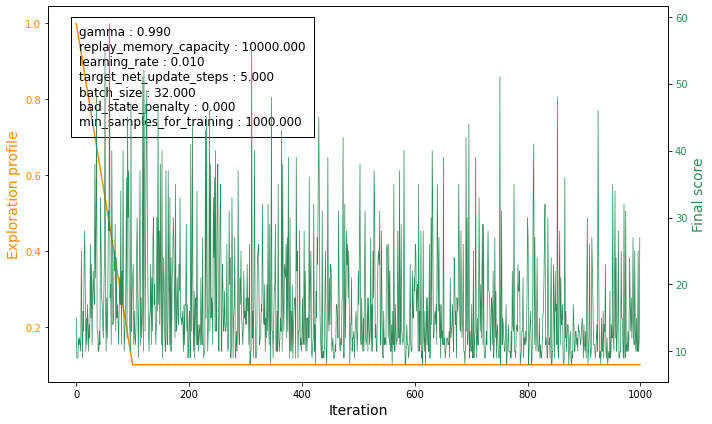

In [45]:
plot_profile_score(lin_expl_prof, training_score_dm, cnn_params)

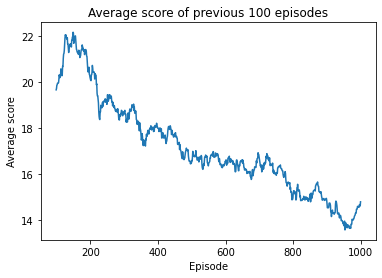

In [46]:
plt.plot(np.arange(99,1000), avg_window(training_score_dm, 100))
plt.xlabel('Episode')
plt.ylabel('Average score')
plt.title('Average score of previous 100 episodes')
plt.show()

In [47]:
torch.save(policy_net_dm.state_dict(), 'pixel_cnn_dm')

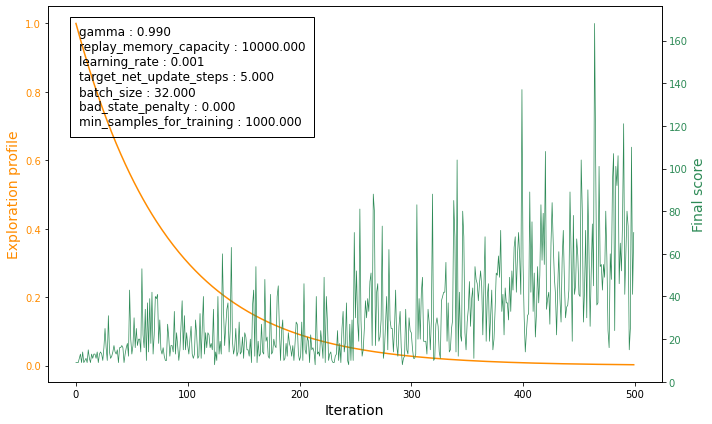

In [ ]:
## TEST TO SAVE cnn_cartpole (IMGSIZE = 240X160)
plot_profile_score( cnn_expl_prof, training_score, cnn_params)

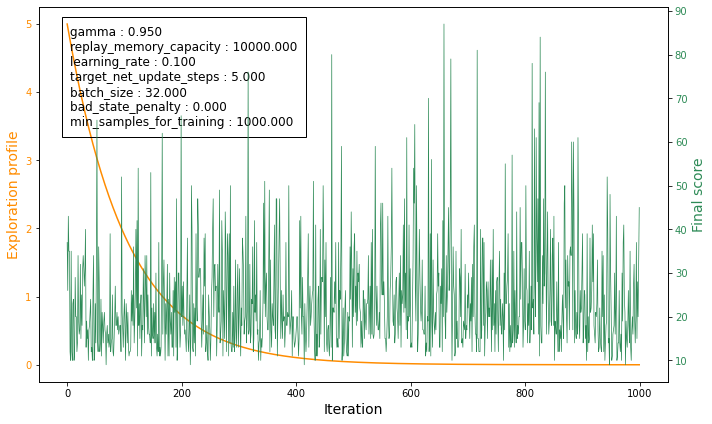

In [ ]:
## FIRST TRIAL, OLD PARAMETERS
plot_profile_score( exploration_profile1, training_score, cnn_params)

## Final test

In [75]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
cnn_policy_net = DQ_CNN(action_space_dim=2)
cnn_policy_net.load_state_dict(torch.load('pix_cartpole_FINAL', map_location=torch.device('cpu')))
cnn_policy_net.to(device)
print(cnn_policy_net)

In [52]:
# Initialize the Gym environment
cnn_env = gym.make('CartPole-v1') 
rnd_seed() # Set a random seed for the environment (reproducible results)
cnn_env.seed(seed)
obs_history_final = deque(maxlen=ml)

cnn_env = wrap_env(cnn_env, video_callable=lambda episode_id: True) # Save a video every episode

obs = np.zeros((4, 100, 150))
scores = []

In [55]:
# Let's try for a total of 10 episodes
for num_episode in range(500): 
    # Reset the environment and get the initial state
    state = cnn_env.reset()
    # Reset the score. The final score will be the total amount of steps before the pole falls
    score = 0
    done = False
    # Go on until the pole falls off or the score reach 490
    while not done:
        for i in range(4):
            obs[i] = get_frame(cnn_env)
    
        # Choose the best action (temperature 0)
        action, q_values = choose_action_epsilon_greedy_pix(cnn_policy_net, from_frame_to_tens(obs), 0.)
        # Apply the action and get the next state, the reward and a flag "done" that is True if the game is ended
        next_state, reward, done, info = cnn_env.step(action)
        # Visually render the environment
        cnn_env.render()
        # Update the final score (+1 for each step)
        score += reward 
        # Set the current state for the next iteration
        state = next_state
        # Check if the episode ended (the pole fell down)
    # Print the final score
    print(f"EPISODE {num_episode + 1} - FINAL SCORE: {score}") 
    scores.append(score)
    
cnn_env.close() 

D:\Anaconda\envs\nndl\lib\site-packages\ipykernel_launcher.py:11: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



In [56]:
print('Score mean:', np.mean(scores))
print('Maximum score:', np.max(scores))

# MountainCar-v0

In [57]:
### Create environment
env = gym.make('MountainCar-v0') # Initialize the Gym environment
rnd_seed() # Set a random seed for the environment (reproducible results)
env.seed(seed)

# Get the shapes of the state space (observation_space) and action space (action_space)
state_space_dim = env.observation_space.shape[0]
action_space_dim = env.action_space.n

print(f"STATE SPACE SIZE: {state_space_dim}")
print(f"ACTION SPACE SIZE: {action_space_dim}")

In [63]:
# Define an example network
net = DQN(state_space_dim, action_space_dim)
print(net)

In [66]:
state = (0, 0)
temperature = 1
chosen_action, q_values = choose_action_softmax(net, state, temperature)

print(f"ACTION: {chosen_action}")
print(f"Q-VALUES: {q_values}")

In [67]:
def train_loop_car(policy_net, target_net, replay_mem, exploration_profile, params, seed=1234439, verbose=False):
    '''
    Function that defines the main training process
    '''

    # Initialize the Gym environment
    env = gym.make('MountainCar-v0') 
    rnd_seed(seed) # Set a random seed for the environment (reproducible results)
    env.seed(seed)
    
    # initialise output list containing all the scores and the car positions
    max_positions = []
    scores = []

    for episode_num, tau in enumerate(tqdm(exploration_profile)):

        # Reset the environment and get the initial state
        state = env.reset()
        # Reset the score
        score = 0
        done = False
        max_position = state[0]

        # Go on until the ending conditions are met 
        # (position 0.5 is reached or episode lasts more than 200)
        while not done:

            # Choose the action following the policy
            action, q_values = choose_action_softmax(policy_net, state, temperature=tau)

            # Apply the action and get the next state, the reward and a flag "done" that is True if the game is ended
            next_state, reward, done, info = env.step(action)
            
            # tweak reward if action is a good one
            # if the car is going right and the action is accelerating left
            # or viceversa
            if next_state[0] - state[0] > 0 and action == 2: reward += 1
            if next_state[0] - state[0] < 0 and action == 0: reward += 1   
            if next_state[0] >=0.5 : reward += 1 # set reward to +1 (and not 0 if the car wins the game
                
            score += reward

            # Tracking maximum reached distance
            if next_state[0] > max_position:
                max_position = next_state[0]
                
            # Apply penalty for bad state
            if done: # if the pole has fallen down 
                reward += params['bad_state_penalty']
                next_state = None

            # Update the replay memory
            replay_mem.push(state, action, next_state, reward)

            # Update the network
            if len(replay_mem) > params['min_samples_for_training']: 
                # Enable the training only if there are enough samples in the replay memory
                # otherwise the training will use the same samples too often
                update_step(policy_net, target_net, replay_mem, optimizer, loss_fn, params)

            # Visually render the environment 
            # comment to speed up the training
            env.render()

            # Set the current state for the next iteration
            state = next_state

        # Update the target network every target_net_update_steps episodes
        if episode_num % params['target_net_update_steps'] == 0:
            if verbose: print('Updating target network...')
            # Copy the weights of the policy network to the target network  
            target_net.load_state_dict(policy_net.state_dict()) 

        # Print the final score
        if verbose: 
            print(f"EPISODE: {episode_num + 1} - Max Position: {max_position} - Score: {score} - Temperature: {tau}") # Print the final score
        # Save score
        max_positions.append(max_position)
        scores.append(score)
    
    env.close()
    
    return policy_net, max_positions, scores
    

In [68]:
ex_prof = expl_profile_softmax(num_iterations=200, initial_value=1.)

## PARAMETERS

car_params = {'gamma': 0.95,                   # gamma parameter for the long term reward
              'replay_memory_capacity': 10000, # Replay memory capacity
              'learning_rate': 0.1,            # Optimizer learning rate
              'target_net_update_steps': 5,    # Number of episodes to wait before updating the target network
              'batch_size': 32,                # Number of samples to take from the replay memory for each update
              'bad_state_penalty': 0,          # Penalty to the reward when we are in a bad state (in this case when the pole falls down) 
              'min_samples_for_training': 1000 # Minimum samples in the replay memory to enable the training
             }

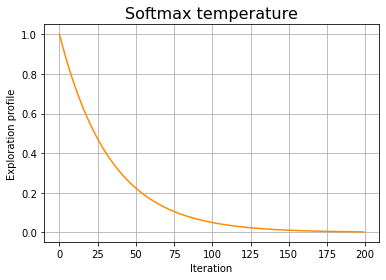

In [69]:
col = 'darkorange'

plt.plot(ex_prof, c=col)
plt.grid()
plt.title('Softmax temperature', fontsize=16)
plt.xlabel('Iteration')
plt.ylabel('Exploration profile')
plt.show()

In [70]:
### Initialization
replay_mem, policy_net, target_net, optimizer, loss_fn = initialize(car_params, action_space_dim=action_space_dim, state_space_dim=state_space_dim)

### Training
policy_net, positions, training_score = train_loop_car(policy_net, target_net, replay_mem, ex_prof, car_params, verbose=True)


  0%|          | 0/200 [00:00<?, ?it/s]

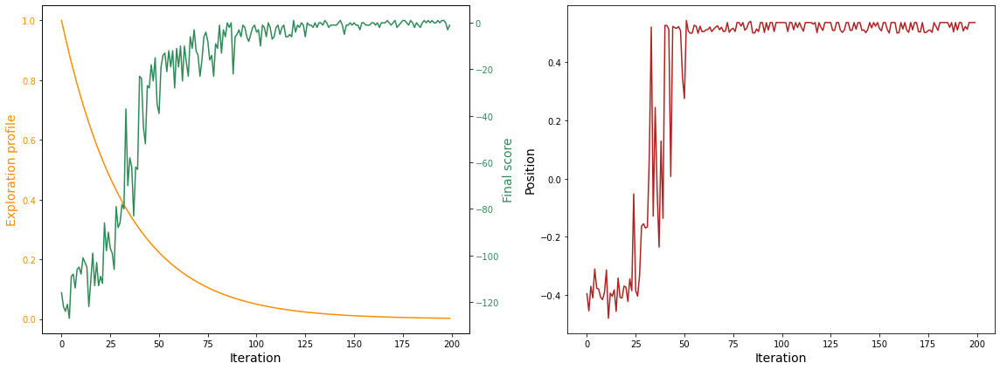

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

col = 'darkorange'
ax[0].set_xlabel('Iteration', fontsize=14)
ax[0].set_ylabel('Exploration profile', c=col, fontsize=14)
ax[0].plot(ex_prof, c=col)
ax[0].tick_params(axis='y', labelcolor=col)

ax2 = ax[0].twinx()  # same x axis, different ys

col = 'seagreen'
ax2.set_ylabel('Final score', c=col, fontsize=14)
ax2.plot(training_score, c=col)
ax2.tick_params(axis='y', labelcolor=col)

ax[1].set_xlabel('Iteration', fontsize=14)
ax[1].set_ylabel('Position', fontsize=14)
ax[1].plot(positions, c='firebrick')

fig.tight_layout()  
plt.show()

In [71]:
torch.save(policy_net.state_dict(), 'mountain_car')

## Final test

In [74]:
# Initialize the Gym environment
env = gym.make('MountainCar-v0') 
rnd_seed() # Set a random seed for the environment (reproducible results)
env.seed(seed)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
net = DQN(state_space_dim, action_space_dim)
net.to(device)

# This is for creating the output video in Colab, not required outside Colab
env = wrap_env(env, video_callable=lambda episode_id: True) # Save a video every episode

# Let's try for a total of 10 episodes
for num_episode in range(10): 
    # Reset the environment and get the initial state
    state = env.reset()
    # Reset the score. The final score will be the total amount of steps before the pole falls
    done = False
    max_position = state[0]
    # Go on until the pole falls off or the score reach 490
    while not done:
        # Choose the best action (temperature 0)
        action, q_values = choose_action_softmax(policy_net, state, temperature=0)
        # Apply the action and get the next state, the reward and a flag "done" that is True if the game is ended
        next_state, reward, done, info = env.step(action)
        # Visually render the environment
        env.render()
        # Update the final score (+1 for each step)
        # Tracking maximum reached distance
        if next_state[0] > max_position:
            max_position = next_state[0]
            
        # Set the current state for the next iteration
        state = next_state
        # Check if the episode ended (the pole fell down)
    # Print the final score
    print(f"EPISODE {num_episode + 1} - Max Position: {max_position}") 
env.close()